In [1]:
def add_event(df, year, event) :
    if year in list(df.index) :
        df.loc[year,'이벤트'] = event

## 사용할 모듈 불러오기

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import bar_chart_race as bcr
import warnings
plt.rc('font', family = "NanumGothic")
warnings.simplefilter(action='ignore')
%matplotlib inline

In [3]:
boardgame_df = pd.read_csv("../data/boardgame_df.csv")
boardgame_df['출시일'] = boardgame_df['출시일'].fillna(-1).astype('int')
boardgame_df['최소나이'] = boardgame_df['최소나이'].fillna(0).astype('int')
boardgame_df = boardgame_df.drop('url', axis=1)
boardgame_df = boardgame_df[boardgame_df['출시일'] != -1]
boardgame_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이
0,Gloomhaven,2017,8.441,8.67,105.98,1,1,4,60,120,3.888553,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",14,NaN
1,Brass: Birmingham,2018,8.434,8.65,247.97,2,2,4,60,120,3.897451,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN
2,Pandemic Legacy: Season 1,2015,8.411,8.57,68.21,3,2,4,60,60,2.832465,"Action Points, Cooperative Game, Hand Manageme...","Environmental, Medical",12,NaN
3,Ark Nova,2021,8.291,8.57,62.99,4,1,4,90,150,3.710414,"End Game Bonuses, Hand Management, Hexagon Gri...","Animals, Economic, Environmental",12,NaN
4,Twilight Imperium: Fourth Edition,2017,8.251,8.64,121.43,5,3,6,240,480,4.293668,"Action Drafting, Area Majority / Influence, Ar...","Civilization, Economic, Exploration, Negotiati...",14,NaN


In [4]:
boardgame_df[boardgame_df['출시일'] == -1]

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이


In [5]:
boardgame_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23632 entries, 0 to 23854
Data columns (total 15 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   이름      23632 non-null  object 
 1   출시일     23632 non-null  int64  
 2   geek평점  23632 non-null  float64
 3   평균평점    23632 non-null  float64
 4   가격      4028 non-null   float64
 5   랭크      23632 non-null  int64  
 6   최소인원    23632 non-null  int64  
 7   최대인원    23632 non-null  int64  
 8   최소게임시간  23632 non-null  int64  
 9   최대게임시간  23632 non-null  int64  
 10  난이도     23632 non-null  float64
 11  진행방식    22017 non-null  object 
 12  종류      21777 non-null  object 
 13  최소나이    23632 non-null  int64  
 14  최대나이    1896 non-null   float64
dtypes: float64(5), int64(7), object(3)
memory usage: 2.9+ MB


In [6]:
boardgame_df[boardgame_df['이름'] == 'Blue Marble']

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이
23195,Blue Marble,1982,5.452,4.55,NaN,23239,2,4,90,90,1.5,Roll / Spin and Move,NaN,6,16.0


In [7]:
boardgame_df[boardgame_df['이름'] == 'Halli Galli']

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이
6714,Halli Galli,1990,5.632,5.79,39.98,6726,2,6,10,10,1.016575,"Pattern Recognition, Player Elimination","Action / Dexterity, Card Game, Childrens Game,...",6,NaN


In [8]:
boardgame_df[boardgame_df['이름'] == 'Jenga']

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이
10008,Jenga,1983,5.561,5.63,11.99,10029,1,8,20,20,1.108781,"Physical Removal, Single Loser Game, Stacking ...","Action / Dexterity, Party Game",5,NaN


In [9]:
boardgame_df[boardgame_df['이름'] == 'Da Vinci Code']

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이
4133,Da Vinci Code,2002,5.793,6.11,NaN,4142,2,4,15,15,1.494505,NaN,NaN,8,NaN


In [10]:
boardgame_df[boardgame_df['이름'] == 'Rummikub']

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이
1705,Rummikub,1977,6.258,6.43,15.97,1708,2,4,60,60,1.725182,"Set Collection, Tile Placement","Abstract Strategy, Card Game, Childrens Game, ...",8,NaN


In [11]:
boardgame_df[boardgame_df['이름'] == 'CATAN']

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이
480,CATAN,1995,6.943,7.11,41.99,482,3,4,60,120,2.30422,"Dice Rolling, Hexagon Grid, Income, Modular Bo...","Economic, Negotiation",8,NaN


In [12]:
boardgame_df[boardgame_df['이름'] == 'CLUE']

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이


# 카테고리별

In [13]:
tmp_list = []
for boardgames in boardgame_df['종류'] :
    tmp_list += str(boardgames).replace('\"','').replace("\'",'').replace('[','').replace(']','').split(', ')

category_list = []
for boardgame in tmp_list :
    if (boardgame not in category_list):
        category_list.append(boardgame)

print(category_list)

['Adventure', 'Exploration', 'Fantasy', 'Fighting', 'Miniatures', 'Economic', 'Industry / Manufacturing', 'Post-Napoleonic', 'Transportation', 'Environmental', 'Medical', 'Animals', 'Civilization', 'Negotiation', 'Political', 'Science Fiction', 'Space Exploration', 'Territory Building', 'Civil War', 'Movies / TV / Radio theme', 'Wargame', 'Novel-based', 'Mythology', 'Card Game', 'Modern Warfare', 'American West', 'Dice', 'Medieval', 'Horror', 'Ancient', 'City Building', 'Nautical', 'Farming', 'Puzzle', 'Educational', 'Collectible Components', 'Travel', 'Religious', 'Comic Book / Strip', 'Spies/Secret Agents', 'Murder/Mystery', 'Pirates', 'Action / Dexterity', 'Mature / Adult', 'Video Game Theme', 'Bluffing', 'Abstract Strategy', 'Renaissance', 'Arabian', 'Prehistoric', 'Deduction', 'Party Game', 'Word Game', 'Trains', 'Racing', 'Aviation / Flight', 'Number', 'World War II', 'Zombies', 'Pike and Shot', 'Real-time', 'World War I', 'Humor', 'Sports', 'Age of Reason', 'Electronic', 'Print 

In [14]:
adventure_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Adventure' in str(x)))]
adventure_df['개수'] = 1
print(adventure_df['출시일'].min())
adventure_df.head()

1908


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
0,Gloomhaven,2017,8.441,8.67,105.98,1,1,4,60,120,3.888553,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",14,NaN,1
6,Gloomhaven: Jaws of the Lion,2020,8.235,8.55,34.99,7,1,4,30,120,3.622762,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",12,NaN,1
8,War of the Ring: Second Edition,2011,8.164,8.53,72.00,9,2,4,150,180,4.195762,"Area Majority / Influence, Area Movement, Camp...","Adventure, Fantasy, Fighting, Novel-based, Ter...",14,NaN,1
17,Nemesis,2018,7.984,8.33,111.35,18,1,5,90,180,3.415116,"Campaign / Battle Card Driven, Cooperative Gam...","Adventure, Horror, Miniatures, Science Fiction",14,NaN,1
25,Clank!: Legacy – Acquisitions Incorporated,2019,7.933,8.60,NaN,26,2,4,90,120,2.739130,"Deck Bag and Pool Building, Delayed Purchase, ...","Adventure, Fantasy, Miniatures",10,NaN,1


In [15]:
exploration_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Exploration' in str(x)))]
exploration_df['개수'] = 1
print(exploration_df['출시일'].min())
exploration_df.head()

1908


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
0,Gloomhaven,2017,8.441,8.67,105.98,1,1,4,60,120,3.888553,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",14,NaN,1
4,Twilight Imperium: Fourth Edition,2017,8.251,8.64,121.43,5,3,6,240,480,4.293668,"Action Drafting, Area Majority / Influence, Ar...","Civilization, Economic, Exploration, Negotiati...",14,NaN,1
5,Terraforming Mars,2016,8.246,8.39,56.98,6,1,5,120,120,3.255590,"Closed Drafting, Contracts, Enclosure, End Gam...","Economic, Environmental, Industry / Manufactur...",12,NaN,1
6,Gloomhaven: Jaws of the Lion,2020,8.235,8.55,34.99,7,1,4,30,120,3.622762,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",12,NaN,1
7,Star Wars: Rebellion,2016,8.166,8.42,95.52,8,2,4,180,240,3.735323,"Area Majority / Influence, Area Movement, Area...","Civil War, Miniatures, Movies / TV / Radio the...",12,NaN,1


In [16]:
fantasy_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Fantasy' in str(x)))]
fantasy_df['개수'] = 1
print(fantasy_df['출시일'].min())
fantasy_df.head()

1968


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
0,Gloomhaven,2017,8.441,8.67,105.98,1,1,4,60,120,3.888553,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",14,NaN,1
6,Gloomhaven: Jaws of the Lion,2020,8.235,8.55,34.99,7,1,4,30,120,3.622762,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",12,NaN,1
8,War of the Ring: Second Edition,2011,8.164,8.53,72.00,9,2,4,150,180,4.195762,"Area Majority / Influence, Area Movement, Camp...","Adventure, Fantasy, Fighting, Novel-based, Ter...",14,NaN,1
9,Spirit Island,2017,8.160,8.37,71.99,10,1,4,90,120,4.055290,"Action Retrieval, Area Majority / Influence, A...","Fantasy, Fighting, Mythology, Territory Building",14,NaN,1
23,Terra Mystica,2012,7.935,8.09,67.75,24,2,5,60,150,3.971986,"End Game Bonuses, Hexagon Grid, Income, Increa...","Civilization, Economic, Fantasy, Territory Bui...",12,NaN,1


In [17]:
fighting_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Fighting' in str(x)))]
fighting_df['개수'] = 1
print(fighting_df['출시일'].min())
fighting_df.head()

1909


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
0,Gloomhaven,2017,8.441,8.67,105.98,1,1,4,60,120,3.888553,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",14,NaN,1
6,Gloomhaven: Jaws of the Lion,2020,8.235,8.55,34.99,7,1,4,30,120,3.622762,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",12,NaN,1
8,War of the Ring: Second Edition,2011,8.164,8.53,72.00,9,2,4,150,180,4.195762,"Area Majority / Influence, Area Movement, Camp...","Adventure, Fantasy, Fighting, Novel-based, Ter...",14,NaN,1
9,Spirit Island,2017,8.160,8.37,71.99,10,1,4,90,120,4.055290,"Action Retrieval, Area Majority / Influence, A...","Fantasy, Fighting, Mythology, Territory Building",14,NaN,1
15,Scythe,2016,8.031,8.18,55.96,16,1,5,90,115,3.435233,"Card Play Conflict Resolution, Contracts, End ...","Economic, Fighting, Science Fiction, Territory...",12,NaN,1


In [18]:
miniatures_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Miniatures' in str(x)))]
miniatures_df['개수'] = 1
print(miniatures_df['출시일'].min())
miniatures_df.head()

1913


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
0,Gloomhaven,2017,8.441,8.67,105.98,1,1,4,60,120,3.888553,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",14,NaN,1
6,Gloomhaven: Jaws of the Lion,2020,8.235,8.55,34.99,7,1,4,30,120,3.622762,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",12,NaN,1
7,Star Wars: Rebellion,2016,8.166,8.42,95.52,8,2,4,180,240,3.735323,"Area Majority / Influence, Area Movement, Area...","Civil War, Miniatures, Movies / TV / Radio the...",12,NaN,1
10,Gaia Project,2017,8.155,8.43,82.01,11,1,4,60,150,4.386473,"End Game Bonuses, Hexagon Grid, Income, Modula...","Civilization, Economic, Miniatures, Science Fi...",14,NaN,1
17,Nemesis,2018,7.984,8.33,111.35,18,1,5,90,180,3.415116,"Campaign / Battle Card Driven, Cooperative Gam...","Adventure, Horror, Miniatures, Science Fiction",14,NaN,1


In [19]:
economic_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Economic' in str(x)))]
economic_df['개수'] = 1
print(economic_df['출시일'].min())
economic_df.head()

1903


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1,Brass: Birmingham,2018,8.434,8.65,247.97,2,2,4,60,120,3.897451,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
3,Ark Nova,2021,8.291,8.57,62.99,4,1,4,90,150,3.710414,"End Game Bonuses, Hand Management, Hexagon Gri...","Animals, Economic, Environmental",12,NaN,1
4,Twilight Imperium: Fourth Edition,2017,8.251,8.64,121.43,5,3,6,240,480,4.293668,"Action Drafting, Area Majority / Influence, Ar...","Civilization, Economic, Exploration, Negotiati...",14,NaN,1
5,Terraforming Mars,2016,8.246,8.39,56.98,6,1,5,120,120,3.255590,"Closed Drafting, Contracts, Enclosure, End Gam...","Economic, Environmental, Industry / Manufactur...",12,NaN,1
10,Gaia Project,2017,8.155,8.43,82.01,11,1,4,60,150,4.386473,"End Game Bonuses, Hexagon Grid, Income, Modula...","Civilization, Economic, Miniatures, Science Fi...",14,NaN,1


In [20]:
industry_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Industry / Manufacturing' in str(x)))]
industry_df['개수'] = 1
print(industry_df['출시일'].min())
industry_df.head()

1960


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1,Brass: Birmingham,2018,8.434,8.65,247.97,2,2,4,60,120,3.897451,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
5,Terraforming Mars,2016,8.246,8.39,56.98,6,1,5,120,120,3.255590,"Closed Drafting, Contracts, Enclosure, End Gam...","Economic, Environmental, Industry / Manufactur...",12,NaN,1
19,Brass: Lancashire,2007,7.967,8.19,66.00,20,2,4,60,120,3.858779,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
21,A Feast for Odin,2016,7.950,8.19,NaN,22,1,4,30,120,3.855204,"Automatic Resource Growth, Dice Rolling, Grid ...","Economic, Farming, Industry / Manufacturing, M...",12,NaN,1
33,Barrage,2019,7.837,8.20,89.99,34,1,4,60,120,4.086250,"Contracts, End Game Bonuses, Income, Network a...","Economic, Environmental, Industry / Manufacturing",14,NaN,1


In [21]:
post_napoleonic_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Post-Napoleonic' in str(x)))]
post_napoleonic_df['개수'] = 1
print(post_napoleonic_df['출시일'].min())
post_napoleonic_df.head()

1824


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1,Brass: Birmingham,2018,8.434,8.65,247.97,2,2,4,60,120,3.897451,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
19,Brass: Lancashire,2007,7.967,8.19,66.00,20,2,4,60,120,3.858779,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
39,Pax Pamir: Second Edition,2019,7.804,8.29,139.95,40,1,5,45,120,3.845401,"Action Points, Area Majority / Influence, Area...","Economic, Educational, Negotiation, Political,...",14,NaN,1
90,Obsession,2018,7.558,8.24,NaN,91,1,4,30,90,3.113725,"Deck Bag and Pool Building, Hand Management, O...",Post-Napoleonic,12,NaN,1
106,Trickerion: Legends of Illusion,2015,7.510,7.96,50.70,107,2,4,60,180,4.246468,"Action Points, Action Queue, Catch the Leader,...",Post-Napoleonic,14,NaN,1


In [22]:
transportation_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Transportation' in str(x)))]
transportation_df['개수'] = 1
print(transportation_df['출시일'].min())
transportation_df.head()

1908


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1,Brass: Birmingham,2018,8.434,8.65,247.97,2,2,4,60,120,3.897451,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
19,Brass: Lancashire,2007,7.967,8.19,66.00,20,2,4,60,120,3.858779,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
91,Keyflower,2012,7.554,7.75,52.49,92,2,6,90,120,3.345078,"Auction/Bidding, Auction: Fixed Placement, Auc...","City Building, Economic, Renaissance, Territor...",12,NaN,1
125,Age of Steam,2002,7.450,7.81,NaN,126,1,6,120,120,3.891641,"Auction/Bidding, Catch the Leader, Connections...","Economic, Trains, Transportation",14,NaN,1
148,Xia: Legends of a Drift System,2014,7.398,7.87,125.00,149,3,5,60,180,3.187151,"Action Points, Dice Rolling, Grid Movement, Ma...","Adventure, Exploration, Fighting, Science Fict...",10,NaN,1


In [23]:
medical_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Medical' in str(x)))]
medical_df['개수'] = 1
print(medical_df['출시일'].min())
medical_df.head()

1965


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
2,Pandemic Legacy: Season 1,2015,8.411,8.57,68.21,3,2,4,60,60,2.832465,"Action Points, Cooperative Game, Hand Manageme...","Environmental, Medical",12,NaN,1
46,Pandemic Legacy: Season 2,2017,7.748,8.06,53.82,47,2,4,60,60,3.256228,"Cooperative Game, Hand Management, Legacy Game...","Environmental, Exploration, Medical, Science F...",12,NaN,1
119,Pandemic: Iberia,2016,7.468,7.90,49.99,120,2,5,45,45,2.565476,"Action Points, Cooperative Game, Hand Manageme...","Medical, Post-Napoleonic, Trains",10,NaN,1
124,Pandemic,2008,7.455,7.56,35.99,125,2,4,45,45,2.404200,"Action Points, Cooperative Game, Hand Manageme...",Medical,10,NaN,1
444,Pandemic: The Cure,2014,6.976,7.26,45.00,446,2,5,30,30,2.059561,"Cooperative Game, Dice Rolling, Hand Managemen...","Dice, Environmental, Medical",8,NaN,1


In [24]:
animals_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Animals' in str(x)))]
animals_df['개수'] = 1
print(animals_df['출시일'].min())
animals_df.head()

1400


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
3,Ark Nova,2021,8.291,8.57,62.99,4,1,4,90,150,3.710414,"End Game Bonuses, Hand Management, Hexagon Gri...","Animals, Economic, Environmental",12,NaN,1
14,Great Western Trail,2016,8.085,8.25,44.95,15,2,4,75,150,3.702259,"Deck Bag and Pool Building, Hand Management, O...","American West, Animals, Economic",12,NaN,1
24,Wingspan,2019,7.934,8.08,38.81,25,1,5,40,70,2.448806,"Contracts, Dice Rolling, End Game Bonuses, Han...","Animals, Card Game, Educational",10,NaN,1
27,Root,2018,7.896,8.09,56.95,28,2,4,60,90,3.770681,"Action Queue, Action Retrieval, Area Majority ...","Animals, Fantasy, Wargame",12,NaN,1
30,Everdell,2018,7.876,8.07,75.00,31,1,4,40,80,2.800810,"Contracts, End Game Bonuses, Hand Management, ...","Animals, Card Game, City Building, Fantasy",10,NaN,1


In [25]:
environmental_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Environmental' in str(x)))]
environmental_df['개수'] = 1
print(environmental_df['출시일'].min())
environmental_df.head()

1959


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
2,Pandemic Legacy: Season 1,2015,8.411,8.57,68.21,3,2,4,60,60,2.832465,"Action Points, Cooperative Game, Hand Manageme...","Environmental, Medical",12,NaN,1
3,Ark Nova,2021,8.291,8.57,62.99,4,1,4,90,150,3.710414,"End Game Bonuses, Hand Management, Hexagon Gri...","Animals, Economic, Environmental",12,NaN,1
5,Terraforming Mars,2016,8.246,8.39,56.98,6,1,5,120,120,3.255590,"Closed Drafting, Contracts, Enclosure, End Gam...","Economic, Environmental, Industry / Manufactur...",12,NaN,1
33,Barrage,2019,7.837,8.20,89.99,34,1,4,60,120,4.086250,"Contracts, End Game Bonuses, Income, Network a...","Economic, Environmental, Industry / Manufacturing",14,NaN,1
46,Pandemic Legacy: Season 2,2017,7.748,8.06,53.82,47,2,4,60,60,3.256228,"Cooperative Game, Hand Management, Legacy Game...","Environmental, Exploration, Medical, Science F...",12,NaN,1


In [26]:
civilization_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Civilization' in str(x)))]
civilization_df['개수'] = 1
print(civilization_df['출시일'].min())
civilization_df.head()

1954


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
4,Twilight Imperium: Fourth Edition,2017,8.251,8.64,121.43,5,3,6,240,480,4.293668,"Action Drafting, Area Majority / Influence, Ar...","Civilization, Economic, Exploration, Negotiati...",14,NaN,1
10,Gaia Project,2017,8.155,8.43,82.01,11,1,4,60,150,4.386473,"End Game Bonuses, Hexagon Grid, Income, Modula...","Civilization, Economic, Miniatures, Science Fi...",14,NaN,1
12,Through the Ages: A New Story of Civilization,2015,8.104,8.33,57.88,13,2,4,120,120,4.425939,"Action Points, Auction/Bidding, Auction: Dutch...","Card Game, Civilization, Economic",14,NaN,1
18,7 Wonders Duel,2015,7.975,8.10,34.97,19,2,2,30,30,2.223710,"Layering, Open Drafting, Set Collection, Sudde...","Ancient, Card Game, City Building, Civilizatio...",10,NaN,1
22,Eclipse: Second Dawn for the Galaxy,2020,7.945,8.54,175.00,23,2,6,60,200,3.602857,"Alliances, Area Majority / Influence, Area Mov...","Civilization, Science Fiction, Space Explorati...",12,NaN,1


In [27]:
negotiation_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Negotiation' in str(x)))]
negotiation_df['개수'] = 1
print(negotiation_df['출시일'].min())
negotiation_df.head()

1935


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
4,Twilight Imperium: Fourth Edition,2017,8.251,8.64,121.43,5,3,6,240,480,4.293668,"Action Drafting, Area Majority / Influence, Ar...","Civilization, Economic, Exploration, Negotiati...",14,NaN,1
39,Pax Pamir: Second Edition,2019,7.804,8.29,139.95,40,1,5,45,120,3.845401,"Action Points, Area Majority / Influence, Area...","Economic, Educational, Negotiation, Political,...",14,NaN,1
103,Twilight Imperium: Third Edition,2005,7.525,7.81,178.95,104,3,6,180,240,4.255309,"Action Points, Area-Impulse, Dice Rolling, Fol...","Civilization, Negotiation, Political, Science ...",14,NaN,1
109,Rising Sun,2018,7.504,7.80,NaN,110,3,5,90,120,3.288364,"Action Drafting, Alliances, Area Majority / In...","Bluffing, Fantasy, Miniatures, Mythology, Nego...",14,NaN,1
168,Cosmic Encounter,2008,7.358,7.53,55.99,169,3,5,60,120,2.582609,"Alliances, Card Play Conflict Resolution, Hand...","Bluffing, Negotiation, Science Fiction, Space ...",12,NaN,1


In [28]:
political_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Political' in str(x)))]
political_df['개수'] = 1
print(political_df['출시일'].min())
political_df.head()

1959


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
4,Twilight Imperium: Fourth Edition,2017,8.251,8.64,121.43,5,3,6,240,480,4.293668,"Action Drafting, Area Majority / Influence, Ar...","Civilization, Economic, Exploration, Negotiati...",14,NaN,1
11,Dune: Imperium,2020,8.126,8.37,52.93,12,1,4,60,120,3.005854,"Card Play Conflict Resolution, Deck Bag and Po...","Movies / TV / Radio theme, Novel-based, Politi...",12,NaN,1
13,Twilight Struggle,2005,8.091,8.26,53.47,14,2,2,120,180,3.601536,"Action/Event, Advantage Token, Area Majority /...","Modern Warfare, Political, Wargame",14,NaN,1
39,Pax Pamir: Second Edition,2019,7.804,8.29,139.95,40,1,5,45,120,3.845401,"Action Points, Area Majority / Influence, Area...","Economic, Educational, Negotiation, Political,...",14,NaN,1
56,Lisboa,2017,7.703,8.20,125.99,57,1,4,60,120,4.580427,"Area Majority / Influence, Hand Management, Op...","City Building, Economic, Industry / Manufactur...",14,NaN,1


In [29]:
sf_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Science Fiction' in str(x)))]
sf_df['개수'] = 1
print(sf_df['출시일'].min())
sf_df.head()

1700


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
4,Twilight Imperium: Fourth Edition,2017,8.251,8.64,121.43,5,3,6,240,480,4.293668,"Action Drafting, Area Majority / Influence, Ar...","Civilization, Economic, Exploration, Negotiati...",14,NaN,1
5,Terraforming Mars,2016,8.246,8.39,56.98,6,1,5,120,120,3.255590,"Closed Drafting, Contracts, Enclosure, End Gam...","Economic, Environmental, Industry / Manufactur...",12,NaN,1
7,Star Wars: Rebellion,2016,8.166,8.42,95.52,8,2,4,180,240,3.735323,"Area Majority / Influence, Area Movement, Area...","Civil War, Miniatures, Movies / TV / Radio the...",12,NaN,1
10,Gaia Project,2017,8.155,8.43,82.01,11,1,4,60,150,4.386473,"End Game Bonuses, Hexagon Grid, Income, Modula...","Civilization, Economic, Miniatures, Science Fi...",14,NaN,1
11,Dune: Imperium,2020,8.126,8.37,52.93,12,1,4,60,120,3.005854,"Card Play Conflict Resolution, Deck Bag and Po...","Movies / TV / Radio theme, Novel-based, Politi...",12,NaN,1


In [30]:
space_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Space Exploration' in str(x)))]
space_df['개수'] = 1
print(space_df['출시일'].min())
space_df.head()

1969


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
5,Terraforming Mars,2016,8.246,8.39,56.98,6,1,5,120,120,3.255590,"Closed Drafting, Contracts, Enclosure, End Gam...","Economic, Environmental, Industry / Manufactur...",12,NaN,1
7,Star Wars: Rebellion,2016,8.166,8.42,95.52,8,2,4,180,240,3.735323,"Area Majority / Influence, Area Movement, Area...","Civil War, Miniatures, Movies / TV / Radio the...",12,NaN,1
10,Gaia Project,2017,8.155,8.43,82.01,11,1,4,60,150,4.386473,"End Game Bonuses, Hexagon Grid, Income, Modula...","Civilization, Economic, Miniatures, Science Fi...",14,NaN,1
22,Eclipse: Second Dawn for the Galaxy,2020,7.945,8.54,175.00,23,2,6,60,200,3.602857,"Alliances, Area Majority / Influence, Area Mov...","Civilization, Science Fiction, Space Explorati...",12,NaN,1
48,On Mars,2020,7.747,8.23,129.99,49,1,4,90,150,4.668929,"Closed Drafting, Contracts, Delayed Purchase, ...","City Building, Economic, Exploration, Science ...",14,NaN,1


In [31]:
territory_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Territory Building' in str(x)))]
territory_df['개수'] = 1
print(territory_df['출시일'].min())
territory_df.head()

1959


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
5,Terraforming Mars,2016,8.246,8.39,56.98,6,1,5,120,120,3.255590,"Closed Drafting, Contracts, Enclosure, End Gam...","Economic, Environmental, Industry / Manufactur...",12,NaN,1
8,War of the Ring: Second Edition,2011,8.164,8.53,72.00,9,2,4,150,180,4.195762,"Area Majority / Influence, Area Movement, Camp...","Adventure, Fantasy, Fighting, Novel-based, Ter...",14,NaN,1
9,Spirit Island,2017,8.160,8.37,71.99,10,1,4,90,120,4.055290,"Action Retrieval, Area Majority / Influence, A...","Fantasy, Fighting, Mythology, Territory Building",14,NaN,1
10,Gaia Project,2017,8.155,8.43,82.01,11,1,4,60,150,4.386473,"End Game Bonuses, Hexagon Grid, Income, Modula...","Civilization, Economic, Miniatures, Science Fi...",14,NaN,1
15,Scythe,2016,8.031,8.18,55.96,16,1,5,90,115,3.435233,"Card Play Conflict Resolution, Contracts, End ...","Economic, Fighting, Science Fiction, Territory...",12,NaN,1


In [32]:
civil_war_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Civil War' in str(x)))]
civil_war_df['개수'] = 1
print(civil_war_df['출시일'].min())
civil_war_df.head()

1958


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
7,Star Wars: Rebellion,2016,8.166,8.42,95.52,8,2,4,180,240,3.735323,"Area Majority / Influence, Area Movement, Area...","Civil War, Miniatures, Movies / TV / Radio the...",12,NaN,1
177,Sekigahara: The Unification of Japan,2011,7.335,8.01,80.00,178,2,2,180,180,2.805085,"Action Points, Card Play Conflict Resolution, ...","Civil War, Pike and Shot, Wargame",12,NaN,1
462,Fire in the Lake,2014,6.958,8.06,65.19,464,1,4,180,180,4.111111,"Area Majority / Influence, Dice Rolling, Simul...","Civil War, Modern Warfare, Political, Vietnam ...",14,NaN,1
486,Freedom: The Underground Railroad,2013,6.939,7.58,80.00,488,1,4,60,120,2.904040,"Cooperative Game, Pick-up and Deliver, Point t...","American Civil War, Economic, Educational, Pol...",12,NaN,1
539,Pax Porfiriana,2012,6.895,7.67,291.00,541,1,6,120,120,3.620690,"Action Points, Finale Ending, Hand Management,...","Card Game, Civil War, Economic, Political, Pos...",14,NaN,1


In [33]:
movie_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Movies / TV / Radio theme' in str(x)))]
movie_df['개수'] = 1
print(movie_df['출시일'].min())
movie_df.head()

1800


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
7,Star Wars: Rebellion,2016,8.166,8.42,95.52,8,2,4,180,240,3.735323,"Area Majority / Influence, Area Movement, Area...","Civil War, Miniatures, Movies / TV / Radio the...",12,NaN,1
11,Dune: Imperium,2020,8.126,8.37,52.93,12,1,4,60,120,3.005854,"Card Play Conflict Resolution, Deck Bag and Po...","Movies / TV / Radio theme, Novel-based, Politi...",12,NaN,1
58,Star Wars: Imperial Assault,2014,7.697,7.98,109.99,59,1,5,60,120,3.301462,"Dice Rolling, Die Icon Resolution, Grid Moveme...","Adventure, Exploration, Fighting, Miniatures, ...",12,NaN,1
92,Battlestar Galactica: The Board Game,2008,7.550,7.73,NaN,93,3,6,120,180,3.248844,"Area Movement, Dice Rolling, Hand Management, ...","Bluffing, Deduction, Movies / TV / Radio theme...",14,NaN,1
138,Legendary Encounters: An Alien Deck Building Game,2014,7.425,7.77,NaN,139,1,5,30,60,2.699134,"Cooperative Game, Deck Bag and Pool Building, ...","Card Game, Fighting, Horror, Movies / TV / Rad...",14,NaN,1


In [34]:
war_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Wargame' in str(x)))]
war_df['개수'] = 1
print(war_df['출시일'].min())
war_df.head()

1803


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
7,Star Wars: Rebellion,2016,8.166,8.42,95.52,8,2,4,180,240,3.735323,"Area Majority / Influence, Area Movement, Area...","Civil War, Miniatures, Movies / TV / Radio the...",12,NaN,1
8,War of the Ring: Second Edition,2011,8.164,8.53,72.00,9,2,4,150,180,4.195762,"Area Majority / Influence, Area Movement, Camp...","Adventure, Fantasy, Fighting, Novel-based, Ter...",14,NaN,1
13,Twilight Struggle,2005,8.091,8.26,53.47,14,2,2,120,180,3.601536,"Action/Event, Advantage Token, Area Majority /...","Modern Warfare, Political, Wargame",14,NaN,1
22,Eclipse: Second Dawn for the Galaxy,2020,7.945,8.54,175.00,23,2,6,60,200,3.602857,"Alliances, Area Majority / Influence, Area Mov...","Civilization, Science Fiction, Space Explorati...",12,NaN,1
27,Root,2018,7.896,8.09,56.95,28,2,4,60,90,3.770681,"Action Queue, Action Retrieval, Area Majority ...","Animals, Fantasy, Wargame",12,NaN,1


In [35]:
novel_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Novel-based' in str(x)))]
novel_df['개수'] = 1
print(novel_df['출시일'].min())
novel_df.head()

1866


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
8,War of the Ring: Second Edition,2011,8.164,8.53,72.00,9,2,4,150,180,4.195762,"Area Majority / Influence, Area Movement, Camp...","Adventure, Fantasy, Fighting, Novel-based, Ter...",14,NaN,1
11,Dune: Imperium,2020,8.126,8.37,52.93,12,1,4,60,120,3.005854,"Card Play Conflict Resolution, Deck Bag and Po...","Movies / TV / Radio theme, Novel-based, Politi...",12,NaN,1
26,Arkham Horror: The Card Game,2016,7.915,8.15,35.96,27,1,2,60,120,3.518400,"Action Points, Area Movement, Communication Li...","Adventure, Card Game, Collectible Components, ...",14,NaN,1
80,Robinson Crusoe: Adventures on the Cursed Island,2012,7.612,7.78,42.50,81,1,4,60,120,3.809705,"Action Queue, Area Movement, Cooperative Game,...","Adventure, Exploration, Fighting, Novel-based,...",12,NaN,1
85,Cthulhu: Death May Die,2019,7.591,8.17,109.11,86,1,5,90,120,2.403846,"Action Points, Cooperative Game, Dice Rolling,...","Fantasy, Fighting, Horror, Miniatures, Novel-b...",10,NaN,1


In [36]:
mythology_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Mythology' in str(x)))]
mythology_df['개수'] = 1
print(mythology_df['출시일'].min())
mythology_df.head()

1974


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
9,Spirit Island,2017,8.160,8.37,71.99,10,1,4,90,120,4.055290,"Action Retrieval, Area Majority / Influence, A...","Fantasy, Fighting, Mythology, Territory Building",14,NaN,1
41,Blood Rage,2015,7.792,7.96,89.99,42,2,4,60,90,2.876543,"Action Points, Area Majority / Influence, Area...","Fantasy, Fighting, Miniatures, Mythology",12,NaN,1
51,Tzolk'in: The Mayan Calendar,2012,7.724,7.88,48.79,52,2,4,90,90,3.673525,"Bias, End Game Bonuses, Turn Order: Claim Acti...","Ancient, Civilization, Economic, Farming, Myth...",12,NaN,1
59,Kingdom Death: Monster,2015,7.696,8.54,NaN,60,1,4,60,180,4.259965,"Cooperative Game, Critical Hits and Failures, ...","Adventure, Fantasy, Horror, Mature / Adult, Mi...",18,NaN,1
75,Five Tribes,2014,7.633,7.78,53.45,76,2,4,40,80,2.848485,"Auction/Bidding, Constrained Bidding, End Game...","Arabian, Fantasy, Mythology",12,NaN,1


In [37]:
card_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Card Game' in str(x)))]
card_df['개수'] = 1
print(card_df['출시일'].min())
card_df.head()

1120


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
12,Through the Ages: A New Story of Civilization,2015,8.104,8.33,57.88,13,2,4,120,120,4.425939,"Action Points, Auction/Bidding, Auction: Dutch...","Card Game, Civilization, Economic",14,NaN,1
18,7 Wonders Duel,2015,7.975,8.10,34.97,19,2,2,30,30,2.223710,"Layering, Open Drafting, Set Collection, Sudde...","Ancient, Card Game, City Building, Civilizatio...",10,NaN,1
24,Wingspan,2019,7.934,8.08,38.81,25,1,5,40,70,2.448806,"Contracts, Dice Rolling, End Game Bonuses, Han...","Animals, Card Game, Educational",10,NaN,1
26,Arkham Horror: The Card Game,2016,7.915,8.15,35.96,27,1,2,60,120,3.518400,"Action Points, Area Movement, Communication Li...","Adventure, Card Game, Collectible Components, ...",14,NaN,1
30,Everdell,2018,7.876,8.07,75.00,31,1,4,40,80,2.800810,"Contracts, End Game Bonuses, Hand Management, ...","Animals, Card Game, City Building, Fantasy",10,NaN,1


In [38]:
modern_warfare_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Modern Warfare' in str(x)))]
modern_warfare_df['개수'] = 1
print(modern_warfare_df['출시일'].min())
modern_warfare_df.head()

1940


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
13,Twilight Struggle,2005,8.091,8.26,53.47,14,2,2,120,180,3.601536,"Action/Event, Advantage Token, Area Majority /...","Modern Warfare, Political, Wargame",14,NaN,1
164,This War of Mine: The Board Game,2017,7.367,7.79,67.98,165,1,6,45,120,3.299270,"Action Points, Cooperative Game, Dice Rolling,...","Adventure, Exploration, Mature / Adult, Modern...",16,NaN,1
462,Fire in the Lake,2014,6.958,8.06,65.19,464,1,4,180,180,4.111111,"Area Majority / Influence, Dice Rolling, Simul...","Civil War, Modern Warfare, Political, Vietnam ...",14,NaN,1
467,"Labyrinth: The War on Terror, 2001 – ?",2010,6.954,7.59,69.21,469,1,2,180,180,3.640167,"Action Points, Action/Event, Area Majority / I...","Modern Warfare, Political, Wargame",16,NaN,1
607,Cuba Libre,2013,6.828,7.69,61.86,609,1,4,180,180,3.581081,"Area Majority / Influence, Area Movement, Dice...","Economic, Modern Warfare, Political, Wargame",16,NaN,1


In [39]:
west_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('American West' in str(x)))]
west_df['개수'] = 1
print(west_df['출시일'].min())
west_df.head()

1861


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
14,Great Western Trail,2016,8.085,8.25,44.95,15,2,4,75,150,3.702259,"Deck Bag and Pool Building, Hand Management, O...","American West, Animals, Economic",12,NaN,1
45,Great Western Trail (Second Edition),2021,7.763,8.47,51.96,46,1,4,75,150,3.705882,"Deck Bag and Pool Building, Hand Management, O...","American West, Animals, Economic",12,NaN,1
250,Lewis & Clark: The Expedition,2013,7.223,7.46,84.99,251,1,5,120,120,3.333791,"Action Retrieval, Deck Bag and Pool Building, ...","American West, Exploration",12,NaN,1
254,Western Legends,2018,7.213,7.62,NaN,255,2,6,60,90,2.827004,"Action Points, Area Movement, Betting and Bluf...","Adventure, American West, Miniatures",12,NaN,1
459,Colt Express,2014,6.961,7.10,32.22,461,2,6,40,40,1.825994,"Action Queue, Action Retrieval, Hand Managemen...","American West, Fighting, Trains",8,NaN,1


In [40]:
dice_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Dice' in str(x)))]
dice_df['개수'] = 1
print(dice_df['출시일'].min())
dice_df.head()

1125


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
16,The Castles of Burgundy,2011,8.005,8.13,39.45,17,2,4,30,90,2.993038,"Dice Rolling, End Game Bonuses, Grid Coverage,...","Dice, Medieval, Territory Building",12,NaN,1
36,Too Many Bones,2017,7.815,8.38,159.95,37,1,4,60,120,3.850254,"Cooperative Game, Deck Bag and Pool Building, ...","Adventure, Dice, Fantasy, Fighting",12,NaN,1
70,Grand Austria Hotel,2015,7.645,7.91,64.99,71,2,4,60,120,3.216833,"Action Drafting, Contracts, Dice Rolling, End ...","Card Game, Dice, Economic",12,NaN,1
81,The Voyages of Marco Polo,2015,7.609,7.81,NaN,82,2,4,40,100,3.188818,"Contracts, Dice Rolling, Point to Point Moveme...","Dice, Economic, Medieval, Travel",12,NaN,1
99,Troyes,2010,7.530,7.73,79.88,100,1,4,90,90,3.462233,"Area Majority / Influence, Dice Rolling, End G...","Dice, Economic, Medieval",12,NaN,1


In [41]:
medieval_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Medieval' in str(x)))]
medieval_df['개수'] = 1
print(medieval_df['출시일'].min())
medieval_df.head()

1700


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
16,The Castles of Burgundy,2011,8.005,8.13,39.45,17,2,4,30,90,2.993038,"Dice Rolling, End Game Bonuses, Grid Coverage,...","Dice, Medieval, Territory Building",12,NaN,1
21,A Feast for Odin,2016,7.950,8.19,NaN,22,1,4,30,120,3.855204,"Automatic Resource Growth, Dice Rolling, Grid ...","Economic, Farming, Industry / Manufacturing, M...",12,NaN,1
29,Orléans,2014,7.879,8.07,52.99,30,2,4,90,90,3.032325,"Contracts, Deck Bag and Pool Building, End Gam...","Medieval, Religious, Travel",12,NaN,1
61,The Quacks of Quedlinburg,2018,7.695,7.84,49.99,62,2,4,45,45,1.947589,"Catch the Leader, Deck Bag and Pool Building, ...",Medieval,8,NaN,1
64,Paladins of the West Kingdom,2019,7.678,8.01,39.68,65,1,4,90,120,3.696646,"End Game Bonuses, Market, Open Drafting, Solo ...",Medieval,14,NaN,1


In [42]:
horror_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Horror' in str(x)))]
horror_df['개수'] = 1
print(horror_df['출시일'].min())
horror_df.head()

1965


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
17,Nemesis,2018,7.984,8.33,111.35,18,1,5,90,180,3.415116,"Campaign / Battle Card Driven, Cooperative Gam...","Adventure, Horror, Miniatures, Science Fiction",14,NaN,1
26,Arkham Horror: The Card Game,2016,7.915,8.15,35.96,27,1,2,60,120,3.518400,"Action Points, Area Movement, Communication Li...","Adventure, Card Game, Collectible Components, ...",14,NaN,1
47,Mansions of Madness: Second Edition,2016,7.748,7.98,72.15,48,1,5,120,180,2.667171,"Area Movement, Cooperative Game, Dice Rolling,...","Adventure, Exploration, Fighting, Horror, Mini...",12,NaN,1
59,Kingdom Death: Monster,2015,7.696,8.54,NaN,60,1,4,60,180,4.259965,"Cooperative Game, Critical Hits and Failures, ...","Adventure, Fantasy, Horror, Mature / Adult, Mi...",18,NaN,1
85,Cthulhu: Death May Die,2019,7.591,8.17,109.11,86,1,5,90,120,2.403846,"Action Points, Cooperative Game, Dice Rolling,...","Fantasy, Fighting, Horror, Miniatures, Novel-b...",10,NaN,1


In [43]:
ancient_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Ancient' in str(x)))]
ancient_df['개수'] = 1
print(ancient_df['출시일'].min())
ancient_df.head()

1850


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
18,7 Wonders Duel,2015,7.975,8.10,34.97,19,2,2,30,30,2.223710,"Layering, Open Drafting, Set Collection, Sudde...","Ancient, Card Game, City Building, Civilizatio...",10,NaN,1
20,Concordia,2013,7.957,8.11,48.43,21,2,5,100,100,3.004170,"Action Retrieval, Advantage Token, Auction: Du...","Ancient, Economic, Nautical",12,NaN,1
51,Tzolk'in: The Mayan Calendar,2012,7.724,7.88,48.79,52,2,4,90,90,3.673525,"Bias, End Game Bonuses, Turn Order: Claim Acti...","Ancient, Civilization, Economic, Farming, Myth...",12,NaN,1
78,Teotihuacan: City of Gods,2018,7.621,7.89,42.29,79,1,4,90,120,3.771795,"Area Movement, Rondel, Set Collection, Solo / ...",Ancient,12,NaN,1
83,7 Wonders,2010,7.602,7.71,59.98,84,2,7,30,30,2.321464,"Closed Drafting, Hand Management, Neighbor Sco...","Ancient, Card Game, City Building, Civilizatio...",10,NaN,1


In [44]:
city_building_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('City Building' in str(x)))]
city_building_df['개수'] = 1
print(city_building_df['출시일'].min())
city_building_df.head()

1962


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
18,7 Wonders Duel,2015,7.975,8.10,34.97,19,2,2,30,30,2.223710,"Layering, Open Drafting, Set Collection, Sudde...","Ancient, Card Game, City Building, Civilizatio...",10,NaN,1
30,Everdell,2018,7.876,8.07,75.00,31,1,4,40,80,2.800810,"Contracts, End Game Bonuses, Hand Management, ...","Animals, Card Game, City Building, Fantasy",10,NaN,1
38,Puerto Rico,2002,7.807,7.94,126.43,39,3,5,90,150,3.273645,"Action Drafting, End Game Bonuses, Follow, Hid...","City Building, Economic, Farming",12,NaN,1
42,Underwater Cities,2018,7.782,8.08,55.35,43,1,4,80,150,3.613445,"End Game Bonuses, Hand Management, Income, Net...","Card Game, City Building, Civilization, Indust...",12,NaN,1
48,On Mars,2020,7.747,8.23,129.99,49,1,4,90,150,4.668929,"Closed Drafting, Contracts, Delayed Purchase, ...","City Building, Economic, Exploration, Science ...",14,NaN,1


In [45]:
nautical_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Nautical' in str(x)))]
nautical_df['개수'] = 1
print(nautical_df['출시일'].min())
nautical_df.head()

1908


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
20,Concordia,2013,7.957,8.11,48.43,21,2,5,100,100,3.004170,"Action Retrieval, Advantage Token, Auction: Du...","Ancient, Economic, Nautical",12,NaN,1
35,The Crew: Mission Deep Sea,2021,7.816,8.28,14.95,36,2,5,20,20,2.045977,"Communication Limits, Cooperative Game, Hand M...","Card Game, Nautical, Science Fiction",10,NaN,1
42,Underwater Cities,2018,7.782,8.08,55.35,43,1,4,80,150,3.613445,"End Game Bonuses, Hand Management, Income, Net...","Card Game, City Building, Civilization, Indust...",12,NaN,1
60,Le Havre,2008,7.695,7.86,174.99,61,1,5,30,150,3.731003,"Automatic Resource Growth, End Game Bonuses, I...","City Building, Economic, Industry / Manufactur...",12,NaN,1
65,Sleeping Gods,2021,7.675,8.38,71.95,66,1,4,60,120,3.231076,"Action Points, Cooperative Game, Events, Hand ...","Adventure, Exploration, Fantasy, Nautical",10,NaN,1


In [46]:
farming_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Farming' in str(x)))]
farming_df['개수'] = 1
print(farming_df['출시일'].min())
farming_df.head()

1943


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
21,A Feast for Odin,2016,7.950,8.19,NaN,22,1,4,30,120,3.855204,"Automatic Resource Growth, Dice Rolling, Grid ...","Economic, Farming, Industry / Manufacturing, M...",12,NaN,1
31,Viticulture Essential Edition,2015,7.871,8.02,48.26,32,1,6,45,90,2.890575,"Contracts, Hand Management, Solo / Solitaire G...","Economic, Farming",12,NaN,1
38,Puerto Rico,2002,7.807,7.94,126.43,39,3,5,90,150,3.273645,"Action Drafting, End Game Bonuses, Follow, Hid...","City Building, Economic, Farming",12,NaN,1
40,Caverna: The Cave Farmers,2013,7.798,7.98,75.99,41,1,7,30,210,3.779384,"Automatic Resource Growth, Increase Value of U...","Animals, Economic, Fantasy, Farming",12,NaN,1
43,Agricola,2007,7.779,7.90,59.69,44,1,5,30,150,3.637022,"Automatic Resource Growth, Closed Drafting, En...","Animals, Economic, Farming",12,NaN,1


In [47]:
puzzle_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Puzzle' in str(x)))]
puzzle_df['개수'] = 1
print(puzzle_df['출시일'].min())
puzzle_df.head()

1930


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
21,A Feast for Odin,2016,7.950,8.19,NaN,22,1,4,30,120,3.855204,"Automatic Resource Growth, Dice Rolling, Grid ...","Economic, Farming, Industry / Manufacturing, M...",12,NaN,1
49,Cascadia,2021,7.745,8.00,39.49,50,1,4,30,45,1.837705,"End Game Bonuses, Hexagon Grid, Open Drafting,...","Animals, Puzzle",8,NaN,1
68,Azul,2017,7.656,7.77,31.99,69,2,4,30,45,1.761232,"End Game Bonuses, Open Drafting, Pattern Build...","Abstract Strategy, Puzzle, Renaissance",8,NaN,1
101,The Search for Planet X,2020,7.527,8.04,33.67,102,1,4,60,75,2.347826,"Action Points, Deduction, End Game Bonuses, So...","Deduction, Puzzle",12,NaN,1
107,Patchwork,2014,7.508,7.61,33.49,108,2,2,15,30,1.611365,"Grid Coverage, Income, Open Drafting, Rondel, ...","Abstract Strategy, Economic, Puzzle",6,NaN,1


In [48]:
educational_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Educational' in str(x)))]
educational_df['개수'] = 1
print(educational_df['출시일'].min())
educational_df.head()

1587


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
24,Wingspan,2019,7.934,8.08,38.81,25,1,5,40,70,2.448806,"Contracts, Dice Rolling, End Game Bonuses, Han...","Animals, Card Game, Educational",10,NaN,1
39,Pax Pamir: Second Edition,2019,7.804,8.29,139.95,40,1,5,45,120,3.845401,"Action Points, Area Majority / Influence, Area...","Economic, Educational, Negotiation, Political,...",14,NaN,1
362,Evolution: Climate,2016,7.072,7.54,53.58,363,2,6,60,60,2.769231,"Action Points, Events, Hand Management, Secret...","Animals, Card Game, Educational, Environmental...",10,NaN,1
472,Oceans,2020,6.953,7.52,48.99,474,2,4,60,90,2.872222,"Hand Management, Hidden Victory Points, Open D...","Animals, Card Game, Educational, Environmental...",10,NaN,1
486,Freedom: The Underground Railroad,2013,6.939,7.58,80.00,488,1,4,60,120,2.904040,"Cooperative Game, Pick-up and Deliver, Point t...","American Civil War, Economic, Educational, Pol...",12,NaN,1


In [49]:
collectible_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Collectible Component' in str(x)))]
collectible_df['개수'] = 1
print(collectible_df['출시일'].min())
collectible_df.head()

1920


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
26,Arkham Horror: The Card Game,2016,7.915,8.15,35.96,27,1,2,60,120,3.518400,"Action Points, Area Movement, Communication Li...","Adventure, Card Game, Collectible Components, ...",14,NaN,1
37,Marvel Champions: The Card Game,2019,7.811,8.16,53.43,38,1,4,45,90,2.906667,"Cooperative Game, Deck Construction, Hand Mana...","Card Game, Collectible Components, Comic Book ...",12,NaN,1
67,Android: Netrunner,2012,7.660,7.88,NaN,68,2,2,45,45,3.399631,"Action Points, Deck Construction, Hand Managem...","Bluffing, Card Game, Collectible Components, S...",12,NaN,1
143,Star Wars: X-Wing Miniatures Game,2012,7.413,7.65,48.98,144,2,2,30,45,2.494303,"Action Queue, Critical Hits and Failures, Dice...","Aviation / Flight, Bluffing, Collectible Compo...",10,NaN,1
146,The Lord of the Rings: The Card Game,2011,7.405,7.66,69.99,147,1,2,30,60,3.196721,"Cooperative Game, Deck Construction, Events, H...","Adventure, Card Game, Collectible Components, ...",12,NaN,1


In [50]:
travel_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Travel' in str(x)))]
travel_df['개수'] = 1
print(travel_df['출시일'].min())
travel_df.head()

1908


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
28,Lost Ruins of Arnak,2020,7.886,8.09,39.99,29,1,4,30,120,2.889662,"Contracts, Deck Bag and Pool Building, Once-Pe...","Adventure, Exploration, Travel",10,NaN,1
29,Orléans,2014,7.879,8.07,52.99,30,2,4,90,90,3.032325,"Contracts, Deck Bag and Pool Building, End Gam...","Medieval, Religious, Travel",12,NaN,1
81,The Voyages of Marco Polo,2015,7.609,7.81,NaN,82,2,4,40,100,3.188818,"Contracts, Dice Rolling, Point to Point Moveme...","Dice, Economic, Medieval, Travel",12,NaN,1
100,Eldritch Horror,2013,7.528,7.76,50.85,101,1,8,120,240,3.322284,"Action Points, Cooperative Game, Dice Rolling,...","Adventure, Fighting, Horror, Novel-based, Travel",14,NaN,1
123,PARKS,2019,7.458,7.72,45.00,124,1,5,30,60,2.142566,"Contracts, End Game Bonuses, Modular Board, So...","Animals, Economic, Environmental, Travel",10,NaN,1


In [51]:
religious_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Religious' in str(x)))]
religious_df['개수'] = 1
print(religious_df['출시일'].min())
religious_df.head()

1500


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
29,Orléans,2014,7.879,8.07,52.99,30,2,4,90,90,3.032325,"Contracts, Deck Bag and Pool Building, End Gam...","Medieval, Religious, Travel",12,NaN,1
173,Ora et Labora,2011,7.348,7.69,NaN,174,1,4,60,180,3.892749,"Increase Value of Unchosen Resources, Modular ...","City Building, Economic, Industry / Manufactur...",12,NaN,1
357,The Pillars of the Earth,2006,7.075,7.27,19.99,358,2,4,90,120,2.816952,"Events, Turn Order: Random, Worker Placement, ...","Economic, Medieval, Novel-based, Religious",12,NaN,1
365,Here I Stand,2006,7.068,7.90,NaN,366,2,6,180,360,4.179337,"Campaign / Battle Card Driven, Dice Rolling, E...","Negotiation, Pike and Shot, Political, Religio...",14,NaN,1
419,Biblios,2007,7.015,7.20,NaN,420,2,4,30,30,1.682927,"Auction/Bidding, Auction: Turn Order Until Pas...","Card Game, Medieval, Religious",8,NaN,1


In [52]:
comic_book_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Comic Book' in str(x)))]
comic_book_df['개수'] = 1
print(comic_book_df['출시일'].min())
comic_book_df.head()

1150


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
37,Marvel Champions: The Card Game,2019,7.811,8.16,53.43,38,1,4,45,90,2.906667,"Cooperative Game, Deck Construction, Hand Mana...","Card Game, Collectible Components, Comic Book ...",12,NaN,1
216,Legendary: A Marvel Deck Building Game,2012,7.279,7.55,64.99,217,1,5,30,60,2.433373,"Deck Bag and Pool Building, Events, Semi-Coope...","Card Game, Comic Book / Strip",10,NaN,1
316,Marvel United,2020,7.123,7.62,19.02,317,1,4,40,40,1.828283,"Cooperative Game, Hand Management, Modular Boa...","Card Game, Comic Book / Strip, Fighting",8,NaN,1
515,Sentinels of the Multiverse,2011,6.913,7.17,NaN,517,2,5,30,60,2.508796,"Cooperative Game, Hand Management, Solo / Soli...","Card Game, Comic Book / Strip, Fighting",10,NaN,1
547,Mind MGMT: The Psychic Espionage “Game.”,2021,6.891,8.07,55.46,549,1,5,45,75,2.881356,"Deduction, Grid Movement, Hidden Movement, Pap...","Comic Book / Strip, Deduction, Fantasy, Scienc...",12,NaN,1


In [53]:
spy_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Spies/Secret Agents' in str(x)))]
spy_df['개수'] = 1
print(spy_df['출시일'].min())
spy_df.head()

1965


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
39,Pax Pamir: Second Edition,2019,7.804,8.29,139.95,40,1,5,45,120,3.845401,"Action Points, Area Majority / Influence, Area...","Economic, Educational, Negotiation, Political,...",14,NaN,1
54,Pandemic Legacy: Season 0,2020,7.719,8.49,66.73,55,2,4,45,60,3.127119,"Action Points, Cooperative Game, Hand Manageme...",Spies/Secret Agents,12,NaN,1
98,Decrypto,2018,7.532,7.79,24.99,99,3,8,15,45,1.793443,"Communication Limits, Targeted Clues, Team-Bas...","Bluffing, Deduction, Party Game, Spies/Secret ...",10,NaN,1
115,Codenames,2015,7.478,7.57,12.99,116,2,8,15,15,1.270644,"Communication Limits, Memory, Push Your Luck, ...","Card Game, Deduction, Party Game, Spies/Secret...",10,NaN,1
130,Sherlock Holmes Consulting Detective: The Tham...,1982,7.440,7.66,59.99,131,1,8,60,120,2.668269,"Cooperative Game, Narrative Choice / Paragraph...","Deduction, Murder/Mystery, Novel-based, Post-N...",14,NaN,1


In [54]:
murder_mystery_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Murder/Mystery' in str(x)))]
murder_mystery_df['개수'] = 1
print(murder_mystery_df['출시일'].min())
murder_mystery_df.head()

1937


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
47,Mansions of Madness: Second Edition,2016,7.748,7.98,72.15,48,1,5,120,180,2.667171,"Area Movement, Cooperative Game, Dice Rolling,...","Adventure, Exploration, Fighting, Horror, Mini...",12,NaN,1
130,Sherlock Holmes Consulting Detective: The Tham...,1982,7.440,7.66,59.99,131,1,8,60,120,2.668269,"Cooperative Game, Narrative Choice / Paragraph...","Deduction, Murder/Mystery, Novel-based, Post-N...",14,NaN,1
214,Detective: A Modern Crime Board Game,2018,7.280,7.73,27.49,215,1,5,120,180,2.742574,"Cooperative Game, Narrative Choice / Paragraph...","Deduction, Murder/Mystery",16,NaN,1
215,MicroMacro: Crime City,2020,7.279,7.59,43.58,216,1,4,15,45,1.114815,"Cooperative Game, Deduction, Scenario / Missio...","Deduction, Murder/Mystery",8,NaN,1
220,Deception: Murder in Hong Kong,2014,7.268,7.47,34.98,221,4,12,20,20,1.586592,"Communication Limits, Deduction, Events, Final...","Bluffing, Deduction, Murder/Mystery, Party Game",12,NaN,1


In [55]:
pirates_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Pirates' in str(x)))]
pirates_df['개수'] = 1
print(pirates_df['출시일'].min())
pirates_df.head()

1908


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
50,Maracaibo,2019,7.745,8.10,60.99,51,1,4,30,120,3.901146,"Contracts, End Game Bonuses, Events, Hand Mana...","Economic, Exploration, Pirates",14,NaN,1
266,Forgotten Waters,2020,7.188,7.91,59.99,267,3,7,120,240,2.119565,"Dice Rolling, Events, Narrative Choice / Parag...","Adventure, Exploration, Fantasy, Nautical, Pir...",12,NaN,1
321,Merchants & Marauders,2010,7.116,7.39,64.99,322,2,4,180,180,3.244338,"Action Points, Area Movement, Bias, Dice Rolli...","Adventure, Fighting, Nautical, Pike and Shot, ...",12,NaN,1
395,Skull King,2013,7.033,7.48,16.99,396,2,8,30,30,1.693642,"Predictive Bid, Trick-taking","Card Game, Nautical, Pirates",8,NaN,1
478,Friday,2011,6.946,7.12,17.99,480,1,1,25,25,2.149165,"Deck Bag and Pool Building, Hand Management, P...","Adventure, Card Game, Fighting, Novel-based, P...",10,NaN,1


In [56]:
action_dexterity_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Action / Dexterity' in str(x)))]
action_dexterity_df['개수'] = 1
print(action_dexterity_df['출시일'].min())
action_dexterity_df.head()

1850


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
55,Crokinole,1876,7.715,7.99,165.00,56,2,4,30,30,1.239502,"Flicking, Team-Based Game",Action / Dexterity,6,NaN,1
251,KLASK,2014,7.223,7.64,59.99,252,2,2,10,10,1.070513,"Real-Time, Score-and-Reset Game","Action / Dexterity, Real-time",6,NaN,1
438,PitchCar,1995,6.986,7.26,NaN,439,2,8,30,30,1.127854,"Flicking, Modular Board, Race","Action / Dexterity, Childrens Game, Party Game...",5,NaN,1
479,Junk Art,2016,6.946,7.38,49.99,481,2,6,30,30,1.215054,"Bingo, Hand Management, I Cut You Choose, Scor...","Action / Dexterity, Party Game",6,NaN,1
641,Escape: The Curse of the Temple,2012,6.797,6.97,NaN,643,1,5,10,10,1.479592,"Cooperative Game, Dice Rolling, Elapsed Real T...","Action / Dexterity, Adventure, Dice, Electroni...",8,NaN,1


In [57]:
mature_adult_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Mature / Adult' in str(x)))]
mature_adult_df['개수'] = 1
print(mature_adult_df['출시일'].min())
mature_adult_df.head()

1962


,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
59,Kingdom Death: Monster,2015,7.696,8.54,NaN,60,1,4,60,180,4.259965,"Cooperative Game, Critical Hits and Failures, ...","Adventure, Fantasy, Horror, Mature / Adult, Mi...",18,NaN,1
86,Tainted Grail: The Fall of Avalon,2019,7.586,8.17,399.99,87,1,4,60,120,3.324257,"Area Movement, Campaign / Battle Card Driven, ...","Adventure, Exploration, Fantasy, Mature / Adul...",14,NaN,1
164,This War of Mine: The Board Game,2017,7.367,7.79,67.98,165,1,6,45,120,3.299270,"Action Points, Cooperative Game, Dice Rolling,...","Adventure, Exploration, Mature / Adult, Modern...",16,NaN,1
298,Monikers,2015,7.141,7.78,24.99,299,4,16,30,60,1.089552,"Acting, Communication Limits, Open Drafting, R...","Card Game, Humor, Mature / Adult, Party Game, ...",12,NaN,1
299,Dead of Winter: The Long Night,2016,7.141,7.56,45.95,300,2,5,60,120,3.359551,"Action Points, Area Movement, Cooperative Game...","Bluffing, Deduction, Horror, Mature / Adult, S...",14,NaN,1


In [58]:
bluffing_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Bluffing' in str(x)))]
bluffing_df['개수'] = 1
bluffing_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
67,Android: Netrunner,2012,7.660,7.88,NaN,68,2,2,45,45,3.399631,"Action Points, Deck Construction, Hand Managem...","Bluffing, Card Game, Collectible Components, S...",12,NaN,1
92,Battlestar Galactica: The Board Game,2008,7.550,7.73,NaN,93,3,6,120,180,3.248844,"Area Movement, Dice Rolling, Hand Management, ...","Bluffing, Deduction, Movies / TV / Radio theme...",14,NaN,1
98,Decrypto,2018,7.532,7.79,24.99,99,3,8,15,45,1.793443,"Communication Limits, Targeted Clues, Team-Bas...","Bluffing, Deduction, Party Game, Spies/Secret ...",10,NaN,1
109,Rising Sun,2018,7.504,7.80,NaN,110,3,5,90,120,3.288364,"Action Drafting, Alliances, Area Majority / In...","Bluffing, Fantasy, Miniatures, Mythology, Nego...",14,NaN,1
122,Forbidden Stars,2015,7.459,7.97,NaN,123,2,4,120,180,3.835294,"Area Majority / Influence, Area Movement, Card...","Bluffing, Fighting, Miniatures, Science Fictio...",14,NaN,1


In [59]:
video_game_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Video Game Theme' in str(x)))]
video_game_df['개수'] = 1
video_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
62,Mechs vs. Minions,2016,7.687,7.99,199.98,63,2,4,60,120,2.430000,"Action Queue, Bias, Cooperative Game, Dice Rol...","Fantasy, Fighting, Miniatures, Video Game Theme",10,NaN,1
164,This War of Mine: The Board Game,2017,7.367,7.79,67.98,165,1,6,45,120,3.299270,"Action Points, Cooperative Game, Dice Rolling,...","Adventure, Exploration, Mature / Adult, Modern...",16,NaN,1
170,Railways of the World,2005,7.356,7.67,149.99,171,2,6,120,120,3.018222,"Action Points, Connections, End Game Bonuses, ...","Trains, Transportation, Video Game Theme",12,NaN,1
226,Hanamikoji,2013,7.265,7.51,NaN,227,2,2,15,15,1.708333,"Area Majority / Influence, Force Commitment, H...","Card Game, Medieval, Video Game Theme",8,NaN,1
273,Age of Empires III: The Age of Discovery,2007,7.177,7.52,229.95,274,2,5,90,120,3.126186,"Area Majority / Influence, Set Collection, Tur...","Civilization, Exploration, Renaissance, Video ...",12,NaN,1


In [60]:
bluffing_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Bluffing' in str(x)))]
bluffing_df['개수'] = 1
bluffing_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
67,Android: Netrunner,2012,7.660,7.88,NaN,68,2,2,45,45,3.399631,"Action Points, Deck Construction, Hand Managem...","Bluffing, Card Game, Collectible Components, S...",12,NaN,1
92,Battlestar Galactica: The Board Game,2008,7.550,7.73,NaN,93,3,6,120,180,3.248844,"Area Movement, Dice Rolling, Hand Management, ...","Bluffing, Deduction, Movies / TV / Radio theme...",14,NaN,1
98,Decrypto,2018,7.532,7.79,24.99,99,3,8,15,45,1.793443,"Communication Limits, Targeted Clues, Team-Bas...","Bluffing, Deduction, Party Game, Spies/Secret ...",10,NaN,1
109,Rising Sun,2018,7.504,7.80,NaN,110,3,5,90,120,3.288364,"Action Drafting, Alliances, Area Majority / In...","Bluffing, Fantasy, Miniatures, Mythology, Nego...",14,NaN,1
122,Forbidden Stars,2015,7.459,7.97,NaN,123,2,4,120,180,3.835294,"Area Majority / Influence, Area Movement, Card...","Bluffing, Fighting, Miniatures, Science Fictio...",14,NaN,1


In [61]:
abstract_strategy_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Abstract Strategy' in str(x)))]
abstract_strategy_df['개수'] = 1
abstract_strategy_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
68,Azul,2017,7.656,7.77,31.99,69,2,4,30,45,1.761232,"End Game Bonuses, Open Drafting, Pattern Build...","Abstract Strategy, Puzzle, Renaissance",8,NaN,1
107,Patchwork,2014,7.508,7.61,33.49,108,2,2,15,30,1.611365,"Grid Coverage, Income, Open Drafting, Rondel, ...","Abstract Strategy, Economic, Puzzle",6,NaN,1
159,Azul: Summer Pavilion,2019,7.379,7.69,NaN,160,2,4,30,45,2.057143,"End Game Bonuses, Open Drafting, Pattern Build...","Abstract Strategy, Puzzle",8,NaN,1
165,War Chest,2018,7.366,7.90,39.98,166,2,4,30,30,2.279570,"Area Majority / Influence, Deck Bag and Pool B...","Abstract Strategy, Medieval, Wargame",10,NaN,1
208,YINSH,2003,7.286,7.70,39.95,209,2,2,30,60,2.671210,"Catch the Leader, Grid Movement, Pattern Building",Abstract Strategy,8,NaN,1


In [62]:
renaissance_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Renaissance' in str(x)))]
renaissance_df['개수'] = 1
renaissance_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
68,Azul,2017,7.656,7.77,31.99,69,2,4,30,45,1.761232,"End Game Bonuses, Open Drafting, Pattern Build...","Abstract Strategy, Puzzle, Renaissance",8,NaN,1
89,El Grande,1995,7.561,7.74,NaN,90,2,5,60,120,3.041532,"Action Drafting, Area Majority / Influence, Ar...","Medieval, Renaissance",12,NaN,1
91,Keyflower,2012,7.554,7.75,52.49,92,2,6,90,120,3.345078,"Auction/Bidding, Auction: Fixed Placement, Auc...","City Building, Economic, Renaissance, Territor...",12,NaN,1
104,Lorenzo il Magnifico,2016,7.525,7.86,NaN,105,2,4,60,120,3.300000,"Dice Rolling, Open Drafting, Worker Placement,...",Renaissance,12,NaN,1
134,Endeavor: Age of Sail,2018,7.431,7.93,121.11,135,2,5,60,90,2.807692,"Area Majority / Influence, Open Drafting, Poin...","Exploration, Nautical, Renaissance",10,NaN,1


In [63]:
arabian_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Arabian' in str(x)))]
arabian_df['개수'] = 1
arabian_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
75,Five Tribes,2014,7.633,7.78,53.45,76,2,4,40,80,2.848485,"Auction/Bidding, Constrained Bidding, End Game...","Arabian, Fantasy, Mythology",12,NaN,1
132,Targi,2012,7.436,7.63,19.95,133,2,2,60,60,2.339901,"End Game Bonuses, Modular Board, Open Drafting...","Arabian, Card Game",10,NaN,1
234,T.I.M.E Stories,2015,7.250,7.43,47.99,235,2,4,90,90,2.594356,"Cooperative Game, Dice Rolling, Move Through D...","Adventure, Arabian, Puzzle, Science Fiction",14,NaN,1
530,Tales of the Arabian Nights,2009,6.901,7.18,NaN,532,1,6,120,120,2.152244,"Dice Rolling, Narrative Choice / Paragraph, Po...","Adventure, Arabian, Exploration, Fantasy, Travel",12,NaN,1
558,Through the Desert,1998,6.881,7.09,NaN,560,2,5,45,45,2.202559,"Chaining, Connections, Enclosure, Hexagon Grid...","Abstract Strategy, Animals, Arabian",8,NaN,1


In [64]:
prehistoric_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Prehistoric' in str(x)))]
prehistoric_df['개수'] = 1
prehistoric_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
84,Dominant Species,2010,7.594,7.82,67.31,85,2,6,120,240,4.038537,"Action Queue, Area Majority / Influence, End G...","Animals, Environmental, Prehistoric",14,NaN,1
139,Stone Age,2008,7.422,7.54,49.99,140,2,4,60,90,2.465855,"Contracts, Dice Rolling, End Game Bonuses, Set...","Dice, Economic, Prehistoric",10,NaN,1
203,Paleo,2020,7.295,7.77,63.99,204,1,4,45,60,2.620301,"Action/Event, Cooperative Game, Memory, Scenar...","Card Game, Exploration, Prehistoric",10,NaN,1
342,Endless Winter: Paleoamericans,2022,7.103,7.92,399.99,343,1,4,60,120,3.195833,"Area Majority / Influence, Deck Bag and Pool B...","Prehistoric, Territory Building",12,NaN,1
362,Evolution: Climate,2016,7.072,7.54,53.58,363,2,6,60,60,2.769231,"Action Points, Events, Hand Management, Secret...","Animals, Card Game, Educational, Environmental...",10,NaN,1


In [65]:
deduction_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Deduction' in str(x)))]
deduction_df['개수'] = 1
deduction_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
92,Battlestar Galactica: The Board Game,2008,7.550,7.73,NaN,93,3,6,120,180,3.248844,"Area Movement, Dice Rolling, Hand Management, ...","Bluffing, Deduction, Movies / TV / Radio theme...",14,NaN,1
98,Decrypto,2018,7.532,7.79,24.99,99,3,8,15,45,1.793443,"Communication Limits, Targeted Clues, Team-Bas...","Bluffing, Deduction, Party Game, Spies/Secret ...",10,NaN,1
101,The Search for Planet X,2020,7.527,8.04,33.67,102,1,4,60,75,2.347826,"Action Points, Deduction, End Game Bonuses, So...","Deduction, Puzzle",12,NaN,1
115,Codenames,2015,7.478,7.57,12.99,116,2,8,15,15,1.270644,"Communication Limits, Memory, Push Your Luck, ...","Card Game, Deduction, Party Game, Spies/Secret...",10,NaN,1
130,Sherlock Holmes Consulting Detective: The Tham...,1982,7.440,7.66,59.99,131,1,8,60,120,2.668269,"Cooperative Game, Narrative Choice / Paragraph...","Deduction, Murder/Mystery, Novel-based, Post-N...",14,NaN,1


In [66]:
party_game_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Party Game' in str(x)))]
party_game_df['개수'] = 1
party_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
98,Decrypto,2018,7.532,7.79,24.99,99,3,8,15,45,1.793443,"Communication Limits, Targeted Clues, Team-Bas...","Bluffing, Deduction, Party Game, Spies/Secret ...",10,NaN,1
115,Codenames,2015,7.478,7.57,12.99,116,2,8,15,15,1.270644,"Communication Limits, Memory, Push Your Luck, ...","Card Game, Deduction, Party Game, Spies/Secret...",10,NaN,1
144,Just One,2018,7.411,7.60,20.49,145,3,7,20,60,1.048593,"Communication Limits, Cooperative Game","Party Game, Word Game",8,NaN,1
217,Secret Hitler,2016,7.277,7.52,40.00,218,5,10,45,45,1.678815,"Hidden Roles, Player Elimination, Team-Based G...","Bluffing, Card Game, Deduction, Humor, Party G...",14,NaN,1
220,Deception: Murder in Hong Kong,2014,7.268,7.47,34.98,221,4,12,20,20,1.586592,"Communication Limits, Deduction, Events, Final...","Bluffing, Deduction, Murder/Mystery, Party Game",12,NaN,1


In [67]:
word_game_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Word Game' in str(x)))]
word_game_df['개수'] = 1
word_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
98,Decrypto,2018,7.532,7.79,24.99,99,3,8,15,45,1.793443,"Communication Limits, Targeted Clues, Team-Bas...","Bluffing, Deduction, Party Game, Spies/Secret ...",10,NaN,1
115,Codenames,2015,7.478,7.57,12.99,116,2,8,15,15,1.270644,"Communication Limits, Memory, Push Your Luck, ...","Card Game, Deduction, Party Game, Spies/Secret...",10,NaN,1
144,Just One,2018,7.411,7.60,20.49,145,3,7,20,60,1.048593,"Communication Limits, Cooperative Game","Party Game, Word Game",8,NaN,1
204,Codenames: Duet,2017,7.291,7.48,21.10,205,2,2,15,30,1.351648,"Communication Limits, Cooperative Game, Push Y...","Card Game, Deduction, Spies/Secret Agents, Wor...",12,NaN,1
451,So Clover!,2021,6.969,7.60,24.99,453,3,6,30,30,1.087500,"Communication Limits, Cooperative Game","Party Game, Word Game",10,NaN,1


In [68]:
trains_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Trains' in str(x)))]
trains_df['개수'] = 1
trains_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
108,Russian Railroads,2013,7.507,7.75,229.99,109,2,4,90,120,3.405797,"End Game Bonuses, Tech Trees / Tech Tracks, Tu...","Industry / Manufacturing, Trains",12,NaN,1
119,Pandemic: Iberia,2016,7.468,7.90,49.99,120,2,5,45,45,2.565476,"Action Points, Cooperative Game, Hand Manageme...","Medical, Post-Napoleonic, Trains",10,NaN,1
125,Age of Steam,2002,7.450,7.81,NaN,126,1,6,120,120,3.891641,"Auction/Bidding, Catch the Leader, Connections...","Economic, Trains, Transportation",14,NaN,1
142,Ticket to Ride: Europe,2005,7.414,7.54,41.68,143,2,5,30,60,1.924614,"Connections, End Game Bonuses, Hand Management...",Trains,8,NaN,1
170,Railways of the World,2005,7.356,7.67,149.99,171,2,6,120,120,3.018222,"Action Points, Connections, End Game Bonuses, ...","Trains, Transportation, Video Game Theme",12,NaN,1


In [69]:
racing_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Racing' in str(x)))]
racing_df['개수'] = 1
racing_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
135,The Quest for El Dorado,2017,7.431,7.64,39.99,136,2,4,30,60,1.925620,"Deck Bag and Pool Building, Delayed Purchase, ...","Adventure, Exploration, Racing",8,NaN,1
213,Heat: Pedal to the Metal,2022,7.281,8.21,NaN,214,1,6,30,60,2.151515,"Hand Management, Race, Simultaneous Action Sel...",Racing,8,NaN,1
230,Flamme Rouge,2016,7.258,7.52,42.26,231,2,4,30,45,1.681013,"Catch the Leader, Hand Management, Modular Boa...","Racing, Sports",8,NaN,1
257,Camel Up (Second Edition),2018,7.207,7.62,NaN,258,3,8,30,45,1.478495,"Betting and Bluffing, Dice Rolling, Roll / Spi...","Animals, Dice, Racing",6,NaN,1
372,Downforce,2017,7.056,7.33,39.95,373,2,6,20,40,1.737069,"Auction/Bidding, Betting and Bluffing, Hand Ma...","Racing, Sports",8,NaN,1


In [70]:
flight_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Aviation / Flight' in str(x)))]
flight_df['개수'] = 1
flight_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
143,Star Wars: X-Wing Miniatures Game,2012,7.413,7.65,48.98,144,2,2,30,45,2.494303,"Action Queue, Critical Hits and Failures, Dice...","Aviation / Flight, Bluffing, Collectible Compo...",10,NaN,1
412,The Manhattan Project,2012,7.020,7.34,NaN,413,2,5,120,120,2.960581,"Action Retrieval, Closed Drafting, Race, Take ...","Aviation / Flight, Economic, Industry / Manufa...",12,NaN,1
513,Airlines Europe,2011,6.917,7.30,199.99,515,2,5,75,75,2.436916,"Investment, Network and Route Building, Open D...","Aviation / Flight, Economic",10,NaN,1
522,Star Wars: X-Wing (Second Edition),2018,6.907,8.10,39.95,524,2,2,30,45,3.087719,"Action Queue, Critical Hits and Failures, Dice...","Aviation / Flight, Bluffing, Collectible Compo...",10,NaN,1
524,Pan Am,2020,6.906,7.57,24.98,526,2,4,60,60,2.452703,"Auction/Bidding, Auction: Fixed Placement, Con...","Aviation / Flight, Economic, Transportation",10,NaN,1


In [71]:
number_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Number' in str(x)))]
number_df['개수'] = 1
number_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
150,That's Pretty Clever!,2018,7.396,7.59,20.99,151,1,4,30,30,1.883721,"Dice Rolling, Highest-Lowest Scoring, Paper-an...","Dice, Number",8,NaN,1
373,Twice as Clever!,2019,7.056,7.46,20.90,374,1,4,30,30,2.326667,"Dice Rolling, Paper-and-Pencil, Re-rolling and...","Dice, Number",10,NaN,1
616,6 nimmt!,1994,6.823,6.95,NaN,618,2,10,45,45,1.199623,"Hand Management, Kill Steal, Score-and-Reset G...","Card Game, Number",8,NaN,1
755,The Shipwreck Arcana,2017,6.724,7.48,NaN,757,2,5,10,30,2.156250,"Communication Limits, Cooperative Game, Deduct...","Card Game, Deduction, Fantasy, Math, Number, P...",10,NaN,1
778,Red7,2014,6.708,6.89,11.65,780,2,4,5,30,1.693512,"Hand Management, Player Elimination, Score-and...","Card Game, Number",8,NaN,1


In [72]:
ww2_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('World War II' in str(x)))]
ww2_df['개수'] = 1
ww2_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
161,Undaunted: Normandy,2019,7.369,7.83,30.81,162,2,2,45,60,2.241228,"Deck Bag and Pool Building, Dice Rolling, Hand...","Wargame, World War II",12,NaN,1
163,Memoir '44,2004,7.367,7.55,41.15,164,2,8,30,60,2.272727,"Area Majority / Influence, Campaign / Battle C...","Miniatures, Wargame, World War II",8,NaN,1
191,Combat Commander: Europe,2006,7.314,7.95,NaN,192,2,2,60,180,3.251064,"Advantage Token, Campaign / Battle Card Driven...","Wargame, World War II",12,NaN,1
401,Advanced Squad Leader,1985,7.027,8.00,37.99,402,2,2,120,480,4.740426,"Critical Hits and Failures, Dice Rolling, Grid...","Wargame, World War II",16,NaN,1
412,The Manhattan Project,2012,7.020,7.34,NaN,413,2,5,120,120,2.960581,"Action Retrieval, Closed Drafting, Race, Take ...","Aviation / Flight, Economic, Industry / Manufa...",12,NaN,1


In [73]:
zombie_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Zombies' in str(x)))]
zombie_df['개수'] = 1
zombie_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
175,Dead of Winter: A Crossroads Game,2014,7.345,7.50,54.43,176,2,5,60,120,3.014475,"Action Points, Area Movement, Dice Rolling, Ha...","Bluffing, Deduction, Horror, Zombies",12,NaN,1
299,Dead of Winter: The Long Night,2016,7.141,7.56,45.95,300,2,5,60,120,3.359551,"Action Points, Area Movement, Cooperative Game...","Bluffing, Deduction, Horror, Mature / Adult, S...",14,NaN,1
483,Zombie Kidz Evolution,2018,6.939,7.69,24.99,485,2,4,5,15,1.371681,"Area Movement, Cooperative Game, Dice Rolling,...","Childrens Game, Horror, Zombies",5,NaN,1
497,Dawn of the Zeds (Third Edition),2016,6.929,8.19,NaN,499,1,5,90,120,3.803150,"Action Points, Campaign / Battle Card Driven, ...","Horror, Zombies",14,NaN,1
592,Zombicide,2012,6.848,7.12,NaN,594,1,6,60,60,2.536070,"Action Points, Cooperative Game, Dice Rolling,...","Fighting, Horror, Miniatures, Zombies",10,NaN,1


In [74]:
pike_and_shot_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Pike and Shot' in str(x)))]
pike_and_shot_df['개수'] = 1
pike_and_shot_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
177,Sekigahara: The Unification of Japan,2011,7.335,8.01,80.00,178,2,2,180,180,2.805085,"Action Points, Card Play Conflict Resolution, ...","Civil War, Pike and Shot, Wargame",12,NaN,1
321,Merchants & Marauders,2010,7.116,7.39,64.99,322,2,4,180,180,3.244338,"Action Points, Area Movement, Bias, Dice Rolli...","Adventure, Fighting, Nautical, Pike and Shot, ...",12,NaN,1
365,Here I Stand,2006,7.068,7.90,NaN,366,2,6,180,360,4.179337,"Campaign / Battle Card Driven, Dice Rolling, E...","Negotiation, Pike and Shot, Political, Religio...",14,NaN,1
610,Pax Renaissance,2016,6.827,8.01,NaN,612,2,4,60,120,4.453704,"Action Points, Auction: Dutch, Increase Value ...","Educational, Pike and Shot, Religious, Renaiss...",14,NaN,1
692,Wallenstein,2002,6.763,7.46,119.99,694,3,5,150,150,3.307190,"Action Points, Action Queue, Area Majority / I...","Economic, Pike and Shot, Territory Building, W...",12,NaN,1


In [75]:
real_time_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Real-time' in str(x)))]
real_time_df['개수'] = 1
real_time_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
185,Captain Sonar,2016,7.323,7.53,113.00,186,2,8,45,60,2.186391,"Grid Movement, Hidden Movement, Line Drawing, ...","Deduction, Fighting, Nautical, Real-time",12,NaN,1
241,Galaxy Trucker,2007,7.240,7.37,94.99,242,2,4,60,60,2.330959,"Dice Rolling, Events, Real-Time, Relative Move...","Real-time, Science Fiction, Space Exploration,...",10,NaN,1
251,KLASK,2014,7.223,7.64,59.99,252,2,2,10,10,1.070513,"Real-Time, Score-and-Reset Game","Action / Dexterity, Real-time",6,NaN,1
276,Space Alert,2008,7.172,7.41,54.34,277,1,5,30,30,2.968944,"Action Queue, Area Movement, Cooperative Game,...","Electronic, Real-time, Science Fiction, Space ...",12,NaN,1
280,Telestrations,2009,7.163,7.39,17.99,281,4,8,30,30,1.071429,"Drawing, Paper-and-Pencil","Humor, Party Game, Real-time",8,NaN,1


In [76]:
ww1_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('World War I' in str(x)))]
ww1_df['개수'] = 1
ww1_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
161,Undaunted: Normandy,2019,7.369,7.83,30.81,162,2,2,45,60,2.241228,"Deck Bag and Pool Building, Dice Rolling, Hand...","Wargame, World War II",12,NaN,1
163,Memoir '44,2004,7.367,7.55,41.15,164,2,8,30,60,2.272727,"Area Majority / Influence, Campaign / Battle C...","Miniatures, Wargame, World War II",8,NaN,1
191,Combat Commander: Europe,2006,7.314,7.95,NaN,192,2,2,60,180,3.251064,"Advantage Token, Campaign / Battle Card Driven...","Wargame, World War II",12,NaN,1
198,Paths of Glory,1999,7.302,8.05,NaN,199,2,2,480,480,3.850453,"Campaign / Battle Card Driven, Dice Rolling, P...","Wargame, World War I",14,NaN,1
401,Advanced Squad Leader,1985,7.027,8.00,37.99,402,2,2,120,480,4.740426,"Critical Hits and Failures, Dice Rolling, Grid...","Wargame, World War II",16,NaN,1


In [77]:
humor_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Humor' in str(x)))]
humor_df['개수'] = 1
humor_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
217,Secret Hitler,2016,7.277,7.52,40.00,218,5,10,45,45,1.678815,"Hidden Roles, Player Elimination, Team-Based G...","Bluffing, Card Game, Deduction, Humor, Party G...",14,NaN,1
259,Dixit: Odyssey,2011,7.199,7.42,27.75,260,3,12,30,30,1.176768,"Storytelling, Targeted Clues, Voting","Card Game, Humor, Party Game",8,NaN,1
267,Dungeon Petz,2011,7.186,7.43,52.27,268,2,4,90,90,3.627338,"Auction/Bidding, Hand Management, Selection Or...","Animals, Fantasy, Humor",12,NaN,1
280,Telestrations,2009,7.163,7.39,17.99,281,4,8,30,30,1.071429,"Drawing, Paper-and-Pencil","Humor, Party Game, Real-time",8,NaN,1
298,Monikers,2015,7.141,7.78,24.99,299,4,16,30,60,1.089552,"Acting, Communication Limits, Open Drafting, R...","Card Game, Humor, Mature / Adult, Party Game, ...",12,NaN,1


In [78]:
sports_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Sports' in str(x)))]
sports_df['개수'] = 1
sports_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
230,Flamme Rouge,2016,7.258,7.52,42.26,231,2,4,30,45,1.681013,"Catch the Leader, Hand Management, Modular Boa...","Racing, Sports",8,NaN,1
353,Blood Bowl: Team Manager – The Card Game,2011,7.079,7.39,NaN,354,2,4,60,120,2.332800,"Area Majority / Influence, Deck Bag and Pool B...","Card Game, Fantasy, Fighting, Sports",12,NaN,1
372,Downforce,2017,7.056,7.33,39.95,373,2,6,20,40,1.737069,"Auction/Bidding, Betting and Bluffing, Hand Ma...","Racing, Sports",8,NaN,1
406,Long Shot: The Dice Game,2022,7.023,7.78,NaN,407,1,8,25,25,1.925926,"Betting and Bluffing, Dice Rolling, End Game B...","Racing, Sports",10,NaN,1
438,PitchCar,1995,6.986,7.26,NaN,439,2,8,30,30,1.127854,"Flicking, Modular Board, Race","Action / Dexterity, Childrens Game, Party Game...",5,NaN,1


In [79]:
age_of_reason_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Age of Reason' in str(x)))]
age_of_reason_df['개수'] = 1
age_of_reason_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
258,Rococo,2013,7.204,7.59,NaN,259,2,5,60,120,3.084507,"Action Retrieval, Area Majority / Influence, D...","Age of Reason, Economic",12,NaN,1
360,Newton,2018,7.072,7.58,51.39,361,1,4,90,90,3.395745,"Action Retrieval, Deck Bag and Pool Building, ...","Age of Reason, Travel",12,NaN,1
366,Saint Petersburg,2004,7.064,7.28,NaN,367,2,4,45,60,2.461756,"Income, Open Drafting, Set Collection","Age of Reason, Card Game, City Building, Economic",10,NaN,1
375,Maria,2009,7.055,7.99,64.99,376,2,3,210,210,3.507353,"Auction/Bidding, Hand Management, Negotiation,...","Age of Reason, Bluffing, Negotiation, Politica...",14,NaN,1
423,A Few Acres of Snow,2011,7.000,7.38,NaN,424,2,2,60,90,3.036585,"Area Majority / Influence, Area Movement, Deck...","Age of Reason, American Indian Wars, Card Game...",12,NaN,1


In [80]:
electronic_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Electronic' in str(x)))]
electronic_df['개수'] = 1
electronic_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
276,Space Alert,2008,7.172,7.41,54.34,277,1,5,30,30,2.968944,"Action Queue, Area Movement, Cooperative Game,...","Electronic, Real-time, Science Fiction, Space ...",12,NaN,1
369,Return to Dark Tower,2022,7.060,8.34,269.99,370,1,4,100,120,2.653846,"Area Movement, Cooperative Game, Events, Push ...","Adventure, Electronic, Fantasy, Fighting",10,NaN,1
641,Escape: The Curse of the Temple,2012,6.797,6.97,NaN,643,1,5,10,10,1.479592,"Cooperative Game, Dice Rolling, Elapsed Real T...","Action / Dexterity, Adventure, Dice, Electroni...",8,NaN,1
1101,Loopin' Louie,1992,6.519,6.75,NaN,1103,2,4,10,10,1.052550,"Player Elimination, Real-Time","Action / Dexterity, Animals, Aviation / Flight...",4,NaN,1
1177,Escape Room: The Game,2016,6.482,6.97,51.00,1179,3,5,60,60,2.280000,"Cooperative Game, Deduction, Elapsed Real Time...","Electronic, Puzzle",12,NaN,1


In [81]:
print_and_play_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Print & Play' in str(x)))]
print_and_play_df['개수'] = 1
print_and_play_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
298,Monikers,2015,7.141,7.78,24.99,299,4,16,30,60,1.089552,"Acting, Communication Limits, Open Drafting, R...","Card Game, Humor, Mature / Adult, Party Game, ...",12,NaN,1
302,Tiny Epic Galaxies,2015,7.137,7.35,25.88,303,1,5,30,45,2.155602,"Contracts, Dice Rolling, End Game Bonuses, Fol...","Dice, Print & Play, Science Fiction, Space Exp...",10,NaN,1
338,The Resistance,2009,7.104,7.24,20.67,339,5,10,30,30,1.598430,"Hidden Roles, Memory, Roles with Asymmetric In...","Bluffing, Card Game, Deduction, Negotiation, P...",12,NaN,1
362,Evolution: Climate,2016,7.072,7.54,53.58,363,2,6,60,60,2.769231,"Action Points, Events, Hand Management, Secret...","Animals, Card Game, Educational, Environmental...",10,NaN,1
508,"Air, Land, & Sea",2019,6.921,7.48,NaN,510,2,2,15,30,1.728395,"Card Play Conflict Resolution, Hand Management","Card Game, Print & Play, Wargame, World War II",8,NaN,1


In [82]:
maze_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Maze' in str(x)))]
maze_df['개수'] = 1
maze_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
303,Burgle Bros.,2015,7.135,7.46,NaN,304,1,4,45,90,2.316176,"Action Points, Cooperative Game, Dice Rolling,...","Exploration, Maze, Spies/Secret Agents",10,NaN,1
518,RoboRally,1994,6.912,7.07,NaN,520,2,8,45,120,2.428325,"Action Queue, Bias, Grid Movement, Lose a Turn...","Maze, Miniatures, Racing, Science Fiction",10,NaN,1
613,Magic Maze,2017,6.825,6.98,NaN,615,1,8,15,15,1.772308,"Communication Limits, Cooperative Game, Elapse...","Exploration, Fantasy, Maze, Real-time",8,NaN,1
735,Sub Terra,2017,6.736,7.38,39.95,737,1,6,60,60,2.138614,"Action Points, Cooperative Game, Dice Rolling,...","Adventure, Exploration, Horror, Maze",8,NaN,1
772,Ricochet Robots,1999,6.713,7.02,NaN,774,1,99,30,30,2.393064,"Grid Movement, Modular Board","Abstract Strategy, Maze, Puzzle, Real-time",10,NaN,1


In [83]:
mafia_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Mafia' in str(x)))]
mafia_df['개수'] = 1
mafia_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
371,The Godfather: Corleone's Empire,2017,7.057,7.54,82.95,372,2,5,60,90,2.630058,"Area Majority / Influence, Auction/Bidding, Ha...","Economic, Mafia, Movies / TV / Radio theme",12,NaN,1
501,Escape Plan,2019,6.927,7.54,107.99,503,1,5,60,120,3.678445,"Area Movement, Enclosure, Hexagon Grid, Modula...","Adventure, Exploration, Mafia",12,NaN,1
836,Ca$h 'n Guns: Second Edition,2014,6.673,6.85,NaN,838,4,8,30,30,1.250720,"Open Drafting, Player Elimination, Simultaneou...","Bluffing, Fighting, Humor, Mafia, Negotiation,...",8,NaN,1
1099,Sons of Anarchy: Men of Mayhem,2014,6.520,7.26,39.99,1101,3,4,90,90,2.561905,"Action Points, Area Majority / Influence, Dice...","Mafia, Movies / TV / Radio theme, Negotiation,...",14,NaN,1
1366,La Cosa Nostra,2014,6.392,7.64,NaN,1368,3,5,90,90,2.639344,"Dice Rolling, Hand Management, Take That, Team...","Bluffing, Card Game, Mafia, Negotiation",16,NaN,1


In [84]:
american_indian_wars_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('American Indian Wars' in str(x)))]
american_indian_wars_df['개수'] = 1
american_indian_wars_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
423,A Few Acres of Snow,2011,7.000,7.38,NaN,424,2,2,60,90,3.036585,"Area Majority / Influence, Area Movement, Deck...","Age of Reason, American Indian Wars, Card Game...",12,NaN,1
469,1775: Rebellion,2013,6.954,7.65,80.00,471,2,4,60,120,2.226054,"Area Majority / Influence, Area Movement, Camp...","Age of Reason, American Indian Wars, American ...",10,NaN,1
1026,Wilderness War,2001,6.561,7.72,61.99,1028,2,2,180,180,3.299107,"Action/Event, Campaign / Battle Card Driven, D...","Age of Reason, American Indian Wars, Wargame",14,NaN,1
1086,Wendake,2017,6.527,7.50,65.00,1088,1,4,60,120,3.589474,"Area Majority / Influence, Area Movement, Hidd...","American Indian Wars, Economic, Farming, Fighting",12,NaN,1
1105,1812: The Invasion of Canada,2012,6.517,7.34,NaN,1107,2,5,90,90,2.185000,"Area Movement, Campaign / Battle Card Driven, ...","American Indian Wars, Educational, Napoleonic,...",10,NaN,1


In [85]:
childrens_game_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Childrens Game' in str(x)))]
childrens_game_df['개수'] = 1
childrens_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
438,PitchCar,1995,6.986,7.26,NaN,439,2,8,30,30,1.127854,"Flicking, Modular Board, Race","Action / Dexterity, Childrens Game, Party Game...",5,NaN,1
483,Zombie Kidz Evolution,2018,6.939,7.69,24.99,485,2,4,5,15,1.371681,"Area Movement, Cooperative Game, Dice Rolling,...","Childrens Game, Horror, Zombies",5,NaN,1
683,My Little Scythe,2017,6.768,7.28,48.88,685,1,6,45,60,2.000000,"Area Majority / Influence, Dice Rolling, Force...","Childrens Game, Exploration, Fantasy",6,NaN,1
741,Rhino Hero: Super Battle,2017,6.733,7.26,34.99,743,2,4,10,20,1.114286,"Dice Rolling, Single Loser Game, Stacking and ...","Action / Dexterity, Animals, Childrens Game",5,NaN,1
768,Perudo,1800,6.716,6.91,26.60,770,2,6,15,30,1.260638,"Betting and Bluffing, Dice Rolling, Player Eli...","Childrens Game, Movies / TV / Radio theme, Par...",8,NaN,1


In [86]:
napoleonic_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Napoleonic' in str(x)))]
napoleonic_df['개수'] = 1
napoleonic_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1,Brass: Birmingham,2018,8.434,8.65,247.97,2,2,4,60,120,3.897451,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
19,Brass: Lancashire,2007,7.967,8.19,66.00,20,2,4,60,120,3.858779,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
39,Pax Pamir: Second Edition,2019,7.804,8.29,139.95,40,1,5,45,120,3.845401,"Action Points, Area Majority / Influence, Area...","Economic, Educational, Negotiation, Political,...",14,NaN,1
90,Obsession,2018,7.558,8.24,NaN,91,1,4,30,90,3.113725,"Deck Bag and Pool Building, Hand Management, O...",Post-Napoleonic,12,NaN,1
106,Trickerion: Legends of Illusion,2015,7.510,7.96,50.70,107,2,4,60,180,4.246468,"Action Points, Action Queue, Catch the Leader,...",Post-Napoleonic,14,NaN,1


In [87]:
vietnam_war_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Vietnam War' in str(x)))]
vietnam_war_df['개수'] = 1
vietnam_war_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
462,Fire in the Lake,2014,6.958,8.06,65.19,464,1,4,180,180,4.111111,"Area Majority / Influence, Dice Rolling, Simul...","Civil War, Modern Warfare, Political, Vietnam ...",14,NaN,1
1430,Fields of Fire,2008,6.362,7.87,NaN,1432,1,1,60,300,4.240664,"Campaign / Battle Card Driven, Modular Board, ...","Korean War, Vietnam War, Wargame, World War II",14,NaN,1
2738,Vietnam 1965-1975,1984,5.991,7.44,NaN,2744,2,2,360,6000,4.307692,"Dice Rolling, Grid Movement, Hexagon Grid, Sec...","Modern Warfare, Vietnam War, Wargame",14,NaN,1
3220,"Downtown: Air War Over Hanoi, 1965-1972",2004,5.909,7.89,NaN,3227,2,2,240,240,4.090000,"Chit-Pull System, Dice Rolling, Events, Grid M...","Aviation / Flight, Modern Warfare, Vietnam War...",14,NaN,1
3379,Phantom Leader,2010,5.885,7.45,NaN,3386,1,1,30,30,2.591549,"Campaign / Battle Card Driven, Dice Rolling, O...","Aviation / Flight, Modern Warfare, Vietnam War...",12,NaN,1


In [88]:
memory_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Memory' in str(x)))]
memory_df['개수'] = 1
memory_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
466,Hanabi,2010,6.955,7.05,8.99,468,2,5,25,25,1.694154,"Communication Limits, Cooperative Game, Hand M...","Card Game, Deduction, Memory",10,NaN,1
632,Whitehall Mystery,2017,6.810,7.56,NaN,634,2,4,45,60,2.108108,"Hidden Movement, Point to Point Movement, Secr...","Bluffing, Deduction, Memory, Murder/Mystery, P...",12,NaN,1
1093,Witness,2014,6.522,7.25,NaN,1095,4,4,15,15,1.500000,"Communication Limits, Cooperative Game, Memory...","Comic Book / Strip, Deduction, Memory, Murder/...",12,NaN,1
1228,The Magic Labyrinth,2009,6.458,6.83,NaN,1230,2,4,20,30,1.227273,"Dice Rolling, Grid Movement, Memory, Network a...","Childrens Game, Fantasy, Maze, Memory",4,NaN,1
1737,Burg Appenzell,2007,6.250,6.85,NaN,1740,2,4,30,30,1.585153,"Action Points, Grid Movement, Map Deformation,...","Animals, Childrens Game, Exploration, Maze, Me...",6,NaN,1


In [89]:
american_revolutionary_war_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('American Revolutionary War' in str(x)))]
american_revolutionary_war_df['개수'] = 1
american_revolutionary_war_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
469,1775: Rebellion,2013,6.954,7.65,80.00,471,2,4,60,120,2.226054,"Area Majority / Influence, Area Movement, Camp...","Age of Reason, American Indian Wars, American ...",10,NaN,1
790,Washington's War,2010,6.700,7.62,NaN,792,2,2,90,90,2.869732,"Area Majority / Influence, Campaign / Battle C...","Age of Reason, American Revolutionary War, War...",12,NaN,1
1216,Liberty or Death: The American Insurrection,2016,6.460,7.81,129.95,1218,1,4,180,360,4.093750,"Area Majority / Influence, Dice Rolling, Simul...","Age of Reason, American Revolutionary War, Pol...",14,NaN,1
1666,Wooden Ships & Iron Men,1974,6.269,7.06,NaN,1669,2,2,60,300,3.110656,"Action Queue, Dice Rolling, Hexagon Grid, Line...","Age of Reason, American Indian Wars, American ...",12,NaN,1
1957,Sails of Glory,2013,6.179,7.53,79.99,1962,2,4,45,45,2.926829,"Action Queue, Player Elimination, Simulation, ...","American Revolutionary War, Miniatures, Napole...",12,NaN,1


In [90]:
american_civil_war_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('American Civil War' in str(x)))]
american_civil_war_df['개수'] = 1
american_civil_war_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
486,Freedom: The Underground Railroad,2013,6.939,7.58,80.00,488,1,4,60,120,2.904040,"Cooperative Game, Pick-up and Deliver, Point t...","American Civil War, Economic, Educational, Pol...",12,NaN,1
1074,Battle Cry,1999,6.531,7.15,182.87,1076,2,2,45,45,2.095012,"Command Cards, Dice Rolling, Hand Management, ...","American Civil War, Wargame",8,NaN,1
1112,For the People,1998,6.515,7.78,NaN,1114,2,2,360,360,3.731405,"Campaign / Battle Card Driven, Dice Rolling, P...","American Civil War, Civil War, Post-Napoleonic...",14,NaN,1
1530,The Civil War 1861-1865,1983,6.320,7.73,NaN,1533,2,2,120,1200,3.803279,"Dice Rolling, Grid Movement, Hexagon Grid, Mov...","American Civil War, Civil War, Post-Napoleonic...",16,NaN,1
1610,A House Divided: War Between the States 1861-65,1981,6.290,7.08,NaN,1613,2,2,240,240,2.631579,"Dice Rolling, Point to Point Movement, Simulation","American Civil War, Wargame",12,NaN,1


In [91]:
math_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Math' in str(x)))]
math_df['개수'] = 1
math_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
664,Leaving Earth,2015,6.783,7.74,NaN,666,1,5,60,180,3.715847,"Pick-up and Deliver, Point to Point Movement, ...","Math, Science Fiction, Space Exploration",14,NaN,1
755,The Shipwreck Arcana,2017,6.724,7.48,NaN,757,2,5,10,30,2.156250,"Communication Limits, Cooperative Game, Deduct...","Card Game, Deduction, Fantasy, Math, Number, P...",10,NaN,1
856,Qwixx,2012,6.661,6.87,8.40,858,2,5,15,15,1.114416,"Bingo, Dice Rolling, Paper-and-Pencil","Dice, Math, Number",8,NaN,1
1131,Turing Machine,2022,6.506,7.98,99.99,1133,1,4,20,20,2.416667,Deduction,"Deduction, Math, Spies/Secret Agents",10,NaN,1
1221,Sentient,2017,6.460,7.21,NaN,1223,2,4,45,60,2.225000,"Area Majority / Influence, Dice Rolling, Open ...","Industry / Manufacturing, Math, Science Fiction",10,NaN,1


In [92]:
trivia_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Trivia' in str(x)))]
trivia_df['개수'] = 1
trivia_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
715,Wits & Wagers,2005,6.749,6.93,49.99,717,3,7,25,25,1.210526,"Betting and Bluffing, Paper-and-Pencil","Bluffing, Party Game, Trivia",8,NaN,1
1030,Fauna,2008,6.560,7.03,NaN,1032,2,6,45,60,1.473913,Betting and Bluffing,"Animals, Educational, Trivia",8,NaN,1
1253,Smart10,2017,6.445,7.51,14.99,1255,2,8,20,120,1.204545,Push Your Luck,Trivia,12,NaN,1
1657,Wits & Wagers Party,2012,6.272,6.91,57.49,1660,4,18,25,25,1.120000,Betting and Bluffing,"Party Game, Trivia",10,NaN,1
1673,Anomia,2010,6.268,6.69,16.20,1676,3,6,30,30,1.046512,"Pattern Recognition, Speed Matching","Party Game, Real-time, Trivia, Word Game",10,NaN,1


In [93]:
music_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Music' in str(x)))]
music_df['개수'] = 1
music_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1132,On Tour,2019,6.505,6.97,44.00,1134,1,8,20,20,1.471429,"Bingo, Dice Rolling, Line Drawing, Network and...","Dice, Music, Number, Travel",8,NaN,1
1176,Lacrimosa,2022,6.484,7.88,67.67,1178,1,4,90,90,3.090000,"Area Majority / Influence, Deck Bag and Pool B...",Music,12,NaN,1
2482,Le Fantôme de l'Opéra,2013,6.045,6.99,NaN,2487,2,2,30,30,2.216216,"Grid Movement, Variable Player Powers","Deduction, Music, Novel-based",8,NaN,1
2667,DropMix,2017,6.005,6.74,99.50,2673,1,6,15,30,1.318182,"Area Majority / Influence, Hand Management, Re...","Card Game, Collectible Components, Electronic,...",6,NaN,1
3500,Opera,2009,5.866,6.59,NaN,3508,2,4,90,90,3.234783,"Auction/Bidding, Commodity Speculation, Set Co...","Age of Reason, Economic, Music, Renaissance",12,NaN,1


In [94]:
korean_war_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Korean War' in str(x)))]
korean_war_df['개수'] = 1
korean_war_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1430,Fields of Fire,2008,6.362,7.87,NaN,1432,1,1,60,300,4.240664,"Campaign / Battle Card Driven, Modular Board, ...","Korean War, Vietnam War, Wargame, World War II",14,NaN,1
3274,The Korean War June 1950-May 1951,1986,5.902,7.63,NaN,3281,1,2,180,960,3.635135,"Dice Rolling, Grid Movement, Hexagon Grid, Sim...","Korean War, Modern Warfare, Wargame",16,NaN,1
3693,Korea: The Forgotten War,2003,5.841,8.09,NaN,3702,2,2,360,360,4.250000,"Dice Rolling, Hexagon Grid, Simulation","Korean War, Modern Warfare, Wargame",14,NaN,1
4737,Fields of Fire 2,2019,5.740,8.23,76.8,4747,1,1,120,120,4.588235,"Campaign / Battle Card Driven, Modular Board, ...","Korean War, Vietnam War, Wargame, World War II",16,NaN,1
5853,The Speed of Heat,1992,5.669,7.52,NaN,5865,2,2,150,150,3.888889,"Dice Rolling, Hexagon Grid, Variable Phase Order","Aviation / Flight, Korean War, Modern Warfare,...",16,NaN,1


In [95]:
book_df = boardgame_df[boardgame_df['종류'].apply(lambda x : ('Book' in str(x)))]
book_df['개수'] = 1
book_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
37,Marvel Champions: The Card Game,2019,7.811,8.16,53.43,38,1,4,45,90,2.906667,"Cooperative Game, Deck Construction, Hand Mana...","Card Game, Collectible Components, Comic Book ...",12,NaN,1
216,Legendary: A Marvel Deck Building Game,2012,7.279,7.55,64.99,217,1,5,30,60,2.433373,"Deck Bag and Pool Building, Events, Semi-Coope...","Card Game, Comic Book / Strip",10,NaN,1
316,Marvel United,2020,7.123,7.62,19.02,317,1,4,40,40,1.828283,"Cooperative Game, Hand Management, Modular Boa...","Card Game, Comic Book / Strip, Fighting",8,NaN,1
515,Sentinels of the Multiverse,2011,6.913,7.17,NaN,517,2,5,30,60,2.508796,"Cooperative Game, Hand Management, Solo / Soli...","Card Game, Comic Book / Strip, Fighting",10,NaN,1
547,Mind MGMT: The Psychic Espionage “Game.”,2021,6.891,8.07,55.46,549,1,5,45,75,2.881356,"Deduction, Grid Movement, Hidden Movement, Pap...","Comic Book / Strip, Deduction, Fantasy, Scienc...",12,NaN,1


In [96]:
boardgame_df['개수'] = 1
df_list = [boardgame_df, card_df, dice_df, book_df, comic_book_df, abstract_strategy_df, childrens_game_df, animals_df
           , bluffing_df, religious_df, deduction_df, party_game_df, educational_df, racing_df, number_df, memory_df
           , medieval_df, math_df, sf_df, movie_df, war_df, napoleonic_df, post_napoleonic_df, ancient_df
           , action_dexterity_df, west_df, music_df, novel_df, sports_df, economic_df, pirates_df
           , travel_df, adventure_df, exploration_df, transportation_df, nautical_df, fighting_df
           , electronic_df, trivia_df, miniatures_df, ww1_df, ww2_df, collectible_df, puzzle_df
           , flight_df, real_time_df, humor_df, word_game_df, negotiation_df, murder_mystery_df, modern_warfare_df
           , farming_df, civilization_df, american_civil_war_df, trains_df, civil_war_df, territory_df, environmental_df
           , political_df, industry_df, city_building_df, mature_adult_df, american_indian_wars_df, horror_df, medical_df
           , spy_df, maze_df, fantasy_df, print_and_play_df
           , space_df, renaissance_df, vietnam_war_df, mafia_df, age_of_reason_df, korean_war_df
           , american_revolutionary_war_df, pike_and_shot_df, mythology_df, zombie_df, prehistoric_df
           , arabian_df, video_game_df]

print(len(df_list))
column_list = ['전체', '카드', '주사위', '책', '만화', '추상전략', '아동', '동물', '블러핑', '종교', '추정', 
       '파티게임', '교육', '레이싱', '숫자', '기억력', '중세', '수학', 'SF', '영화', '전쟁', '나폴레옹',
       '나폴레옹후기', '고대', '순발력', '서부', '음악', '소설', '스포츠', '경제', '해적', '여행',
       '어드벤처', '탐험', '운송', '선박', '전투', '전자기기', '단순', '미니어처', '1차대전', '2차대전',
       '수집', '퍼즐', '비행', '실시간', '유머', '단어게임', '협싱', '살인/미스터리', '현대전', '농사',
       '문명', '남북전쟁', '기차', '내전', '영역건설', '환경', '정치', '산업', '도시건설', '성인', '인디언',
       '공포', '의학', '스파이', '미로', '판타지', '출력', '우주탐사', '르네상스', '베트남 전쟁', '마피아',
       '이성의 시대', '한국전쟁', '미국독립혁명 전쟁', '열병식', '신화', '좀비', '선사', '아라비안',
       '비디오게임']
print(len(column_list))

category_df = pd.concat([df.groupby('출시일')['개수'].count() for df in df_list], axis = 1)
category_df = category_df.fillna(0)
category_df.columns = column_list
category_df = category_df.astype(int).sort_index()
category_df.to_csv("../data/category_df.csv")
category_df = category_df.drop('전체', axis=1)
category_df

82
82


,카드,주사위,책,만화,추상전략,아동,동물,블러핑,종교,추정,...,마피아,이성의 시대,한국전쟁,미국독립혁명 전쟁,열병식,신화,좀비,선사,아라비안,비디오게임
출시일,,,,,,,,,,,,,,,,,,,,,
1120,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1125,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1150,0,0,1,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1300,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1400,0,0,0,0,1,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020,348,115,40,24,59,51,96,40,7,91,...,3,5,0,1,2,30,6,10,2,24
2021,346,126,30,20,65,52,80,24,6,78,...,8,1,2,1,3,26,6,8,3,22
2022,258,97,18,14,47,19,81,26,5,51,...,4,4,0,1,3,23,9,7,3,24


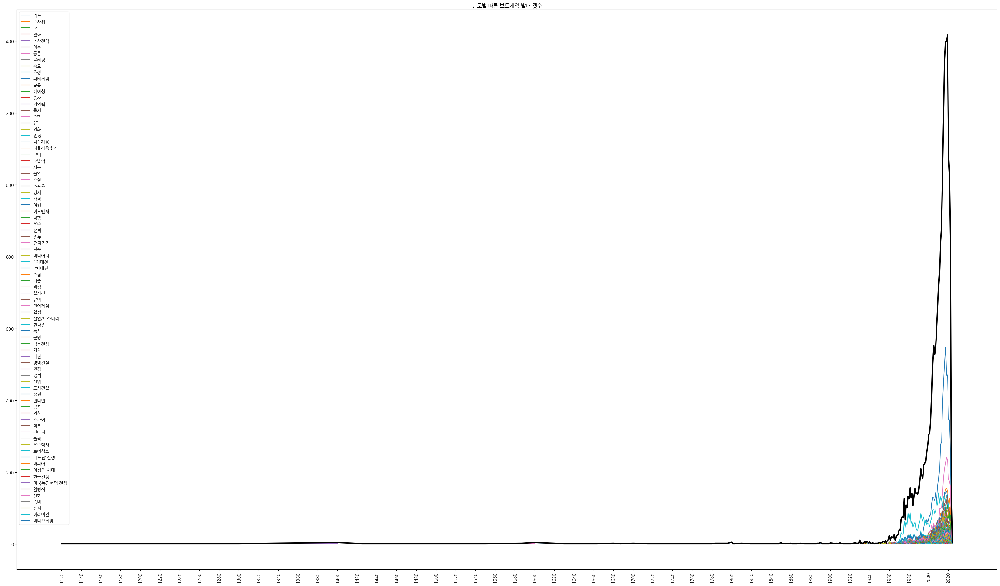

In [97]:
plt.figure(figsize=(40, 23))
plt.title('년도별 따른 보드게임 발매 갯수')
plt.plot(category_df[category_df>0], label = category_df.columns)
plt.legend()
plt.plot(boardgame_df.groupby('출시일').count()['개수'], color = 'black', linewidth = 3)
plt.xticks([20*i for i in range(56,102)], rotation=90)
# plt.xlim([1110, 2024])
plt.show();

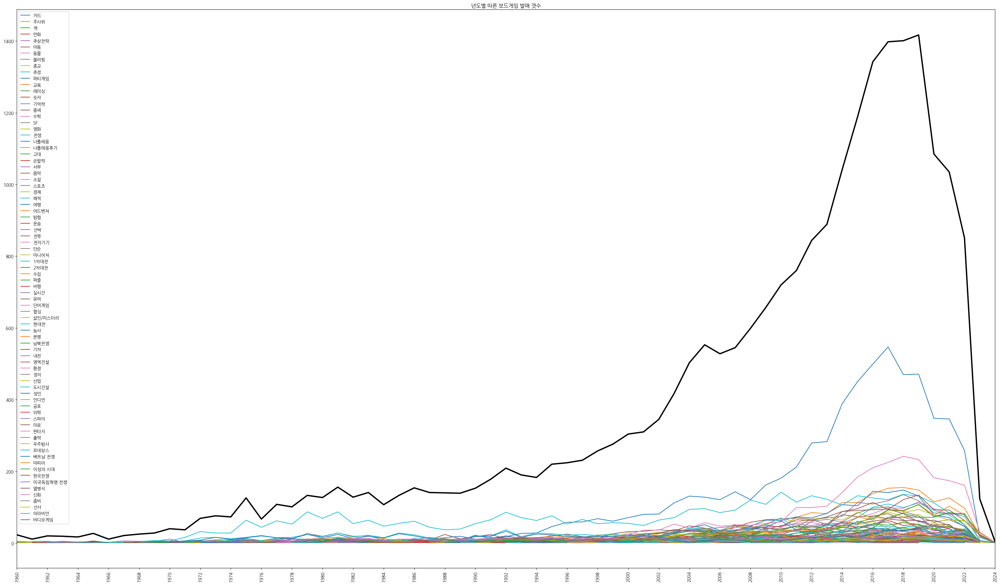

In [98]:
plt.figure(figsize=(40, 23))
plt.title('년도별 따른 보드게임 발매 갯수')
plt.plot(category_df[category_df>0], label = category_df.columns)
plt.legend()
plt.plot(boardgame_df.groupby('출시일').count()['개수'], color = 'black', linewidth = 3)
plt.xticks([2*i for i in range(560,1020)], rotation=90)
plt.xlim([1960, 2024])
plt.show();

In [99]:
category_df['전체'] = category_df.sum(axis=1)
category_frac_df = category_df / category_df['전체'].values.reshape(-1,1)
category_frac_df = category_frac_df.drop('전체', axis=1)
category_frac_df

,카드,주사위,책,만화,추상전략,아동,동물,블러핑,종교,추정,...,마피아,이성의 시대,한국전쟁,미국독립혁명 전쟁,열병식,신화,좀비,선사,아라비안,비디오게임
출시일,,,,,,,,,,,,,,,,,,,,,
1120,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1125,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1150,0.000000,0.000000,0.333333,0.333333,0.333333,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1300,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1400,0.000000,0.000000,0.000000,0.000000,0.333333,0.333333,0.333333,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020,0.120582,0.039848,0.013860,0.008316,0.020444,0.017672,0.033264,0.013860,0.002426,0.031532,...,0.001040,0.001733,0.000000,0.000347,0.000693,0.010395,0.002079,0.003465,0.000693,0.008316
2021,0.124775,0.045438,0.010819,0.007212,0.023440,0.018752,0.028850,0.008655,0.002164,0.028128,...,0.002885,0.000361,0.000721,0.000361,0.001082,0.009376,0.002164,0.002885,0.001082,0.007934
2022,0.114514,0.043054,0.007989,0.006214,0.020861,0.008433,0.035952,0.011540,0.002219,0.022636,...,0.001775,0.001775,0.000000,0.000444,0.001332,0.010209,0.003995,0.003107,0.001332,0.010652


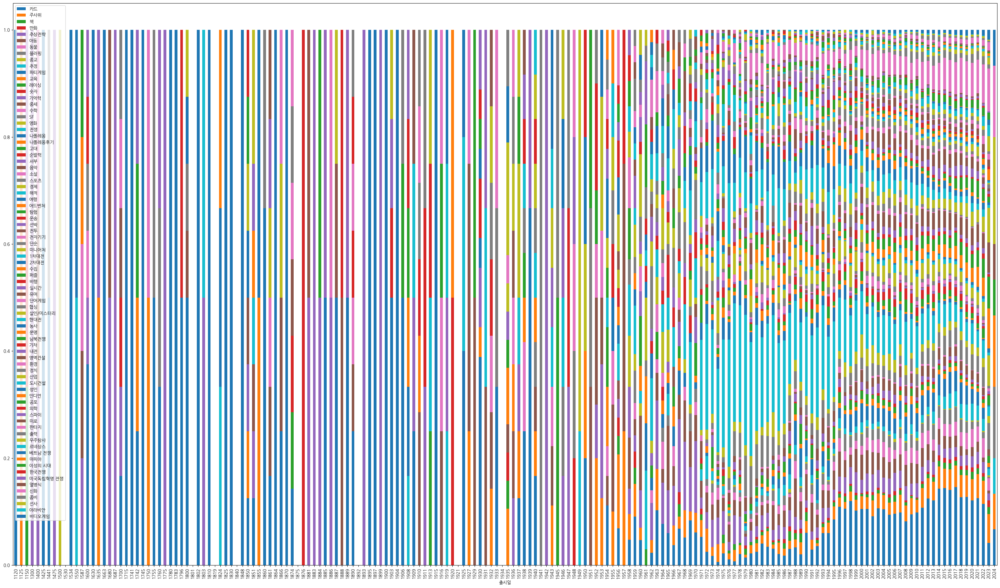

In [100]:
category_frac_df.plot(kind='bar', stacked = True, figsize=(40, 23))
plt.legend()
# plt.xlim([1110, 2024])
plt.show();

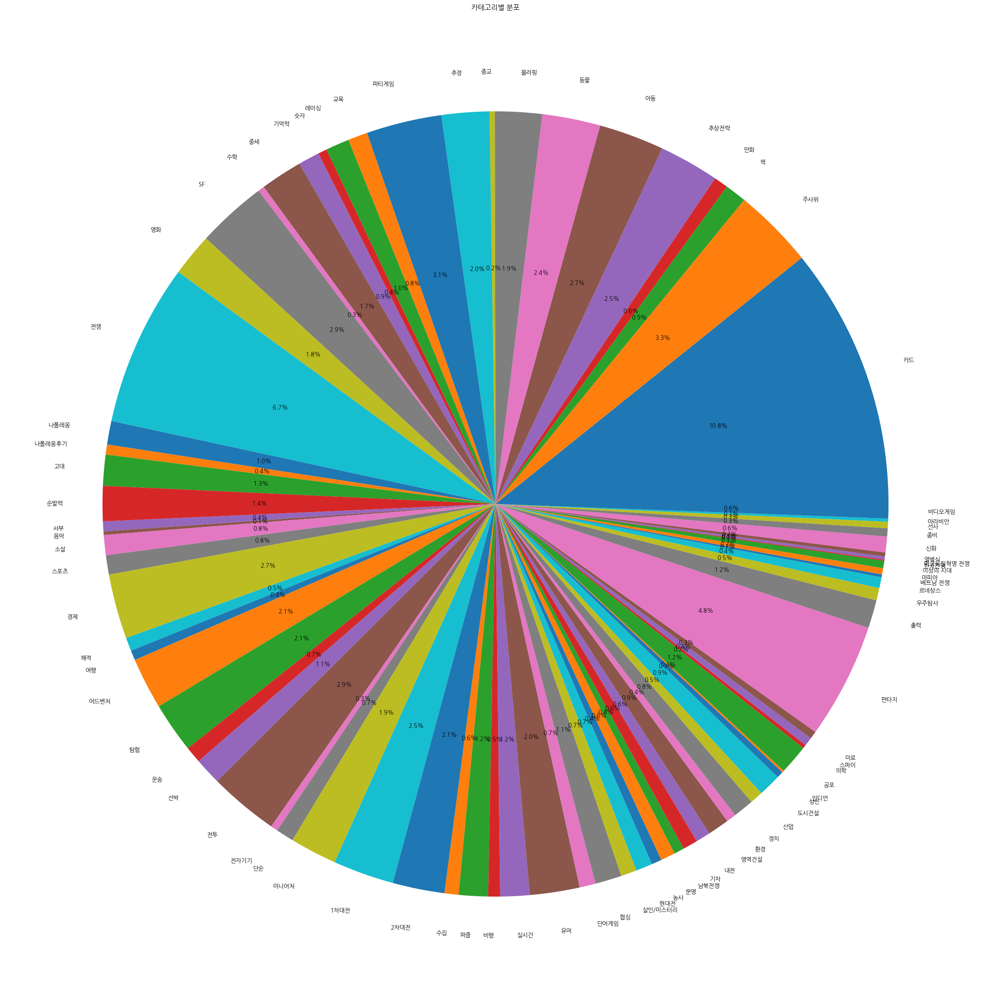

In [101]:
# 파이차트
plt.figure(figsize=(60,30))
plt.title("카테고리별 분포")
plt.pie(category_df.drop('전체', axis=1).sum(), labels=category_df.drop('전체', axis=1).columns, autopct='%.1f%%')
plt.show()

In [102]:
first_df = pd.concat([df[df['출시일']==df['출시일'].min()].drop_duplicates(['출시일']) for df in df_list],axis = 0)
first_df.index = column_list
first_df = first_df.sort_values('출시일')
first_df.to_csv("../data/category_first_df.csv")
first_df

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
전체,Tien Gow (Sky Nine),1120,5.523,7.19,NaN,15082,4,4,0,0,1.500000,"Betting and Bluffing, Hand Management, Trick-t...",Card Game,8,8.0,1
카드,Tien Gow (Sky Nine),1120,5.523,7.19,NaN,15082,4,4,0,0,1.500000,"Betting and Bluffing, Hand Management, Trick-t...",Card Game,8,8.0,1
주사위,Craps,1125,5.423,5.01,NaN,23549,1,16,20,60,1.804878,"Betting and Bluffing, Dice Rolling",Dice,10,NaN,1
책,Checkers,1150,4.969,4.90,NaN,23875,2,2,30,30,1.738916,"Grid Movement, Pattern Movement, Square Grid, ...","Abstract Strategy, Comic Book / Strip",6,NaN,1
만화,Checkers,1150,4.969,4.90,NaN,23875,2,2,30,30,1.738916,"Grid Movement, Pattern Movement, Square Grid, ...","Abstract Strategy, Comic Book / Strip",6,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
신화,Treasure of the Pharaohs,1974,5.511,6.36,NaN,17595,2,6,45,45,1.666667,Roll / Spin and Move,"Ancient, Childrens Game, Maze, Mythology",0,NaN,1
좀비,Dawn of the Dead,1978,5.555,6.04,NaN,10594,1,4,90,90,2.100000,"Dice Rolling, Grid Movement, Line of Sight, Mo...","Horror, Movies / TV / Radio theme, Print & Pla...",16,NaN,1
선사,Sticks & Stones,1978,5.537,6.03,NaN,12673,1,2,45,45,1.750000,"Dice Rolling, Hexagon Grid","Prehistoric, Wargame",16,NaN,1
아라비안,Across Suez: The Battle of the Chinese Farm Oc...,1980,5.557,6.23,NaN,10416,2,2,120,120,2.000000,"Dice Rolling, Hexagon Grid, Simulation","Arabian, Modern Warfare, Wargame",16,NaN,1


In [103]:
# pd.set_option('display.max_columns', None)
category_most_df = category_df[category_df == category_df.max(axis=0)].drop_duplicates()[1:]
category_most_df.to_csv("../data/category_most_df.csv")
category_most_df

,카드,주사위,책,만화,추상전략,아동,동물,블러핑,종교,추정,...,이성의 시대,한국전쟁,미국독립혁명 전쟁,열병식,신화,좀비,선사,아라비안,비디오게임,전체
출시일,,,,,,,,,,,,,,,,,,,,,
1974,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1995,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0,NaN,...,NaN,NaN,NaN,7.0,NaN,NaN,NaN,NaN,NaN,NaN
2012,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,25.0,NaN,7.0,NaN,NaN
2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016,NaN,NaN,NaN,NaN,76.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,37.0,NaN,NaN,NaN,NaN,NaN


In [104]:
# pd.set_option('display.max_rows', None)

most_years = [2017, 2018, 2020, 2019, 2016, 2017, 2019, 2017, 2010, 2019, 2018, 2017, 2016, 2016, 2017, 2017, 2017, 2018, 2018, 2010, 2016, 2016, 2016, 2017, 2017, 2019, 2018, 2017,2017, 2015, 2019, 2019, 2019, 2019, 2016, 2019, 2005, 2005, 2019, 2010, 2010, 1995, 2021, 2012, 2020, 2017, 2016, 2020, 2021, 2018, 2016, 2019, 2013, 2019, 2013, 2019, 2022, 2016, 2013, 2019, 2016, 2013, 2018, 2017, 2017, 2017, 2018, 2017, 2017, 2013, 2020, 2018, 2017, 1974, 2017, 2010, 2016, 2014, 2018, 2014, 2019]
most_list = []

for i in range(len(most_years)) :
    most_df = df_list[i][df_list[i]['출시일'] == most_years[i]].head(1)
    most_df['대표 종류'] = column_list[i]
    most_list.append(most_df)
    
pd.concat(most_list)

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수,대표 종류
0,Gloomhaven,2017,8.441,8.67,105.98,1,1,4,60,120,3.888553,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",14,NaN,1,전체
30,Everdell,2018,7.876,8.07,75.00,31,1,4,40,80,2.800810,"Contracts, End Game Bonuses, Hand Management, ...","Animals, Card Game, City Building, Fantasy",10,NaN,1,카드
200,Under Falling Skies,2020,7.301,7.75,28.48,201,1,1,20,40,2.417910,"Dice Rolling, Modular Board, Once-Per-Game Abi...","Dice, Science Fiction",10,NaN,1,주사위
37,Marvel Champions: The Card Game,2019,7.811,8.16,53.43,38,1,4,45,90,2.906667,"Cooperative Game, Deck Construction, Hand Mana...","Card Game, Collectible Components, Comic Book ...",12,NaN,1,책
1878,Teenage Mutant Ninja Turtles: Shadows of the Past,2016,6.202,7.41,159.98,1882,2,5,60,90,2.735294,"Dice Rolling, Grid Movement, Hand Management, ...","Comic Book / Strip, Fighting, Miniatures",10,NaN,1,만화
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
610,Pax Renaissance,2016,6.827,8.01,NaN,612,2,4,60,120,4.453704,"Action Points, Auction: Dutch, Increase Value ...","Educational, Pike and Shot, Religious, Renaiss...",14,NaN,1,열병식
75,Five Tribes,2014,7.633,7.78,53.45,76,2,4,40,80,2.848485,"Auction/Bidding, Constrained Bidding, End Game...","Arabian, Fantasy, Mythology",12,NaN,1,신화
483,Zombie Kidz Evolution,2018,6.939,7.69,24.99,485,2,4,5,15,1.371681,"Area Movement, Cooperative Game, Dice Rolling,...","Childrens Game, Horror, Zombies",5,NaN,1,좀비
568,Evolution,2014,6.869,7.08,28.99,570,2,6,60,60,2.432759,"Action Points, Hand Management, Push Your Luck...","Animals, Card Game, Educational, Environmental...",10,NaN,1,선사


## 시대별 비교

In [105]:
column_list = ['전체', '카드', '주사위', '책', '만화', '추상전략', '아동', '동물', '블러핑', '종교', '추정', 
       '파티게임', '교육', '레이싱', '숫자', '기억력', '중세', '수학', 'SF', '영화', '전쟁', '나폴레옹',
       '나폴레옹후기', '고대', '순발력', '서부', '음악', '소설', '스포츠', '경제', '해적', '여행',
       '어드벤처', '탐험', '운송', '선박', '전투', '전자기기', '단순', '미니어처', '1차대전', '2차대전',
       '수집', '퍼즐', '비행', '실시간', '유머', '단어게임', '협싱', '살인/미스터리', '현대전', '농사',
       '문명', '남북전쟁', '기차', '내전', '영역건설', '환경', '정치', '산업', '도시건설', '성인', '인디언',
       '공포', '의학', '스파이', '미로', '판타지', '출력', '우주탐사', '르네상스', '베트남 전쟁', '마피아',
       '이성의 시대', '한국전쟁', '미국독립혁명 전쟁', '열병식', '신화', '좀비', '선사', '아라비안',
       '비디오게임']
time_column_list = ['선사', '고대', '중세', '르네상스', '나폴레옹', '나폴레옹후기', '열병식', '인디언', '서부', '미국독립혁명 전쟁', '남북전쟁', '1차대전', '2차대전', '스파이', '마피아', '베트남 전쟁', '한국전쟁', 'SF', '우주탐사']
time_df = category_df[time_column_list]

time_df['전체'] = time_df.sum(axis=1)
time_frac_df = time_df / time_df['전체'].values.reshape(-1,1)
time_frac_df = time_frac_df.drop('전체', axis=1)
time_df = time_df.drop('전체', axis=1)
time_frac_df

,선사,고대,중세,르네상스,나폴레옹,나폴레옹후기,열병식,인디언,서부,미국독립혁명 전쟁,남북전쟁,1차대전,2차대전,스파이,마피아,베트남 전쟁,한국전쟁,SF,우주탐사
출시일,,,,,,,,,,,,,,,,,,,
1120,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1125,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1150,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020,0.027701,0.074792,0.135734,0.033241,0.049861,0.024931,0.005540,0.005540,0.036011,0.002770,0.011080,0.127424,0.105263,0.022161,0.008310,0.013850,0.000000,0.232687,0.083102
2021,0.026403,0.085809,0.148515,0.036304,0.033003,0.013201,0.009901,0.003300,0.036304,0.003300,0.006601,0.102310,0.085809,0.039604,0.026403,0.000000,0.006601,0.273927,0.062706
2022,0.023891,0.136519,0.105802,0.034130,0.023891,0.013652,0.010239,0.003413,0.027304,0.003413,0.013652,0.105802,0.095563,0.034130,0.013652,0.006826,0.000000,0.279863,0.068259


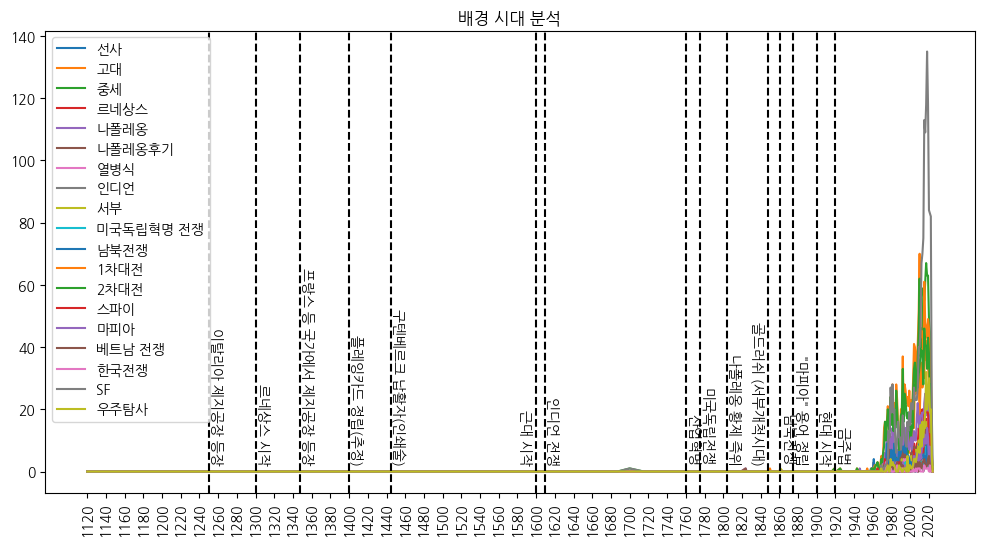

In [106]:
plt.figure(figsize=(12, 6))
plt.title('배경 시대 분석')
plt.plot(time_df, label = time_df.columns)
plt.legend()
plt.axvline(1250, color='black', linestyle = '--')
plt.text(1250.3, 3, '이탈리아 제지공장 등장', color = 'black', rotation = -90)
plt.axvline(1300, color='black', linestyle = '--')
plt.text(1300.3, 3, '르네상스 시작', color = 'black', rotation = -90)
plt.axvline(1348, color='black', linestyle = '--')
plt.text(1348.3, 3, '프랑스 등 국가에서 제지공장 등장', color = 'black', rotation = -90)
plt.axvline(1400, color='black', linestyle = '--')
plt.text(1400.3, 3, '플레잉카드 정립(추정)', color = 'black', rotation = -90)
plt.axvline(1445, color='black', linestyle = '--')
plt.text(1445.3, 3, '구텐베르크 납활자(인쇄술)', color = 'black', rotation = -90)
plt.axvline(1600, color='black', linestyle = '--')
plt.text(1580.3, 3, '근대 시작', color = 'black', rotation = -90)
plt.axvline(1609, color='black', linestyle = '--')
plt.text(1609.3, 3, '인디언 전쟁', color = 'black', rotation = -90)
plt.axvline(1760, color='black', linestyle = '--')
plt.text(1760.3, 3, '산업혁명', color = 'black', rotation = -90)
plt.axvline(1775, color='black', linestyle = '--')
plt.text(1775.3, 3, '미국독립전쟁', color = 'black', rotation = -90)
# plt.axvline(1799, color='black', linestyle = '--')
# plt.text(1799.3, 3, '대량제지기계 발명', color = 'black', rotation = -90)
plt.axvline(1804, color='black', linestyle = '--')
plt.text(1804.3, 3, '나폴레옹 황제 즉위', color = 'black', rotation = -90)
# plt.axvline(1818, color='black', linestyle = '--')
# plt.text(1818.3, 3, '프랑켄 슈타인 (최초의 SF 소설)', color = 'black', rotation = -90)
plt.axvline(1848, color='black', linestyle = '--')
plt.text(1828.3, 3, '골드러쉬 (서부개척시대)', color = 'black', rotation = -90)
# plt.axvline(1851, color='black', linestyle = '--')
# plt.text(1851.3, 3, 'SF 용어 적립, 카턴지 대량생산 기술 발명', color = 'black', rotation = -90)
plt.axvline(1861, color='black', linestyle = '--')
plt.text(1861.3, 3, '남북전쟁', color = 'black', rotation = -90)
plt.axvline(1875, color='black', linestyle = '--')
plt.text(1875.3, 3, '"마피아" 용어 정립', color = 'black', rotation = -90)
plt.axvline(1900, color='black', linestyle = '--')
plt.text(1900.3, 3, '현대 시작', color = 'black', rotation = -90)
plt.axvline(1920, color='black', linestyle = '--')
plt.text(1920.3, 3, '금주법', color = 'black', rotation = -90)
plt.xticks([20*i for i in range(56,102)], rotation=90)
plt.show();

In [107]:
boardgame_df[boardgame_df['이름'] == 'Chess']

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
433,Chess,1475,6.99,7.18,13.51,434,2,2,0,0,3.668334,"Grid Movement, Pattern Movement, Square Grid, ...",Abstract Strategy,6,NaN,1


In [108]:
boardgame_df[boardgame_df['이름'] == 'Shogi']

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1520,Shogi,1587,6.324,7.38,16.99,1523,2,2,60,60,3.76,"Grid Movement, Pattern Movement, Square Grid",Abstract Strategy,8,NaN,1


In [109]:
boardgame_df[boardgame_df['이름'] == 'Mahjong']

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
867,Mahjong,1850,6.656,7.04,NaN,869,3,4,120,120,2.569038,"Hand Management, Set Collection",Abstract Strategy,10,NaN,1


In [110]:
boardgame_df[boardgame_df['이름'] == 'Othello']

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
3043,Othello,1883,5.938,6.12,31.95,3050,2,2,30,30,2.066532,"Enclosure, Square Grid, Tile Placement",Abstract Strategy,8,NaN,1


In [111]:
boardgame_df[boardgame_df['이름'] == 'Poker']

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1170,Poker,1810,6.485,6.72,38.95,1172,2,10,60,60,2.426277,"Betting and Bluffing, Player Elimination, Set ...",Card Game,14,NaN,1


In [112]:
boardgame_df[boardgame_df['이름'] == 'Go Stop']

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
7279,Go Stop,1889,5.614,6.65,NaN,7291,2,5,60,60,2.285714,"Hand Management, Push Your Luck, Set Collection",Card Game,8,NaN,1


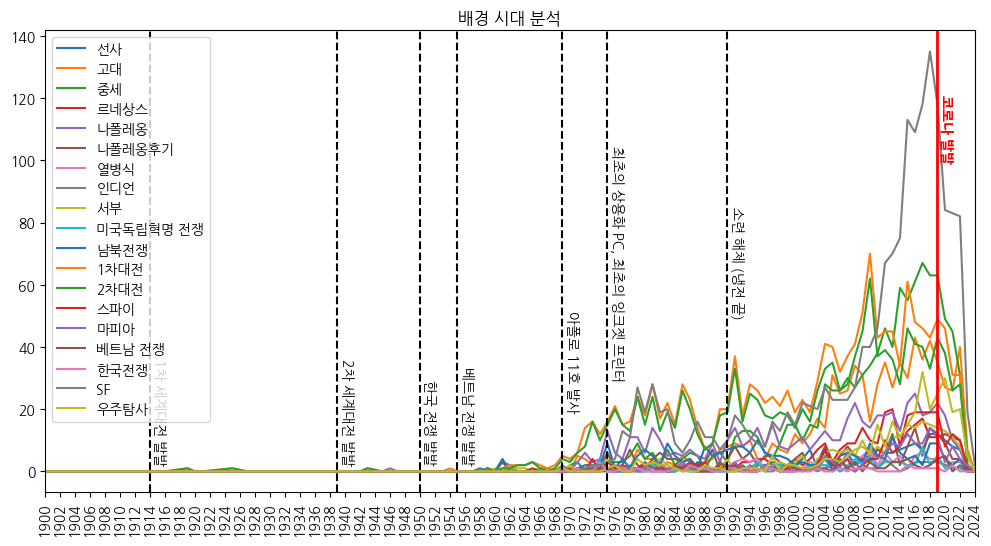

In [113]:
plt.figure(figsize=(12, 6))
plt.title('배경 시대 분석')
plt.plot(time_df, label = time_df.columns)
plt.legend()
plt.xticks([2*i for i in range(560,1020)], rotation=90)
plt.xlim([1900, 2024])
plt.axvline(1914, color='black', linestyle = '--')
plt.text(1914.3, 3, '1차 세계대전 발발', color = 'black', rotation = -90)
plt.axvline(1939, color='black', linestyle = '--')
plt.text(1939.3, 3, '2차 세계대전 발발', color = 'black', rotation = -90)
plt.axvline(1950, color='black', linestyle = '--')
plt.text(1950.3, 3, '한국 전쟁 발발', color = 'black', rotation = -90)
plt.axvline(1955, color='black', linestyle = '--')
plt.text(1955.3, 3, '베트남 전쟁 발발', color = 'black', rotation = -90)
plt.axvline(1969, color='black', linestyle = '--')
plt.text(1969.3, 20, '아폴로 11호 발사', color = 'black', rotation = -90)
plt.axvline(1975, color='black', linestyle = '--')
plt.text(1975.3, 30, '최초의 상용화 PC, 최초의 잉크젯 프린터', color = 'black', rotation = -90)
# plt.axvline(1988, color='black', linestyle = '--')
# plt.text(1988.3, 40, '최초의 상용화 3D 프린터', color = 'black', rotation = -90)
plt.axvline(1991, color='black', linestyle = '--')
plt.text(1991.3, 50, '소련 해체 (냉전 끝)', color = 'black', rotation = -90)
# plt.axvline(1972, color='black', linestyle = '--')
# plt.text(1972.3, 30, '최초의 디지털 게임기 등장', color = 'black', rotation = -90)
# plt.axvline(1990, color='black', linestyle = '--')
# plt.text(1990.3, 90, '최초의 www 웹사이트', color = 'black', rotation = -90)
# plt.axvline(2009, color='black', linestyle = '--')
# plt.text(2009.3, 80, '3D 프린터 특허만료 (가격하락)', color = 'black', rotation = -90)
plt.axvline(2019, color='r', linewidth=2)
plt.text(2019.3, 100, '코로나 발발', color = 'red', weight = 'bold', rotation = -90)
plt.show();

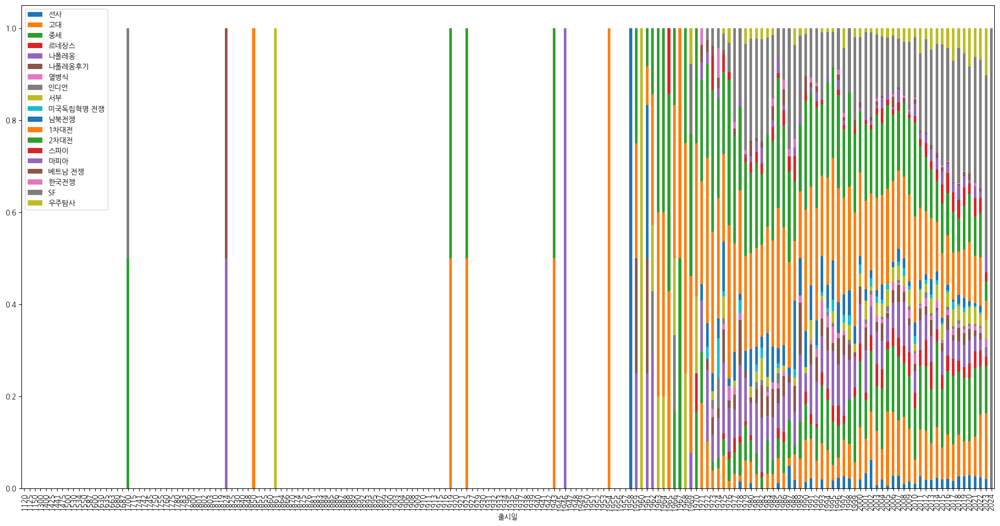

In [114]:
time_frac_df.plot(kind='bar', stacked = True, figsize=(24, 12))
plt.legend()
plt.show();

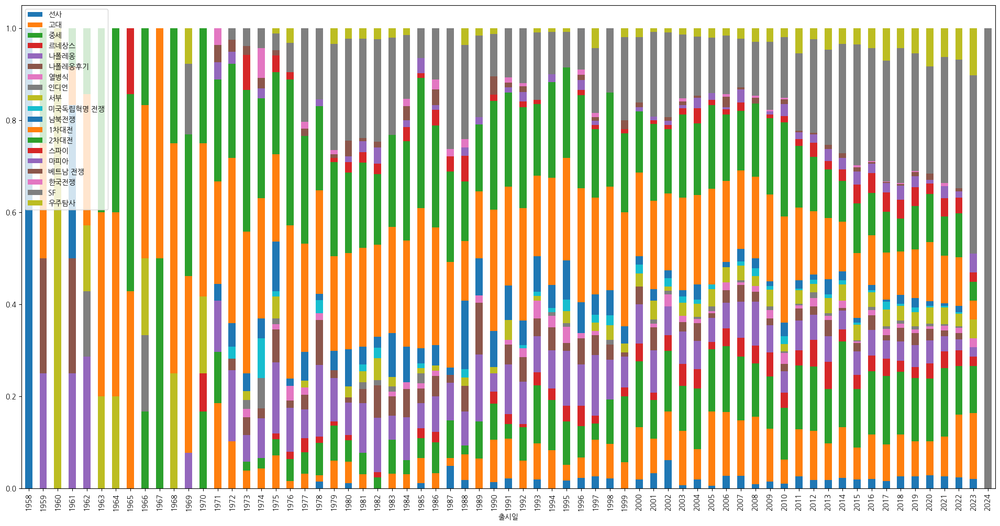

In [115]:
time_frac_df[time_frac_df.index>=1958].plot(kind='bar', stacked = True, figsize=(24, 12))
plt.legend()
plt.show();

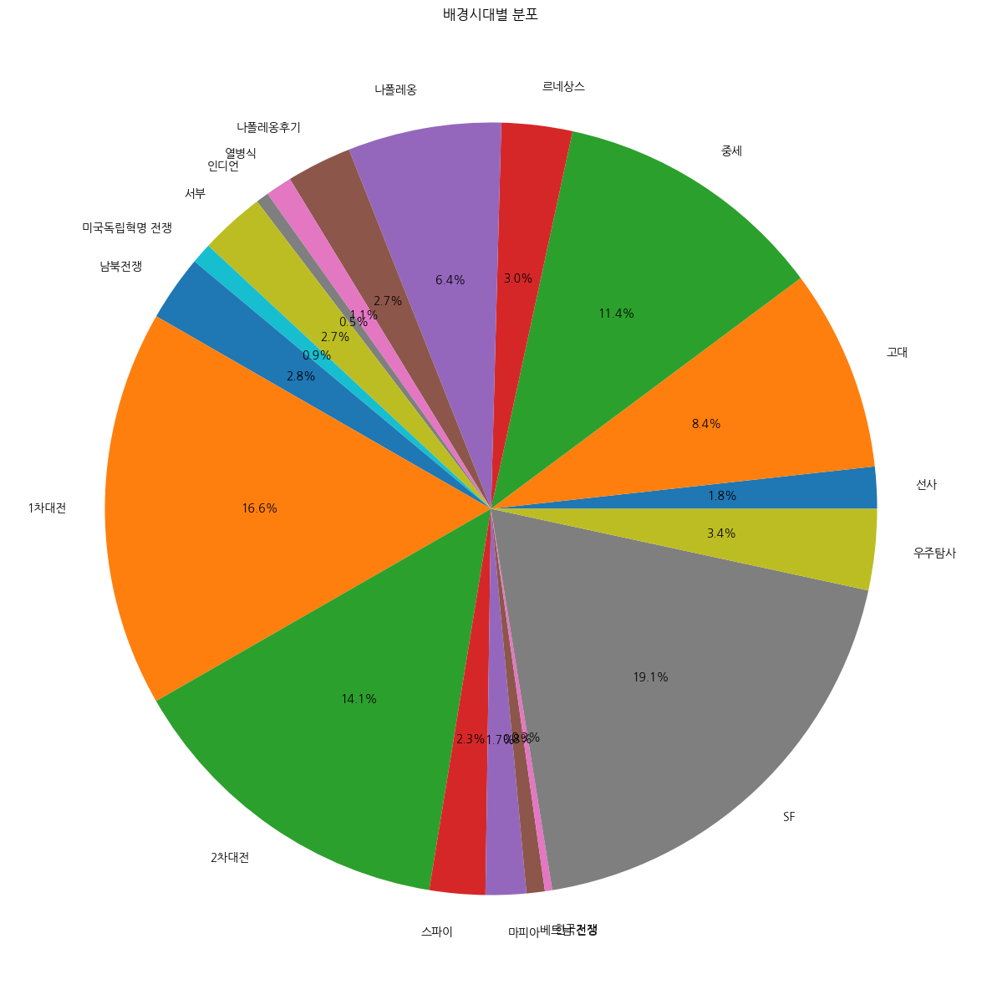

In [116]:
# 파이차트
plt.figure(figsize=(30,15))
plt.title("배경시대별 분포")
plt.pie(time_df.sum(), labels=time_df.columns, autopct='%.1f%%')
plt.show()

In [117]:
# time_df[time_df == time_df.max(axis=0)].drop_duplicates()[1:]

In [118]:
time_df['이벤트'] = '중세'

for i in range(1580, 1760) :
    add_event(time_df, i, '근세')
for i in range(1760, 1900) :
    add_event(time_df, i, '근대')
for i in range(1900, 2025) :
    add_event(time_df, i, '현대')
    
for i in range(1300, 1500) :
    add_event(time_df, i, '르네상스')
for i in range(1804, 1816) :
    add_event(time_df, i, '나폴레옹 집권기')
for i in range(1850, 1890) :
    add_event(time_df, i, '서부 개척시대')
for i in range(1400, 1600) :
    add_event(time_df, i, '대항해시대')
for i in range(1609, 1925) :
    add_event(time_df, i, '미국 인디언 전쟁')
for i in range(1661, 1666) :
    add_event(time_df, i, '남북전쟁')
for i in range(1760, 1821) :
    add_event(time_df, i, '산업혁명')
for i in range(1914, 1919) :
    add_event(time_df, i, '1차 세계대전')
for i in range(1939, 1946) :
    add_event(time_df, i, '2차 세계대전')
for i in range(1946, 1992) :
    add_event(time_df, i, '냉전')
for i in range(1955, 1976) :
    add_event(time_df, i, '베트남 전쟁')
for i in range(1950, 1954) :
    add_event(time_df, i, '한국 전쟁')
    
add_event(time_df, 1914, '사라예보 사건, 1차 세계대전 발발')
add_event(time_df, 1915, '전쟁에 살상용 독가스 등장')
add_event(time_df, 1916, '전차 실전 투입')
add_event(time_df, 1917, '러시아 2월 혁명')
add_event(time_df, 1918, '독일 항복')
add_event(time_df, 1919, '베르사유 조약 체결')
add_event(time_df, 1920, '1차 세계대전 공식 종전')
add_event(time_df, 1933, '히틀러 독일 총리 등극')
add_event(time_df, 1934, '히틀러 독일 대통령 겸직')
add_event(time_df, 1929, '대공황 발생')
add_event(time_df, 1939, '나치 독일 폴란드 침공, 2차 세계대전 발발')
add_event(time_df, 1945, '히틀러 자살')
add_event(time_df, 1943, '무솔리니 정권 붕괴')
add_event(time_df, 1945, '일본에 원자 폭탄 투하, 항복')
add_event(time_df, 1990, '독일 재통일')
add_event(time_df, 1991, '소련 해체')
add_event(time_df, 2001, '911 테러')
add_event(time_df, 2019, '코로나 발발')
add_event(time_df, 1922, '소련 건국')

time_df.tail()

,선사,고대,중세,르네상스,나폴레옹,나폴레옹후기,열병식,인디언,서부,미국독립혁명 전쟁,남북전쟁,1차대전,2차대전,스파이,마피아,베트남 전쟁,한국전쟁,SF,우주탐사,이벤트
출시일,,,,,,,,,,,,,,,,,,,,
2020,10,27,49,12,18,9,2,2,13,1,4,46,38,8,3,5,0,84,30,현대
2021,8,26,45,11,10,4,3,1,11,1,2,31,26,12,8,0,2,83,19,현대
2022,7,40,31,10,7,4,3,1,8,1,4,31,28,10,4,2,0,82,20,현대
2023,1,7,5,1,1,0,1,0,2,0,0,2,2,1,2,0,0,19,5,현대
2024,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,현대


In [119]:
time_column_list = ['선사', '고대', '중세', '르네상스', '나폴레옹', '나폴레옹후기', '열병식', '인디언', '서부', '미국독립혁명 전쟁', '남북전쟁', '1차대전', '2차대전', '스파이', '마피아', '베트남 전쟁', '한국전쟁', 'SF', '우주탐사']
bcr.bar_chart_race(df = time_df[time_column_list].fillna(0),
                   sort='desc',
                   # img_label_folder="bar_image_labels",
                   period_label={'x': .99, 'y': .25, 'ha': 'right', 'va': 'center'},
                   period_fmt = '{x:.0f}',
                   period_summary_func=lambda v, r: {'x': .99, 'y': .18,
                                      's': f'{time_df.loc[int(r.name)]["이벤트"]}',
                                      'ha': 'right', 'size': 8},
                   fixed_max = True,
                   bar_kwargs={'alpha': .7},
                   steps_per_period = 4,
                   title = '주제 시간대 분석')

## ip별 분석
https://game.donga.com/105471/

In [120]:
column_list = ['전체', '카드', '주사위', '책', '만화', '추상전략', '아동', '동물', '블러핑', '종교', '추정', 
       '파티게임', '교육', '레이싱', '숫자', '기억력', '중세', '수학', 'SF', '영화', '전쟁', '나폴레옹',
       '나폴레옹후기', '고대', '순발력', '서부', '음악', '소설', '스포츠', '경제', '해적', '여행',
       '어드벤처', '탐험', '운송', '선박', '전투', '전자기기', '단순', '미니어처', '1차대전', '2차대전',
       '수집', '퍼즐', '비행', '실시간', '유머', '단어게임', '협싱', '살인/미스터리', '현대전', '농사',
       '문명', '남북전쟁', '기차', '내전', '영역건설', '환경', '정치', '산업', '도시건설', '성인', '인디언',
       '공포', '의학', '스파이', '미로', '판타지', '출력', '우주탐사', '르네상스', '베트남 전쟁', '마피아',
       '이성의 시대', '한국전쟁', '미국독립혁명 전쟁', '열병식', '신화', '좀비', '선사', '아라비안',
       '비디오게임']
ip_df = category_df[['소설', '만화', '영화', '비디오게임']]

ip_df['전체'] = ip_df.sum(axis=1)
ip_frac_df = ip_df / ip_df['전체'].values.reshape(-1,1)
ip_frac_df = ip_frac_df.drop('전체', axis=1)
ip_df = ip_df.drop('전체', axis=1)
ip_frac_df

,소설,만화,영화,비디오게임
출시일,,,,
1120,NaN,NaN,NaN,NaN
1125,NaN,NaN,NaN,NaN
1150,0.000000,1.000000,0.000000,0.000000
1300,NaN,NaN,NaN,NaN
1400,NaN,NaN,NaN,NaN
...,...,...,...,...
2020,0.118644,0.203390,0.474576,0.203390
2021,0.209091,0.181818,0.409091,0.200000
2022,0.136364,0.159091,0.431818,0.272727


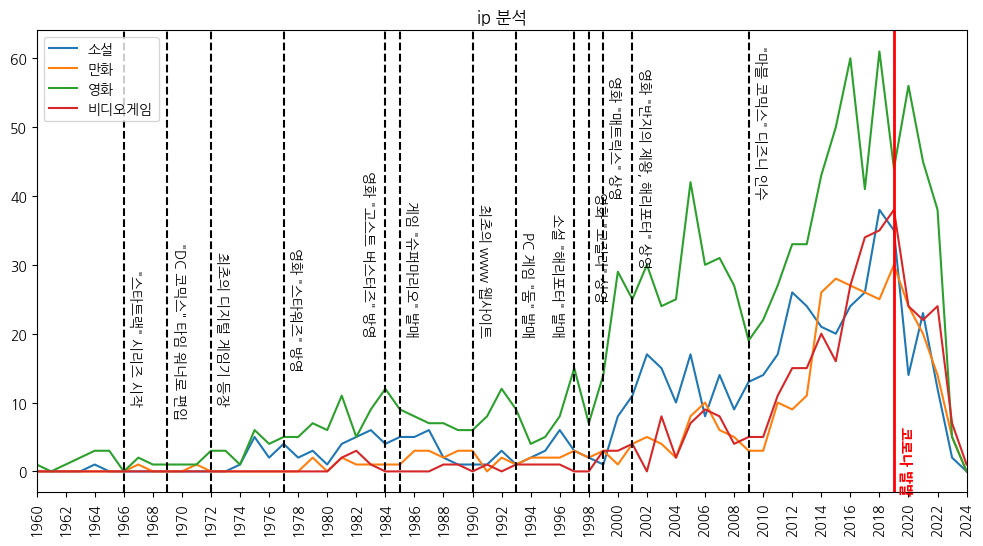

In [121]:
plt.figure(figsize=(12, 6))
plt.title('ip 분석')
plt.plot(ip_df, label = ip_df.columns)
plt.legend()
plt.xticks([2*i for i in range(560,1020)], rotation=90)
# plt.axvline(1887, color='black', linestyle = '--')
# plt.text(1887.3, 3, '"셜록홈즈" 출간', color = 'black', rotation = -90)
# plt.axvline(1950, color='black', linestyle = '--')
# plt.text(1950.3, 30, '"반지의 제왕" 출간', color = 'black', rotation = -90)
# plt.axvline(1928, color='black', linestyle = '--')
# plt.text(1928.3, 30, '"크툴루의 부름" 출간', color = 'black', rotation = -90)
# plt.axvline(1954, color='black', linestyle = '--')
# plt.text(1954.3, 30, '"고질라" 상영', color = 'black', rotation = -90)
plt.axvline(1966, color='black', linestyle = '--')
plt.text(1966.3, 10, '"스타트랙" 시리즈 시작', color = 'black', rotation = -90)
plt.axvline(1969, color='black', linestyle = '--')
plt.text(1969.3, 8, '"DC 코믹스" 타임 워너로 편입', color = 'black', rotation = -90)
plt.axvline(1972, color='black', linestyle = '--')
plt.text(1972.3, 10, '최초의 디지털 게임기 등장', color = 'black', rotation = -90)
plt.axvline(1977, color='black', linestyle = '--')
plt.text(1977.3, 15, '영화 "스타워즈" 방영', color = 'black', rotation = -90)
plt.axvline(1984, color='black', linestyle = '--')
plt.text(1982.3, 20, '영화 "고스트 버스터즈" 방영', color = 'black', rotation = -90)
plt.axvline(1985, color='black', linestyle = '--')
plt.text(1985.3, 20, '게임 "슈퍼마리오" 발매', color = 'black', rotation = -90)
plt.axvline(1990, color='black', linestyle = '--')
plt.text(1990.3, 20, '최초의 www 웹사이트', color = 'black', rotation = -90)
plt.axvline(1993, color='black', linestyle = '--')
plt.text(1993.3, 20, 'PC 게임 "둠" 발매', color = 'black', rotation = -90)
plt.axvline(1997, color='black', linestyle = '--')
plt.text(1995.3, 20, '소설 "해리포터" 발매', color = 'black', rotation = -90)
plt.axvline(1998, color='black', linestyle = '--')
plt.text(1998.3, 25, '영화 "고질라" 상영', color = 'black', rotation = -90)
plt.axvline(1999, color='black', linestyle = '--')
plt.text(1999.3, 40, '영화 "매트릭스" 상영', color = 'black', rotation = -90)
plt.axvline(2001, color='black', linestyle = '--')
plt.text(2001.3, 30, '영화 "반지의 제왕, 해리포터" 상영', color = 'black', rotation = -90)
plt.axvline(2009, color='black', linestyle = '--')
plt.text(2009.3, 40, '"마블 코믹스" 디즈니 인수', color = 'black', rotation = -90)
plt.axvline(2019, color='r', linewidth=2)
plt.text(2019.3, -3, '코로나 발발', color = 'red', weight = 'bold', rotation = -90)
plt.xlim([1960, 2024])
plt.show();

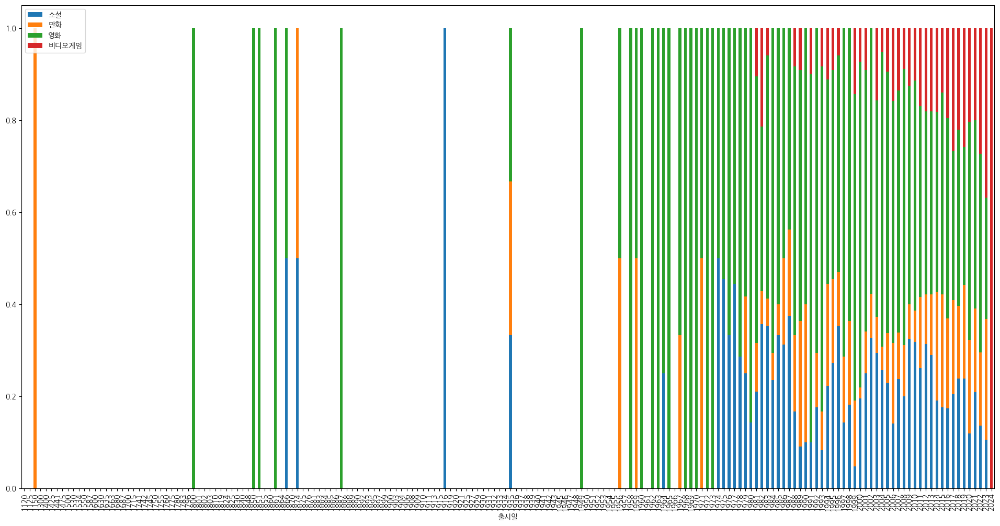

In [122]:
ip_frac_df.plot(kind='bar', stacked = True, figsize=(24, 12))
plt.legend()
# plt.xlim([1110, 2024])
plt.show();

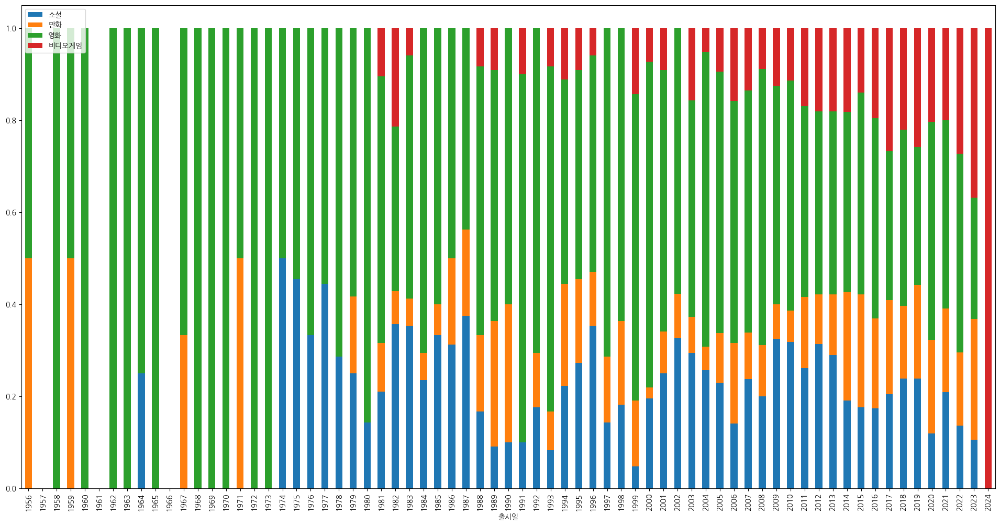

In [123]:
ip_frac_df[ip_frac_df.index>=1956].plot(kind='bar', stacked = True, figsize=(24, 12))
plt.legend()
plt.show();

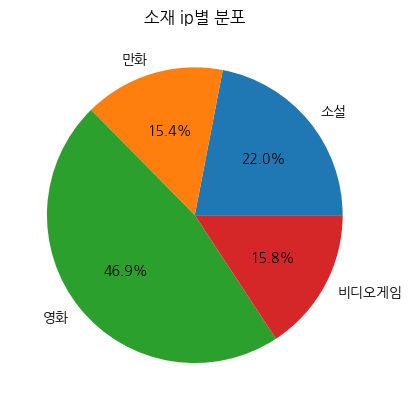

In [124]:
# 파이차트
plt.title("소재 ip별 분포")
plt.pie(ip_df.sum(), labels=ip_df.columns, autopct='%.1f%%')
plt.show()

In [125]:
ip_df[ip_df == ip_df.max(axis=0)].drop_duplicates()[1:]

,소설,만화,영화,비디오게임
출시일,,,,
2018,38.0,NaN,61.0,NaN
2019,NaN,30.0,NaN,38.0


## 테마별 분석

In [126]:
column_list = ['전체', '카드', '주사위', '책', '만화', '추상전략', '아동', '동물', '블러핑', '종교', '추정', 
       '파티게임', '교육', '레이싱', '숫자', '기억력', '중세', '수학', 'SF', '영화', '전쟁', '나폴레옹',
       '나폴레옹후기', '고대', '순발력', '서부', '음악', '소설', '스포츠', '경제', '해적', '여행',
       '어드벤처', '탐험', '운송', '선박', '전투', '전자기기', '단순', '미니어처', '1차대전', '2차대전',
       '수집', '퍼즐', '비행', '실시간', '유머', '단어게임', '협싱', '살인/미스터리', '현대전', '농사',
       '문명', '남북전쟁', '기차', '내전', '영역건설', '환경', '정치', '산업', '도시건설', '성인', '인디언',
       '공포', '의학', '스파이', '미로', '판타지', '출력', '우주탐사', '르네상스', '베트남 전쟁', '마피아',
       '이성의 시대', '한국전쟁', '미국독립혁명 전쟁', '열병식', '신화', '좀비', '선사', '아라비안',
       '비디오게임']

theme_column_list = ['판타지', '좀비', '서부', '공포', '살인/미스터리', '농사', '신화', '마피아', '우주탐사', 'SF', '해적']
theme_df = category_df[theme_column_list]

theme_df['전체'] = theme_df.sum(axis=1)
theme_frac_df = theme_df / theme_df['전체'].values.reshape(-1,1)
theme_frac_df = theme_frac_df.drop('전체', axis=1)
theme_df = theme_df.drop('전체', axis=1)
theme_frac_df

,판타지,좀비,서부,공포,살인/미스터리,농사,신화,마피아,우주탐사,SF,해적
출시일,,,,,,,,,,,
1120,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1125,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1150,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2020,0.393939,0.012987,0.028139,0.086580,0.084416,0.041126,0.064935,0.006494,0.064935,0.181818,0.034632
2021,0.392777,0.013544,0.024831,0.103837,0.110609,0.027088,0.058691,0.018059,0.042889,0.187359,0.020316
2022,0.418182,0.023377,0.020779,0.088312,0.041558,0.036364,0.059740,0.010390,0.051948,0.212987,0.036364


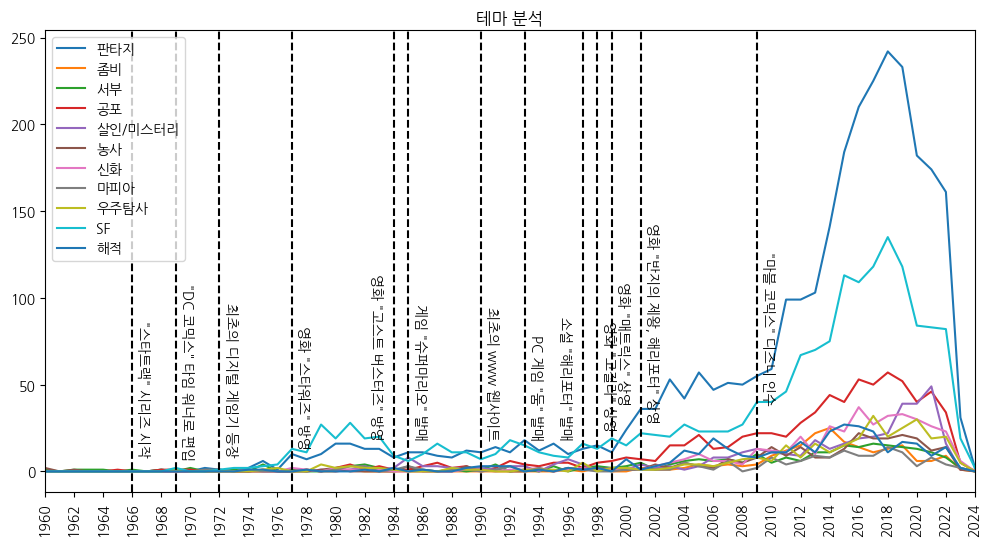

In [127]:
plt.figure(figsize=(12, 6))
plt.title('테마 분석')
plt.plot(theme_df, label = theme_df.columns)
plt.legend()
plt.xticks([2*i for i in range(560,1020)], rotation=90)
plt.axvline(1887, color='black', linestyle = '--')
# plt.axvline(1887, color='black', linestyle = '--')
# plt.text(1887.3, 3, '"셜록홈즈" 출간', color = 'black', rotation = -90)
# plt.axvline(1950, color='black', linestyle = '--')
# plt.text(1950.3, 30, '"반지의 제왕" 출간', color = 'black', rotation = -90)
# plt.axvline(1928, color='black', linestyle = '--')
# plt.text(1928.3, 30, '"크툴루의 부름" 출간', color = 'black', rotation = -90)
# plt.axvline(1954, color='black', linestyle = '--')
# plt.text(1954.3, 30, '"고질라" 상영', color = 'black', rotation = -90)
plt.axvline(1966, color='black', linestyle = '--')
plt.text(1966.3, 10, '"스타트랙" 시리즈 시작', color = 'black', rotation = -90)
plt.axvline(1969, color='black', linestyle = '--')
plt.text(1969.3, 8, '"DC 코믹스" 타임 워너로 편입', color = 'black', rotation = -90)
plt.axvline(1972, color='black', linestyle = '--')
plt.text(1972.3, 10, '최초의 디지털 게임기 등장', color = 'black', rotation = -90)
plt.axvline(1977, color='black', linestyle = '--')
plt.text(1977.3, 15, '영화 "스타워즈" 방영', color = 'black', rotation = -90)
plt.axvline(1984, color='black', linestyle = '--')
plt.text(1982.3, 20, '영화 "고스트 버스터즈" 방영', color = 'black', rotation = -90)
plt.axvline(1985, color='black', linestyle = '--')
plt.text(1985.3, 20, '게임 "슈퍼마리오" 발매', color = 'black', rotation = -90)
plt.axvline(1990, color='black', linestyle = '--')
plt.text(1990.3, 20, '최초의 www 웹사이트', color = 'black', rotation = -90)
plt.axvline(1993, color='black', linestyle = '--')
plt.text(1993.3, 20, 'PC 게임 "둠" 발매', color = 'black', rotation = -90)
plt.axvline(1997, color='black', linestyle = '--')
plt.text(1995.3, 20, '소설 "해리포터" 발매', color = 'black', rotation = -90)
plt.axvline(1998, color='black', linestyle = '--')
plt.text(1998.3, 25, '영화 "고질라" 상영', color = 'black', rotation = -90)
plt.axvline(1999, color='black', linestyle = '--')
plt.text(1999.3, 40, '영화 "매트릭스" 상영', color = 'black', rotation = -90)
plt.axvline(2001, color='black', linestyle = '--')
plt.text(2001.3, 30, '영화 "반지의 제왕, 해리포터" 상영', color = 'black', rotation = -90)
plt.axvline(2009, color='black', linestyle = '--')
plt.text(2009.3, 40, '"마블 코믹스" 디즈니 인수', color = 'black', rotation = -90)
plt.xlim([1960, 2024])
plt.show();

In [128]:
theme_df['이벤트'] = time_df['이벤트']

    
for i in range(2018, 2024) :
    add_event(theme_df, i, '스타트렉 : 쇼트 트렉스" 방영')
for i in range(2017, 2018) :
    add_event(theme_df, i, '스타트렉 : 애프터 트렉" 방영')
for i in range(2019, 2024) :
    add_event(theme_df, i, '스타트렉 : 더 레디 룸" 방영')

for i in range(1966, 1969) :
    add_event(theme_df, i, '스타트렉 : 디 오리지널 시리즈" 방영')
for i in range(1987, 1994) :    
    add_event(theme_df, i, '스타트렉 : 넥스트 제너레이션" 방영')
for i in range(1993, 1999) :
    add_event(theme_df, i, '스타트렉 : 딥 스페이스 나인" 방영')
for i in range(1994, 2001) :
    add_event(theme_df, i, '스타트렉 : 보이저" 방영')
for i in range(2001, 2005) :
    add_event(theme_df, i, '스타트렉 : 엔터프라이즈" 방영')
for i in range(2017, 2020) :
    add_event(theme_df, i, '스타트렉 : 디스커버리" 방영')
for i in range(2020, 2022) :
    add_event(theme_df, i, '스타트렉 : 피카드" 방영')
for i in range(2022, 2024) :
    add_event(theme_df, i, '스타트렉 : 스트레인지 뉴 월드" 방영')
    
for i in range(1850, 1890) :
    add_event(theme_df, i, '서부개척시대')
    
add_event(theme_df, 1863, '쥘 베른 "기구를 타고" 발표')
add_event(theme_df, 1864, '쥘 베른 "지구 속 여행" 발표')
add_event(theme_df, 1865, '쥘 베른 "지구에서 달까지" 발표')

add_event(theme_df, 1996, '"스크림" 상영')
add_event(theme_df, 1980, '"샤이닝" 상영')
add_event(theme_df, 1976, '"캐리" 상영')
add_event(theme_df, 2002, '"캐리" 상영')
add_event(theme_df, 2007, '"미스트" 상영')
add_event(theme_df, 1994, '"쇼생크 탈출" 상영')
add_event(theme_df, 1999, '"그린마일" 상영')
add_event(theme_df, 1990, '"미저리" 상영')
add_event(theme_df, 2013, '"캐리" 상영')
add_event(theme_df, 2016, '"그것" 상영')
add_event(theme_df, 1986, '"스탠 바이 미" 상영')

add_event(theme_df, 1974, '"텍사스 전기톱 학살" 상영')
add_event(theme_df, 1986, '"텍사스 전기톱 학살 2부" 상영')
add_event(theme_df, 1990, '"가죽얼굴 : 텍사스 전기톱 학살 3" 상영')
add_event(theme_df, 1994, '"텍사스 전기톱 학살 : 다음 세대" 상영')
add_event(theme_df, 2003, '"텍사스 전기톱 학살" 상영')
add_event(theme_df, 2006, '"텍사스 전기톱 학살 : 비기닝" 상영')
add_event(theme_df, 2013, '"텍사스 전기톱 3D" 상영')
add_event(theme_df, 2017, '"가죽얼굴" 상영')
add_event(theme_df, 2022, '"텍사스 전기톱 학살 2022" 상영')

add_event(theme_df, 1984, '"나이트메어" 상영')
add_event(theme_df, 1985, '"일렘가의 악몽2 : 프레디의 복수" 상영')
add_event(theme_df, 1987, '"일렘가의 악몽3 : 꿈의 전사" 상영')
add_event(theme_df, 1988, '"일렘가의 악몽4 : 꿈의 주인" 상영')
add_event(theme_df, 1989, '"일렘가의 악몽5 : 꿈의 아이" 상영')
add_event(theme_df, 1991, '"프레디의 죽음 : 마지막 악몽" 상영')
add_event(theme_df, 1994, '"웨스 크레이븐의 새로운 악몽" 상영')
add_event(theme_df, 2003, '"프레디 vs 제이슨" 상영')
add_event(theme_df, 2010, '"엘름가의 악몽" 상영')

add_event(theme_df, 1897, '러브크래프트 "작은 녹색 병" 발표')
add_event(theme_df, 1907, '러브크래프트 "사진" 발표')
add_event(theme_df, 1898, '러브크래프트 "탐정 존" 발표')
add_event(theme_df, 1902, '러브크래프트 "미스터리한 양" 발표')
add_event(theme_df, 1908, '러브크래프트 "연금술사" 발표')
add_event(theme_df, 1923, '러브크래프트 "쥐의 벽" 발표')
add_event(theme_df, 1931, '러브크래프트 "광기의 산맥에서" 발표')
add_event(theme_df, 1922, '러브크래프트 "아자토스" 발표')
add_event(theme_df, 1934, '러브크래프트 "시간의 그림자" 발표')
add_event(theme_df, 1905, '러브크래프트 "동굴속의 짐슬" 발표')
add_event(theme_df, 1933, '러브크래프트 "에이온의 밖" 발표')
add_event(theme_df, 1926, '러브크래프트 "크툴루의 부름" 발표')
add_event(theme_df, 1920, '러브크래프트 "니얄라토텝" 발표')
add_event(theme_df, 1935, '러브크래프트 "우주의 붕괴" 발표')
add_event(theme_df, 1927, '러브크래프트 "네크로노미콘의 역사" 발표')
add_event(theme_df, 1926, '러브크래프트 "찬 공기" 발표')
add_event(theme_df, 1921, '러브크래프트 "기어오는 혼돈" 발표')
add_event(theme_df, 1928, '러브크래프트 "이그의 저주" 발표')
add_event(theme_df, 1917, '러브크래프트 "사무엘 존슨 박사를 회상하며" 발표')
add_event(theme_df, 1924, '러브크래프트 "피라미드 아래에서" 발표')
add_event(theme_df, 1935, '러브크래프트 "알론조 타이퍼의 일기" 발표')
add_event(theme_df, 1919, '러브크래프트 "사나스로부터의 멸망" 발표')
add_event(theme_df, 1932, '러브크래프트 "마녀의 집에서의 꿈" 발표')
add_event(theme_df, 1928, '러브크래프트 "던위치 호러" 발표')
add_event(theme_df, 1929, '러브크래프트 "전기 처형인" 발표')
add_event(theme_df, 1933, '러브크래프트 "날개달린 죽음" 발표')
add_event(theme_df, 1918, '러브크래프트 "녹색 초원" 발표')
add_event(theme_df, 1925, '러브크래프트 "그" 발표')
add_event(theme_df, 1936, '러브크래프트 "에릭스의 벽 안에서" 발표')
add_event(theme_df, 1930, '러브크래프트 "어둠으로부터의 속삭임" 발표')

add_event(theme_df, 1920, '애거서 크리스티 "스타일스 저택의 죽음" 발표')
add_event(theme_df, 1922, '애거서 크리스티 "비밀결사" 발표')
add_event(theme_df, 1923, '애거서 크리스티 "골프장 살인사건" 발표')
add_event(theme_df, 1924, '애거서 크리스티 "포와로 수사집" 발표')
add_event(theme_df, 1925, '애거서 크리스티 "침니스의 비밀" 발표')
add_event(theme_df, 1926, '애거서 크리스티 "애크로이드 살인사건" 발표')
add_event(theme_df, 1927, '애거서 크리스티 "빅 포" 발표')
add_event(theme_df, 1928, '애거서 크리스티 "푸른 열차의 비밀" 발표')
add_event(theme_df, 1929, '애거서 크리스티 "부부 탐정" 발표')
add_event(theme_df, 1930, '애거서 크리스티 "수수께끼의 할리퀸" 발표')
add_event(theme_df, 1931, '애거서 크리스티 "시태퍼드 미스터리, 헤이즐무어 살인사건" 발표')
add_event(theme_df, 1932, '애거서 크리스티 "엔드하우스의 비극" 발표')
add_event(theme_df, 1933, '애거서 크리스티 "죽음의 사냥개" 발표')
add_event(theme_df, 1934, '애거서 크리스티 "오리엔트 특급 살인" 발표')
add_event(theme_df, 1935, '애거서 크리스티 "3막의 비밀" 발표')
add_event(theme_df, 1935, '애거서 크리스티 "구름 속의 살인" 발표')
add_event(theme_df, 1936, '애거서 크리스티 "ABC 살인 사건" 발표')
add_event(theme_df, 1937, '애거서 크리스티 "나일강의 죽음" 발표')
add_event(theme_df, 1938, '애거서 크리스티 "죽음과의 약속" 발표')
add_event(theme_df, 1939, '애거서 크리스티 "그리고 아무도 없었다, 열 개의 인디언 인형" 발표')
add_event(theme_df, 1940, '애거서 크리스티 "슬픈 사이프러스, 삼나무 관" 발표')
add_event(theme_df, 1941, '애거서 크리스티 "백주의 악마" 발표')
add_event(theme_df, 1942, '애거서 크리스티 "서재의 시체" 발표')
add_event(theme_df, 1944, '애거서 크리스티 "마지막으로 죽음이 오다" 발표')
add_event(theme_df, 1945, '애거서 크리스티 "빛나는 청산가리, 잊을 수 없는 죽음" 발표')
add_event(theme_df, 1946, '애거서 크리스티 "할로 저택의 비극" 발표')
add_event(theme_df, 1947, '애거서 크리스티 "헤라클래스의 모험" 발표')
add_event(theme_df, 1948, '애거서 크리스티 "밀물을 타고, 파도를 타고" 발표')
add_event(theme_df, 1949, '애거서 크리스티 "비틀린 집" 발표')
add_event(theme_df, 1950, '애거서 크리스티 "쥐덫" 발표')
add_event(theme_df, 1951, '애거서 크리스티 "그들은 바그다드로 갔다" 발표')
add_event(theme_df, 1952, '애거서 크리스티 "마술 살인" 발표')
add_event(theme_df, 1953, '애거서 크리스티 "주머니 속의 죽음" 발표')
add_event(theme_df, 1954, '애거서 크리스티 "목적지 불명, 죽음을 향한 발자국" 발표')
add_event(theme_df, 1955, '애거서 크리스티 "히코리 디코리 독" 발표')
add_event(theme_df, 1956, '애거서 크리스티 "죽은 자의 어리석음" 발표')
add_event(theme_df, 1957, '애거서 크리스티 "패딩턴발 4시 50분" 발표')
add_event(theme_df, 1958, '애거서 크리스티 "누명" 발표')
add_event(theme_df, 1959, '애거서 크리스티 "비둘기 속의 고양이" 발표')
add_event(theme_df, 1960, '애거서 크리스티 "크리스마스 푸딩의 모험" 발표')
add_event(theme_df, 1961, '애거서 크리스티 "창백한 말" 발표')
add_event(theme_df, 1962, '애거서 크리스티 "깨어진 거울" 발표')
add_event(theme_df, 1963, '애거서 크리스티 "시계들" 발표')
add_event(theme_df, 1964, '애거서 크리스티 "카리브 해의 미스터리" 발표')
add_event(theme_df, 1965, '애거서 크리스티 "버트럼 호텔에서" 발표')
add_event(theme_df, 1966, '애거서 크리스티 "세 번째 여인" 발표')
add_event(theme_df, 1967, '애거서 크리스티 "끝없는 밤" 발표')
add_event(theme_df, 1968, '애거서 크리스티 "엄지손가락의 아픔" 발표')
add_event(theme_df, 1969, '애거서 크리스티 "핼러윈 파티" 발표')
add_event(theme_df, 1970, '애거서 크리스티 "프랑크푸르트행 승객" 발표')
add_event(theme_df, 1971, '애거서 크리스티 "네메시스" 발표')
add_event(theme_df, 1972, '애거서 크리스티 "코끼리는 기억한다." 발표')
add_event(theme_df, 1973, '애거서 크리스티 "운명의 문" 발표')
add_event(theme_df, 1975, '애거서 크리스티 "커튼" 발표')
add_event(theme_df, 1976, '애거서 크리스티 "잠자는 살인" 발표')
add_event(theme_df, 1997, '애거서 크리스티 유고집 "빛이 있는 동안" 발표')

add_event(theme_df, 1887, '아서 코난 도일 "셜록홈즈 : 주홍색 연구" 발표')
add_event(theme_df, 1890, '아서 코난 도일 "셜록홈즈 : 네 사람의 서명" 발표')
add_event(theme_df, 1890, '아서 코난 도일 "셜록홈즈의 모험" 발표')
add_event(theme_df, 1894, '아서 코난 도일 "셜록홈즈의 회상록" 발표')
add_event(theme_df, 1901, '아서 코난 도일 "셜록홈즈 : 바스커빌 가의 개" 발표')
add_event(theme_df, 1905, '아서 코난 도일 "셜록홈즈의 귀환" 발표')
add_event(theme_df, 1915, '아서 코난 도일 "셜록홈즈 : 공포의 계곡" 발표')
add_event(theme_df, 1917, '아서 코난 도일 "셜록홈즈의 마지막 인사" 발표')
add_event(theme_df, 1927, '아서 코난 도일 "셜록홈즈의 사건집" 발표')

add_event(theme_df, 1927, 'J.R.R 톨킨 "호빗" 출판')
add_event(theme_df, 1939, 'J.R.R 톨킨 "요정 이야기" 출판')
add_event(theme_df, 1947, 'J.R.R 톨킨 "니글의 이파리" 출판')
add_event(theme_df, 1949, 'J.R.R 톨킨 "햄의 농부 가일스" 출판')
add_event(theme_df, 1954, 'J.R.R 톨킨 "반지의 제왕 : 반지 원정대" 출판')
add_event(theme_df, 1955, 'J.R.R 톨킨 "반지의 제왕 : 왕의 귀환" 출판')
add_event(theme_df, 1962, 'J.R.R 톨킨 "톰 봄바딜의 모험" 출판')
add_event(theme_df, 1967, 'J.R.R 톨킨 "길은 계속 이어진다오" 출판')
add_event(theme_df, 1975, 'J.R.R 톨킨 사후 "가웨인 경과 녹기사" 출판')
add_event(theme_df, 1976, 'J.R.R 톨킨 사후 "북극에서 온 편지" 출판')
add_event(theme_df, 1977, 'J.R.R 톨킨 사후 "실마릴리온" 출판')
add_event(theme_df, 1980, 'J.R.R 톨킨 사후 "끝나지 않은 이야기" 출판')
add_event(theme_df, 1982, 'J.R.R 톨킨 사후 "핀과 헨게스트" 출판')
add_event(theme_df, 1983, 'J.R.R 톨킨 사후 "가운데땅의 역사서 : 잃어버린 이야기들의 책1" 출판')
add_event(theme_df, 1984, 'J.R.R 톨킨 사후 "가운데땅의 역사서 : 잃어버린 이야기들의 책2" 출판')
add_event(theme_df, 1985, 'J.R.R 톨킨 사후 "가운데땅의 역사서 : 벨레리안드의 노래" 출판')
add_event(theme_df, 1986, 'J.R.R 톨킨 사후 "가운데땅의 역사서 : 가운데땅의 형성" 출판')
add_event(theme_df, 1987, 'J.R.R 톨킨 사후 "가운데땅의 역사서 : 잃어버린 길과 다른 저작물" 출판')
add_event(theme_df, 1988, 'J.R.R 톨킨 사후 "가운데땅의 역사서 : 어둠의 귀환" 출판')
add_event(theme_df, 1989, 'J.R.R 톨킨 사후 "가운데땅의 역사서 : 아이센가드의 반란" 출판')
add_event(theme_df, 1990, 'J.R.R 톨킨 사후 "가운데땅의 역사서 : 반지전쟁" 출판')
add_event(theme_df, 1992, 'J.R.R 톨킨 사후 "가운데땅의 역사서 : 사우론의 몰락" 출판')
add_event(theme_df, 1993, 'J.R.R 톨킨 사후 "가운데땅의 역사서 : 모르고스의 반지" 출판')
add_event(theme_df, 1994, 'J.R.R 톨킨 사후 "가운데땅의 역사서 : 보석 전쟁" 출판')
add_event(theme_df, 1996, 'J.R.R 톨킨 사후 "가운데땅의 역사서 : 가운데 땅의 사람들" 출판')
add_event(theme_df, 1998, 'J.R.R 톨킨 사후 "로버랜덤" 출판')
add_event(theme_df, 2007, 'J.R.R 톨킨 사후 "호빗의 역사" 출판')

add_event(theme_df, 2003, '영화 "캐러비안의 해적 : 블랙 펄의 저주" 개봉')
add_event(theme_df, 2006, '영화 "캐러비안의 해적 : 망자의 함" 개봉')
add_event(theme_df, 2007, '영화 "캐러비안의 해적 : 세상의 끝에서" 개봉')
add_event(theme_df, 2011, '영화 "캐러비안의 해적 : 낯선 조류" 개봉')
add_event(theme_df, 2017, '영화 "캐러비안의 해적 : 죽은 자는 말이 없다" 개봉')

add_event(theme_df, 1997, 'J.K 롤링 "해리포터와 마법사의 돌" 출판')
add_event(theme_df, 1998, 'J.K 롤링 "해리포터와 비밀의 방" 출판')
add_event(theme_df, 1999, 'J.K 롤링 "해리포터와 아즈카반의 죄수" 출판')
add_event(theme_df, 2000, 'J.K 롤링 "해리포터와 불의 잔" 출판')
add_event(theme_df, 2001, '영화 "해리포터와 마법사의 돌" 개봉')
add_event(theme_df, 2002, '영화 "해리포터와 비밀의 방" 개봉')
add_event(theme_df, 2003, 'J.K 롤링 "해리포터와 불사조 기사단" 출판')
add_event(theme_df, 2004, '영화 "해리포터와 아즈카반의 죄수" 개봉')
add_event(theme_df, 2005, 'J.K 롤링 "해리포터와 혼혈왕자" 출판')
add_event(theme_df, 2007, 'J.K 롤링 "해리포터와 죽음의 성물" 출판')
add_event(theme_df, 2009, '영화 "해리포터와 혼혈 왕자" 개봉')
add_event(theme_df, 2010, '영화 "해리포터와 죽음의 성물 1부" 개봉')
add_event(theme_df, 2010, '영화 "해리포터와 죽음의 성물 2부" 개봉')
add_event(theme_df, 2016, 'J.K 롤링 "해리포터와 저주받은 아이" 출판')

add_event(theme_df, 1979, '"스타트렉 : 더 모션 픽처" 개봉')
add_event(theme_df, 1982, '"스타트렉2 : 칸의 분노" 개봉')
add_event(theme_df, 1984, '"스타트렉3 : 스팍을 찾아서" 개봉')
add_event(theme_df, 1986, '"스타트렉4 : 귀환의 항로" 개봉')
add_event(theme_df, 1989, '"스타트렉5 : 최후의 결전" 개봉')
add_event(theme_df, 1991, '"스타트렉6 : 미지의 세계" 개봉')
add_event(theme_df, 1994, '"스타트렉 : 넥서스 트렉" 개봉')
add_event(theme_df, 1996, '"스타트렉 : 퍼스트 콘택트" 개봉')
add_event(theme_df, 1998, '"스타트렉 : 최후의 반격" 개봉')
add_event(theme_df, 2002, '"스타트렉 : 네메시스" 개봉')
add_event(theme_df, 2009, '"스타트렉 : 더 비기닝" 개봉')
add_event(theme_df, 2013, '"스타트렉 : 다크니스" 개봉')
add_event(theme_df, 2016, '"스타트렉 비욘드" 개봉')

add_event(theme_df, 1977, '"스타워즈 : 새로운 희망" 개봉')
add_event(theme_df, 1978, '"스타워즈 홀리데이 스페셜" 개봉')
add_event(theme_df, 1980, '"스타워즈 : 제국의 역습" 개봉')
add_event(theme_df, 1983, '"스타워즈 : 제다이의 귀환" 개봉')
add_event(theme_df, 1984, '"이웍 : 엔도 전투" 개봉')
add_event(theme_df, 1999, '"스타워즈 : 보이지 않는 위협" 개봉')
add_event(theme_df, 2002, '"스타워즈 : 클론의 습격" 개봉')
add_event(theme_df, 2005, '"스타워즈 : 시스의 복수" 개봉')
add_event(theme_df, 2008, '"스타워즈 : 클론 전쟁" 방영')
add_event(theme_df, 2015, '"스타워즈 : 깨어난 포스" 개봉')
add_event(theme_df, 2016, '"로그 원 : 스타워즈 스토리" 개봉')
add_event(theme_df, 2016, '"한 솔로 : 스타워즈 스토리" 개봉')         
add_event(theme_df, 2017, '"스타워즈 : 라스트 제다이" 개봉')
add_event(theme_df, 2019, '"스타워즈 : 라이즈 오브 스카이워커" 개봉')

add_event(theme_df, 1984, '"터미네이터" 개봉')
add_event(theme_df, 1991, '"터미네이터 2: 심판의 날" 개봉')
add_event(theme_df, 2019, '"터미네이터: 다크 페이트" 개봉')
add_event(theme_df, 2003, '"터미네이터 3: 라이즈 오브 더 머신" 개봉')
add_event(theme_df, 2008, '"터미네이터 : 사라코너 연대기" 방영')
add_event(theme_df, 2009, '"터미네이터 : 미래전쟁의 시작" 개봉')
add_event(theme_df, 2015, '"터미네이터 제니시스" 개봉')

add_event(theme_df, 1979, '"에이리언" 개봉')
add_event(theme_df, 1986, '"에이리언 2" 개봉')
add_event(theme_df, 1992, '"에이리언 3" 개봉')
add_event(theme_df, 1997, '"에이리언 4" 개봉')
add_event(theme_df, 2004, '"에이리언 VS 프레데터" 개봉')
add_event(theme_df, 2007, '"에이리언 VS 프레데터2 : 레퀴엠" 개봉')
add_event(theme_df, 2012, '"프로메테우스" 개봉')
add_event(theme_df, 2017, '"에이리언: 커버넌트" 개봉')

add_event(theme_df, 2018, '영화 "신비한 동물들과 그린델왈드의 범죄" 개봉')
add_event(theme_df, 2022, '영화 "신비한 동물들과 덤블도어의 비밀" 개봉')

add_event(theme_df, 1999, '영화 "매트릭스" 개봉')
add_event(theme_df, 2003, '영화 "매트릭스2 : 리로디드" 개봉')
add_event(theme_df, 2021, '영화 "매트릭스 : 리저렉션" 개봉')

add_event(theme_df, 2001, '영화 "반지의 제왕 : 반지원정대" 개봉')
add_event(theme_df, 2002, '영화 "반지의 제왕 : 두 개의 탑" 개봉')
add_event(theme_df, 2003, '영화 "반지의 제왕 : 왕의 귀환" 개봉')
add_event(theme_df, 2012, '영화 "호빗 : 뜻밖의 여정" 개봉')
add_event(theme_df, 2013, '영화 "호빗 : 스마우그의 폐허" 개봉')
add_event(theme_df, 2014, '영화 "호빗 : 다섯 군대 전투" 개봉')

add_event(theme_df, 1982, '"E.T." 개봉')
add_event(theme_df, 1993, '"쥬라기 공원" 개봉')
add_event(theme_df, 2008, '"인디아나 존스" 개봉')

add_event(theme_df, 1998, '"링" 개봉')
add_event(theme_df, 2002, '"주온" 개봉')

add_event(theme_df, 2001, '"911 테러"')
add_event(theme_df, 1969, '"아폴로 11호" 달 착륙')

add_event(theme_df, 1818, '최초의 SF 소설 "프랑켄 슈타인" 발표')
add_event(theme_df, 1898, '소설 "우주전쟁" 발표')
add_event(theme_df, 1953, '영화 "우주전쟁" 개봉')
add_event(theme_df, 1851, '"SF" 용어 등장')
add_event(theme_df, 1897, '소설 "드라큘라" 발표')



theme_df.tail()

,판타지,좀비,서부,공포,살인/미스터리,농사,신화,마피아,우주탐사,SF,해적,이벤트
출시일,,,,,,,,,,,,
2020,182,6,13,40,39,19,30,3,30,84,16,"스타트렉 : 피카드"" 방영"
2021,174,6,11,46,49,12,26,8,19,83,9,"영화 ""매트릭스 : 리저렉션"" 개봉"
2022,161,9,8,34,16,14,23,4,20,82,14,"영화 ""신비한 동물들과 덤블도어의 비밀"" 개봉"
2023,31,1,2,5,1,1,6,2,5,19,2,"스타트렉 : 스트레인지 뉴 월드"" 방영"
2024,2,0,0,0,1,0,0,0,0,2,0,현대


In [129]:
theme_column_list = ['판타지', '좀비', '서부', '공포', '살인/미스터리', '농사', '신화', '마피아', '우주탐사', 'SF', '해적']
bcr.bar_chart_race(df = theme_df[theme_column_list].fillna(0),
                   sort='desc',
                   # img_label_folder="bar_image_labels",
                   period_label={'x': .99, 'y': .25, 'ha': 'right', 'va': 'center'},
                   period_fmt = '{x:.0f}',
                   period_summary_func=lambda v, r: {'x': .99, 'y': .18,
                                      's': f'{theme_df.loc[int(r.name)]["이벤트"]}',
                                      'ha': 'right', 'size': 8},
                   fixed_max = True,
                   bar_kwargs={'alpha': .7},
                   steps_per_period = 4,
                   title = '테마분석')

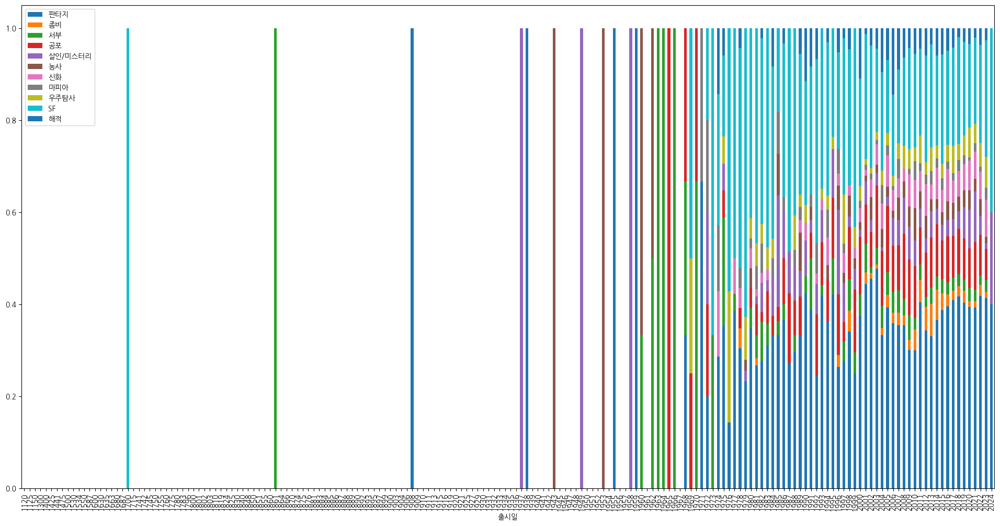

In [130]:
theme_frac_df.plot(kind='bar', stacked = True, figsize=(24, 12))
plt.legend()
plt.show();

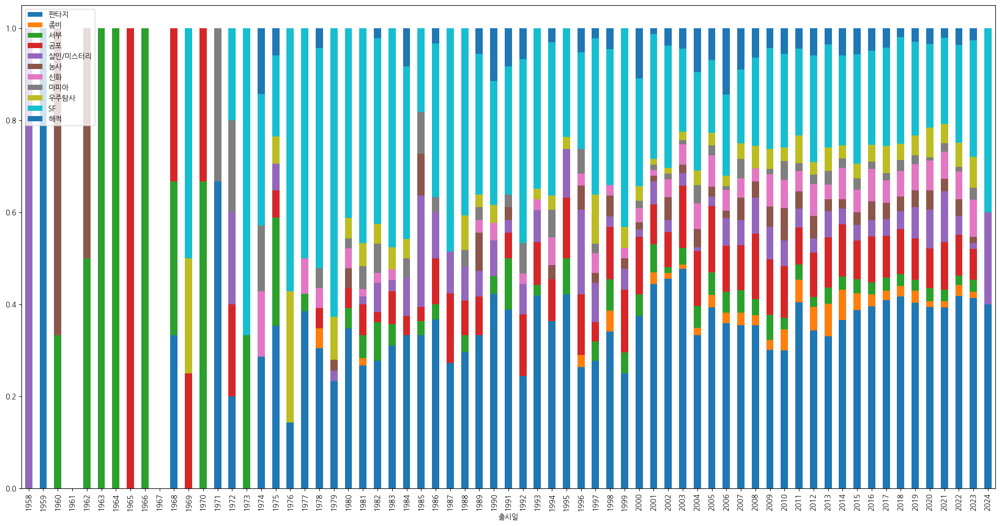

In [131]:
theme_frac_df[theme_frac_df.index>=1958].plot(kind='bar', stacked = True, figsize=(24, 12))
plt.legend()
plt.show();

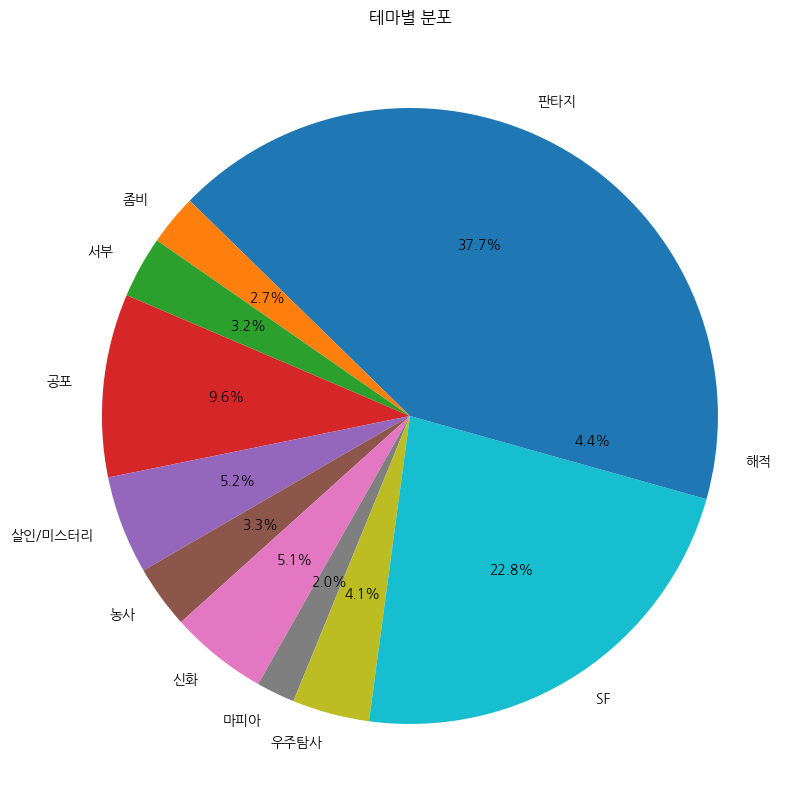

In [132]:
# 파이차트
plt.figure(figsize=(20,10))
plt.title("테마별 분포")
plt.pie(theme_df[theme_column_list].sum(), labels=theme_df[theme_column_list].columns, autopct='%.1f%%')
plt.show()

In [133]:
# theme_df[theme_df == theme_df.max(axis=0)].drop_duplicates()[1:]

## 도구별 비교

In [134]:
column_list = ['전체', '카드', '주사위', '책', '만화', '추상전략', '아동', '동물', '블러핑', '종교', '추정', 
       '파티게임', '교육', '레이싱', '숫자', '기억력', '중세', '수학', 'SF', '영화', '전쟁', '나폴레옹',
       '나폴레옹후기', '고대', '순발력', '서부', '음악', '소설', '스포츠', '경제', '해적', '여행',
       '어드벤처', '탐험', '운송', '선박', '전투', '전자기기', '단순', '미니어처', '1차대전', '2차대전',
       '수집', '퍼즐', '비행', '실시간', '유머', '단어게임', '협싱', '살인/미스터리', '현대전', '농사',
       '문명', '남북전쟁', '기차', '내전', '영역건설', '환경', '정치', '산업', '도시건설', '성인', '인디언',
       '공포', '의학', '스파이', '미로', '판타지', '출력', '우주탐사', '르네상스', '베트남 전쟁', '마피아',
       '이성의 시대', '한국전쟁', '미국독립혁명 전쟁', '열병식', '신화', '좀비', '선사', '아라비안',
       '비디오게임']
tool_column_list = ['추상전략', '주사위', '카드', '책', '수집', '미니어처', '전자기기']
tool_df = category_df[tool_column_list]

tool_df['전체'] = tool_df.sum(axis=1)
tool_frac_df = tool_df / tool_df['전체'].values.reshape(-1,1)
tool_frac_df = tool_frac_df.drop('전체', axis=1)
tool_df = tool_df.drop('전체', axis=1)
tool_frac_df

,추상전략,주사위,카드,책,수집,미니어처,전자기기
출시일,,,,,,,
1120,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
1125,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1150,0.500000,0.000000,0.000000,0.500000,0.000000,0.000000,0.000000
1300,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1400,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...
2020,0.088722,0.172932,0.523308,0.060150,0.031579,0.117293,0.006015
2021,0.101562,0.196875,0.540625,0.046875,0.012500,0.100000,0.001563
2022,0.094949,0.195960,0.521212,0.036364,0.016162,0.127273,0.008081


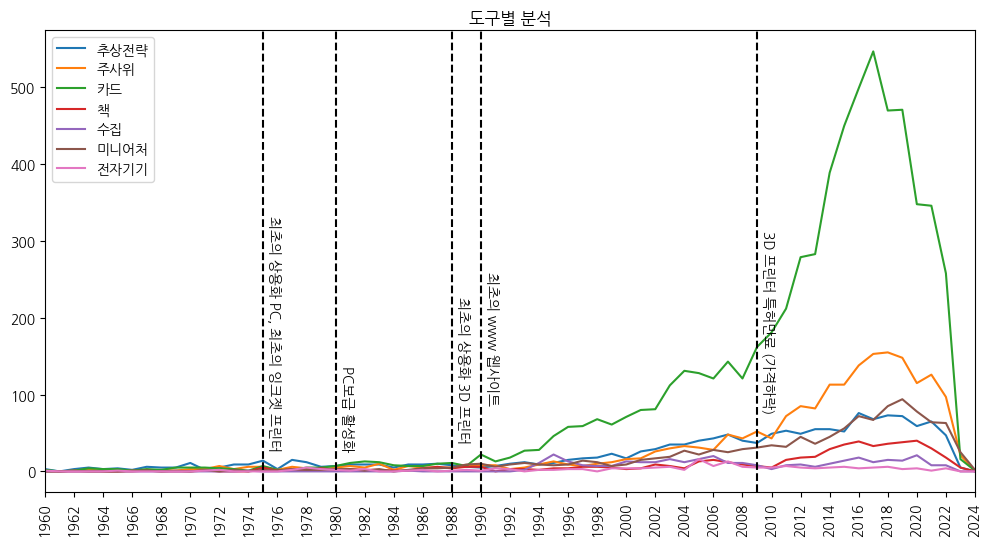

In [135]:
plt.figure(figsize=(12, 6))
plt.title('도구별 분석')
plt.plot(tool_df, label = tool_df.columns)
plt.legend()
plt.xticks([2*i for i in range(560,1020)], rotation=90)
plt.xlim([1960, 2024])
plt.axvline(1975, color='black', linestyle = '--')
plt.text(1975.3, 30, '최초의 상용화 PC, 최초의 잉크젯 프린터', color = 'black', rotation = -90)
plt.axvline(1980, color='black', linestyle = '--')
plt.text(1980.3, 30, 'PC보급 활성화', color = 'black', rotation = -90)
plt.axvline(1990, color='black', linestyle = '--')
plt.text(1990.3, 90, '최초의 www 웹사이트', color = 'black', rotation = -90)
plt.axvline(1988, color='black', linestyle = '--')
plt.text(1988.3, 40, '최초의 상용화 3D 프린터', color = 'black', rotation = -90)
plt.axvline(2009, color='black', linestyle = '--')
plt.text(2009.3, 80, '3D 프린터 특허만료 (가격하락)', color = 'black', rotation = -90)
plt.show();

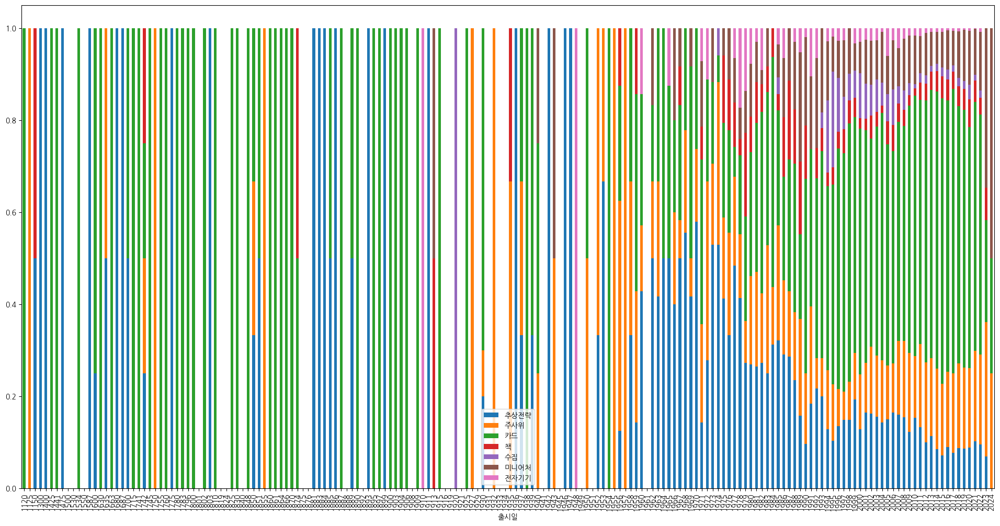

In [136]:
tool_frac_df.plot(kind='bar', stacked = True, figsize=(24, 12))
plt.legend()
# plt.xlim([1110, 2024])
plt.show();

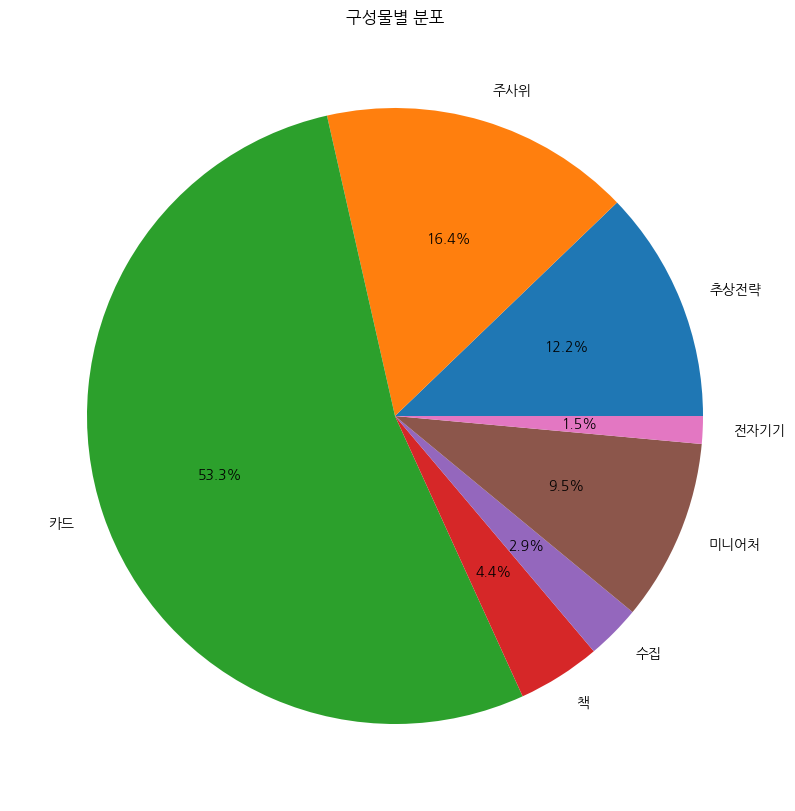

In [137]:
# 파이차트
plt.figure(figsize=(20,10))
plt.title("구성물별 분포")
plt.pie(tool_df.sum(), labels=tool_df.columns, autopct='%.1f%%')
plt.show()

In [138]:
tool_df['이벤트'] = time_df['이벤트']
    
add_event(tool_df, 1234, '고려, 동활자를 이용 "고금상정예문" 50권 인쇄')
add_event(tool_df, 1377, '최초의 금속활자 인쇄본 "직지"')
add_event(tool_df, 1500, '일본, "카루타"라는 이름으로 트럼프 카드 지칭')
add_event(tool_df, 1912, '나쓰메 소세키 "행인", 트럼프라는 표현 일상적 등장')
add_event(tool_df, 1883, '고종, 인쇄기계 연활자 수입, 박문국 설치')
add_event(tool_df, 1884, '광인사인쇄공소, 근대식 인쇄기계 연활자 사용 시작')
add_event(tool_df, 1920, '우리나라 사진제판 시설 도입, 설치')
add_event(tool_df, 1930, '한국 신문 "도람푸" 카드 지칭')
add_event(tool_df, 1990, '삼성휴렛패커드, 프린터 유통 시작')

add_event(tool_df, 1889, '타자기용 "데이지 휠" 특허')
add_event(tool_df, 1939, '"데이지 휠" 텔레타이프에 채택')
add_event(tool_df, 1970, '컴퓨터용 "데이지 휠" 상용화')
add_event(tool_df, 2018, '앱손 도트매트릭스 프린터 "LQ590-2" 출시')
add_event(tool_df, 2000, '솔리드 프린터 Xerox Phaser 등장')
add_event(tool_df, 2016, '솔리드 프린터 판매 중단')
add_event(tool_df, 1949, '복사기 상용화')
add_event(tool_df, 1980, '소형 평판 플로터, 8비트 PC 프린터 대용으로 사용')
add_event(tool_df, 1990, '플로터 업계에서 사장')
add_event(tool_df, 1994, '"blender" 발표')

add_event(tool_df, 1973, '최초의 그래픽 응용 소프트웨어 "슈퍼페인트"')
add_event(tool_df, 1987, '"어도비 일러스트레이터" 발표')
add_event(tool_df, 1989, '"코렐 드로" 발표')
add_event(tool_df, 1990, '매킨토시용 포토샵1.0 발표')
add_event(tool_df, 1982, '2/3차원 제도용 CAD응용 프로그램 "오토캐드" 발표')
add_event(tool_df, 1995, '"어도비 플래시" 발표')
add_event(tool_df, 1996, '"3ds 맥스" 발표')
add_event(tool_df, 1997, '"ACDSee" 발표')
add_event(tool_df, 1998, '"마야" 발표')
add_event(tool_df, 1999, '"Zbrush" 발표')
add_event(tool_df, 2000, '"스케치업" 발표')
add_event(tool_df, 2003, '"잉크스케이프" 발표')
add_event(tool_df, 2014, '"어피니티 디자이너" 발표')
add_event(tool_df, 2015, '"어피니티 포토" 발표')
add_event(tool_df, 2016, '"코렐 페인터" 발표')

add_event(tool_df, 1856, '인간이 만든 최초의 플라스틱 "셀룰로이드" 특허') 
add_event(tool_df, 1862, '인간이 만든 최초의 플라스틱 "셀룰로이드" 공개') 
add_event(tool_df, 1846, '니트로 셀룰로오스 합성') 
add_event(tool_df, 1869, '최초의 천연수지 "셀룰로이드" 제작')
add_event(tool_df, 1907, '최초의 합성수지 원료 플라스틱 "베이클라이트" 발명')
add_event(tool_df, 1922, '헤르만 슈타우딩거, 플라스틱의 분자구조 밝혀내어 노벨 화학상 수상')
add_event(tool_df, 1933, '플라스틱 "폴리에틸렌(PE)" 재발견')
add_event(tool_df, 1953, '고밀도 폴리에틸렌 발견')
add_event(tool_df, 1937, '합성섬유 나일론 개발')

add_event(tool_df, 1120, '유럽에 종이 전파(추정)')
add_event(tool_df, 1798, '로베르 "연속식 초지기" 개발')
add_event(tool_df, 1808, '디킨슨 "환망식 초지기" 개발')
add_event(tool_df, 1840, '켈러 "쇄목펄프" 발명')
add_event(tool_df, 1854, '"소다펄프" 발명')
add_event(tool_df, 1866, '"아황산펄프" 발명')
add_event(tool_df, 1884, '"크래프트펄프" 발명')

add_event(tool_df, 1445, '구텐베르크 연활자 주조 성공')
add_event(tool_df, 1460, '금속펴면 부식 오목판 인쇄 방법 고안')
add_event(tool_df, 1459, '구텐베르크 납활자 주조 성공')
add_event(tool_df, 1660, '금속표면 부식 오목판 인쇄 탄생')
add_event(tool_df, 1789, '대리석 다공질 이용 평판인쇄 원리 고안')
add_event(tool_df, 1798, '대리석이용 평판인쇄의 시초 인쇄')
add_event(tool_df, 1812, '최초의 원압기 제작')
add_event(tool_df, 1814, '복동원압 인쇄기 제작')
add_event(tool_df, 1825, '사진제판을 이용한 최초의 인쇄물')
add_event(tool_df, 1865, '오늘날의 윤전기와 유사한 인쇄기 제작')
add_event(tool_df, 1839, '중크롬산 젤라틴액의 감광선 내산물 발견, 사진제판 고안')
add_event(tool_df, 1868, '두루마리용 활판윤전기 발명')
add_event(tool_df, 1870, '콜로타이프 인쇄 실용화')
add_event(tool_df, 1893, '사진판, 원색판, 그라비어 인쇄 고안')
add_event(tool_df, 1904, '오프셋 인쇄 고안')
add_event(tool_df, 1956, '양면동시 인쇄기 발명')
add_event(tool_df, 1975, '라이노타이프 발명')

add_event(tool_df, 1981, '고다마 히데오 "RP 프린터" 특허 출원, 무산')
add_event(tool_df, 1983, '찰스 힐, 3D 시스템 공동창업')
add_event(tool_df, 1986, 'SLA 기계 제작 척 헐, 3D 프린터 최초 특허')
add_event(tool_df, 1988, '3D 시스템, 3D 프린터 최초 상용화')
add_event(tool_df, 1987, '칼 데커드, SLS방식 3D프린터 특허 취득')
add_event(tool_df, 1989, 'FDM 방식 3D 프린터 특허 출원')
add_event(tool_df, 1991, 'FDM 방식 3D 프린터 상용화')
add_event(tool_df, 2009, '3D 프린터 특허만료 (가격하락)')
add_event(tool_df, 2013, '3D 프린터로 우주선 금속 부품 제작')
add_event(tool_df, 2014, '금속 3D 프린터 "MX3D-Metal" 개발')
add_event(tool_df, 2018, '세계최초 3D 프린터를 사용한 하이퍼카 등장')

add_event(tool_df, 1980, '잉크젯 프린터 주목')
add_event(tool_df, 1990, '잉크젯 프린터 시장 확대')
add_event(tool_df, 1998, '엡손 스타일러스 포토 700 : 잉크젯프린터 전성기')
add_event(tool_df, 2010, '정품 무한잉크 잉크젯 프린터 등장')
add_event(tool_df, 2016, '프린터 제작업체 무한 잉크 시스템 장착')
add_event(tool_df, 2022, '무한잉크 프린터 상당부분 보급화')

add_event(tool_df, 1200, '프란체스코 탁발 수도사 : 트럼프 카드는 지옥으로 가는 사다리')
add_event(tool_df, 1393, '찰스 6세 우울증 치료를 위해 트럼프 카드 부활')
add_event(tool_df, 1300, '종교지도자들 : 트럼프 카드는 악마의 그림책')
add_event(tool_df, 1400, '오늘날 트럼프 카드 구성 완성')
add_event(tool_df, 1867, '미국 플레잉 카드사 설립')
add_event(tool_df, 1894, '미국 플레잉 카드사, 플레잉 카드 사명으로 사용 시작')
add_event(tool_df, 1423, '성직자 존 카피스트란 : 4만개의 주사위, 카드 등 태움')

add_event(tool_df, 1975, '최초의 상용화 PC, 최초의 잉크젯 프린터')
add_event(tool_df, 1980, 'PC보급 활성화')
add_event(tool_df, 1990, '최초의 www 웹사이트')

tool_df.tail()

,추상전략,주사위,카드,책,수집,미니어처,전자기기,이벤트
출시일,,,,,,,,
2020,59,115,348,40,21,78,4,현대
2021,65,126,346,30,8,64,1,현대
2022,47,97,258,18,8,63,4,무한잉크 프린터 상당부분 보급화
2023,5,21,16,5,0,25,0,현대
2024,0,1,1,0,0,2,0,현대


In [139]:
tool_column_list = ['추상전략', '주사위', '카드', '책', '수집', '미니어처', '전자기기']
bcr.bar_chart_race(df = tool_df[tool_column_list].fillna(0),
                   sort='desc',
                   # img_label_folder="bar_image_labels",
                   period_label={'x': .99, 'y': .25, 'ha': 'right', 'va': 'center'},
                   period_fmt = '{x:.0f}',
                   period_summary_func=lambda v, r: {'x': .99, 'y': .18,
                                      's': f'{tool_df.loc[int(r.name)]["이벤트"]}',
                                      'ha': 'right', 'size': 8},
                   fixed_max = True,
                   bar_kwargs={'alpha': .7},
                   steps_per_period = 4,
                   title = '도구별 분석')

In [140]:
# tool_df[tool_df == tool_df.max(axis=0)].drop_duplicates()[1:]

## 도메인별 분석

In [141]:
column_list = ['전체', '카드', '주사위', '책', '만화', '추상전략', '아동', '동물', '블러핑', '종교', '추정', 
       '파티게임', '교육', '레이싱', '숫자', '기억력', '중세', '수학', 'SF', '영화', '전쟁', '나폴레옹',
       '나폴레옹후기', '고대', '순발력', '서부', '음악', '소설', '스포츠', '경제', '해적', '여행',
       '어드벤처', '탐험', '운송', '선박', '전투', '전자기기', '단순', '미니어처', '1차대전', '2차대전',
       '수집', '퍼즐', '비행', '실시간', '유머', '단어게임', '협싱', '살인/미스터리', '현대전', '농사',
       '문명', '남북전쟁', '기차', '내전', '영역건설', '환경', '정치', '산업', '도시건설', '성인', '인디언',
       '공포', '의학', '스파이', '미로', '판타지', '출력', '우주탐사', '르네상스', '베트남 전쟁', '마피아',
       '이성의 시대', '한국전쟁', '미국독립혁명 전쟁', '열병식', '신화', '좀비', '선사', '아라비안',
       '비디오게임']
domain_column_list = ['종교', '숫자', '수학', '음악', '농사', '정치', '의학', '우주탐사']
domain_df = category_df[domain_column_list]

domain_df['전체'] = domain_df.sum(axis=1)
domain_frac_df = domain_df / domain_df['전체'].values.reshape(-1,1)
domain_frac_df = domain_frac_df.drop('전체', axis=1)
domain_df = domain_df.drop('전체', axis=1)
domain_frac_df

,종교,숫자,수학,음악,농사,정치,의학,우주탐사
출시일,,,,,,,,
1120,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1125,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1150,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
2020,0.072917,0.093750,0.020833,0.052083,0.197917,0.218750,0.031250,0.312500
2021,0.071429,0.107143,0.095238,0.047619,0.142857,0.226190,0.083333,0.226190
2022,0.054348,0.130435,0.043478,0.054348,0.152174,0.271739,0.076087,0.217391


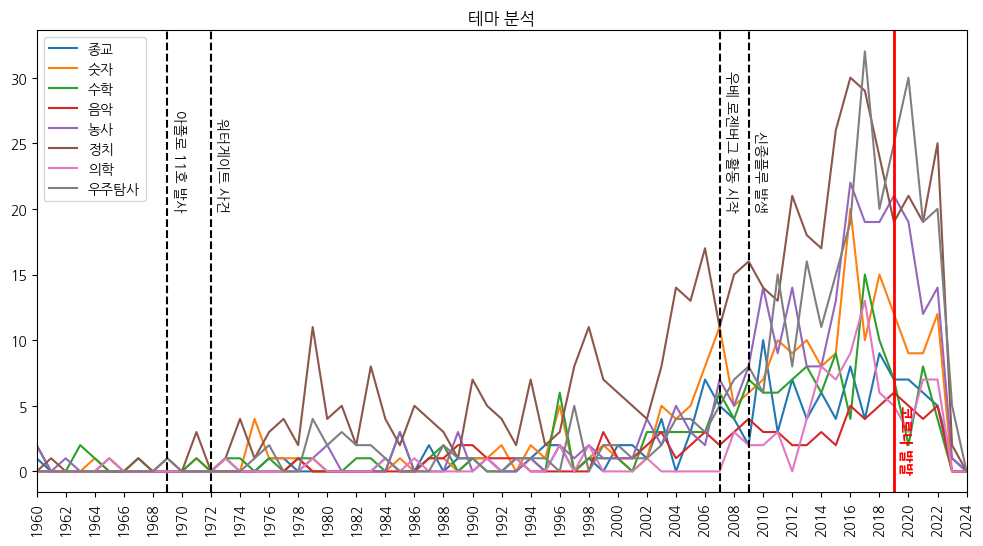

In [142]:
plt.figure(figsize=(12, 6))
plt.title('테마 분석')
plt.plot(domain_df, label = domain_df.columns)
plt.legend()
plt.xticks([2*i for i in range(560,1020)], rotation=90)
plt.axvline(2007, color='black', linestyle = '--')
plt.text(2007.3, 20, '우베 로젠버그 활동 시작', color = 'black', rotation = -90)
plt.axvline(1969, color='black', linestyle = '--')
plt.text(1969.3, 20, '아폴로 11호 발사', color = 'black', rotation = -90)
plt.axvline(1972, color='black', linestyle = '--')
plt.text(1972.3, 20, '워터게이트 사건', color = 'black', rotation = -90)
plt.axvline(2009, color='black', linestyle = '--')
plt.text(2009.3, 20, '신종플루 발생', color = 'black', rotation = -90)
plt.axvline(2019, color='r', linewidth=2)
plt.text(2019.3, 0, '코로나 발발', color = 'red', weight = 'bold', rotation = -90)
plt.xlim([1960, 2024])
plt.show();

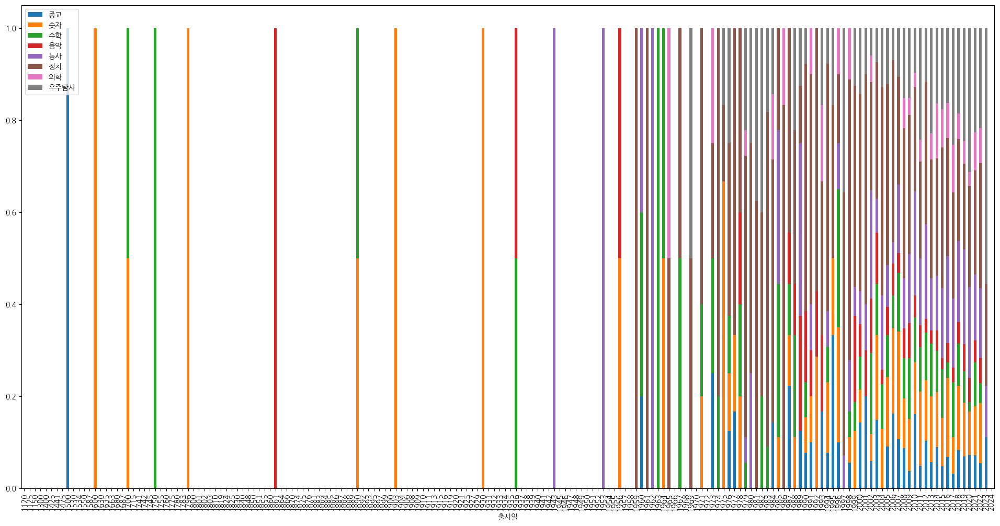

In [143]:
domain_frac_df.plot(kind='bar', stacked = True, figsize=(24, 12))
plt.legend()
plt.show();

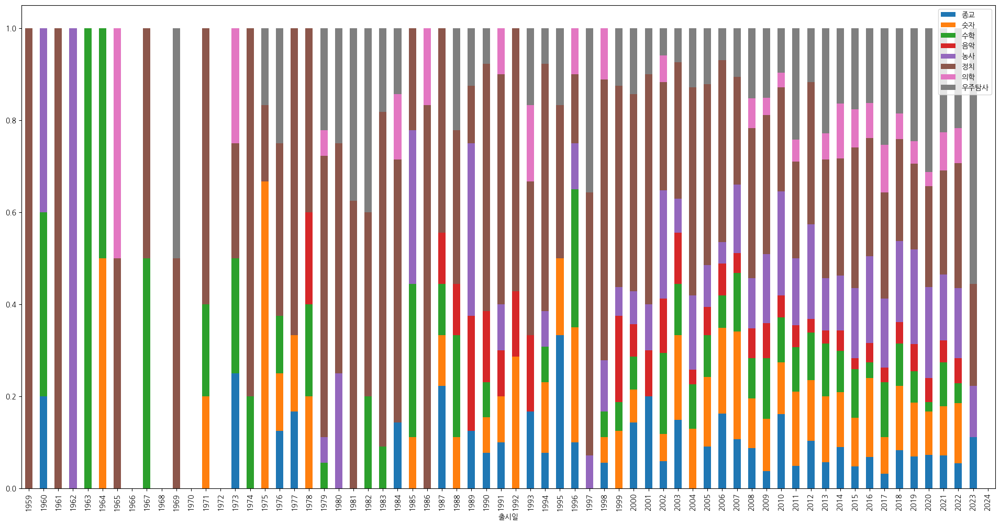

In [144]:
domain_frac_df[domain_frac_df.index>=1959].plot(kind='bar', stacked = True, figsize=(24, 12))
plt.legend()
plt.show();

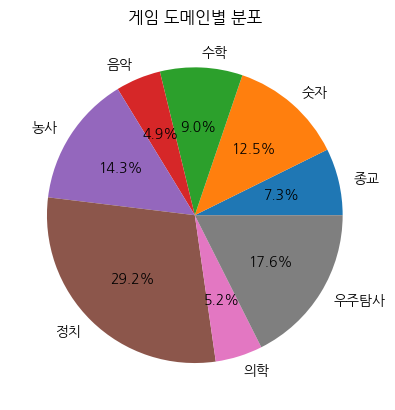

In [145]:
# 파이차트
plt.title("게임 도메인별 분포")
plt.pie(domain_df.sum(), labels=domain_df.columns, autopct='%.1f%%')
plt.show()

In [146]:
domain_df[domain_df == domain_df.max(axis=0)].drop_duplicates()[1:]

,종교,숫자,수학,음악,농사,정치,의학,우주탐사
출시일,,,,,,,,
2010,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016,NaN,20.0,NaN,NaN,22.0,30.0,NaN,NaN
2017,NaN,NaN,15.0,NaN,NaN,NaN,13.0,32.0
2019,NaN,NaN,NaN,6.0,NaN,NaN,NaN,NaN


In [147]:
domain_df['이벤트'] = time_df['이벤트']

for i in range(1580, 1760) :
    add_event(domain_df, i, '근세')
for i in range(1760, 1900) :
    add_event(domain_df, i, '근대')
for i in range(1900, 2025) :
    add_event(domain_df, i, '현대')
    

domain_df.tail()

,종교,숫자,수학,음악,농사,정치,의학,우주탐사,이벤트
출시일,,,,,,,,,
2020,7,9,2,5,19,21,3,30,현대
2021,6,9,8,4,12,19,7,19,현대
2022,5,12,4,5,14,25,7,20,현대
2023,1,0,0,0,1,2,0,5,현대
2024,0,0,0,0,0,0,0,0,현대


In [148]:
domain_column_list = ['종교', '숫자', '수학', '음악', '농사', '정치', '의학', '우주탐사']
bcr.bar_chart_race(df = domain_df[domain_column_list].fillna(0),
                   sort='desc',
                   # img_label_folder="bar_image_labels",
                   period_label={'x': .99, 'y': .25, 'ha': 'right', 'va': 'center'},
                   period_fmt = '{x:.0f}',
                   period_summary_func=lambda v, r: {'x': .99, 'y': .18,
                                      's': f'{domain_df.loc[int(r.name)]["이벤트"]}',
                                      'ha': 'right', 'size': 8},
                   fixed_max = True,
                   bar_kwargs={'alpha': .7},
                   steps_per_period = 4,
                   title = '도메인 분석')

# 진행방식별
['Action Queue', 'Action Retrieval', 'Campaign / Battle Card Driven', 'Card Play Conflict Resolution', 'Communication Limits', 'Cooperative Game', 'Hand Management', 'Income', 'Loans', 'Market', 'Network and Route Building', 'Tech Trees / Tech Tracks', 'Action Points', 'Legacy Game', 'Point to Point Movement', 'Set Collection', 'End Game Bonuses', 'Hexagon Grid', 'Increase Value of Unchosen Resources', 'Open Drafting', 'Action Drafting', 'Area Majority / Influence', 'Area-Impulse', 'Dice Rolling', 'Follow', 'Grid Movement', 'Closed Drafting', 'Contracts', 'Enclosure', 'Critical Hits and Failures', 'Area Movement', 'Delayed Purchase', 'Events', 'Automatic Resource Growth', 'Modular Board', 'Solo / Solitaire Game', 'Deck Bag and Pool Building', 'Force Commitment', 'Auction/Bidding', 'Auction: Dutch', 'Action/Event', 'Advantage Token', 'Ownership', 'Track Movement', 'Variable Set-up', 'Grid Coverage', 'Pattern Building', 'Hidden Roles', 'Layering', 'Sudden Death Ending', 'Tug of War', 'Variable Player Powers', 'Push Your Luck', 'Alliances', 'Once-Per-Game Abilities', 'Map Addition', 'Deck Construction', 'Resource to Move', 'Simultaneous Action Selection', 'Turn Order: Auction', 'Victory Points as a Resource', 'Worker Placement', 'Scenario / Mission / Campaign Game', 'Trick-taking', 'Die Icon Resolution', 'Hidden Victory Points', 'Turn Order: Progressive', 'Tile Placement', 'Turn Order: Claim Action', 'Turn Order: Stat-Based', 'Worker Placement Different Worker Types', 'Pick-up and Deliver', 'Movement Points', 'Bias', 'Auction: Turn Order Until Pass', 'Catch the Leader', 'Flicking', 'Team-Based Game', 'Commodity Speculation', 'Line of Sight', 'Role Playing', 'Investment', 'Narrative Choice / Paragraph', 'Variable Phase Order', 'Race', 'Secret Unit Deployment', 'Take That', 'Chit-Pull System', 'Tags', 'Turn Order: Role Order', 'Player Elimination', 'Constrained Bidding', 'Mancala', 'Highest-Lowest Scoring', 'Rondel', 'Neighbor Scope', 'Memory', 'Auction: Fixed Placement', 'Auction: Multiple Lot', 'Turn Order: Pass Order', 'Targeted Clues', 'Deduction', 'Turn Order: Time Track', 'Connections', 'Worker Placement with Dice Workers', 'Square Grid', 'Auction: Sealed Bid', 'Betting and Bluffing', 'Bingo', 'Line Drawing', 'Paper-and-Pencil', 'Trading', 'Score-and-Reset Game', 'Storytelling', 'Three Dimensional Movement', 'Movement Template', 'Re-rolling and Locking', 'Interrupts', 'Simulation', 'Zone of Control', 'Command Cards', 'Negotiation', 'Prisoners Dilemma', 'Finale Ending', 'Roles with Asymmetric Information', 'Traitor Game', 'I Cut You Choose', 'Hidden Movement', 'Real-Time', 'Random Production', 'Auction: Once Around', 'Closed Economy Auction', 'Bribery', 'Ladder Climbing', 'Predictive Bid', 'Auction: English', 'Minimap Resolution', 'Selection Order Bid', 'Semi-Cooperative Game', 'Voting', 'Programmed Movement', 'Map Reduction', 'Move Through Deck', 'Multi-Use Cards', 'Cube Tower', 'Relative Movement', 'Roll / Spin and Move', 'Melding and Splaying', 'Stat Check Resolution', 'Pattern Recognition', 'Pieces as Map', 'Elapsed Real Time Ending', 'Pattern Movement', 'Static Capture', 'Drawing', 'Stock Holding', 'Acting', 'Singing', 'Auction: Dutch Priority', 'Rock-Paper-Scissors', 'Turn Order: Random', 'Moving Multiple Units', 'King of the Hill', 'Lose a Turn', 'Auction Compensation', 'Multiple Maps', 'Kill Steal', 'Stacking and Balancing', 'Order Counters', 'Chaining', 'Slide/Push', 'Different Dice Movement', 'Measurement Movement', 'Single Loser Game', 'Physical Removal', 'Map Deformation', 'Action Timer', 'Induction', 'Ratio / Combat Results Table', 'Hot Potato', 'nan', 'Speed Matching', 'Player Judge', 'Crayon Rail System', 'Matching', 'Questions and Answers', 'Impulse Movement', 'Auction: Dexterity', 'Ordering', 'Passed Action Token', 'Bids As Wagers']


In [149]:
tmp_list = []
for boardgames in boardgame_df['진행방식'] :
    tmp_list += str(boardgames).replace('\"','').replace("\'",'').replace('[','').replace(']','').split(', ')

mechanics_list = []
for boardgame in tmp_list :
    if boardgame not in mechanics_list :
        mechanics_list.append(boardgame)
        
print(mechanics_list)

['Action Queue', 'Action Retrieval', 'Campaign / Battle Card Driven', 'Card Play Conflict Resolution', 'Communication Limits', 'Cooperative Game', 'Hand Management', 'Income', 'Loans', 'Market', 'Network and Route Building', 'Tech Trees / Tech Tracks', 'Action Points', 'Legacy Game', 'Point to Point Movement', 'Set Collection', 'End Game Bonuses', 'Hexagon Grid', 'Increase Value of Unchosen Resources', 'Open Drafting', 'Action Drafting', 'Area Majority / Influence', 'Area-Impulse', 'Dice Rolling', 'Follow', 'Grid Movement', 'Closed Drafting', 'Contracts', 'Enclosure', 'Critical Hits and Failures', 'Area Movement', 'Delayed Purchase', 'Events', 'Automatic Resource Growth', 'Modular Board', 'Solo / Solitaire Game', 'Deck Bag and Pool Building', 'Force Commitment', 'Auction/Bidding', 'Auction: Dutch', 'Action/Event', 'Advantage Token', 'Ownership', 'Track Movement', 'Variable Set-up', 'Grid Coverage', 'Pattern Building', 'Hidden Roles', 'Layering', 'Sudden Death Ending', 'Tug of War', 'Va

In [150]:
action_queue_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Action Queue' in str(x)))]
action_queue_df['개수'] = 1
action_queue_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
0,Gloomhaven,2017,8.441,8.67,105.98,1,1,4,60,120,3.888553,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",14,NaN,1
6,Gloomhaven: Jaws of the Lion,2020,8.235,8.55,34.99,7,1,4,30,120,3.622762,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",12,NaN,1
27,Root,2018,7.896,8.09,56.95,28,2,4,60,90,3.770681,"Action Queue, Action Retrieval, Area Majority ...","Animals, Fantasy, Wargame",12,NaN,1
62,Mechs vs. Minions,2016,7.687,7.99,199.98,63,2,4,60,120,2.430000,"Action Queue, Bias, Cooperative Game, Dice Rol...","Fantasy, Fighting, Miniatures, Video Game Theme",10,NaN,1
80,Robinson Crusoe: Adventures on the Cursed Island,2012,7.612,7.78,42.50,81,1,4,60,120,3.809705,"Action Queue, Area Movement, Cooperative Game,...","Adventure, Exploration, Fighting, Novel-based,...",12,NaN,1


In [151]:
action_retrievial_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Action Retrieval' in str(x)))]
action_retrievial_df['개수'] = 1
action_retrievial_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
0,Gloomhaven,2017,8.441,8.67,105.98,1,1,4,60,120,3.888553,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",14,NaN,1
6,Gloomhaven: Jaws of the Lion,2020,8.235,8.55,34.99,7,1,4,30,120,3.622762,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",12,NaN,1
9,Spirit Island,2017,8.160,8.37,71.99,10,1,4,90,120,4.055290,"Action Retrieval, Area Majority / Influence, A...","Fantasy, Fighting, Mythology, Territory Building",14,NaN,1
20,Concordia,2013,7.957,8.11,48.43,21,2,5,100,100,3.004170,"Action Retrieval, Advantage Token, Auction: Du...","Ancient, Economic, Nautical",12,NaN,1
27,Root,2018,7.896,8.09,56.95,28,2,4,60,90,3.770681,"Action Queue, Action Retrieval, Area Majority ...","Animals, Fantasy, Wargame",12,NaN,1


In [152]:
campaign_battle_card_driven_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Campaign / Battle Card Driven' in str(x)))]
campaign_battle_card_driven_df['개수'] = 1
campaign_battle_card_driven_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
0,Gloomhaven,2017,8.441,8.67,105.98,1,1,4,60,120,3.888553,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",14,NaN,1
6,Gloomhaven: Jaws of the Lion,2020,8.235,8.55,34.99,7,1,4,30,120,3.622762,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",12,NaN,1
8,War of the Ring: Second Edition,2011,8.164,8.53,72.00,9,2,4,150,180,4.195762,"Area Majority / Influence, Area Movement, Camp...","Adventure, Fantasy, Fighting, Novel-based, Ter...",14,NaN,1
9,Spirit Island,2017,8.160,8.37,71.99,10,1,4,90,120,4.055290,"Action Retrieval, Area Majority / Influence, A...","Fantasy, Fighting, Mythology, Territory Building",14,NaN,1
13,Twilight Struggle,2005,8.091,8.26,53.47,14,2,2,120,180,3.601536,"Action/Event, Advantage Token, Area Majority /...","Modern Warfare, Political, Wargame",14,NaN,1


In [153]:
card_play_conflict_resolution_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('ard Play Conflict Resolution' in str(x)))]
card_play_conflict_resolution_df['개수'] = 1
card_play_conflict_resolution_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
0,Gloomhaven,2017,8.441,8.67,105.98,1,1,4,60,120,3.888553,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",14,NaN,1
7,Star Wars: Rebellion,2016,8.166,8.42,95.52,8,2,4,180,240,3.735323,"Area Majority / Influence, Area Movement, Area...","Civil War, Miniatures, Movies / TV / Radio the...",12,NaN,1
8,War of the Ring: Second Edition,2011,8.164,8.53,72.00,9,2,4,150,180,4.195762,"Area Majority / Influence, Area Movement, Camp...","Adventure, Fantasy, Fighting, Novel-based, Ter...",14,NaN,1
11,Dune: Imperium,2020,8.126,8.37,52.93,12,1,4,60,120,3.005854,"Card Play Conflict Resolution, Deck Bag and Po...","Movies / TV / Radio theme, Novel-based, Politi...",12,NaN,1
15,Scythe,2016,8.031,8.18,55.96,16,1,5,90,115,3.435233,"Card Play Conflict Resolution, Contracts, End ...","Economic, Fighting, Science Fiction, Territory...",12,NaN,1


In [154]:
communication_limits_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Communication Limits' in str(x)))]
communication_limits_df['개수'] = 1
communication_limits_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
0,Gloomhaven,2017,8.441,8.67,105.98,1,1,4,60,120,3.888553,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",14,NaN,1
6,Gloomhaven: Jaws of the Lion,2020,8.235,8.55,34.99,7,1,4,30,120,3.622762,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",12,NaN,1
26,Arkham Horror: The Card Game,2016,7.915,8.15,35.96,27,1,2,60,120,3.518400,"Action Points, Area Movement, Communication Li...","Adventure, Card Game, Collectible Components, ...",14,NaN,1
35,The Crew: Mission Deep Sea,2021,7.816,8.28,14.95,36,2,5,20,20,2.045977,"Communication Limits, Cooperative Game, Hand M...","Card Game, Nautical, Science Fiction",10,NaN,1
53,The Crew: The Quest for Planet Nine,2019,7.720,7.88,10.89,54,2,5,20,20,1.975291,"Communication Limits, Cooperative Game, Hand M...","Card Game, Science Fiction, Space Exploration",10,NaN,1


In [155]:
cooperative_game_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Cooperative Game' in str(x)))]
cooperative_game_df['개수'] = 1
cooperative_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
0,Gloomhaven,2017,8.441,8.67,105.98,1,1,4,60,120,3.888553,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",14,NaN,1
2,Pandemic Legacy: Season 1,2015,8.411,8.57,68.21,3,2,4,60,60,2.832465,"Action Points, Cooperative Game, Hand Manageme...","Environmental, Medical",12,NaN,1
6,Gloomhaven: Jaws of the Lion,2020,8.235,8.55,34.99,7,1,4,30,120,3.622762,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",12,NaN,1
9,Spirit Island,2017,8.160,8.37,71.99,10,1,4,90,120,4.055290,"Action Retrieval, Area Majority / Influence, A...","Fantasy, Fighting, Mythology, Territory Building",14,NaN,1
17,Nemesis,2018,7.984,8.33,111.35,18,1,5,90,180,3.415116,"Campaign / Battle Card Driven, Cooperative Gam...","Adventure, Horror, Miniatures, Science Fiction",14,NaN,1


In [156]:
hand_management_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Hand Management' in str(x)))]
hand_management_df['개수'] = 1
hand_management_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1,Brass: Birmingham,2018,8.434,8.65,247.97,2,2,4,60,120,3.897451,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
2,Pandemic Legacy: Season 1,2015,8.411,8.57,68.21,3,2,4,60,60,2.832465,"Action Points, Cooperative Game, Hand Manageme...","Environmental, Medical",12,NaN,1
3,Ark Nova,2021,8.291,8.57,62.99,4,1,4,90,150,3.710414,"End Game Bonuses, Hand Management, Hexagon Gri...","Animals, Economic, Environmental",12,NaN,1
5,Terraforming Mars,2016,8.246,8.39,56.98,6,1,5,120,120,3.255590,"Closed Drafting, Contracts, Enclosure, End Gam...","Economic, Environmental, Industry / Manufactur...",12,NaN,1
9,Spirit Island,2017,8.160,8.37,71.99,10,1,4,90,120,4.055290,"Action Retrieval, Area Majority / Influence, A...","Fantasy, Fighting, Mythology, Territory Building",14,NaN,1


In [157]:
income_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Income' in str(x)))]
income_df['개수'] = 1
income_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1,Brass: Birmingham,2018,8.434,8.65,247.97,2,2,4,60,120,3.897451,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
3,Ark Nova,2021,8.291,8.57,62.99,4,1,4,90,150,3.710414,"End Game Bonuses, Hand Management, Hexagon Gri...","Animals, Economic, Environmental",12,NaN,1
10,Gaia Project,2017,8.155,8.43,82.01,11,1,4,60,150,4.386473,"End Game Bonuses, Hexagon Grid, Income, Modula...","Civilization, Economic, Miniatures, Science Fi...",14,NaN,1
12,Through the Ages: A New Story of Civilization,2015,8.104,8.33,57.88,13,2,4,120,120,4.425939,"Action Points, Auction/Bidding, Auction: Dutch...","Card Game, Civilization, Economic",14,NaN,1
19,Brass: Lancashire,2007,7.967,8.19,66.00,20,2,4,60,120,3.858779,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1


In [158]:
loans_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Loans' in str(x)))]
loans_df['개수'] = 1
loans_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1,Brass: Birmingham,2018,8.434,8.65,247.97,2,2,4,60,120,3.897451,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
19,Brass: Lancashire,2007,7.967,8.19,66.00,20,2,4,60,120,3.858779,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
60,Le Havre,2008,7.695,7.86,174.99,61,1,5,30,150,3.731003,"Automatic Resource Growth, End Game Bonuses, I...","City Building, Economic, Industry / Manufactur...",12,NaN,1
125,Age of Steam,2002,7.450,7.81,NaN,126,1,6,120,120,3.891641,"Auction/Bidding, Catch the Leader, Connections...","Economic, Trains, Transportation",14,NaN,1
170,Railways of the World,2005,7.356,7.67,149.99,171,2,6,120,120,3.018222,"Action Points, Connections, End Game Bonuses, ...","Trains, Transportation, Video Game Theme",12,NaN,1


In [159]:
market_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Market' in str(x)))]
market_df['개수'] = 1
market_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1,Brass: Birmingham,2018,8.434,8.65,247.97,2,2,4,60,120,3.897451,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
19,Brass: Lancashire,2007,7.967,8.19,66.00,20,2,4,60,120,3.858779,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
34,Food Chain Magnate,2015,7.823,8.09,183.95,35,2,5,120,240,4.209989,"Deck Bag and Pool Building, Delayed Purchase, ...","Economic, Industry / Manufacturing",14,NaN,1
52,Power Grid,2004,7.720,7.83,39.64,53,2,6,120,120,3.258383,"Auction/Bidding, Auction: Turn Order Until Pas...","Economic, Industry / Manufacturing",12,NaN,1
57,Clans of Caledonia,2017,7.702,7.96,NaN,58,1,4,30,120,3.463514,"Commodity Speculation, Contracts, Market, Modu...","Economic, Farming",12,NaN,1


In [160]:
network_and_route_building_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Network and Route Building' in str(x)))]
network_and_route_building_df['개수'] = 1
network_and_route_building_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1,Brass: Birmingham,2018,8.434,8.65,247.97,2,2,4,60,120,3.897451,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
10,Gaia Project,2017,8.155,8.43,82.01,11,1,4,60,150,4.386473,"End Game Bonuses, Hexagon Grid, Income, Modula...","Civilization, Economic, Miniatures, Science Fi...",14,NaN,1
19,Brass: Lancashire,2007,7.967,8.19,66.00,20,2,4,60,120,3.858779,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
23,Terra Mystica,2012,7.935,8.09,67.75,24,2,5,60,150,3.971986,"End Game Bonuses, Hexagon Grid, Income, Increa...","Civilization, Economic, Fantasy, Territory Bui...",12,NaN,1
33,Barrage,2019,7.837,8.20,89.99,34,1,4,60,120,4.086250,"Contracts, End Game Bonuses, Income, Network a...","Economic, Environmental, Industry / Manufacturing",14,NaN,1


In [161]:
tech_trees_tech_tracks_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Tech Trees / Tech Tracks' in str(x)))]
tech_trees_tech_tracks_df['개수'] = 1
tech_trees_tech_tracks_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1,Brass: Birmingham,2018,8.434,8.65,247.97,2,2,4,60,120,3.897451,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
19,Brass: Lancashire,2007,7.967,8.19,66.00,20,2,4,60,120,3.858779,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
23,Terra Mystica,2012,7.935,8.09,67.75,24,2,5,60,150,3.971986,"End Game Bonuses, Hexagon Grid, Income, Increa...","Civilization, Economic, Fantasy, Territory Bui...",12,NaN,1
88,Beyond the Sun,2020,7.568,7.97,69.30,89,2,4,60,120,3.108025,"Action Drafting, Area Majority / Influence, Co...","Science Fiction, Space Exploration",12,NaN,1
108,Russian Railroads,2013,7.507,7.75,229.99,109,2,4,90,120,3.405797,"End Game Bonuses, Tech Trees / Tech Tracks, Tu...","Industry / Manufacturing, Trains",12,NaN,1


In [162]:
action_points_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Action Points' in str(x)))]
action_points_df['개수'] = 1
action_points_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
2,Pandemic Legacy: Season 1,2015,8.411,8.57,68.21,3,2,4,60,60,2.832465,"Action Points, Cooperative Game, Hand Manageme...","Environmental, Medical",12,NaN,1
12,Through the Ages: A New Story of Civilization,2015,8.104,8.33,57.88,13,2,4,120,120,4.425939,"Action Points, Auction/Bidding, Auction: Dutch...","Card Game, Civilization, Economic",14,NaN,1
26,Arkham Horror: The Card Game,2016,7.915,8.15,35.96,27,1,2,60,120,3.518400,"Action Points, Area Movement, Communication Li...","Adventure, Card Game, Collectible Components, ...",14,NaN,1
39,Pax Pamir: Second Edition,2019,7.804,8.29,139.95,40,1,5,45,120,3.845401,"Action Points, Area Majority / Influence, Area...","Economic, Educational, Negotiation, Political,...",14,NaN,1
41,Blood Rage,2015,7.792,7.96,89.99,42,2,4,60,90,2.876543,"Action Points, Area Majority / Influence, Area...","Fantasy, Fighting, Miniatures, Mythology",12,NaN,1


In [163]:
legacy_game_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Legacy Game' in str(x)))]
legacy_game_df['개수'] = 1
legacy_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
2,Pandemic Legacy: Season 1,2015,8.411,8.57,68.21,3,2,4,60,60,2.832465,"Action Points, Cooperative Game, Hand Manageme...","Environmental, Medical",12,NaN,1
25,Clank!: Legacy – Acquisitions Incorporated,2019,7.933,8.60,NaN,26,2,4,90,120,2.739130,"Deck Bag and Pool Building, Delayed Purchase, ...","Adventure, Fantasy, Miniatures",10,NaN,1
46,Pandemic Legacy: Season 2,2017,7.748,8.06,53.82,47,2,4,60,60,3.256228,"Cooperative Game, Hand Management, Legacy Game...","Environmental, Exploration, Medical, Science F...",12,NaN,1
54,Pandemic Legacy: Season 0,2020,7.719,8.49,66.73,55,2,4,45,60,3.127119,"Action Points, Cooperative Game, Hand Manageme...",Spies/Secret Agents,12,NaN,1
223,My City,2020,7.266,7.72,29.74,224,2,4,30,30,2.000000,"Bingo, Catch the Leader, Enclosure, Grid Cover...",City Building,8,NaN,1


In [164]:
point_to_point_movement_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Point to Point Movement' in str(x)))]
point_to_point_movement_df['개수'] = 1
point_to_point_movement_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
2,Pandemic Legacy: Season 1,2015,8.411,8.57,68.21,3,2,4,60,60,2.832465,"Action Points, Cooperative Game, Hand Manageme...","Environmental, Medical",12,NaN,1
29,Orléans,2014,7.879,8.07,52.99,30,2,4,90,90,3.032325,"Contracts, Deck Bag and Pool Building, End Gam...","Medieval, Religious, Travel",12,NaN,1
46,Pandemic Legacy: Season 2,2017,7.748,8.06,53.82,47,2,4,60,60,3.256228,"Cooperative Game, Hand Management, Legacy Game...","Environmental, Exploration, Medical, Science F...",12,NaN,1
54,Pandemic Legacy: Season 0,2020,7.719,8.49,66.73,55,2,4,45,60,3.127119,"Action Points, Cooperative Game, Hand Manageme...",Spies/Secret Agents,12,NaN,1
81,The Voyages of Marco Polo,2015,7.609,7.81,NaN,82,2,4,40,100,3.188818,"Contracts, Dice Rolling, Point to Point Moveme...","Dice, Economic, Medieval, Travel",12,NaN,1


In [165]:
set_collection_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Set Collection' in str(x)))]
set_collection_df['개수'] = 1
set_collection_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
2,Pandemic Legacy: Season 1,2015,8.411,8.57,68.21,3,2,4,60,60,2.832465,"Action Points, Cooperative Game, Hand Manageme...","Environmental, Medical",12,NaN,1
14,Great Western Trail,2016,8.085,8.25,44.95,15,2,4,75,150,3.702259,"Deck Bag and Pool Building, Hand Management, O...","American West, Animals, Economic",12,NaN,1
16,The Castles of Burgundy,2011,8.005,8.13,39.45,17,2,4,30,90,2.993038,"Dice Rolling, End Game Bonuses, Grid Coverage,...","Dice, Medieval, Territory Building",12,NaN,1
18,7 Wonders Duel,2015,7.975,8.10,34.97,19,2,2,30,30,2.223710,"Layering, Open Drafting, Set Collection, Sudde...","Ancient, Card Game, City Building, Civilizatio...",10,NaN,1
45,Great Western Trail (Second Edition),2021,7.763,8.47,51.96,46,1,4,75,150,3.705882,"Deck Bag and Pool Building, Hand Management, O...","American West, Animals, Economic",12,NaN,1


In [166]:
end_game_bonuses_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('End Game Bonuses' in str(x)))]
end_game_bonuses_df['개수'] = 1
end_game_bonuses_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
3,Ark Nova,2021,8.291,8.57,62.99,4,1,4,90,150,3.710414,"End Game Bonuses, Hand Management, Hexagon Gri...","Animals, Economic, Environmental",12,NaN,1
5,Terraforming Mars,2016,8.246,8.39,56.98,6,1,5,120,120,3.255590,"Closed Drafting, Contracts, Enclosure, End Gam...","Economic, Environmental, Industry / Manufactur...",12,NaN,1
10,Gaia Project,2017,8.155,8.43,82.01,11,1,4,60,150,4.386473,"End Game Bonuses, Hexagon Grid, Income, Modula...","Civilization, Economic, Miniatures, Science Fi...",14,NaN,1
15,Scythe,2016,8.031,8.18,55.96,16,1,5,90,115,3.435233,"Card Play Conflict Resolution, Contracts, End ...","Economic, Fighting, Science Fiction, Territory...",12,NaN,1
16,The Castles of Burgundy,2011,8.005,8.13,39.45,17,2,4,30,90,2.993038,"Dice Rolling, End Game Bonuses, Grid Coverage,...","Dice, Medieval, Territory Building",12,NaN,1


In [167]:
hexagon_grid_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Hexagon Grid' in str(x)))]
hexagon_grid_df['개수'] = 1
hexagon_grid_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
3,Ark Nova,2021,8.291,8.57,62.99,4,1,4,90,150,3.710414,"End Game Bonuses, Hand Management, Hexagon Gri...","Animals, Economic, Environmental",12,NaN,1
5,Terraforming Mars,2016,8.246,8.39,56.98,6,1,5,120,120,3.255590,"Closed Drafting, Contracts, Enclosure, End Gam...","Economic, Environmental, Industry / Manufactur...",12,NaN,1
10,Gaia Project,2017,8.155,8.43,82.01,11,1,4,60,150,4.386473,"End Game Bonuses, Hexagon Grid, Income, Modula...","Civilization, Economic, Miniatures, Science Fi...",14,NaN,1
15,Scythe,2016,8.031,8.18,55.96,16,1,5,90,115,3.435233,"Card Play Conflict Resolution, Contracts, End ...","Economic, Fighting, Science Fiction, Territory...",12,NaN,1
16,The Castles of Burgundy,2011,8.005,8.13,39.45,17,2,4,30,90,2.993038,"Dice Rolling, End Game Bonuses, Grid Coverage,...","Dice, Medieval, Territory Building",12,NaN,1


In [168]:
increase_value_of_unchosen_resources_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Increase Value of Unchosen Resources' in str(x)))]
increase_value_of_unchosen_resources_df['개수'] = 1
increase_value_of_unchosen_resources_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
3,Ark Nova,2021,8.291,8.57,62.99,4,1,4,90,150,3.710414,"End Game Bonuses, Hand Management, Hexagon Gri...","Animals, Economic, Environmental",12,NaN,1
11,Dune: Imperium,2020,8.126,8.37,52.93,12,1,4,60,120,3.005854,"Card Play Conflict Resolution, Deck Bag and Po...","Movies / TV / Radio theme, Novel-based, Politi...",12,NaN,1
23,Terra Mystica,2012,7.935,8.09,67.75,24,2,5,60,150,3.971986,"End Game Bonuses, Hexagon Grid, Income, Increa...","Civilization, Economic, Fantasy, Territory Bui...",12,NaN,1
38,Puerto Rico,2002,7.807,7.94,126.43,39,3,5,90,150,3.273645,"Action Drafting, End Game Bonuses, Follow, Hid...","City Building, Economic, Farming",12,NaN,1
39,Pax Pamir: Second Edition,2019,7.804,8.29,139.95,40,1,5,45,120,3.845401,"Action Points, Area Majority / Influence, Area...","Economic, Educational, Negotiation, Political,...",14,NaN,1


In [169]:
open_drafting_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Open Drafting' in str(x)))]
open_drafting_df['개수'] = 1
open_drafting_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
3,Ark Nova,2021,8.291,8.57,62.99,4,1,4,90,150,3.710414,"End Game Bonuses, Hand Management, Hexagon Gri...","Animals, Economic, Environmental",12,NaN,1
11,Dune: Imperium,2020,8.126,8.37,52.93,12,1,4,60,120,3.005854,"Card Play Conflict Resolution, Deck Bag and Po...","Movies / TV / Radio theme, Novel-based, Politi...",12,NaN,1
12,Through the Ages: A New Story of Civilization,2015,8.104,8.33,57.88,13,2,4,120,120,4.425939,"Action Points, Auction/Bidding, Auction: Dutch...","Card Game, Civilization, Economic",14,NaN,1
18,7 Wonders Duel,2015,7.975,8.10,34.97,19,2,2,30,30,2.223710,"Layering, Open Drafting, Set Collection, Sudde...","Ancient, Card Game, City Building, Civilizatio...",10,NaN,1
24,Wingspan,2019,7.934,8.08,38.81,25,1,5,40,70,2.448806,"Contracts, Dice Rolling, End Game Bonuses, Han...","Animals, Card Game, Educational",10,NaN,1


In [170]:
action_drafting_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Action Drafting' in str(x)))]
action_drafting_df['개수'] = 1
action_drafting_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
4,Twilight Imperium: Fourth Edition,2017,8.251,8.64,121.43,5,3,6,240,480,4.293668,"Action Drafting, Area Majority / Influence, Ar...","Civilization, Economic, Exploration, Negotiati...",14,NaN,1
38,Puerto Rico,2002,7.807,7.94,126.43,39,3,5,90,150,3.273645,"Action Drafting, End Game Bonuses, Follow, Hid...","City Building, Economic, Farming",12,NaN,1
70,Grand Austria Hotel,2015,7.645,7.91,64.99,71,2,4,60,120,3.216833,"Action Drafting, Contracts, Dice Rolling, End ...","Card Game, Dice, Economic",12,NaN,1
88,Beyond the Sun,2020,7.568,7.97,69.30,89,2,4,60,120,3.108025,"Action Drafting, Area Majority / Influence, Co...","Science Fiction, Space Exploration",12,NaN,1
89,El Grande,1995,7.561,7.74,NaN,90,2,5,60,120,3.041532,"Action Drafting, Area Majority / Influence, Ar...","Medieval, Renaissance",12,NaN,1


In [171]:
area_majority_influence_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Area Majority / Influence' in str(x)))]
area_majority_influence_df['개수'] = 1
area_majority_influence_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
4,Twilight Imperium: Fourth Edition,2017,8.251,8.64,121.43,5,3,6,240,480,4.293668,"Action Drafting, Area Majority / Influence, Ar...","Civilization, Economic, Exploration, Negotiati...",14,NaN,1
7,Star Wars: Rebellion,2016,8.166,8.42,95.52,8,2,4,180,240,3.735323,"Area Majority / Influence, Area Movement, Area...","Civil War, Miniatures, Movies / TV / Radio the...",12,NaN,1
8,War of the Ring: Second Edition,2011,8.164,8.53,72.00,9,2,4,150,180,4.195762,"Area Majority / Influence, Area Movement, Camp...","Adventure, Fantasy, Fighting, Novel-based, Ter...",14,NaN,1
9,Spirit Island,2017,8.160,8.37,71.99,10,1,4,90,120,4.055290,"Action Retrieval, Area Majority / Influence, A...","Fantasy, Fighting, Mythology, Territory Building",14,NaN,1
13,Twilight Struggle,2005,8.091,8.26,53.47,14,2,2,120,180,3.601536,"Action/Event, Advantage Token, Area Majority /...","Modern Warfare, Political, Wargame",14,NaN,1


In [172]:
area_impulse_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Area-Impulse' in str(x)))]
area_impulse_df['개수'] = 1
area_impulse_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
4,Twilight Imperium: Fourth Edition,2017,8.251,8.64,121.43,5,3,6,240,480,4.293668,"Action Drafting, Area Majority / Influence, Ar...","Civilization, Economic, Exploration, Negotiati...",14,NaN,1
7,Star Wars: Rebellion,2016,8.166,8.42,95.52,8,2,4,180,240,3.735323,"Area Majority / Influence, Area Movement, Area...","Civil War, Miniatures, Movies / TV / Radio the...",12,NaN,1
22,Eclipse: Second Dawn for the Galaxy,2020,7.945,8.54,175.00,23,2,6,60,200,3.602857,"Alliances, Area Majority / Influence, Area Mov...","Civilization, Science Fiction, Space Explorati...",12,NaN,1
103,Twilight Imperium: Third Edition,2005,7.525,7.81,178.95,104,3,6,180,240,4.255309,"Action Points, Area-Impulse, Dice Rolling, Fol...","Civilization, Negotiation, Political, Science ...",14,NaN,1
990,"Warhammer 40,000: Conquest",2014,6.581,7.36,199.99,992,2,2,30,60,3.036496,"Area Majority / Influence, Area-Impulse, Hand ...","Card Game, Collectible Components, Fighting",12,NaN,1


In [173]:
dice_rolling_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Dice Rolling' in str(x)))]
dice_rolling_df['개수'] = 1
dice_rolling_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
4,Twilight Imperium: Fourth Edition,2017,8.251,8.64,121.43,5,3,6,240,480,4.293668,"Action Drafting, Area Majority / Influence, Ar...","Civilization, Economic, Exploration, Negotiati...",14,NaN,1
8,War of the Ring: Second Edition,2011,8.164,8.53,72.00,9,2,4,150,180,4.195762,"Area Majority / Influence, Area Movement, Camp...","Adventure, Fantasy, Fighting, Novel-based, Ter...",14,NaN,1
13,Twilight Struggle,2005,8.091,8.26,53.47,14,2,2,120,180,3.601536,"Action/Event, Advantage Token, Area Majority /...","Modern Warfare, Political, Wargame",14,NaN,1
16,The Castles of Burgundy,2011,8.005,8.13,39.45,17,2,4,30,90,2.993038,"Dice Rolling, End Game Bonuses, Grid Coverage,...","Dice, Medieval, Territory Building",12,NaN,1
17,Nemesis,2018,7.984,8.33,111.35,18,1,5,90,180,3.415116,"Campaign / Battle Card Driven, Cooperative Gam...","Adventure, Horror, Miniatures, Science Fiction",14,NaN,1


In [174]:
follow_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Follow' in str(x)))]
follow_df['개수'] = 1
follow_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
4,Twilight Imperium: Fourth Edition,2017,8.251,8.64,121.43,5,3,6,240,480,4.293668,"Action Drafting, Area Majority / Influence, Ar...","Civilization, Economic, Exploration, Negotiati...",14,NaN,1
38,Puerto Rico,2002,7.807,7.94,126.43,39,3,5,90,150,3.273645,"Action Drafting, End Game Bonuses, Follow, Hid...","City Building, Economic, Farming",12,NaN,1
72,Race for the Galaxy,2007,7.641,7.75,27.67,73,2,4,30,60,2.988190,"Follow, Hand Management, Set Collection, Simul...","Card Game, Civilization, Economic, Science Fic...",12,NaN,1
103,Twilight Imperium: Third Edition,2005,7.525,7.81,178.95,104,3,6,180,240,4.255309,"Action Points, Area-Impulse, Dice Rolling, Fol...","Civilization, Negotiation, Political, Science ...",14,NaN,1
118,Roll for the Galaxy,2014,7.470,7.62,42.53,119,2,5,45,45,2.775354,"Action Retrieval, Contracts, Deck Bag and Pool...","Civilization, Dice, Economic, Science Fiction,...",10,NaN,1


In [175]:
grid_movement_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Grid Movement' in str(x)))]
grid_movement_df['개수'] = 1
grid_movement_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
4,Twilight Imperium: Fourth Edition,2017,8.251,8.64,121.43,5,3,6,240,480,4.293668,"Action Drafting, Area Majority / Influence, Ar...","Civilization, Economic, Exploration, Negotiati...",14,NaN,1
15,Scythe,2016,8.031,8.18,55.96,16,1,5,90,115,3.435233,"Card Play Conflict Resolution, Contracts, End ...","Economic, Fighting, Science Fiction, Territory...",12,NaN,1
32,Mage Knight Board Game,2011,7.865,8.09,79.99,33,1,4,60,240,4.342890,"Cooperative Game, Deck Bag and Pool Building, ...","Adventure, Exploration, Fantasy, Fighting",14,NaN,1
58,Star Wars: Imperial Assault,2014,7.697,7.98,109.99,59,1,5,60,120,3.301462,"Dice Rolling, Die Icon Resolution, Grid Moveme...","Adventure, Exploration, Fighting, Miniatures, ...",12,NaN,1
59,Kingdom Death: Monster,2015,7.696,8.54,NaN,60,1,4,60,180,4.259965,"Cooperative Game, Critical Hits and Failures, ...","Adventure, Fantasy, Horror, Mature / Adult, Mi...",18,NaN,1


In [176]:
closed_drafting_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Closed Drafting' in str(x)))]
closed_drafting_df['개수'] = 1
closed_drafting_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
5,Terraforming Mars,2016,8.246,8.39,56.98,6,1,5,120,120,3.255590,"Closed Drafting, Contracts, Enclosure, End Gam...","Economic, Environmental, Industry / Manufactur...",12,NaN,1
41,Blood Rage,2015,7.792,7.96,89.99,42,2,4,60,90,2.876543,"Action Points, Area Majority / Influence, Area...","Fantasy, Fighting, Miniatures, Mythology",12,NaN,1
43,Agricola,2007,7.779,7.90,59.69,44,1,5,30,150,3.637022,"Automatic Resource Growth, Closed Drafting, En...","Animals, Economic, Farming",12,NaN,1
48,On Mars,2020,7.747,8.23,129.99,49,1,4,90,150,4.668929,"Closed Drafting, Contracts, Delayed Purchase, ...","City Building, Economic, Exploration, Science ...",14,NaN,1
76,Agricola (Revised Edition),2016,7.630,7.97,59.69,77,1,4,30,120,3.488934,"Enclosure, Hand Management, Worker Placement, ...","Animals, Economic, Farming",12,NaN,1


In [177]:
contracts_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Contracts' in str(x)))]
contracts_df['개수'] = 1
contracts_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
5,Terraforming Mars,2016,8.246,8.39,56.98,6,1,5,120,120,3.255590,"Closed Drafting, Contracts, Enclosure, End Gam...","Economic, Environmental, Industry / Manufactur...",12,NaN,1
7,Star Wars: Rebellion,2016,8.166,8.42,95.52,8,2,4,180,240,3.735323,"Area Majority / Influence, Area Movement, Area...","Civil War, Miniatures, Movies / TV / Radio the...",12,NaN,1
15,Scythe,2016,8.031,8.18,55.96,16,1,5,90,115,3.435233,"Card Play Conflict Resolution, Contracts, End ...","Economic, Fighting, Science Fiction, Territory...",12,NaN,1
24,Wingspan,2019,7.934,8.08,38.81,25,1,5,40,70,2.448806,"Contracts, Dice Rolling, End Game Bonuses, Han...","Animals, Card Game, Educational",10,NaN,1
28,Lost Ruins of Arnak,2020,7.886,8.09,39.99,29,1,4,30,120,2.889662,"Contracts, Deck Bag and Pool Building, Once-Pe...","Adventure, Exploration, Travel",10,NaN,1


In [178]:
enclosure_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Enclosure' in str(x)))]
enclosure_df['개수'] = 1
enclosure_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
5,Terraforming Mars,2016,8.246,8.39,56.98,6,1,5,120,120,3.255590,"Closed Drafting, Contracts, Enclosure, End Gam...","Economic, Environmental, Industry / Manufactur...",12,NaN,1
43,Agricola,2007,7.779,7.90,59.69,44,1,5,30,150,3.637022,"Automatic Resource Growth, Closed Drafting, En...","Animals, Economic, Farming",12,NaN,1
76,Agricola (Revised Edition),2016,7.630,7.97,59.69,77,1,4,30,120,3.488934,"Enclosure, Hand Management, Worker Placement, ...","Animals, Economic, Farming",12,NaN,1
140,Praga Caput Regni,2020,7.418,7.98,55.14,141,1,4,45,150,3.747059,"Area Majority / Influence, Enclosure, End Game...","City Building, Medieval, Puzzle",12,NaN,1
190,Calico,2020,7.317,7.62,NaN,191,1,4,30,45,2.176471,"Enclosure, End Game Bonuses, Hexagon Grid, Ope...","Animals, Puzzle",10,NaN,1


In [179]:
critical_hits_and_failures_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Critical Hits and Failures' in str(x)))]
critical_hits_and_failures_df['개수'] = 1
critical_hits_and_failures_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
6,Gloomhaven: Jaws of the Lion,2020,8.235,8.55,34.99,7,1,4,30,120,3.622762,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",12,NaN,1
22,Eclipse: Second Dawn for the Galaxy,2020,7.945,8.54,175.00,23,2,6,60,200,3.602857,"Alliances, Area Majority / Influence, Area Mov...","Civilization, Science Fiction, Space Explorati...",12,NaN,1
59,Kingdom Death: Monster,2015,7.696,8.54,NaN,60,1,4,60,180,4.259965,"Cooperative Game, Critical Hits and Failures, ...","Adventure, Fantasy, Horror, Mature / Adult, Mi...",18,NaN,1
143,Star Wars: X-Wing Miniatures Game,2012,7.413,7.65,48.98,144,2,2,30,45,2.494303,"Action Queue, Critical Hits and Failures, Dice...","Aviation / Flight, Bluffing, Collectible Compo...",10,NaN,1
334,Star Wars: Armada,2015,7.108,7.83,91.55,335,2,2,120,120,3.153153,"Action Queue, Critical Hits and Failures, Dice...","Collectible Components, Miniatures, Movies / T...",12,NaN,1


In [180]:
area_movement_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Area Movement' in str(x)))]
area_movement_df['개수'] = 1
area_movement_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
7,Star Wars: Rebellion,2016,8.166,8.42,95.52,8,2,4,180,240,3.735323,"Area Majority / Influence, Area Movement, Area...","Civil War, Miniatures, Movies / TV / Radio the...",12,NaN,1
8,War of the Ring: Second Edition,2011,8.164,8.53,72.00,9,2,4,150,180,4.195762,"Area Majority / Influence, Area Movement, Camp...","Adventure, Fantasy, Fighting, Novel-based, Ter...",14,NaN,1
22,Eclipse: Second Dawn for the Galaxy,2020,7.945,8.54,175.00,23,2,6,60,200,3.602857,"Alliances, Area Majority / Influence, Area Mov...","Civilization, Science Fiction, Space Explorati...",12,NaN,1
26,Arkham Horror: The Card Game,2016,7.915,8.15,35.96,27,1,2,60,120,3.518400,"Action Points, Area Movement, Communication Li...","Adventure, Card Game, Collectible Components, ...",14,NaN,1
27,Root,2018,7.896,8.09,56.95,28,2,4,60,90,3.770681,"Action Queue, Action Retrieval, Area Majority ...","Animals, Fantasy, Wargame",12,NaN,1


In [181]:
delayed_purchase_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Delayed Purchase' in str(x)))]
delayed_purchase_df['개수'] = 1
delayed_purchase_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
7,Star Wars: Rebellion,2016,8.166,8.42,95.52,8,2,4,180,240,3.735323,"Area Majority / Influence, Area Movement, Area...","Civil War, Miniatures, Movies / TV / Radio the...",12,NaN,1
25,Clank!: Legacy – Acquisitions Incorporated,2019,7.933,8.60,NaN,26,2,4,90,120,2.739130,"Deck Bag and Pool Building, Delayed Purchase, ...","Adventure, Fantasy, Miniatures",10,NaN,1
34,Food Chain Magnate,2015,7.823,8.09,183.95,35,2,5,120,240,4.209989,"Deck Bag and Pool Building, Delayed Purchase, ...","Economic, Industry / Manufacturing",14,NaN,1
48,On Mars,2020,7.747,8.23,129.99,49,1,4,90,150,4.668929,"Closed Drafting, Contracts, Delayed Purchase, ...","City Building, Economic, Exploration, Science ...",14,NaN,1
61,The Quacks of Quedlinburg,2018,7.695,7.84,49.99,62,2,4,45,45,1.947589,"Catch the Leader, Deck Bag and Pool Building, ...",Medieval,8,NaN,1


In [182]:
events_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Events' in str(x)))]
events_df['개수'] = 1
events_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
8,War of the Ring: Second Edition,2011,8.164,8.53,72.00,9,2,4,150,180,4.195762,"Area Majority / Influence, Area Movement, Camp...","Adventure, Fantasy, Fighting, Novel-based, Ter...",14,NaN,1
12,Through the Ages: A New Story of Civilization,2015,8.104,8.33,57.88,13,2,4,120,120,4.425939,"Action Points, Auction/Bidding, Auction: Dutch...","Card Game, Civilization, Economic",14,NaN,1
13,Twilight Struggle,2005,8.091,8.26,53.47,14,2,2,120,180,3.601536,"Action/Event, Advantage Token, Area Majority /...","Modern Warfare, Political, Wargame",14,NaN,1
25,Clank!: Legacy – Acquisitions Incorporated,2019,7.933,8.60,NaN,26,2,4,90,120,2.739130,"Deck Bag and Pool Building, Delayed Purchase, ...","Adventure, Fantasy, Miniatures",10,NaN,1
26,Arkham Horror: The Card Game,2016,7.915,8.15,35.96,27,1,2,60,120,3.518400,"Action Points, Area Movement, Communication Li...","Adventure, Card Game, Collectible Components, ...",14,NaN,1


In [183]:
automatic_resource_growth_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Automatic Resource Growth' in str(x)))]
automatic_resource_growth_df['개수'] = 1
automatic_resource_growth_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
9,Spirit Island,2017,8.160,8.37,71.99,10,1,4,90,120,4.055290,"Action Retrieval, Area Majority / Influence, A...","Fantasy, Fighting, Mythology, Territory Building",14,NaN,1
21,A Feast for Odin,2016,7.950,8.19,NaN,22,1,4,30,120,3.855204,"Automatic Resource Growth, Dice Rolling, Grid ...","Economic, Farming, Industry / Manufacturing, M...",12,NaN,1
40,Caverna: The Cave Farmers,2013,7.798,7.98,75.99,41,1,7,30,210,3.779384,"Automatic Resource Growth, Increase Value of U...","Animals, Economic, Fantasy, Farming",12,NaN,1
43,Agricola,2007,7.779,7.90,59.69,44,1,5,30,150,3.637022,"Automatic Resource Growth, Closed Drafting, En...","Animals, Economic, Farming",12,NaN,1
60,Le Havre,2008,7.695,7.86,174.99,61,1,5,30,150,3.731003,"Automatic Resource Growth, End Game Bonuses, I...","City Building, Economic, Industry / Manufactur...",12,NaN,1


In [184]:
modular_board_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Modular Board' in str(x)))]
modular_board_df['개수'] = 1
modular_board_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
10,Gaia Project,2017,8.155,8.43,82.01,11,1,4,60,150,4.386473,"End Game Bonuses, Hexagon Grid, Income, Modula...","Civilization, Economic, Miniatures, Science Fi...",14,NaN,1
17,Nemesis,2018,7.984,8.33,111.35,18,1,5,90,180,3.415116,"Campaign / Battle Card Driven, Cooperative Gam...","Adventure, Horror, Miniatures, Science Fiction",14,NaN,1
34,Food Chain Magnate,2015,7.823,8.09,183.95,35,2,5,120,240,4.209989,"Deck Bag and Pool Building, Delayed Purchase, ...","Economic, Industry / Manufacturing",14,NaN,1
47,Mansions of Madness: Second Edition,2016,7.748,7.98,72.15,48,1,5,120,180,2.667171,"Area Movement, Cooperative Game, Dice Rolling,...","Adventure, Exploration, Fighting, Horror, Mini...",12,NaN,1
57,Clans of Caledonia,2017,7.702,7.96,NaN,58,1,4,30,120,3.463514,"Commodity Speculation, Contracts, Market, Modu...","Economic, Farming",12,NaN,1


In [185]:
solo_solitaire_game_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Solo / Solitaire Game' in str(x)))]
solo_solitaire_game_df['개수'] = 1
solo_solitaire_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
10,Gaia Project,2017,8.155,8.43,82.01,11,1,4,60,150,4.386473,"End Game Bonuses, Hexagon Grid, Income, Modula...","Civilization, Economic, Miniatures, Science Fi...",14,NaN,1
11,Dune: Imperium,2020,8.126,8.37,52.93,12,1,4,60,120,3.005854,"Card Play Conflict Resolution, Deck Bag and Po...","Movies / TV / Radio theme, Novel-based, Politi...",12,NaN,1
21,A Feast for Odin,2016,7.950,8.19,NaN,22,1,4,30,120,3.855204,"Automatic Resource Growth, Dice Rolling, Grid ...","Economic, Farming, Industry / Manufacturing, M...",12,NaN,1
28,Lost Ruins of Arnak,2020,7.886,8.09,39.99,29,1,4,30,120,2.889662,"Contracts, Deck Bag and Pool Building, Once-Pe...","Adventure, Exploration, Travel",10,NaN,1
31,Viticulture Essential Edition,2015,7.871,8.02,48.26,32,1,6,45,90,2.890575,"Contracts, Hand Management, Solo / Solitaire G...","Economic, Farming",12,NaN,1


In [186]:
deck_bag_and_pool_building_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Deck Bag and Pool Building' in str(x)))]
deck_bag_and_pool_building_df['개수'] = 1
deck_bag_and_pool_building_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
11,Dune: Imperium,2020,8.126,8.37,52.93,12,1,4,60,120,3.005854,"Card Play Conflict Resolution, Deck Bag and Po...","Movies / TV / Radio theme, Novel-based, Politi...",12,NaN,1
14,Great Western Trail,2016,8.085,8.25,44.95,15,2,4,75,150,3.702259,"Deck Bag and Pool Building, Hand Management, O...","American West, Animals, Economic",12,NaN,1
20,Concordia,2013,7.957,8.11,48.43,21,2,5,100,100,3.004170,"Action Retrieval, Advantage Token, Auction: Du...","Ancient, Economic, Nautical",12,NaN,1
25,Clank!: Legacy – Acquisitions Incorporated,2019,7.933,8.60,NaN,26,2,4,90,120,2.739130,"Deck Bag and Pool Building, Delayed Purchase, ...","Adventure, Fantasy, Miniatures",10,NaN,1
28,Lost Ruins of Arnak,2020,7.886,8.09,39.99,29,1,4,30,120,2.889662,"Contracts, Deck Bag and Pool Building, Once-Pe...","Adventure, Exploration, Travel",10,NaN,1


In [187]:
force_commitment_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Force Commitment' in str(x)))]
force_commitment_df['개수'] = 1
force_commitment_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
11,Dune: Imperium,2020,8.126,8.37,52.93,12,1,4,60,120,3.005854,"Card Play Conflict Resolution, Deck Bag and Po...","Movies / TV / Radio theme, Novel-based, Politi...",12,NaN,1
15,Scythe,2016,8.031,8.18,55.96,16,1,5,90,115,3.435233,"Card Play Conflict Resolution, Contracts, End ...","Economic, Fighting, Science Fiction, Territory...",12,NaN,1
177,Sekigahara: The Unification of Japan,2011,7.335,8.01,80.00,178,2,2,180,180,2.805085,"Action Points, Card Play Conflict Resolution, ...","Civil War, Pike and Shot, Wargame",12,NaN,1
197,Dune,2019,7.305,7.99,48.56,198,2,6,120,180,3.985965,"Alliances, Area Majority / Influence, Area Mov...","Bluffing, Fighting, Negotiation, Novel-based, ...",14,NaN,1
226,Hanamikoji,2013,7.265,7.51,NaN,227,2,2,15,15,1.708333,"Area Majority / Influence, Force Commitment, H...","Card Game, Medieval, Video Game Theme",8,NaN,1


In [188]:
auction_bidding_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Auction/Bidding' in str(x)))]
auction_bidding_df['개수'] = 1
auction_bidding_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
12,Through the Ages: A New Story of Civilization,2015,8.104,8.33,57.88,13,2,4,120,120,4.425939,"Action Points, Auction/Bidding, Auction: Dutch...","Card Game, Civilization, Economic",14,NaN,1
52,Power Grid,2004,7.720,7.83,39.64,53,2,6,120,120,3.258383,"Auction/Bidding, Auction: Turn Order Until Pas...","Economic, Industry / Manufacturing",12,NaN,1
74,Through the Ages: A Story of Civilization,2006,7.634,7.87,60.69,75,2,4,120,120,4.175631,"Action Points, Auction/Bidding, Auction: Dutch...","Civilization, Economic",14,NaN,1
75,Five Tribes,2014,7.633,7.78,53.45,76,2,4,40,80,2.848485,"Auction/Bidding, Constrained Bidding, End Game...","Arabian, Fantasy, Mythology",12,NaN,1
89,El Grande,1995,7.561,7.74,NaN,90,2,5,60,120,3.041532,"Action Drafting, Area Majority / Influence, Ar...","Medieval, Renaissance",12,NaN,1


In [189]:
auction_dutch_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Auction: Dutch' in str(x)))]
auction_dutch_df['개수'] = 1
auction_dutch_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
12,Through the Ages: A New Story of Civilization,2015,8.104,8.33,57.88,13,2,4,120,120,4.425939,"Action Points, Auction/Bidding, Auction: Dutch...","Card Game, Civilization, Economic",14,NaN,1
20,Concordia,2013,7.957,8.11,48.43,21,2,5,100,100,3.004170,"Action Retrieval, Advantage Token, Auction: Du...","Ancient, Economic, Nautical",12,NaN,1
39,Pax Pamir: Second Edition,2019,7.804,8.29,139.95,40,1,5,45,120,3.845401,"Action Points, Area Majority / Influence, Area...","Economic, Educational, Negotiation, Political,...",14,NaN,1
74,Through the Ages: A Story of Civilization,2006,7.634,7.87,60.69,75,2,4,120,120,4.175631,"Action Points, Auction/Bidding, Auction: Dutch...","Civilization, Economic",14,NaN,1
127,Concordia Venus,2018,7.450,8.29,64.20,128,2,6,60,120,3.036496,"Action Retrieval, Advantage Token, Auction: Du...","Ancient, Economic",12,NaN,1


In [190]:
action_event_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Action/Event' in str(x)))]
action_event_df['개수'] = 1
action_event_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
13,Twilight Struggle,2005,8.091,8.26,53.47,14,2,2,120,180,3.601536,"Action/Event, Advantage Token, Area Majority /...","Modern Warfare, Political, Wargame",14,NaN,1
131,Watergate,2019,7.437,7.84,28.99,132,2,2,30,60,2.245902,"Action/Event, Campaign / Battle Card Driven, C...","Card Game, Political",12,NaN,1
203,Paleo,2020,7.295,7.77,63.99,204,1,4,45,60,2.620301,"Action/Event, Cooperative Game, Memory, Scenar...","Card Game, Exploration, Prehistoric",10,NaN,1
246,1960: The Making of the President,2007,7.233,7.62,124.99,247,2,2,90,120,3.201213,"Action/Event, Area Majority / Influence, Campa...",Political,14,NaN,1
467,"Labyrinth: The War on Terror, 2001 – ?",2010,6.954,7.59,69.21,469,1,2,180,180,3.640167,"Action Points, Action/Event, Area Majority / I...","Modern Warfare, Political, Wargame",16,NaN,1


In [191]:
advantage_token_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Advantage Token' in str(x)))]
advantage_token_df['개수'] = 1
advantage_token_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
13,Twilight Struggle,2005,8.091,8.26,53.47,14,2,2,120,180,3.601536,"Action/Event, Advantage Token, Area Majority /...","Modern Warfare, Political, Wargame",14,NaN,1
20,Concordia,2013,7.957,8.11,48.43,21,2,5,100,100,3.004170,"Action Retrieval, Advantage Token, Auction: Du...","Ancient, Economic, Nautical",12,NaN,1
76,Agricola (Revised Edition),2016,7.630,7.97,59.69,77,1,4,30,120,3.488934,"Enclosure, Hand Management, Worker Placement, ...","Animals, Economic, Farming",12,NaN,1
127,Concordia Venus,2018,7.450,8.29,64.20,128,2,6,60,120,3.036496,"Action Retrieval, Advantage Token, Auction: Du...","Ancient, Economic",12,NaN,1
176,A Game of Thrones: The Board Game (Second Edit...,2011,7.342,7.56,45.22,177,3,6,120,240,3.726779,"Advantage Token, Alliances, Area Movement, Auc...","Bluffing, Fantasy, Negotiation, Novel-based, P...",14,NaN,1


In [192]:
ownership_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Ownership' in str(x)))]
ownership_df['개수'] = 1
ownership_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
14,Great Western Trail,2016,8.085,8.25,44.95,15,2,4,75,150,3.702259,"Deck Bag and Pool Building, Hand Management, O...","American West, Animals, Economic",12,NaN,1
30,Everdell,2018,7.876,8.07,75.00,31,1,4,40,80,2.800810,"Contracts, End Game Bonuses, Hand Management, ...","Animals, Card Game, City Building, Fantasy",10,NaN,1
33,Barrage,2019,7.837,8.20,89.99,34,1,4,60,120,4.086250,"Contracts, End Game Bonuses, Income, Network a...","Economic, Environmental, Industry / Manufacturing",14,NaN,1
45,Great Western Trail (Second Edition),2021,7.763,8.47,51.96,46,1,4,75,150,3.705882,"Deck Bag and Pool Building, Hand Management, O...","American West, Animals, Economic",12,NaN,1
60,Le Havre,2008,7.695,7.86,174.99,61,1,5,30,150,3.731003,"Automatic Resource Growth, End Game Bonuses, I...","City Building, Economic, Industry / Manufactur...",12,NaN,1


In [193]:
track_movement_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Track Movement' in str(x)))]
track_movement_df['개수'] = 1
track_movement_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
14,Great Western Trail,2016,8.085,8.25,44.95,15,2,4,75,150,3.702259,"Deck Bag and Pool Building, Hand Management, O...","American West, Animals, Economic",12,NaN,1
45,Great Western Trail (Second Edition),2021,7.763,8.47,51.96,46,1,4,75,150,3.705882,"Deck Bag and Pool Building, Hand Management, O...","American West, Animals, Economic",12,NaN,1
78,Teotihuacan: City of Gods,2018,7.621,7.89,42.29,79,1,4,90,120,3.771795,"Area Movement, Rondel, Set Collection, Solo / ...",Ancient,12,NaN,1
123,PARKS,2019,7.458,7.72,45.00,124,1,5,30,60,2.142566,"Contracts, End Game Bonuses, Modular Board, So...","Animals, Economic, Environmental, Travel",10,NaN,1
213,Heat: Pedal to the Metal,2022,7.281,8.21,NaN,214,1,6,30,60,2.151515,"Hand Management, Race, Simultaneous Action Sel...",Racing,8,NaN,1


In [194]:
variable_set_up_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Variable Set-up' in str(x)))]
variable_set_up_df['개수'] = 1
variable_set_up_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
14,Great Western Trail,2016,8.085,8.25,44.95,15,2,4,75,150,3.702259,"Deck Bag and Pool Building, Hand Management, O...","American West, Animals, Economic",12,NaN,1
93,Caylus,2005,7.549,7.74,124.99,94,2,5,60,150,3.800124,"Action Queue, Ownership, Turn Order: Claim Act...","City Building, Economic, Medieval",12,NaN,1
112,Dominion,2008,7.487,7.60,39.99,113,2,4,30,30,2.352433,"Deck Construction, Delayed Purchase, Hand Mana...","Card Game, Medieval",10,NaN,1
162,Tyrants of the Underdark,2016,7.369,7.91,35.00,163,2,4,60,60,2.565934,"Area Majority / Influence, Connections, Deck B...","Fantasy, Fighting",12,NaN,1
174,Dominion (Second Edition),2016,7.347,7.87,39.99,175,2,4,30,30,2.169811,"Deck Bag and Pool Building, Delayed Purchase, ...","Card Game, Medieval",8,NaN,1


In [195]:
grid_coverage_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Grid Coverage' in str(x)))]
grid_coverage_df['개수'] = 1
grid_coverage_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
16,The Castles of Burgundy,2011,8.005,8.13,39.45,17,2,4,30,90,2.993038,"Dice Rolling, End Game Bonuses, Grid Coverage,...","Dice, Medieval, Territory Building",12,NaN,1
21,A Feast for Odin,2016,7.950,8.19,NaN,22,1,4,30,120,3.855204,"Automatic Resource Growth, Dice Rolling, Grid ...","Economic, Farming, Industry / Manufacturing, M...",12,NaN,1
107,Patchwork,2014,7.508,7.61,33.49,108,2,2,15,30,1.611365,"Grid Coverage, Income, Open Drafting, Rondel, ...","Abstract Strategy, Economic, Puzzle",6,NaN,1
111,The Isle of Cats,2019,7.499,7.79,35.69,112,1,4,60,90,2.347722,"Closed Drafting, Grid Coverage, Hidden Victory...","Animals, Fantasy, Puzzle",8,NaN,1
121,Cartographers,2019,7.465,7.66,23.34,122,1,100,30,45,1.884268,"Bingo, End Game Bonuses, Grid Coverage, Line D...","Fantasy, Territory Building",8,NaN,1


In [196]:
pattern_building_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Pattern Building' in str(x)))]
pattern_building_df['개수'] = 1
pattern_building_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
16,The Castles of Burgundy,2011,8.005,8.13,39.45,17,2,4,30,90,2.993038,"Dice Rolling, End Game Bonuses, Grid Coverage,...","Dice, Medieval, Territory Building",12,NaN,1
49,Cascadia,2021,7.745,8.00,39.49,50,1,4,30,45,1.837705,"End Game Bonuses, Hexagon Grid, Open Drafting,...","Animals, Puzzle",8,NaN,1
68,Azul,2017,7.656,7.77,31.99,69,2,4,30,45,1.761232,"End Game Bonuses, Open Drafting, Pattern Build...","Abstract Strategy, Puzzle, Renaissance",8,NaN,1
111,The Isle of Cats,2019,7.499,7.79,35.69,112,1,4,60,90,2.347722,"Closed Drafting, Grid Coverage, Hidden Victory...","Animals, Fantasy, Puzzle",8,NaN,1
145,Welcome To...,2018,7.407,7.57,25.98,146,1,100,25,25,1.826613,"Bingo, Contracts, Paper-and-Pencil, Pattern Bu...",City Building,10,NaN,1


In [197]:
hidden_roles_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Hidden Roles' in str(x)))]
hidden_roles_df['개수'] = 1
hidden_roles_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
17,Nemesis,2018,7.984,8.33,111.35,18,1,5,90,180,3.415116,"Campaign / Battle Card Driven, Cooperative Gam...","Adventure, Horror, Miniatures, Science Fiction",14,NaN,1
82,Lords of Waterdeep,2012,7.606,7.74,39.99,83,2,5,60,120,2.453704,"Contracts, Hidden Roles, Increase Value of Unc...","City Building, Fantasy",10,NaN,1
92,Battlestar Galactica: The Board Game,2008,7.550,7.73,NaN,93,3,6,120,180,3.248844,"Area Movement, Dice Rolling, Hand Management, ...","Bluffing, Deduction, Movies / TV / Radio theme...",14,NaN,1
138,Legendary Encounters: An Alien Deck Building Game,2014,7.425,7.77,NaN,139,1,5,30,60,2.699134,"Cooperative Game, Deck Bag and Pool Building, ...","Card Game, Fighting, Horror, Movies / TV / Rad...",14,NaN,1
169,The Resistance: Avalon,2012,7.356,7.54,19.99,170,5,10,30,30,1.756294,"Finale Ending, Hidden Roles, Roles with Asymme...","Bluffing, Card Game, Deduction, Fantasy, Medie...",12,NaN,1


In [198]:
layering_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Layering' in str(x)))]
layering_df['개수'] = 1
layering_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
18,7 Wonders Duel,2015,7.975,8.10,34.97,19,2,2,30,30,2.223710,"Layering, Open Drafting, Set Collection, Sudde...","Ancient, Card Game, City Building, Civilizatio...",10,NaN,1
239,Meadow,2021,7.242,7.81,43.98,240,1,4,60,90,2.230415,"Action Retrieval, Hand Management, Layering, O...","Animals, Card Game, Environmental, Exploration",8,NaN,1
300,Tikal,1999,7.139,7.33,NaN,301,2,4,90,90,2.786502,"Action Points, Area Majority / Influence, Auct...","Exploration, Territory Building",10,NaN,1
351,Innovation,2010,7.082,7.28,18.65,352,2,4,45,60,2.759783,"Advantage Token, Hand Management, Layering, Me...","Card Game, Civilization",12,NaN,1
359,Ginkgopolis,2012,7.073,7.51,64.99,360,1,5,45,45,2.909814,"Area Majority / Influence, Layering, Open Draf...","City Building, Environmental, Science Fiction,...",12,NaN,1


In [199]:
sudden_death_ending_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Sudden Death Ending' in str(x)))]
sudden_death_ending_df['개수'] = 1
sudden_death_ending_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
18,7 Wonders Duel,2015,7.975,8.10,34.97,19,2,2,30,30,2.223710,"Layering, Open Drafting, Set Collection, Sudde...","Ancient, Card Game, City Building, Civilizatio...",10,NaN,1
238,Glory to Rome,2005,7.242,7.49,NaN,239,2,5,60,60,2.926616,"End Game Bonuses, Follow, Hand Management, Mul...","Ancient, Card Game, City Building, Economic",12,NaN,1
784,Tribune: Primus Inter Pares,2007,6.705,7.22,NaN,786,2,5,60,120,2.873206,"Auction/Bidding, Hand Management, Open Draftin...","Ancient, Political",12,NaN,1
1345,Naga Raja,2019,6.400,7.17,29.99,1347,2,2,30,30,2.015873,"Dice Rolling, Grid Movement, Hand Management, ...","Adventure, Bluffing, Exploration, Maze",10,NaN,1
1644,König von Siam,2007,6.276,6.91,NaN,1647,2,4,30,60,2.681992,"Area Majority / Influence, Communication Limit...","Political, Post-Napoleonic",12,NaN,1


In [200]:
tug_of_war_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Tug of War' in str(x)))]
tug_of_war_df['개수'] = 1
tug_of_war_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
18,7 Wonders Duel,2015,7.975,8.10,34.97,19,2,2,30,30,2.223710,"Layering, Open Drafting, Set Collection, Sudde...","Ancient, Card Game, City Building, Civilizatio...",10,NaN,1
226,Hanamikoji,2013,7.265,7.51,NaN,227,2,2,15,15,1.708333,"Area Majority / Influence, Force Commitment, H...","Card Game, Medieval, Video Game Theme",8,NaN,1
661,Churchill,2015,6.783,7.68,71.83,663,1,3,60,300,3.337963,"Auction/Bidding, Campaign / Battle Card Driven...","Political, Wargame, World War II",14,NaN,1
752,Dogs of War,2014,6.727,7.52,NaN,754,3,5,75,75,2.663551,"Area Majority / Influence, Hand Management, Tu...","Abstract Strategy, Fantasy, Negotiation, Renai...",14,NaN,1
773,Caper: Europe,2022,6.713,7.86,35.00,775,2,2,25,35,2.162791,"Area Majority / Influence, Closed Drafting, Se...",Card Game,10,NaN,1


In [201]:
variable_player_powers_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Variable Player Powers' in str(x)))]
variable_player_powers_df['개수'] = 1
variable_player_powers_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
18,7 Wonders Duel,2015,7.975,8.10,34.97,19,2,2,30,30,2.223710,"Layering, Open Drafting, Set Collection, Sudde...","Ancient, Card Game, City Building, Civilizatio...",10,NaN,1
37,Marvel Champions: The Card Game,2019,7.811,8.16,53.43,38,1,4,45,90,2.906667,"Cooperative Game, Deck Construction, Hand Mana...","Card Game, Collectible Components, Comic Book ...",12,NaN,1
44,Anachrony,2017,7.770,8.11,NaN,45,1,4,30,120,4.015982,"Dice Rolling, Solo / Solitaire Game, Turn Orde...","Economic, Science Fiction",14,NaN,1
81,The Voyages of Marco Polo,2015,7.609,7.81,NaN,82,2,4,40,100,3.188818,"Contracts, Dice Rolling, Point to Point Moveme...","Dice, Economic, Medieval, Travel",12,NaN,1
83,7 Wonders,2010,7.602,7.71,59.98,84,2,7,30,30,2.321464,"Closed Drafting, Hand Management, Neighbor Sco...","Ancient, Card Game, City Building, Civilizatio...",10,NaN,1


In [202]:
push_your_luck_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Push Your Luck' in str(x)))]
push_your_luck_df['개수'] = 1
push_your_luck_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
21,A Feast for Odin,2016,7.950,8.19,NaN,22,1,4,30,120,3.855204,"Automatic Resource Growth, Dice Rolling, Grid ...","Economic, Farming, Industry / Manufacturing, M...",12,NaN,1
65,Sleeping Gods,2021,7.675,8.38,71.95,66,1,4,60,120,3.231076,"Action Points, Cooperative Game, Events, Hand ...","Adventure, Exploration, Fantasy, Nautical",10,NaN,1
115,Codenames,2015,7.478,7.57,12.99,116,2,8,15,15,1.270644,"Communication Limits, Memory, Push Your Luck, ...","Card Game, Deduction, Party Game, Spies/Secret...",10,NaN,1
142,Ticket to Ride: Europe,2005,7.414,7.54,41.68,143,2,5,30,60,1.924614,"Connections, End Game Bonuses, Hand Management...",Trains,8,NaN,1
175,Dead of Winter: A Crossroads Game,2014,7.345,7.50,54.43,176,2,5,60,120,3.014475,"Action Points, Area Movement, Dice Rolling, Ha...","Bluffing, Deduction, Horror, Zombies",12,NaN,1


In [203]:
alliances_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Alliances' in str(x)))]
alliances_df['개수'] = 1
alliances_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
22,Eclipse: Second Dawn for the Galaxy,2020,7.945,8.54,175.00,23,2,6,60,200,3.602857,"Alliances, Area Majority / Influence, Area Mov...","Civilization, Science Fiction, Space Explorati...",12,NaN,1
109,Rising Sun,2018,7.504,7.80,NaN,110,3,5,90,120,3.288364,"Action Drafting, Alliances, Area Majority / In...","Bluffing, Fantasy, Miniatures, Mythology, Nego...",14,NaN,1
168,Cosmic Encounter,2008,7.358,7.53,55.99,169,3,5,60,120,2.582609,"Alliances, Card Play Conflict Resolution, Hand...","Bluffing, Negotiation, Science Fiction, Space ...",12,NaN,1
176,A Game of Thrones: The Board Game (Second Edit...,2011,7.342,7.56,45.22,177,3,6,120,240,3.726779,"Advantage Token, Alliances, Area Movement, Auc...","Bluffing, Fantasy, Negotiation, Novel-based, P...",14,NaN,1
197,Dune,2019,7.305,7.99,48.56,198,2,6,120,180,3.985965,"Alliances, Area Majority / Influence, Area Mov...","Bluffing, Fighting, Negotiation, Novel-based, ...",14,NaN,1


In [204]:
once_per_game_abilities_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Once-Per-Game Abilities' in str(x)))]
once_per_game_abilities_df['개수'] = 1
once_per_game_abilities_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
24,Wingspan,2019,7.934,8.08,38.81,25,1,5,40,70,2.448806,"Contracts, Dice Rolling, End Game Bonuses, Han...","Animals, Card Game, Educational",10,NaN,1
28,Lost Ruins of Arnak,2020,7.886,8.09,39.99,29,1,4,30,120,2.889662,"Contracts, Deck Bag and Pool Building, Once-Pe...","Adventure, Exploration, Travel",10,NaN,1
92,Battlestar Galactica: The Board Game,2008,7.550,7.73,NaN,93,3,6,120,180,3.248844,"Area Movement, Dice Rolling, Hand Management, ...","Bluffing, Deduction, Movies / TV / Radio theme...",14,NaN,1
131,Watergate,2019,7.437,7.84,28.99,132,2,2,30,60,2.245902,"Action/Event, Campaign / Battle Card Driven, C...","Card Game, Political",12,NaN,1
200,Under Falling Skies,2020,7.301,7.75,28.48,201,1,1,20,40,2.417910,"Dice Rolling, Modular Board, Once-Per-Game Abi...","Dice, Science Fiction",10,NaN,1


In [205]:
map_addition_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Map Addition' in str(x)))]
map_addition_df['개수'] = 1
map_addition_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
25,Clank!: Legacy – Acquisitions Incorporated,2019,7.933,8.60,NaN,26,2,4,90,120,2.739130,"Deck Bag and Pool Building, Delayed Purchase, ...","Adventure, Fantasy, Miniatures",10,NaN,1
47,Mansions of Madness: Second Edition,2016,7.748,7.98,72.15,48,1,5,120,180,2.667171,"Area Movement, Cooperative Game, Dice Rolling,...","Adventure, Exploration, Fighting, Horror, Mini...",12,NaN,1
69,Eclipse,2011,7.650,7.85,NaN,70,2,6,60,180,3.703052,"Area Majority / Influence, Dice Rolling, Grid ...","Civilization, Fighting, Science Fiction, Space...",12,NaN,1
79,The 7th Continent,2017,7.616,7.92,69.00,80,1,4,5,1000,2.901893,"Area Movement, Cooperative Game, Hand Manageme...","Adventure, Card Game, Exploration, Science Fic...",10,NaN,1
84,Dominant Species,2010,7.594,7.82,67.31,85,2,6,120,240,4.038537,"Action Queue, Area Majority / Influence, End G...","Animals, Environmental, Prehistoric",14,NaN,1


In [206]:
deck_construction_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Deck Construction' in str(x)))]
deck_construction_df['개수'] = 1
deck_construction_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
26,Arkham Horror: The Card Game,2016,7.915,8.15,35.96,27,1,2,60,120,3.518400,"Action Points, Area Movement, Communication Li...","Adventure, Card Game, Collectible Components, ...",14,NaN,1
37,Marvel Champions: The Card Game,2019,7.811,8.16,53.43,38,1,4,45,90,2.906667,"Cooperative Game, Deck Construction, Hand Mana...","Card Game, Collectible Components, Comic Book ...",12,NaN,1
67,Android: Netrunner,2012,7.660,7.88,NaN,68,2,2,45,45,3.399631,"Action Points, Deck Construction, Hand Managem...","Bluffing, Card Game, Collectible Components, S...",12,NaN,1
112,Dominion,2008,7.487,7.60,39.99,113,2,4,30,30,2.352433,"Deck Construction, Delayed Purchase, Hand Mana...","Card Game, Medieval",10,NaN,1
146,The Lord of the Rings: The Card Game,2011,7.405,7.66,69.99,147,1,2,30,60,3.196721,"Cooperative Game, Deck Construction, Events, H...","Adventure, Card Game, Collectible Components, ...",12,NaN,1


In [207]:
resource_to_move_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Resource to Move' in str(x)))]
resource_to_move_df['개수'] = 1
resource_to_move_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
28,Lost Ruins of Arnak,2020,7.886,8.09,39.99,29,1,4,30,120,2.889662,"Contracts, Deck Bag and Pool Building, Once-Pe...","Adventure, Exploration, Travel",10,NaN,1
36,Too Many Bones,2017,7.815,8.38,159.95,37,1,4,60,120,3.850254,"Cooperative Game, Deck Bag and Pool Building, ...","Adventure, Dice, Fantasy, Fighting",12,NaN,1
81,The Voyages of Marco Polo,2015,7.609,7.81,NaN,82,2,4,40,100,3.188818,"Contracts, Dice Rolling, Point to Point Moveme...","Dice, Economic, Medieval, Travel",12,NaN,1
149,Marco Polo II: In the Service of the Khan,2019,7.398,8.01,NaN,150,2,4,60,120,3.370536,"Contracts, Dice Rolling, Point to Point Moveme...","Dice, Economic, Medieval, Travel",12,NaN,1
274,Fury of Dracula (Third/Fourth Edition),2015,7.174,7.46,NaN,275,2,5,120,180,3.271084,"Card Play Conflict Resolution, Hidden Movement...","Adventure, Deduction, Fighting, Horror, Novel-...",12,NaN,1


In [208]:
simultaneous_action_selection_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Simultaneous Action Selection' in str(x)))]
simultaneous_action_selection_df['개수'] = 1
simultaneous_action_selection_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
29,Orléans,2014,7.879,8.07,52.99,30,2,4,90,90,3.032325,"Contracts, Deck Bag and Pool Building, End Gam...","Medieval, Religious, Travel",12,NaN,1
72,Race for the Galaxy,2007,7.641,7.75,27.67,73,2,4,30,60,2.988190,"Follow, Hand Management, Set Collection, Simul...","Card Game, Civilization, Economic, Science Fic...",12,NaN,1
83,7 Wonders,2010,7.602,7.71,59.98,84,2,7,30,30,2.321464,"Closed Drafting, Hand Management, Neighbor Sco...","Ancient, Card Game, City Building, Civilizatio...",10,NaN,1
106,Trickerion: Legends of Illusion,2015,7.510,7.96,50.70,107,2,4,60,180,4.246468,"Action Points, Action Queue, Catch the Leader,...",Post-Napoleonic,14,NaN,1
118,Roll for the Galaxy,2014,7.470,7.62,42.53,119,2,5,45,45,2.775354,"Action Retrieval, Contracts, Deck Bag and Pool...","Civilization, Dice, Economic, Science Fiction,...",10,NaN,1


In [209]:
turn_order_auction_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Turn Order: Auction' in str(x)))]
turn_order_auction_df['개수'] = 1
turn_order_auction_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
31,Viticulture Essential Edition,2015,7.871,8.02,48.26,32,1,6,45,90,2.890575,"Contracts, Hand Management, Solo / Solitaire G...","Economic, Farming",12,NaN,1
212,Nidavellir,2020,7.281,7.63,39.99,213,2,5,45,45,2.132743,"Constrained Bidding, Open Drafting, Selection ...","Fantasy, Mythology",10,NaN,1
799,Scoville,2014,6.694,7.14,199.99,801,2,6,60,90,2.787356,"Auction/Bidding, Grid Movement, Once-Per-Game ...",Farming,10,NaN,1
1843,Serenissima,1996,6.212,6.86,NaN,1846,2,4,120,120,3.038911,"Area Movement, Dice Rolling, Pick-up and Deliv...","Economic, Nautical, Renaissance",12,NaN,1
1859,Riff Raff,2012,6.207,6.93,NaN,1863,2,4,30,30,1.192771,"Stacking and Balancing, Turn Order: Auction","Action / Dexterity, Party Game, Pirates",8,NaN,1


In [210]:
victory_points_as_a_resource_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Victory Points as a Resource' in str(x)))]
victory_points_as_a_resource_df['개수'] = 1
victory_points_as_a_resource_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
31,Viticulture Essential Edition,2015,7.871,8.02,48.26,32,1,6,45,90,2.890575,"Contracts, Hand Management, Solo / Solitaire G...","Economic, Farming",12,NaN,1
63,The Gallerist,2015,7.685,8.04,189.99,64,1,4,60,150,4.262850,"Commodity Speculation, Investment, Set Collect...",Economic,14,NaN,1
227,The Princes of Florence,2000,7.263,7.52,NaN,228,2,5,75,100,3.245104,"Auction/Bidding, End Game Bonuses, Grid Covera...","City Building, Renaissance",12,NaN,1
260,Seasons,2012,7.199,7.37,50.94,261,2,4,60,60,2.776151,"Closed Drafting, Dice Rolling, Hand Management...","Card Game, Fantasy",12,NaN,1
472,Oceans,2020,6.953,7.52,48.99,474,2,4,60,90,2.872222,"Hand Management, Hidden Victory Points, Open D...","Animals, Card Game, Educational, Environmental...",10,NaN,1


In [211]:
worker_placement_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Worker Placement' in str(x)))]
worker_placement_df['개수'] = 1
worker_placement_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
31,Viticulture Essential Edition,2015,7.871,8.02,48.26,32,1,6,45,90,2.890575,"Contracts, Hand Management, Solo / Solitaire G...","Economic, Farming",12,NaN,1
40,Caverna: The Cave Farmers,2013,7.798,7.98,75.99,41,1,7,30,210,3.779384,"Automatic Resource Growth, Increase Value of U...","Animals, Economic, Fantasy, Farming",12,NaN,1
44,Anachrony,2017,7.770,8.11,NaN,45,1,4,30,120,4.015982,"Dice Rolling, Solo / Solitaire Game, Turn Orde...","Economic, Science Fiction",14,NaN,1
51,Tzolk'in: The Mayan Calendar,2012,7.724,7.88,48.79,52,2,4,90,90,3.673525,"Bias, End Game Bonuses, Turn Order: Claim Acti...","Ancient, Civilization, Economic, Farming, Myth...",12,NaN,1
63,The Gallerist,2015,7.685,8.04,189.99,64,1,4,60,150,4.262850,"Commodity Speculation, Investment, Set Collect...",Economic,14,NaN,1


In [212]:
scenario_mission_campaign_game_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Scenario / Mission / Campaign Game' in str(x)))]
scenario_mission_campaign_game_df['개수'] = 1
scenario_mission_campaign_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
35,The Crew: Mission Deep Sea,2021,7.816,8.28,14.95,36,2,5,20,20,2.045977,"Communication Limits, Cooperative Game, Hand M...","Card Game, Nautical, Science Fiction",10,NaN,1
37,Marvel Champions: The Card Game,2019,7.811,8.16,53.43,38,1,4,45,90,2.906667,"Cooperative Game, Deck Construction, Hand Mana...","Card Game, Collectible Components, Comic Book ...",12,NaN,1
53,The Crew: The Quest for Planet Nine,2019,7.720,7.88,10.89,54,2,5,20,20,1.975291,"Communication Limits, Cooperative Game, Hand M...","Card Game, Science Fiction, Space Exploration",10,NaN,1
79,The 7th Continent,2017,7.616,7.92,69.00,80,1,4,5,1000,2.901893,"Area Movement, Cooperative Game, Hand Manageme...","Adventure, Card Game, Exploration, Science Fic...",10,NaN,1
85,Cthulhu: Death May Die,2019,7.591,8.17,109.11,86,1,5,90,120,2.403846,"Action Points, Cooperative Game, Dice Rolling,...","Fantasy, Fighting, Horror, Miniatures, Novel-b...",10,NaN,1


In [213]:
trick_taking_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Trick-taking' in str(x)))]
trick_taking_df['개수'] = 1
trick_taking_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
35,The Crew: Mission Deep Sea,2021,7.816,8.28,14.95,36,2,5,20,20,2.045977,"Communication Limits, Cooperative Game, Hand M...","Card Game, Nautical, Science Fiction",10,NaN,1
53,The Crew: The Quest for Planet Nine,2019,7.720,7.88,10.89,54,2,5,20,20,1.975291,"Communication Limits, Cooperative Game, Hand M...","Card Game, Science Fiction, Space Exploration",10,NaN,1
201,Tichu,1991,7.300,7.57,12.88,202,4,4,60,60,2.336498,"Hand Management, Ladder Climbing, Predictive B...",Card Game,12,NaN,1
307,SCOUT,2019,7.131,7.76,23.00,308,2,5,15,15,1.340426,"Hand Management, Ladder Climbing, Trick-taking",Card Game,8,NaN,1
395,Skull King,2013,7.033,7.48,16.99,396,2,8,30,30,1.693642,"Predictive Bid, Trick-taking","Card Game, Nautical, Pirates",8,NaN,1


In [214]:
die_icon_resolution_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Die Icon Resolution' in str(x)))]
die_icon_resolution_df['개수'] = 1
die_icon_resolution_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
36,Too Many Bones,2017,7.815,8.38,159.95,37,1,4,60,120,3.850254,"Cooperative Game, Deck Bag and Pool Building, ...","Adventure, Dice, Fantasy, Fighting",12,NaN,1
58,Star Wars: Imperial Assault,2014,7.697,7.98,109.99,59,1,5,60,120,3.301462,"Dice Rolling, Die Icon Resolution, Grid Moveme...","Adventure, Exploration, Fighting, Miniatures, ...",12,NaN,1
80,Robinson Crusoe: Adventures on the Cursed Island,2012,7.612,7.78,42.50,81,1,4,60,120,3.809705,"Action Queue, Area Movement, Cooperative Game,...","Adventure, Exploration, Fighting, Novel-based,...",12,NaN,1
163,Memoir '44,2004,7.367,7.55,41.15,164,2,8,30,60,2.272727,"Area Majority / Influence, Campaign / Battle C...","Miniatures, Wargame, World War II",8,NaN,1
210,Star Wars: Outer Rim,2019,7.283,7.72,74.99,211,1,4,120,180,2.503759,"Dice Rolling, Die Icon Resolution, Modular Boa...","Adventure, Exploration, Movies / TV / Radio th...",12,NaN,1


In [215]:
hidden_victory_points_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Hidden Victory Points' in str(x)))]
hidden_victory_points_df['개수'] = 1
hidden_victory_points_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
38,Puerto Rico,2002,7.807,7.94,126.43,39,3,5,90,150,3.273645,"Action Drafting, End Game Bonuses, Follow, Hid...","City Building, Economic, Farming",12,NaN,1
75,Five Tribes,2014,7.633,7.78,53.45,76,2,4,40,80,2.848485,"Auction/Bidding, Constrained Bidding, End Game...","Arabian, Fantasy, Mythology",12,NaN,1
99,Troyes,2010,7.530,7.73,79.88,100,1,4,90,90,3.462233,"Area Majority / Influence, Dice Rolling, End G...","Dice, Economic, Medieval",12,NaN,1
111,The Isle of Cats,2019,7.499,7.79,35.69,112,1,4,60,90,2.347722,"Closed Drafting, Grid Coverage, Hidden Victory...","Animals, Fantasy, Puzzle",8,NaN,1
157,Jaipur,2009,7.381,7.50,22.99,158,2,2,30,30,1.472716,"Hand Management, Hidden Victory Points, Market...","Animals, Card Game, Economic",8,NaN,1


In [216]:
turn_order_progressive_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Turn Order: Progressive' in str(x)))]
turn_order_progressive_df['개수'] = 1
turn_order_progressive_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
38,Puerto Rico,2002,7.807,7.94,126.43,39,3,5,90,150,3.273645,"Action Drafting, End Game Bonuses, Follow, Hid...","City Building, Economic, Farming",12,NaN,1
132,Targi,2012,7.436,7.63,19.95,133,2,2,60,60,2.339901,"End Game Bonuses, Modular Board, Open Drafting...","Arabian, Card Game",10,NaN,1
139,Stone Age,2008,7.422,7.54,49.99,140,2,4,60,90,2.465855,"Contracts, Dice Rolling, End Game Bonuses, Set...","Dice, Economic, Prehistoric",10,NaN,1
218,Zombicide: Black Plague,2015,7.272,7.64,106.05,219,1,6,60,180,2.485795,"Cooperative Game, Dice Rolling, Modular Board,...","Adventure, Fantasy, Fighting, Horror, Medieval...",10,NaN,1
236,Isle of Skye: From Chieftain to King,2015,7.247,7.41,44.99,237,2,5,30,50,2.246715,"Auction/Bidding, Catch the Leader, Set Collect...","Economic, Territory Building",8,NaN,1


In [217]:
tile_placement_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Tile Placement' in str(x)))]
tile_placement_df['개수'] = 1
tile_placement_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
40,Caverna: The Cave Farmers,2013,7.798,7.98,75.99,41,1,7,30,210,3.779384,"Automatic Resource Growth, Increase Value of U...","Animals, Economic, Fantasy, Farming",12,NaN,1
49,Cascadia,2021,7.745,8.00,39.49,50,1,4,30,45,1.837705,"End Game Bonuses, Hexagon Grid, Open Drafting,...","Animals, Puzzle",8,NaN,1
56,Lisboa,2017,7.703,8.20,125.99,57,1,4,60,120,4.580427,"Area Majority / Influence, Hand Management, Op...","City Building, Economic, Industry / Manufactur...",14,NaN,1
68,Azul,2017,7.656,7.77,31.99,69,2,4,30,45,1.761232,"End Game Bonuses, Open Drafting, Pattern Build...","Abstract Strategy, Puzzle, Renaissance",8,NaN,1
78,Teotihuacan: City of Gods,2018,7.621,7.89,42.29,79,1,4,90,120,3.771795,"Area Movement, Rondel, Set Collection, Solo / ...",Ancient,12,NaN,1


In [218]:
turn_order_claim_action_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Turn Order: Claim Action' in str(x)))]
turn_order_claim_action_df['개수'] = 1
turn_order_claim_action_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
40,Caverna: The Cave Farmers,2013,7.798,7.98,75.99,41,1,7,30,210,3.779384,"Automatic Resource Growth, Increase Value of U...","Animals, Economic, Fantasy, Farming",12,NaN,1
44,Anachrony,2017,7.770,8.11,NaN,45,1,4,30,120,4.015982,"Dice Rolling, Solo / Solitaire Game, Turn Orde...","Economic, Science Fiction",14,NaN,1
51,Tzolk'in: The Mayan Calendar,2012,7.724,7.88,48.79,52,2,4,90,90,3.673525,"Bias, End Game Bonuses, Turn Order: Claim Acti...","Ancient, Civilization, Economic, Farming, Myth...",12,NaN,1
68,Azul,2017,7.656,7.77,31.99,69,2,4,30,45,1.761232,"End Game Bonuses, Open Drafting, Pattern Build...","Abstract Strategy, Puzzle, Renaissance",8,NaN,1
77,Fields of Arle,2014,7.627,8.05,NaN,78,1,2,60,120,3.866667,"Automatic Resource Growth, Highest-Lowest Scor...","Economic, Farming, Industry / Manufacturing",12,NaN,1


In [219]:
turn_order_stat_based_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Turn Order: Stat-Based' in str(x)))]
turn_order_stat_based_df['개수'] = 1
turn_order_stat_based_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
42,Underwater Cities,2018,7.782,8.08,55.35,43,1,4,80,150,3.613445,"End Game Bonuses, Hand Management, Income, Net...","Card Game, City Building, Civilization, Indust...",12,NaN,1
255,Kingdomino,2016,7.209,7.33,19.99,256,2,4,15,25,1.218452,"Open Drafting, Tile Placement, Turn Order: Sta...","City Building, Medieval, Territory Building",6,NaN,1
331,Tekhenu: Obelisk of the Sun,2020,7.110,7.76,56.69,332,1,4,60,120,4.076923,"Action Drafting, Income, Open Drafting, Patter...","Ancient, Dice, Mythology",14,NaN,1
374,In the Year of the Dragon,2007,7.056,7.31,24.00,375,2,5,75,100,3.094340,"Action Drafting, Events, Hand Management, Turn...","Economic, Medieval",12,NaN,1
408,Fresco,2010,7.022,7.26,89.99,409,2,4,60,60,2.629956,"Action Queue, Grid Movement, Market, Set Colle...",Renaissance,10,NaN,1


In [220]:
worker_placement_different_worker_types_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Worker Placement Different Worker Types' in str(x)))]
worker_placement_different_worker_types_df['개수'] = 1
worker_placement_different_worker_types_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
44,Anachrony,2017,7.770,8.11,NaN,45,1,4,30,120,4.015982,"Dice Rolling, Solo / Solitaire Game, Turn Orde...","Economic, Science Fiction",14,NaN,1
64,Paladins of the West Kingdom,2019,7.678,8.01,39.68,65,1,4,90,120,3.696646,"End Game Bonuses, Market, Open Drafting, Solo ...",Medieval,14,NaN,1
95,Raiders of the North Sea,2015,7.533,7.75,43.50,96,2,4,60,80,2.540268,"Contracts, Dice Rolling, Hand Management, Work...","Medieval, Nautical",10,NaN,1
173,Ora et Labora,2011,7.348,7.69,NaN,174,1,4,60,180,3.892749,"Increase Value of Unchosen Resources, Modular ...","City Building, Economic, Industry / Manufactur...",12,NaN,1
186,Village,2011,7.323,7.50,159.99,187,2,4,60,90,3.071367,"Area Majority / Influence, Contracts, Set Coll...","Economic, Farming, Medieval",12,NaN,1


In [221]:
pick_up_and_deliver_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Pick-up and Deliver' in str(x)))]
pick_up_and_deliver_df['개수'] = 1
pick_up_and_deliver_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
46,Pandemic Legacy: Season 2,2017,7.748,8.06,53.82,47,2,4,60,60,3.256228,"Cooperative Game, Hand Management, Legacy Game...","Environmental, Exploration, Medical, Science F...",12,NaN,1
147,Istanbul,2014,7.403,7.55,55.66,148,2,5,40,60,2.582707,"Contracts, Dice Rolling, Grid Movement, Modula...",Economic,10,NaN,1
148,Xia: Legends of a Drift System,2014,7.398,7.87,125.00,149,3,5,60,180,3.187151,"Action Points, Dice Rolling, Grid Movement, Ma...","Adventure, Exploration, Fighting, Science Fict...",10,NaN,1
167,Horrified,2019,7.362,7.70,39.99,168,1,5,60,60,2.057554,"Action Points, Cooperative Game, Dice Rolling,...","Horror, Miniatures, Movies / TV / Radio theme",8,NaN,1
210,Star Wars: Outer Rim,2019,7.283,7.72,74.99,211,1,4,120,180,2.503759,"Dice Rolling, Die Icon Resolution, Modular Boa...","Adventure, Exploration, Movies / TV / Radio th...",12,NaN,1


In [222]:
movement_points_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Movement Points' in str(x)))]
movement_points_df['개수'] = 1
movement_points_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
50,Maracaibo,2019,7.745,8.10,60.99,51,1,4,30,120,3.901146,"Contracts, End Game Bonuses, Events, Hand Mana...","Economic, Exploration, Pirates",14,NaN,1
73,Clank!: A Deck-Building Adventure,2016,7.639,7.80,56.09,74,2,4,30,60,2.218789,"Deck Bag and Pool Building, Delayed Purchase, ...","Adventure, Fantasy",8,NaN,1
365,Here I Stand,2006,7.068,7.90,NaN,366,2,6,180,360,4.179337,"Campaign / Battle Card Driven, Dice Rolling, E...","Negotiation, Pike and Shot, Political, Religio...",14,NaN,1
537,Space Empires 4X,2011,6.897,7.70,NaN,539,1,4,180,180,3.382838,"Auction/Bidding, Dice Rolling, Grid Movement, ...","Bluffing, Civilization, Science Fiction, Space...",12,NaN,1
548,Descent: Legends of the Dark,2021,6.889,7.97,139.04,550,1,4,120,180,2.730769,"Cooperative Game, Dice Rolling, Grid Movement,...","Adventure, Fantasy, Fighting, Miniatures",10,NaN,1


In [223]:
bias_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Bias' in str(x)))]
bias_df['개수'] = 1
bias_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
51,Tzolk'in: The Mayan Calendar,2012,7.724,7.88,48.79,52,2,4,90,90,3.673525,"Bias, End Game Bonuses, Turn Order: Claim Acti...","Ancient, Civilization, Economic, Farming, Myth...",12,NaN,1
62,Mechs vs. Minions,2016,7.687,7.99,199.98,63,2,4,60,120,2.430000,"Action Queue, Bias, Cooperative Game, Dice Rol...","Fantasy, Fighting, Miniatures, Video Game Theme",10,NaN,1
321,Merchants & Marauders,2010,7.116,7.39,64.99,322,2,4,180,180,3.244338,"Action Points, Area Movement, Bias, Dice Rolli...","Adventure, Fighting, Nautical, Pike and Shot, ...",12,NaN,1
332,The King's Dilemma,2019,7.110,7.84,44.75,333,3,5,45,60,2.243902,"Bias, Bribery, End Game Bonuses, Legacy Game, ...","Fantasy, Negotiation, Political",16,NaN,1
418,Cloudspire,2019,7.015,8.21,149.95,419,1,4,90,180,4.341176,"Action Queue, Bias, Cooperative Game, Dice Rol...","Exploration, Fantasy, Video Game Theme",12,NaN,1


In [224]:
auction_turn_order_until_pass_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Auction: Turn Order Until Pass' in str(x)))]
auction_turn_order_until_pass_df['개수'] = 1
auction_turn_order_until_pass_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
52,Power Grid,2004,7.720,7.83,39.64,53,2,6,120,120,3.258383,"Auction/Bidding, Auction: Turn Order Until Pas...","Economic, Industry / Manufacturing",12,NaN,1
209,Modern Art,1992,7.283,7.47,40.43,210,3,5,45,45,2.292852,"Auction/Bidding, Auction: English, Auction: On...","Card Game, Economic",10,NaN,1
263,Power Grid Deluxe: Europe/North America,2014,7.191,7.97,177.59,264,2,6,120,120,3.198529,"Auction: Turn Order Until Pass, Income, Market...","Economic, Industry / Manufacturing",10,NaN,1
324,For Sale,1997,7.116,7.24,30.99,325,3,6,30,30,1.257557,"Auction/Bidding, Auction: Sealed Bid, Auction:...","Card Game, Economic",8,NaN,1
419,Biblios,2007,7.015,7.20,NaN,420,2,4,30,30,1.682927,"Auction/Bidding, Auction: Turn Order Until Pas...","Card Game, Medieval, Religious",8,NaN,1


In [225]:
catch_the_leader_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Catch the Leader' in str(x)))]
catch_the_leader_df['개수'] = 1
catch_the_leader_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
52,Power Grid,2004,7.720,7.83,39.64,53,2,6,120,120,3.258383,"Auction/Bidding, Auction: Turn Order Until Pas...","Economic, Industry / Manufacturing",12,NaN,1
61,The Quacks of Quedlinburg,2018,7.695,7.84,49.99,62,2,4,45,45,1.947589,"Catch the Leader, Deck Bag and Pool Building, ...",Medieval,8,NaN,1
106,Trickerion: Legends of Illusion,2015,7.510,7.96,50.70,107,2,4,60,180,4.246468,"Action Points, Action Queue, Catch the Leader,...",Post-Napoleonic,14,NaN,1
125,Age of Steam,2002,7.450,7.81,NaN,126,1,6,120,120,3.891641,"Auction/Bidding, Catch the Leader, Connections...","Economic, Trains, Transportation",14,NaN,1
179,Suburbia,2012,7.332,7.49,69.95,180,1,4,60,90,2.766701,"Auction: Dutch, Catch the Leader, End Game Bon...","City Building, Economic",10,NaN,1


In [226]:
flicking_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Flicking' in str(x)))]
flicking_df['개수'] = 1
flicking_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
55,Crokinole,1876,7.715,7.99,165.00,56,2,4,30,30,1.239502,"Flicking, Team-Based Game",Action / Dexterity,6,NaN,1
438,PitchCar,1995,6.986,7.26,NaN,439,2,8,30,30,1.127854,"Flicking, Modular Board, Race","Action / Dexterity, Childrens Game, Party Game...",5,NaN,1
811,Tumblin' Dice,2004,6.687,7.21,NaN,813,1,6,20,45,1.043668,"Dice Rolling, Flicking","Action / Dexterity, Dice, Party Game",6,NaN,1
843,Catacombs (Third Edition),2015,6.668,7.51,71.99,845,2,5,60,90,2.270833,"Flicking, Player Elimination, Role Playing, Te...","Action / Dexterity, Adventure, Fantasy, Fighting",8,NaN,1
947,Flick 'em Up!,2015,6.614,6.88,NaN,949,2,10,30,45,1.329897,"Flicking, Pick-up and Deliver, Team-Based Game","Action / Dexterity, American West, Fighting",6,NaN,1


In [227]:
team_based_game_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Team-Based Game' in str(x)))]
team_based_game_df['개수'] = 1
team_based_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
55,Crokinole,1876,7.715,7.99,165.00,56,2,4,30,30,1.239502,"Flicking, Team-Based Game",Action / Dexterity,6,NaN,1
98,Decrypto,2018,7.532,7.79,24.99,99,3,8,15,45,1.793443,"Communication Limits, Targeted Clues, Team-Bas...","Bluffing, Deduction, Party Game, Spies/Secret ...",10,NaN,1
115,Codenames,2015,7.478,7.57,12.99,116,2,8,15,15,1.270644,"Communication Limits, Memory, Push Your Luck, ...","Card Game, Deduction, Party Game, Spies/Secret...",10,NaN,1
169,The Resistance: Avalon,2012,7.356,7.54,19.99,170,5,10,30,30,1.756294,"Finale Ending, Hidden Roles, Roles with Asymme...","Bluffing, Card Game, Deduction, Fantasy, Medie...",12,NaN,1
181,Unmatched: Cobble & Fog,2020,7.326,8.09,38.97,182,2,4,20,40,1.961538,"Action Points, Card Play Conflict Resolution, ...","Card Game, Fantasy, Fighting, Horror, Miniatur...",10,NaN,1


In [228]:
commodity_speculation_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Commodity Speculation' in str(x)))]
commodity_speculation_df['개수'] = 1
commodity_speculation_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
57,Clans of Caledonia,2017,7.702,7.96,NaN,58,1,4,30,120,3.463514,"Commodity Speculation, Contracts, Market, Modu...","Economic, Farming",12,NaN,1
63,The Gallerist,2015,7.685,8.04,189.99,64,1,4,60,150,4.262850,"Commodity Speculation, Investment, Set Collect...",Economic,14,NaN,1
154,Glen More II: Chronicles,2019,7.388,7.95,86.95,155,2,4,90,120,3.024691,"Commodity Speculation, Grid Movement, Market, ...","City Building, Economic, Farming, Territory Bu...",12,NaN,1
209,Modern Art,1992,7.283,7.47,40.43,210,3,5,45,45,2.292852,"Auction/Bidding, Auction: English, Auction: On...","Card Game, Economic",10,NaN,1
219,Kanban: Driver's Edition,2014,7.269,7.80,NaN,220,2,4,90,120,4.362949,"Action Points, Commodity Speculation, Variable...","Economic, Industry / Manufacturing",14,NaN,1


In [229]:
line_of_sight_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Line of Sight' in str(x)))]
line_of_sight_df['개수'] = 1
line_of_sight_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
58,Star Wars: Imperial Assault,2014,7.697,7.98,109.99,59,1,5,60,120,3.301462,"Dice Rolling, Die Icon Resolution, Grid Moveme...","Adventure, Exploration, Fighting, Miniatures, ...",12,NaN,1
143,Star Wars: X-Wing Miniatures Game,2012,7.413,7.65,48.98,144,2,2,30,45,2.494303,"Action Queue, Critical Hits and Failures, Dice...","Aviation / Flight, Bluffing, Collectible Compo...",10,NaN,1
160,Descent: Journeys in the Dark (Second Edition),2012,7.377,7.64,NaN,161,1,5,120,120,3.213533,"Action Points, Cooperative Game, Dice Rolling,...","Adventure, Exploration, Fantasy, Fighting, Min...",12,NaN,1
191,Combat Commander: Europe,2006,7.314,7.95,NaN,192,2,2,60,180,3.251064,"Advantage Token, Campaign / Battle Card Driven...","Wargame, World War II",12,NaN,1
235,"Unmatched: Battle of Legends, Volume One",2019,7.249,7.83,39.95,236,2,4,20,40,1.909774,"Action Points, Area Movement, Card Play Confli...","Card Game, Fantasy, Fighting, Miniatures, Myth...",10,NaN,1


In [230]:
role_playing_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Role Playing' in str(x)))]
role_playing_df['개수'] = 1
role_playing_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
58,Star Wars: Imperial Assault,2014,7.697,7.98,109.99,59,1,5,60,120,3.301462,"Dice Rolling, Die Icon Resolution, Grid Moveme...","Adventure, Exploration, Fighting, Miniatures, ...",12,NaN,1
59,Kingdom Death: Monster,2015,7.696,8.54,NaN,60,1,4,60,180,4.259965,"Cooperative Game, Critical Hits and Failures, ...","Adventure, Fantasy, Horror, Mature / Adult, Mi...",18,NaN,1
92,Battlestar Galactica: The Board Game,2008,7.550,7.73,NaN,93,3,6,120,180,3.248844,"Area Movement, Dice Rolling, Hand Management, ...","Bluffing, Deduction, Movies / TV / Radio theme...",14,NaN,1
96,The Lord of the Rings: Journeys in Middle-Earth,2019,7.533,7.96,109.99,97,1,5,60,120,2.626506,"Campaign / Battle Card Driven, Cooperative Gam...","Adventure, Fantasy, Fighting, Miniatures, Nove...",10,NaN,1
100,Eldritch Horror,2013,7.528,7.76,50.85,101,1,8,120,240,3.322284,"Action Points, Cooperative Game, Dice Rolling,...","Adventure, Fighting, Horror, Novel-based, Travel",14,NaN,1


In [231]:
investment_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Investment' in str(x)))]
investment_df['개수'] = 1
investment_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
63,The Gallerist,2015,7.685,8.04,189.99,64,1,4,60,150,4.262850,"Commodity Speculation, Investment, Set Collect...",Economic,14,NaN,1
94,Mombasa,2015,7.538,7.86,NaN,95,2,4,75,150,3.895570,"Action Queue, Area Majority / Influence, Deck ...",Economic,14,NaN,1
242,1830: Railways & Robber Barons,1986,7.239,7.87,76.99,243,2,7,180,360,4.157244,"Auction/Bidding, Hexagon Grid, Investment, Mar...","Economic, Trains, Transportation",14,NaN,1
262,Imperial,2006,7.194,7.60,64.95,263,2,6,120,180,3.563077,"Advantage Token, Area Majority / Influence, Ar...","Economic, Nautical, Political",12,NaN,1
285,Imperial 2030,2009,7.152,7.66,67.73,286,2,6,120,180,3.505263,"Area Majority / Influence, Area Movement, Inve...","Economic, Nautical, Political",14,NaN,1


In [232]:
narrative_choice_paragraph_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Narrative Choice / Paragraph' in str(x)))]
narrative_choice_paragraph_df['개수'] = 1
narrative_choice_paragraph_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
65,Sleeping Gods,2021,7.675,8.38,71.95,66,1,4,60,120,3.231076,"Action Points, Cooperative Game, Events, Hand ...","Adventure, Exploration, Fantasy, Nautical",10,NaN,1
130,Sherlock Holmes Consulting Detective: The Tham...,1982,7.440,7.66,59.99,131,1,8,60,120,2.668269,"Cooperative Game, Narrative Choice / Paragraph...","Deduction, Murder/Mystery, Novel-based, Post-N...",14,NaN,1
164,This War of Mine: The Board Game,2017,7.367,7.79,67.98,165,1,6,45,120,3.299270,"Action Points, Cooperative Game, Dice Rolling,...","Adventure, Exploration, Mature / Adult, Modern...",16,NaN,1
175,Dead of Winter: A Crossroads Game,2014,7.345,7.50,54.43,176,2,5,60,120,3.014475,"Action Points, Area Movement, Dice Rolling, Ha...","Bluffing, Deduction, Horror, Zombies",12,NaN,1
189,Near and Far,2017,7.318,7.72,53.10,190,2,4,90,120,2.866310,"Dice Rolling, Narrative Choice / Paragraph, Ne...","Adventure, Exploration",10,NaN,1


In [233]:
bariable_phase_order_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Variable Phase Order' in str(x)))]
bariable_phase_order_df['개수'] = 1
bariable_phase_order_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
66,Kanban EV,2020,7.672,8.49,129.99,67,1,4,60,180,4.333333,"Action Points, Hand Management, Variable Phase...","Economic, Industry / Manufacturing",14,NaN,1
113,Aeon's End: War Eternal,2017,7.484,8.31,34.00,114,1,4,60,60,2.920000,"Cooperative Game, Deck Bag and Pool Building, ...","Card Game, Fantasy, Science Fiction",10,NaN,1
116,Vinhos: Deluxe Edition,2016,7.474,8.14,112.50,117,1,4,60,135,4.015337,"Area Majority / Influence, Variable Phase Orde...","Economic, Industry / Manufacturing",14,NaN,1
158,Terraforming Mars: Ares Expedition,2021,7.380,7.72,27.99,159,1,4,45,60,2.914966,"Follow, Hand Management, Income, Simultaneous ...","Card Game, Science Fiction, Space Exploration",12,NaN,1
219,Kanban: Driver's Edition,2014,7.269,7.80,NaN,220,2,4,90,120,4.362949,"Action Points, Commodity Speculation, Variable...","Economic, Industry / Manufacturing",14,NaN,1


In [234]:
race_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Race' in str(x)))]
race_df['개수'] = 1
race_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
67,Android: Netrunner,2012,7.660,7.88,NaN,68,2,2,45,45,3.399631,"Action Points, Deck Construction, Hand Managem...","Bluffing, Card Game, Collectible Components, S...",12,NaN,1
128,Res Arcana,2019,7.450,7.70,37.70,129,2,4,30,60,2.615730,"Hand Management, Open Drafting, Race, Score-an...","Card Game, Fantasy",10,NaN,1
141,Rajas of the Ganges,2017,7.415,7.73,45.69,142,2,4,45,75,2.889182,"Connections, Dice Rolling, Network and Route B...","Dice, Economic, Renaissance, Territory Building",10,NaN,1
193,Splendor,2014,7.311,7.43,35.99,194,2,4,30,30,1.785887,"Contracts, Open Drafting, Race, Set Collection","Card Game, Economic, Renaissance",8,NaN,1
210,Star Wars: Outer Rim,2019,7.283,7.72,74.99,211,1,4,120,180,2.503759,"Dice Rolling, Die Icon Resolution, Modular Boa...","Adventure, Exploration, Movies / TV / Radio th...",12,NaN,1


In [235]:
secret_unit_deployment_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Secret Unit Deployment' in str(x)))]
secret_unit_deployment_df['개수'] = 1
secret_unit_deployment_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
67,Android: Netrunner,2012,7.660,7.88,NaN,68,2,2,45,45,3.399631,"Action Points, Deck Construction, Hand Managem...","Bluffing, Card Game, Collectible Components, S...",12,NaN,1
177,Sekigahara: The Unification of Japan,2011,7.335,8.01,80.00,178,2,2,180,180,2.805085,"Action Points, Card Play Conflict Resolution, ...","Civil War, Pike and Shot, Wargame",12,NaN,1
185,Captain Sonar,2016,7.323,7.53,113.00,186,2,8,45,60,2.186391,"Grid Movement, Hidden Movement, Line Drawing, ...","Deduction, Fighting, Nautical, Real-time",12,NaN,1
274,Fury of Dracula (Third/Fourth Edition),2015,7.174,7.46,NaN,275,2,5,120,180,3.271084,"Card Play Conflict Resolution, Hidden Movement...","Adventure, Deduction, Fighting, Horror, Novel-...",12,NaN,1
319,Letters from Whitechapel,2011,7.118,7.36,79.99,320,2,6,90,90,2.649922,"Hidden Movement, Memory, Point to Point Moveme...","Bluffing, Deduction, Murder/Mystery, Post-Napo...",12,NaN,1


In [236]:
take_that_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Take That' in str(x)))]
take_that_df['개수'] = 1
take_that_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
67,Android: Netrunner,2012,7.660,7.88,NaN,68,2,2,45,45,3.399631,"Action Points, Deck Construction, Hand Managem...","Bluffing, Card Game, Collectible Components, S...",12,NaN,1
82,Lords of Waterdeep,2012,7.606,7.74,39.99,83,2,5,60,120,2.453704,"Contracts, Hidden Roles, Increase Value of Unc...","City Building, Fantasy",10,NaN,1
112,Dominion,2008,7.487,7.60,39.99,113,2,4,30,30,2.352433,"Deck Construction, Delayed Purchase, Hand Mana...","Card Game, Medieval",10,NaN,1
128,Res Arcana,2019,7.450,7.70,37.70,129,2,4,30,60,2.615730,"Hand Management, Open Drafting, Race, Score-an...","Card Game, Fantasy",10,NaN,1
131,Watergate,2019,7.437,7.84,28.99,132,2,2,30,60,2.245902,"Action/Event, Campaign / Battle Card Driven, C...","Card Game, Political",12,NaN,1


In [237]:
chit_pull_system_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Chit-Pull System' in str(x)))]
chit_pull_system_df['개수'] = 1
chit_pull_system_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
71,Aeon's End,2016,7.644,7.95,55.67,72,1,4,60,60,2.792100,"Chit-Pull System, Cooperative Game, Deck Bag a...","Card Game, Fantasy, Fighting, Science Fiction",12,NaN,1
1308,Caesar!: Seize Rome in 20 Minutes!,2022,6.416,7.69,34.00,1310,1,2,20,20,1.875000,"Area Movement, Chit-Pull System, Solo / Solita...","Ancient, Civil War, Wargame",12,NaN,1
1472,Space Crusade,1990,6.340,7.03,NaN,1474,2,4,120,120,2.288136,"Chit-Pull System, Dice Rolling, Grid Movement,...","Miniatures, Science Fiction",12,NaN,1
1743,A Victory Lost: Crisis in Ukraine 1942-1943,2006,6.248,7.65,NaN,1746,2,2,360,360,2.564516,"Chit-Pull System, Dice Rolling, Grid Movement,...","Wargame, World War II",14,NaN,1
1850,Tiny Epic Defenders (Second Edition),2018,6.210,7.12,26.00,1853,1,4,30,60,2.048780,"Action Points, Area Majority / Influence, Chit...","Fantasy, Medieval",10,NaN,1


In [238]:
tags_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Tags' in str(x)))]
tags_df['개수'] = 1
tags_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
72,Race for the Galaxy,2007,7.641,7.75,27.67,73,2,4,30,60,2.988190,"Follow, Hand Management, Set Collection, Simul...","Card Game, Civilization, Economic, Science Fic...",12,NaN,1
1362,Mosaic: A Story of Civilization,2022,6.392,7.68,52.99,1364,1,6,90,120,2.863636,"Action Queue, Area Majority / Influence, Hand ...",Civilization,12,NaN,1


In [239]:
turn_order_role_order_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Turn Order: Role Order' in str(x)))]
turn_order_role_order_df['개수'] = 1
turn_order_role_order_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
72,Race for the Galaxy,2007,7.641,7.75,27.67,73,2,4,30,60,2.988190,"Follow, Hand Management, Set Collection, Simul...","Card Game, Civilization, Economic, Science Fic...",12,NaN,1
461,Citadels,2000,6.958,7.07,NaN,463,2,8,20,60,2.051802,"Action Drafting, Closed Drafting, Lose a Turn,...","Bluffing, Card Game, City Building, Deduction,...",10,NaN,1
465,Citadels,2016,6.955,7.27,NaN,467,2,8,30,60,2.034783,"Action Drafting, Income, Lose a Turn, Open Dra...","Bluffing, Card Game, City Building, Medieval",8,NaN,1
699,Libertalia: Winds of Galecrest,2022,6.759,7.52,50.01,701,1,6,45,60,2.098901,"Action Queue, Hand Management, Set Collection,...","Fantasy, Pirates",10,NaN,1
2897,A Brief History of the World,2009,5.961,6.87,NaN,2904,3,6,90,180,2.865169,"Area Majority / Influence, Area Movement, Catc...","Age of Reason, Ancient, Civilization, Medieval...",10,NaN,1


In [240]:
player_elimination_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Player Elimination' in str(x)))]
player_elimination_df['개수'] = 1
player_elimination_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
73,Clank!: A Deck-Building Adventure,2016,7.639,7.80,56.09,74,2,4,30,60,2.218789,"Deck Bag and Pool Building, Delayed Purchase, ...","Adventure, Fantasy",8,NaN,1
114,Clank! In! Space!: A Deck-Building Adventure,2017,7.482,7.82,NaN,115,2,4,45,90,2.545872,"Deck Bag and Pool Building, Delayed Purchase, ...",Science Fiction,8,NaN,1
143,Star Wars: X-Wing Miniatures Game,2012,7.413,7.65,48.98,144,2,2,30,45,2.494303,"Action Queue, Critical Hits and Failures, Dice...","Aviation / Flight, Bluffing, Collectible Compo...",10,NaN,1
153,Magic: The Gathering,1993,7.389,7.56,69.97,154,2,2,20,20,3.239189,"Betting and Bluffing, Closed Drafting, Deck Co...","Card Game, Collectible Components, Fantasy, Fi...",12,NaN,1
217,Secret Hitler,2016,7.277,7.52,40.00,218,5,10,45,45,1.678815,"Hidden Roles, Player Elimination, Team-Based G...","Bluffing, Card Game, Deduction, Humor, Party G...",14,NaN,1


In [241]:
constrained_bidding_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Constrained Bidding' in str(x)))]
constrained_bidding_df['개수'] = 1
constrained_bidding_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
75,Five Tribes,2014,7.633,7.78,53.45,76,2,4,40,80,2.848485,"Auction/Bidding, Constrained Bidding, End Game...","Arabian, Fantasy, Mythology",12,NaN,1
91,Keyflower,2012,7.554,7.75,52.49,92,2,6,90,120,3.345078,"Auction/Bidding, Auction: Fixed Placement, Auc...","City Building, Economic, Renaissance, Territor...",12,NaN,1
133,Alchemists,2014,7.432,7.66,50.77,134,2,4,120,120,3.919210,"Action Drafting, Constrained Bidding, Deductio...","Deduction, Fantasy",12,NaN,1
188,Ra,1999,7.320,7.50,NaN,189,2,5,45,60,2.345638,"Auction/Bidding, Auction: Once Around, Closed ...","Ancient, Mythology",10,NaN,1
212,Nidavellir,2020,7.281,7.63,39.99,213,2,5,45,45,2.132743,"Constrained Bidding, Open Drafting, Selection ...","Fantasy, Mythology",10,NaN,1


In [242]:
mancala_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Mancala' in str(x)))]
mancala_df['개수'] = 1
mancala_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
75,Five Tribes,2014,7.633,7.78,53.45,76,2,4,40,80,2.848485,"Auction/Bidding, Constrained Bidding, End Game...","Arabian, Fantasy, Mythology",12,NaN,1
110,Trajan,2011,7.503,7.75,NaN,111,2,4,60,120,3.652747,"Area Movement, Hand Management, Mancala, Open ...","Ancient, Political",12,NaN,1
341,The Great Zimbabwe,2012,7.103,7.82,159.99,342,2,5,90,150,3.673820,"Auction/Bidding, Mancala, Modular Board, Netwo...","Civilization, Economic, Industry / Manufacturi...",14,NaN,1
598,Crusaders: Thy Will Be Done,2018,6.835,7.50,55.26,600,2,4,40,60,2.444444,"Grid Movement, Hexagon Grid, Mancala, Rondel, ...",Medieval,10,NaN,1
751,Finca,2009,6.727,7.07,NaN,753,2,4,45,45,2.077083,"Contracts, Mancala, Once-Per-Game Abilities, R...","Economic, Farming",8,NaN,1


In [243]:
highest_lowest_scoring_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Highest-Lowest Scoring' in str(x)))]
highest_lowest_scoring_df['개수'] = 1
highest_lowest_scoring_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
77,Fields of Arle,2014,7.627,8.05,NaN,78,1,2,60,120,3.866667,"Automatic Resource Growth, Highest-Lowest Scor...","Economic, Farming, Industry / Manufacturing",12,NaN,1
102,Tigris & Euphrates,1997,7.525,7.70,NaN,103,2,4,90,90,3.501655,"Area Majority / Influence, Connections, Hand M...","Ancient, Civilization, Territory Building",12,NaN,1
150,That's Pretty Clever!,2018,7.396,7.59,20.99,151,1,4,30,30,1.883721,"Dice Rolling, Highest-Lowest Scoring, Paper-an...","Dice, Number",8,NaN,1
294,Heaven & Ale,2017,7.144,7.55,79.99,295,2,4,60,90,3.224719,"Grid Coverage, Highest-Lowest Scoring, Once-Pe...","Economic, Farming, Industry / Manufacturing",12,NaN,1
507,Ingenious,2004,6.922,7.11,NaN,509,1,4,30,45,1.911063,"Hand Management, Highest-Lowest Scoring, Patte...",Abstract Strategy,8,NaN,1


In [244]:
rondel_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Rondel' in str(x)))]
rondel_df['개수'] = 1
rondel_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
78,Teotihuacan: City of Gods,2018,7.621,7.89,42.29,79,1,4,90,120,3.771795,"Area Movement, Rondel, Set Collection, Solo / ...",Ancient,12,NaN,1
107,Patchwork,2014,7.508,7.61,33.49,108,2,2,15,30,1.611365,"Grid Coverage, Income, Open Drafting, Rondel, ...","Abstract Strategy, Economic, Puzzle",6,NaN,1
151,Viscounts of the West Kingdom,2020,7.395,7.90,39.99,152,1,4,60,90,3.434018,"Area Majority / Influence, Deck Bag and Pool B...",Medieval,12,NaN,1
202,The Red Cathedral,2020,7.297,7.77,32.03,203,1,4,80,80,2.796364,"Area Majority / Influence, Contracts, Dice Rol...","Dice, Economic",12,NaN,1
262,Imperial,2006,7.194,7.60,64.95,263,2,6,120,180,3.563077,"Advantage Token, Area Majority / Influence, Ar...","Economic, Nautical, Political",12,NaN,1


In [245]:
neighbor_scope_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Neighbor Scope' in str(x)))]
neighbor_scope_df['개수'] = 1
neighbor_scope_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
83,7 Wonders,2010,7.602,7.71,59.98,84,2,7,30,30,2.321464,"Closed Drafting, Hand Management, Neighbor Sco...","Ancient, Card Game, City Building, Civilizatio...",10,NaN,1
635,Between Two Castles of Mad King Ludwig,2018,6.802,7.26,54.37,637,2,7,45,60,2.178862,"Highest-Lowest Scoring, Neighbor Scope, Open D...","Negotiation, Post-Napoleonic",10,NaN,1
707,Between Two Cities,2015,6.755,7.00,57.65,709,1,7,25,25,1.814085,"Closed Drafting, Highest-Lowest Scoring, Neigh...","City Building, Negotiation",8,NaN,1
19236,Cosmos: Empires,2022,5.503,6.10,NaN,19277,2,8,15,45,1.666667,"Action Points, Dice Rolling, Income, Investmen...","Card Game, Economic, Print & Play",0,NaN,1


In [246]:
memory_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Memory' in str(x)))]
memory_df['개수'] = 1
memory_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
89,El Grande,1995,7.561,7.74,NaN,90,2,5,60,120,3.041532,"Action Drafting, Area Majority / Influence, Ar...","Medieval, Renaissance",12,NaN,1
115,Codenames,2015,7.478,7.57,12.99,116,2,8,15,15,1.270644,"Communication Limits, Memory, Push Your Luck, ...","Card Game, Deduction, Party Game, Spies/Secret...",10,NaN,1
203,Paleo,2020,7.295,7.77,63.99,204,1,4,45,60,2.620301,"Action/Event, Cooperative Game, Memory, Scenar...","Card Game, Exploration, Prehistoric",10,NaN,1
305,Survive: Escape from Atlantis!,1982,7.134,7.32,37.98,306,2,4,45,60,1.698413,"Action Points, Dice Rolling, Grid Movement, He...","Adventure, Animals, Bluffing, Nautical",8,NaN,1
319,Letters from Whitechapel,2011,7.118,7.36,79.99,320,2,6,90,90,2.649922,"Hidden Movement, Memory, Point to Point Moveme...","Bluffing, Deduction, Murder/Mystery, Post-Napo...",12,NaN,1


In [247]:
auction_compensation_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Auction Compensation' in str(x)))]
auction_compensation_df['개수'] = 1
auction_compensation_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
394,Furnace,2020,7.033,7.45,37.99,395,2,4,30,60,2.256098,"Auction Compensation, Auction/Bidding, Auction...","Card Game, Economic, Industry / Manufacturing,...",10,NaN,1


In [248]:
auction_fixed_placement_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Auction: Fixed Placement' in str(x)))]
auction_fixed_placement_df['개수'] = 1
auction_fixed_placement_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
91,Keyflower,2012,7.554,7.75,52.49,92,2,6,90,120,3.345078,"Auction/Bidding, Auction: Fixed Placement, Auc...","City Building, Economic, Renaissance, Territor...",12,NaN,1
207,Cyclades,2009,7.286,7.52,65.48,208,2,5,60,90,2.818273,"Area Majority / Influence, Area Movement, Auct...","Ancient, City Building, Civilization, Fighting...",12,NaN,1
394,Furnace,2020,7.033,7.45,37.99,395,2,4,30,60,2.256098,"Auction Compensation, Auction/Bidding, Auction...","Card Game, Economic, Industry / Manufacturing,...",10,NaN,1
397,Stockpile,2015,7.032,7.50,179.99,398,2,5,45,45,2.111732,"Auction/Bidding, Auction: Fixed Placement, Com...",Economic,10,NaN,1
450,Amun-Re,2003,6.971,7.30,54.95,452,3,5,90,90,3.034298,"Area Majority / Influence, Auction/Bidding, Au...","Ancient, Economic",12,NaN,1


In [249]:
auction_multiple_lot_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Auction: Multiple Lot' in str(x)))]
auction_multiple_lot_df['개수'] = 1
auction_multiple_lot_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
91,Keyflower,2012,7.554,7.75,52.49,92,2,6,90,120,3.345078,"Auction/Bidding, Auction: Fixed Placement, Auc...","City Building, Economic, Renaissance, Territor...",12,NaN,1
394,Furnace,2020,7.033,7.45,37.99,395,2,4,30,60,2.256098,"Auction Compensation, Auction/Bidding, Auction...","Card Game, Economic, Industry / Manufacturing,...",10,NaN,1
1061,Ikusa,1986,6.543,7.02,399.99,1063,2,5,240,360,2.949416,"Area Majority / Influence, Area Movement, Auct...","Civil War, Medieval, Territory Building, Wargame",12,NaN,1
1254,Lockup: A Roll Player Tale,2019,6.445,7.38,47.93,1256,1,5,45,90,2.318182,"Area Majority / Influence, Auction: Multiple L...",Fantasy,10,NaN,1
1433,Aladdin's Dragons,2000,6.362,6.89,NaN,1435,3,5,60,90,2.467066,"Auction/Bidding, Auction: Multiple Lot, Bettin...","Arabian, Bluffing, Fantasy, Medieval",10,NaN,1


In [250]:
turn_order_pass_order_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Turn Order: Pass Order' in str(x)))]
turn_order_pass_order_df['개수'] = 1
turn_order_pass_order_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
93,Caylus,2005,7.549,7.74,124.99,94,2,5,60,150,3.800124,"Action Queue, Ownership, Turn Order: Claim Act...","City Building, Economic, Medieval",12,NaN,1
128,Res Arcana,2019,7.450,7.70,37.70,129,2,4,30,60,2.615730,"Hand Management, Open Drafting, Race, Score-an...","Card Game, Fantasy",10,NaN,1
192,Nations,2013,7.313,7.62,119.95,193,1,5,40,200,3.545070,"Events, Open Drafting, Turn Order: Pass Order,...","Card Game, Civilization, Economic",14,NaN,1
494,Madeira,2013,6.931,7.57,239.99,496,2,4,60,150,4.304740,"Area Majority / Influence, Dice Rolling, Turn ...","Dice, Economic, Farming, Nautical",14,NaN,1
934,Caylus 1303,2019,6.620,7.50,59.99,936,2,5,60,90,2.910891,"Action Queue, Ownership, Take That, Turn Order...","City Building, Economic, Medieval",10,NaN,1


In [251]:
targeted_clues_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Targeted Clues' in str(x)))]
targeted_clues_df['개수'] = 1
targeted_clues_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
98,Decrypto,2018,7.532,7.79,24.99,99,3,8,15,45,1.793443,"Communication Limits, Targeted Clues, Team-Bas...","Bluffing, Deduction, Party Game, Spies/Secret ...",10,NaN,1
259,Dixit: Odyssey,2011,7.199,7.42,27.75,260,3,12,30,30,1.176768,"Storytelling, Targeted Clues, Voting","Card Game, Humor, Party Game",8,NaN,1
326,Dixit,2008,7.113,7.22,52.92,327,3,8,30,30,1.204760,"Race, Storytelling, Targeted Clues, Voting","Card Game, Humor, Party Game",8,NaN,1
420,Wavelength,2019,7.015,7.35,31.49,421,2,12,30,45,1.124183,"Race, Targeted Clues, Team-Based Game",Party Game,10,NaN,1
638,Dixit: Journey,2012,6.799,7.39,31.48,640,3,6,30,30,1.261538,"Acting, Simultaneous Action Selection, Storyte...","Card Game, Humor, Party Game",10,NaN,1


In [252]:
deduction_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Deduction' in str(x)))]
deduction_df['개수'] = 1
deduction_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
101,The Search for Planet X,2020,7.527,8.04,33.67,102,1,4,60,75,2.347826,"Action Points, Deduction, End Game Bonuses, So...","Deduction, Puzzle",12,NaN,1
133,Alchemists,2014,7.432,7.66,50.77,134,2,4,120,120,3.919210,"Action Drafting, Constrained Bidding, Deductio...","Deduction, Fantasy",12,NaN,1
215,MicroMacro: Crime City,2020,7.279,7.59,43.58,216,1,4,15,45,1.114815,"Cooperative Game, Deduction, Scenario / Missio...","Deduction, Murder/Mystery",8,NaN,1
220,Deception: Murder in Hong Kong,2014,7.268,7.47,34.98,221,4,12,20,20,1.586592,"Communication Limits, Deduction, Events, Final...","Bluffing, Deduction, Murder/Mystery, Party Game",12,NaN,1
268,Cryptid,2018,7.186,7.48,27.83,269,3,5,30,50,2.246809,"Deduction, Hexagon Grid, Modular Board, Patter...",Deduction,10,NaN,1


In [253]:
turn_order_time_track_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Turn Order: Time Track' in str(x)))]
turn_order_time_track_df['개수'] = 1
turn_order_time_track_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
101,The Search for Planet X,2020,7.527,8.04,33.67,102,1,4,60,75,2.347826,"Action Points, Deduction, End Game Bonuses, So...","Deduction, Puzzle",12,NaN,1
154,Glen More II: Chronicles,2019,7.388,7.95,86.95,155,2,4,90,120,3.024691,"Commodity Speculation, Grid Movement, Market, ...","City Building, Economic, Farming, Territory Bu...",12,NaN,1
426,Glen More,2010,6.999,7.31,NaN,427,2,5,45,70,2.667244,"Commodity Speculation, Dice Rolling, Set Colle...","City Building, Economic, Farming",12,NaN,1
542,Nova Luna,2019,6.894,7.35,108.32,544,1,4,30,60,1.875000,"Contracts, Race, Tile Placement, Turn Order: T...","Abstract Strategy, Puzzle",8,NaN,1
581,Francis Drake,2013,6.859,7.39,80.11,583,3,5,90,120,2.915323,"Order Counters, Push Your Luck, Secret Unit De...","Bluffing, Exploration, Nautical, Pirates, Rena...",12,NaN,1


In [254]:
connections_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Connections' in str(x)))]
connections_df['개수'] = 1
connections_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
102,Tigris & Euphrates,1997,7.525,7.70,NaN,103,2,4,90,90,3.501655,"Area Majority / Influence, Connections, Hand M...","Ancient, Civilization, Territory Building",12,NaN,1
125,Age of Steam,2002,7.450,7.81,NaN,126,1,6,120,120,3.891641,"Auction/Bidding, Catch the Leader, Connections...","Economic, Trains, Transportation",14,NaN,1
131,Watergate,2019,7.437,7.84,28.99,132,2,2,30,60,2.245902,"Action/Event, Campaign / Battle Card Driven, C...","Card Game, Political",12,NaN,1
141,Rajas of the Ganges,2017,7.415,7.73,45.69,142,2,4,45,75,2.889182,"Connections, Dice Rolling, Network and Route B...","Dice, Economic, Renaissance, Territory Building",10,NaN,1
142,Ticket to Ride: Europe,2005,7.414,7.54,41.68,143,2,5,30,60,1.924614,"Connections, End Game Bonuses, Hand Management...",Trains,8,NaN,1


In [255]:
worker_placement_with_dice_workers_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Worker Placement with Dice Workers' in str(x)))]
worker_placement_with_dice_workers_df['개수'] = 1
worker_placement_with_dice_workers_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
104,Lorenzo il Magnifico,2016,7.525,7.86,NaN,105,2,4,60,120,3.300000,"Dice Rolling, Open Drafting, Worker Placement,...",Renaissance,12,NaN,1
243,Pulsar 2849,2017,7.237,7.68,36.9,244,2,4,60,90,3.358268,"Dice Rolling, Open Drafting, Point to Point Mo...","Dice, Science Fiction, Space Exploration",12,NaN,1
252,Bora Bora,2013,7.217,7.56,NaN,253,2,4,60,120,3.738019,"Dice Rolling, Set Collection, Worker Placement...",Dice,14,NaN,1
284,Alien Frontiers,2010,7.153,7.38,NaN,285,2,4,90,90,2.566392,"Area Majority / Influence, Dice Rolling, Open ...","Dice, Science Fiction, Space Exploration",10,NaN,1
421,Kingsburg,2007,7.006,7.18,NaN,422,2,5,90,90,2.423387,"Dice Rolling, Worker Placement with Dice Workers","City Building, Dice, Fantasy, Medieval",10,NaN,1


In [256]:
square_grid_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Square Grid' in str(x)))]
square_grid_df['개수'] = 1
square_grid_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
107,Patchwork,2014,7.508,7.61,33.49,108,2,2,15,30,1.611365,"Grid Coverage, Income, Open Drafting, Rondel, ...","Abstract Strategy, Economic, Puzzle",6,NaN,1
132,Targi,2012,7.436,7.63,19.95,133,2,2,60,60,2.339901,"End Game Bonuses, Modular Board, Open Drafting...","Arabian, Card Game",10,NaN,1
231,Santorini,2016,7.258,7.39,49.99,232,2,4,20,20,1.733333,"Grid Movement, Map Reduction, Race, Square Gri...","Abstract Strategy, Ancient, Mythology",6,NaN,1
279,Onitama,2014,7.170,7.37,27.99,280,2,2,15,20,1.678457,"Grid Movement, Hand Management, Pattern Moveme...",Abstract Strategy,8,NaN,1
289,Antiquity,2004,7.147,7.86,NaN,290,2,4,120,180,4.308081,"Grid Coverage, Hexagon Grid, Modular Board, Sq...","City Building, Civilization, Economic, Environ...",14,NaN,1


In [257]:
auction_sealed_bid_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Auction: Sealed Bid' in str(x)))]
auction_sealed_bid_df['개수'] = 1
auction_sealed_bid_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
109,Rising Sun,2018,7.504,7.80,NaN,110,3,5,90,120,3.288364,"Action Drafting, Alliances, Area Majority / In...","Bluffing, Fantasy, Miniatures, Mythology, Nego...",14,NaN,1
176,A Game of Thrones: The Board Game (Second Edit...,2011,7.342,7.56,45.22,177,3,6,120,240,3.726779,"Advantage Token, Alliances, Area Movement, Auc...","Bluffing, Fantasy, Negotiation, Novel-based, P...",14,NaN,1
209,Modern Art,1992,7.283,7.47,40.43,210,3,5,45,45,2.292852,"Auction/Bidding, Auction: English, Auction: On...","Card Game, Economic",10,NaN,1
225,Ankh: Gods of Egypt,2021,7.266,7.88,79.99,226,2,5,90,90,3.063973,"Action Retrieval, Alliances, Area Majority / I...","Ancient, Fighting, Miniatures, Mythology",12,NaN,1
324,For Sale,1997,7.116,7.24,30.99,325,3,6,30,30,1.257557,"Auction/Bidding, Auction: Sealed Bid, Auction:...","Card Game, Economic",8,NaN,1


In [258]:
betting_and_bluffing_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Betting and Bluffing' in str(x)))]
betting_and_bluffing_df['개수'] = 1
betting_and_bluffing_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
109,Rising Sun,2018,7.504,7.80,NaN,110,3,5,90,120,3.288364,"Action Drafting, Alliances, Area Majority / In...","Bluffing, Fantasy, Miniatures, Mythology, Nego...",14,NaN,1
153,Magic: The Gathering,1993,7.389,7.56,69.97,154,2,2,20,20,3.239189,"Betting and Bluffing, Closed Drafting, Deck Co...","Card Game, Collectible Components, Fantasy, Fi...",12,NaN,1
254,Western Legends,2018,7.213,7.62,NaN,255,2,6,60,90,2.827004,"Action Points, Area Movement, Betting and Bluf...","Adventure, American West, Miniatures",12,NaN,1
257,Camel Up (Second Edition),2018,7.207,7.62,NaN,258,3,8,30,45,1.478495,"Betting and Bluffing, Dice Rolling, Roll / Spi...","Animals, Dice, Racing",6,NaN,1
372,Downforce,2017,7.056,7.33,39.95,373,2,6,20,40,1.737069,"Auction/Bidding, Betting and Bluffing, Hand Ma...","Racing, Sports",8,NaN,1


In [259]:
bingo_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Bingo' in str(x)))]
bingo_df['개수'] = 1
bingo_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
121,Cartographers,2019,7.465,7.66,23.34,122,1,100,30,45,1.884268,"Bingo, End Game Bonuses, Grid Coverage, Line D...","Fantasy, Territory Building",8,NaN,1
145,Welcome To...,2018,7.407,7.57,25.98,146,1,100,25,25,1.826613,"Bingo, Contracts, Paper-and-Pencil, Pattern Bu...",City Building,10,NaN,1
223,My City,2020,7.266,7.72,29.74,224,2,4,30,30,2.000000,"Bingo, Catch the Leader, Enclosure, Grid Cover...",City Building,8,NaN,1
297,Welcome to the Moon,2021,7.141,8.07,44.99,298,1,6,25,30,2.426829,"Bingo, Narrative Choice / Paragraph, Paper-and...","City Building, Science Fiction",10,NaN,1
479,Junk Art,2016,6.946,7.38,49.99,481,2,6,30,30,1.215054,"Bingo, Hand Management, I Cut You Choose, Scor...","Action / Dexterity, Party Game",6,NaN,1


In [260]:
line_drawing_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Line Drawing' in str(x)))]
line_drawing_df['개수'] = 1
line_drawing_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
121,Cartographers,2019,7.465,7.66,23.34,122,1,100,30,45,1.884268,"Bingo, End Game Bonuses, Grid Coverage, Line D...","Fantasy, Territory Building",8,NaN,1
185,Captain Sonar,2016,7.323,7.53,113.00,186,2,8,45,60,2.186391,"Grid Movement, Hidden Movement, Line Drawing, ...","Deduction, Fighting, Nautical, Real-time",12,NaN,1
489,Railroad Ink: Deep Blue Edition,2018,6.934,7.21,18.01,491,1,6,20,30,1.472906,"Bingo, Connections, Dice Rolling, Line Drawing...","Dice, Trains",8,NaN,1
512,Roads & Boats,1999,6.917,7.72,NaN,514,1,4,240,240,4.190608,"Grid Movement, Line Drawing, Modular Board, Ne...","City Building, Civilization, Economic, Industr...",12,NaN,1
556,Cartographers Heroes,2021,6.882,7.87,20.74,558,1,100,30,45,2.086957,"Bingo, Grid Coverage, Line Drawing, Paper-and-...","Fantasy, Territory Building",10,NaN,1


In [261]:
paper_and_pencil_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Paper-and-Pencil' in str(x)))]
paper_and_pencil_df['개수'] = 1
paper_and_pencil_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
121,Cartographers,2019,7.465,7.66,23.34,122,1,100,30,45,1.884268,"Bingo, End Game Bonuses, Grid Coverage, Line D...","Fantasy, Territory Building",8,NaN,1
145,Welcome To...,2018,7.407,7.57,25.98,146,1,100,25,25,1.826613,"Bingo, Contracts, Paper-and-Pencil, Pattern Bu...",City Building,10,NaN,1
150,That's Pretty Clever!,2018,7.396,7.59,20.99,151,1,4,30,30,1.883721,"Dice Rolling, Highest-Lowest Scoring, Paper-an...","Dice, Number",8,NaN,1
184,Hadrian's Wall,2021,7.324,8.08,55.20,185,1,6,30,60,3.112299,"Hand Management, Paper-and-Pencil, Solo / Soli...","Ancient, City Building",12,NaN,1
280,Telestrations,2009,7.163,7.39,17.99,281,4,8,30,30,1.071429,"Drawing, Paper-and-Pencil","Humor, Party Game, Real-time",8,NaN,1


In [262]:
trading_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Trading' in str(x)))]
trading_df['개수'] = 1
trading_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
124,Pandemic,2008,7.455,7.56,35.99,125,2,4,45,45,2.404200,"Action Points, Cooperative Game, Hand Manageme...",Medical,10,NaN,1
210,Star Wars: Outer Rim,2019,7.283,7.72,74.99,211,1,4,120,180,2.503759,"Dice Rolling, Die Icon Resolution, Modular Boa...","Adventure, Exploration, Movies / TV / Radio th...",12,NaN,1
289,Antiquity,2004,7.147,7.86,NaN,290,2,4,120,180,4.308081,"Grid Coverage, Hexagon Grid, Modular Board, Sq...","City Building, Civilization, Economic, Environ...",14,NaN,1
310,Above and Below,2015,7.128,7.38,37.49,311,2,4,90,90,2.527363,"Action Points, Dice Rolling, Narrative Choice ...","Adventure, City Building, Economic, Exploratio...",10,NaN,1
313,Awkward Guests,2016,7.126,7.62,41.99,314,1,8,45,75,2.337931,"Deduction, Hand Management, Trading","Card Game, Deduction, Humor, Movies / TV / Rad...",12,NaN,1


In [263]:
score_and_reset_game_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Score-and-Reset Game' in str(x)))]
score_and_reset_game_df['개수'] = 1
score_and_reset_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
128,Res Arcana,2019,7.450,7.70,37.70,129,2,4,30,60,2.615730,"Hand Management, Open Drafting, Race, Score-an...","Card Game, Fantasy",10,NaN,1
157,Jaipur,2009,7.381,7.50,22.99,158,2,2,30,30,1.472716,"Hand Management, Hidden Victory Points, Market...","Animals, Card Game, Economic",8,NaN,1
251,KLASK,2014,7.223,7.64,59.99,252,2,2,10,10,1.070513,"Real-Time, Score-and-Reset Game","Action / Dexterity, Real-time",6,NaN,1
270,Hive,2000,7.182,7.32,32.95,271,2,2,20,20,2.322159,"Enclosure, Grid Movement, Hexagon Grid, Pieces...","Abstract Strategy, Animals",8,NaN,1
306,Love Letter,2012,7.131,7.23,19.78,307,2,4,20,20,1.188252,"Deduction, Hand Management, Player Elimination...","Card Game, Deduction, Renaissance",8,NaN,1


In [264]:
storytelling_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Storytelling' in str(x)))]
storytelling_df['개수'] = 1
storytelling_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
130,Sherlock Holmes Consulting Detective: The Tham...,1982,7.440,7.66,59.99,131,1,8,60,120,2.668269,"Cooperative Game, Narrative Choice / Paragraph...","Deduction, Murder/Mystery, Novel-based, Post-N...",14,NaN,1
214,Detective: A Modern Crime Board Game,2018,7.280,7.73,27.49,215,1,5,120,180,2.742574,"Cooperative Game, Narrative Choice / Paragraph...","Deduction, Murder/Mystery",16,NaN,1
220,Deception: Murder in Hong Kong,2014,7.268,7.47,34.98,221,4,12,20,20,1.586592,"Communication Limits, Deduction, Events, Final...","Bluffing, Deduction, Murder/Mystery, Party Game",12,NaN,1
221,Chronicles of Crime,2018,7.268,7.65,39.99,222,1,4,60,90,2.080495,"Cooperative Game, Scenario / Mission / Campaig...","Adventure, Deduction, Murder/Mystery",12,NaN,1
234,T.I.M.E Stories,2015,7.250,7.43,47.99,235,2,4,90,90,2.594356,"Cooperative Game, Dice Rolling, Move Through D...","Adventure, Arabian, Puzzle, Science Fiction",14,NaN,1


In [265]:
three_dimensional_movement_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Three Dimensional Movement' in str(x)))]
three_dimensional_movement_df['개수'] = 1
three_dimensional_movement_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
140,Praga Caput Regni,2020,7.418,7.98,55.14,141,1,4,45,150,3.747059,"Area Majority / Influence, Enclosure, End Game...","City Building, Medieval, Puzzle",12,NaN,1
231,Santorini,2016,7.258,7.39,49.99,232,2,4,20,20,1.733333,"Grid Movement, Map Reduction, Race, Square Gri...","Abstract Strategy, Ancient, Mythology",6,NaN,1
270,Hive,2000,7.182,7.32,32.95,271,2,2,20,20,2.322159,"Enclosure, Grid Movement, Hexagon Grid, Pieces...","Abstract Strategy, Animals",8,NaN,1
427,Heroscape Master Set: Rise of the Valkyrie,2004,6.999,7.44,349.99,428,2,4,90,90,2.294664,"Dice Rolling, Grid Movement, Hexagon Grid, Lin...","Adventure, Fantasy, Fighting, Miniatures, Scie...",8,NaN,1
898,Clinic: Deluxe Edition,2019,6.639,7.66,49.99,900,1,4,60,150,4.036810,"Catch the Leader, Pick-up and Deliver, Simulat...","City Building, Economic, Medical, Territory Bu...",12,NaN,1


In [266]:
movement_template_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Movement Template' in str(x)))]
movement_template_df['개수'] = 1
movement_template_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
143,Star Wars: X-Wing Miniatures Game,2012,7.413,7.65,48.98,144,2,2,30,45,2.494303,"Action Queue, Critical Hits and Failures, Dice...","Aviation / Flight, Bluffing, Collectible Compo...",10,NaN,1
334,Star Wars: Armada,2015,7.108,7.83,91.55,335,2,2,120,120,3.153153,"Action Queue, Critical Hits and Failures, Dice...","Collectible Components, Miniatures, Movies / T...",12,NaN,1
522,Star Wars: X-Wing (Second Edition),2018,6.907,8.10,39.95,524,2,2,30,45,3.087719,"Action Queue, Critical Hits and Failures, Dice...","Aviation / Flight, Bluffing, Collectible Compo...",10,NaN,1
588,Star Wars: X-Wing Miniatures Game – The Force ...,2015,6.850,7.75,27.03,590,2,2,30,45,2.839286,"Action Queue, Critical Hits and Failures, Dice...","Aviation / Flight, Collectible Components, Min...",10,NaN,1
1289,Wings of War: Famous Aces,2004,6.425,6.86,NaN,1291,2,4,30,30,1.735632,"Action Queue, Movement Template, Player Elimin...","Aviation / Flight, Card Game, Wargame, World W...",8,NaN,1


In [267]:
re_rolling_and_locking_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Re-rolling and Locking' in str(x)))]
re_rolling_and_locking_df['개수'] = 1
re_rolling_and_locking_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
150,That's Pretty Clever!,2018,7.396,7.59,20.99,151,1,4,30,30,1.883721,"Dice Rolling, Highest-Lowest Scoring, Paper-an...","Dice, Number",8,NaN,1
200,Under Falling Skies,2020,7.301,7.75,28.48,201,1,1,20,40,2.417910,"Dice Rolling, Modular Board, Once-Per-Game Abi...","Dice, Science Fiction",10,NaN,1
302,Tiny Epic Galaxies,2015,7.137,7.35,25.88,303,1,5,30,45,2.155602,"Contracts, Dice Rolling, End Game Bonuses, Fol...","Dice, Print & Play, Science Fiction, Space Exp...",10,NaN,1
373,Twice as Clever!,2019,7.056,7.46,20.90,374,1,4,30,30,2.326667,"Dice Rolling, Paper-and-Pencil, Re-rolling and...","Dice, Number",10,NaN,1
444,Pandemic: The Cure,2014,6.976,7.26,45.00,446,2,5,30,30,2.059561,"Cooperative Game, Dice Rolling, Hand Managemen...","Dice, Environmental, Medical",8,NaN,1


In [268]:
interrupts_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Interrupts' in str(x)))]
interrupts_df['개수'] = 1
interrupts_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
153,Magic: The Gathering,1993,7.389,7.56,69.97,154,2,2,20,20,3.239189,"Betting and Bluffing, Closed Drafting, Deck Co...","Card Game, Collectible Components, Fantasy, Fi...",12,NaN,1
168,Cosmic Encounter,2008,7.358,7.53,55.99,169,3,5,60,120,2.582609,"Alliances, Card Play Conflict Resolution, Hand...","Bluffing, Negotiation, Science Fiction, Space ...",12,NaN,1
401,Advanced Squad Leader,1985,7.027,8.00,37.99,402,2,2,120,480,4.740426,"Critical Hits and Failures, Dice Rolling, Grid...","Wargame, World War II",16,NaN,1
525,Discworld: Ankh-Morpork,2011,6.905,7.24,NaN,527,2,4,60,60,2.207192,"Area Majority / Influence, Dice Rolling, Event...","Bluffing, Card Game, City Building, Deduction,...",10,NaN,1
689,Ashes Reborn: Rise of the Phoenixborn,2015,6.766,7.28,38.16,691,2,4,30,120,2.902857,"Closed Drafting, Deck Construction, Dice Rolli...","Card Game, Fantasy, Fighting",10,NaN,1


In [269]:
simulation_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Simulation' in str(x)))]
simulation_df['개수'] = 1
simulation_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
161,Undaunted: Normandy,2019,7.369,7.83,30.81,162,2,2,45,60,2.241228,"Deck Bag and Pool Building, Dice Rolling, Hand...","Wargame, World War II",12,NaN,1
191,Combat Commander: Europe,2006,7.314,7.95,NaN,192,2,2,60,180,3.251064,"Advantage Token, Campaign / Battle Card Driven...","Wargame, World War II",12,NaN,1
230,Flamme Rouge,2016,7.258,7.52,42.26,231,2,4,30,45,1.681013,"Catch the Leader, Hand Management, Modular Boa...","Racing, Sports",8,NaN,1
246,1960: The Making of the President,2007,7.233,7.62,124.99,247,2,2,90,120,3.201213,"Action/Event, Area Majority / Influence, Campa...",Political,14,NaN,1
317,Hannibal: Rome vs. Carthage,1996,7.123,7.79,87.44,318,2,2,40,200,3.452830,"Area Majority / Influence, Campaign / Battle C...","Ancient, Political, Wargame",14,NaN,1


In [270]:
zone_of_control_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Zone of Control' in str(x)))]
zone_of_control_df['개수'] = 1
zone_of_control_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
162,Tyrants of the Underdark,2016,7.369,7.91,35.0,163,2,4,60,60,2.565934,"Area Majority / Influence, Connections, Deck B...","Fantasy, Fighting",12,NaN,1
1104,No Retreat! The Russian Front,2011,6.518,7.77,NaN,1106,2,2,360,360,3.131868,"Campaign / Battle Card Driven, Dice Rolling, H...","Wargame, World War II",14,NaN,1
2875,"Stalingrad '42: Southern Russia, June-December...",2019,5.965,8.43,NaN,2882,2,4,120,480,3.485714,"Dice Rolling, Grid Movement, Hexagon Grid, Rat...","Wargame, World War II",16,NaN,1
3036,Ukraine '43,2000,5.939,7.85,NaN,3043,2,4,360,360,3.559322,"Dice Rolling, Hexagon Grid, Zone of Control","Wargame, World War II",12,NaN,1
3193,The Third World War: Battle for Germany,1984,5.914,7.79,NaN,3200,2,2,360,360,3.433962,"Dice Rolling, Grid Movement, Hexagon Grid, Mov...","Modern Warfare, Wargame",16,NaN,1


In [271]:
command_cards_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Command Cards' in str(x)))]
command_cards_df['개수'] = 1
command_cards_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
163,Memoir '44,2004,7.367,7.55,41.15,164,2,8,30,60,2.272727,"Area Majority / Influence, Campaign / Battle C...","Miniatures, Wargame, World War II",8,NaN,1
180,Commands & Colors: Ancients,2006,7.329,7.77,54.83,181,2,2,60,60,2.689721,"Campaign / Battle Card Driven, Command Cards, ...","Ancient, Wargame",12,NaN,1
312,BattleLore: Second Edition,2013,7.127,7.69,NaN,313,2,2,45,90,2.704698,"Campaign / Battle Card Driven, Command Cards, ...","Fantasy, Miniatures, Wargame",10,NaN,1
393,Mythic Battles: Pantheon,2017,7.035,8.37,NaN,394,2,4,60,90,3.042373,"Area Movement, Campaign / Battle Card Driven, ...","Ancient, Card Game, Miniatures, Mythology, War...",10,NaN,1
443,BattleLore,2006,6.977,7.35,NaN,445,2,2,60,60,2.765157,"Area Majority / Influence, Campaign / Battle C...","Fantasy, Medieval, Miniatures, Wargame",10,NaN,1


In [272]:
negotiation_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Negotiation' in str(x)))]
negotiation_df['개수'] = 1
negotiation_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
168,Cosmic Encounter,2008,7.358,7.53,55.99,169,3,5,60,120,2.582609,"Alliances, Card Play Conflict Resolution, Hand...","Bluffing, Negotiation, Science Fiction, Space ...",12,NaN,1
340,Oath: Chronicles of Empire and Exile,2021,7.103,7.87,84.32,341,1,6,45,150,4.071895,"Action Points, Area Majority / Influence, Area...","Fantasy, Negotiation, Political, Territory Bui...",14,NaN,1
348,Chinatown,1999,7.087,7.40,39.99,349,3,5,60,60,2.250478,"Enclosure, Income, Investment, Negotiation, Se...","City Building, Economic, Negotiation",10,NaN,1
375,Maria,2009,7.055,7.99,64.99,376,2,3,210,210,3.507353,"Auction/Bidding, Hand Management, Negotiation,...","Age of Reason, Bluffing, Negotiation, Politica...",14,NaN,1
409,Sidereal Confluence,2017,7.021,7.79,41.99,410,4,9,120,180,3.545455,"Auction/Bidding, Negotiation, Real-Time, Tradi...","Economic, Negotiation, Real-time, Science Fict...",14,NaN,1


In [273]:
prisoners_dilemma_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Prisoners Dilemma' in str(x)))]
prisoners_dilemma_df['개수'] = 1
prisoners_dilemma_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
168,Cosmic Encounter,2008,7.358,7.53,55.99,169,3,5,60,120,2.582609,"Alliances, Card Play Conflict Resolution, Hand...","Bluffing, Negotiation, Science Fiction, Space ...",12,NaN,1
563,Blood on the Clocktower,2022,6.873,8.31,NaN,565,5,20,30,120,3.027027,"Betting and Bluffing, Deduction, Hidden Roles,...","Horror, Murder/Mystery, Party Game",12,NaN,1
709,Diplomacy,1959,6.754,7.04,40.94,711,2,7,360,360,3.342241,"Area Majority / Influence, Area Movement, Nego...","Bluffing, Negotiation, Political, Post-Napoleo...",14,NaN,1
1543,Tiny Epic Kingdoms,2014,6.316,6.56,22.34,1546,2,5,30,45,2.092466,"Area Majority / Influence, Area Movement, Auct...","Bluffing, Civilization, Fantasy, Fighting, Med...",10,NaN,1
1767,Cosmic Encounter: 42nd Anniversary Edition,2018,6.240,8.27,NaN,1770,3,5,60,120,2.500000,"Alliances, Card Play Conflict Resolution, Hand...","Bluffing, Negotiation, Science Fiction, Space ...",12,NaN,1


In [274]:
finale_ending_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Finale Ending' in str(x)))]
finale_ending_df['개수'] = 1
finale_ending_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
169,The Resistance: Avalon,2012,7.356,7.54,19.99,170,5,10,30,30,1.756294,"Finale Ending, Hidden Roles, Roles with Asymme...","Bluffing, Card Game, Deduction, Fantasy, Medie...",12,NaN,1
220,Deception: Murder in Hong Kong,2014,7.268,7.47,34.98,221,4,12,20,20,1.586592,"Communication Limits, Deduction, Events, Final...","Bluffing, Deduction, Murder/Mystery, Party Game",12,NaN,1
328,Mysterium,2015,7.112,7.25,43.99,329,2,7,42,42,1.905263,"Communication Limits, Cooperative Game, Deduct...","Deduction, Horror, Murder/Mystery, Party Game",8,NaN,1
386,Arkham Horror,2005,7.040,7.24,NaN,387,1,8,120,240,3.580199,"Cooperative Game, Dice Rolling, Events, Finale...","Adventure, Fighting, Horror, Novel-based",14,NaN,1
539,Pax Porfiriana,2012,6.895,7.67,291.00,541,1,6,120,120,3.620690,"Action Points, Finale Ending, Hand Management,...","Card Game, Civil War, Economic, Political, Pos...",14,NaN,1


In [275]:
roles_with_asymmetric_information_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Roles with Asymmetric Information' in str(x)))]
roles_with_asymmetric_information_df['개수'] = 1
roles_with_asymmetric_information_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
169,The Resistance: Avalon,2012,7.356,7.54,19.99,170,5,10,30,30,1.756294,"Finale Ending, Hidden Roles, Roles with Asymme...","Bluffing, Card Game, Deduction, Fantasy, Medie...",12,NaN,1
338,The Resistance,2009,7.104,7.24,20.67,339,5,10,30,30,1.598430,"Hidden Roles, Memory, Roles with Asymmetric In...","Bluffing, Card Game, Deduction, Negotiation, P...",12,NaN,1
516,One Night Ultimate Werewolf,2014,6.913,7.08,11.09,518,3,10,10,10,1.380880,"Hidden Roles, Role Playing, Roles with Asymmet...","Bluffing, Card Game, Deduction, Horror, Party ...",10,NaN,1
608,One Night Ultimate Werewolf: Daybreak,2015,6.827,7.33,23.52,610,3,7,10,10,1.396396,"Hidden Roles, Role Playing, Roles with Asymmet...","Bluffing, Card Game, Deduction, Horror, Party ...",8,NaN,1
819,Spyfall,2014,6.682,6.81,39.00,821,3,8,15,15,1.232990,"Acting, Communication Limits, Memory, Role Pla...","Bluffing, Deduction, Humor, Party Game, Spies/...",12,NaN,1


In [276]:
traitor_game_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Traitor Game' in str(x)))]
traitor_game_df['개수'] = 1
traitor_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
169,The Resistance: Avalon,2012,7.356,7.54,19.99,170,5,10,30,30,1.756294,"Finale Ending, Hidden Roles, Roles with Asymme...","Bluffing, Card Game, Deduction, Fantasy, Medie...",12,NaN,1
217,Secret Hitler,2016,7.277,7.52,40.00,218,5,10,45,45,1.678815,"Hidden Roles, Player Elimination, Team-Based G...","Bluffing, Card Game, Deduction, Humor, Party G...",14,NaN,1
338,The Resistance,2009,7.104,7.24,20.67,339,5,10,30,30,1.598430,"Hidden Roles, Memory, Roles with Asymmetric In...","Bluffing, Card Game, Deduction, Negotiation, P...",12,NaN,1
516,One Night Ultimate Werewolf,2014,6.913,7.08,11.09,518,3,10,10,10,1.380880,"Hidden Roles, Role Playing, Roles with Asymmet...","Bluffing, Card Game, Deduction, Horror, Party ...",10,NaN,1
608,One Night Ultimate Werewolf: Daybreak,2015,6.827,7.33,23.52,610,3,7,10,10,1.396396,"Hidden Roles, Role Playing, Roles with Asymmet...","Bluffing, Card Game, Deduction, Horror, Party ...",8,NaN,1


In [277]:
i_cut_you_choose_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('I Cut You Choose' in str(x)))]
i_cut_you_choose_df['개수'] = 1
i_cut_you_choose_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
171,Castles of Mad King Ludwig,2014,7.353,7.53,NaN,172,1,4,90,90,2.652432,"Auction: Dutch, End Game Bonuses, Hidden Victo...","Post-Napoleonic, Puzzle",10,NaN,1
226,Hanamikoji,2013,7.265,7.51,NaN,227,2,2,15,15,1.708333,"Area Majority / Influence, Force Commitment, H...","Card Game, Medieval, Video Game Theme",8,NaN,1
479,Junk Art,2016,6.946,7.38,49.99,481,2,6,30,30,1.215054,"Bingo, Hand Management, I Cut You Choose, Scor...","Action / Dexterity, Party Game",6,NaN,1
845,San Marco,2001,6.666,7.17,NaN,847,3,4,75,75,2.677755,"Area Majority / Influence, I Cut You Choose, O...","Medieval, Political",12,NaN,1
1043,Quarto,1991,6.552,6.88,37.99,1045,2,2,20,20,1.918429,"I Cut You Choose, Pattern Building, Pattern Re...","Abstract Strategy, Childrens Game",8,NaN,1


In [278]:
hidden_movement_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Hidden Movement' in str(x)))]
hidden_movement_df['개수'] = 1
hidden_movement_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
185,Captain Sonar,2016,7.323,7.53,113.00,186,2,8,45,60,2.186391,"Grid Movement, Hidden Movement, Line Drawing, ...","Deduction, Fighting, Nautical, Real-time",12,NaN,1
274,Fury of Dracula (Third/Fourth Edition),2015,7.174,7.46,NaN,275,2,5,120,180,3.271084,"Card Play Conflict Resolution, Hidden Movement...","Adventure, Deduction, Fighting, Horror, Novel-...",12,NaN,1
319,Letters from Whitechapel,2011,7.118,7.36,79.99,320,2,6,90,90,2.649922,"Hidden Movement, Memory, Point to Point Moveme...","Bluffing, Deduction, Murder/Mystery, Post-Napo...",12,NaN,1
547,Mind MGMT: The Psychic Espionage “Game.”,2021,6.891,8.07,55.46,549,1,5,45,75,2.881356,"Deduction, Grid Movement, Hidden Movement, Pap...","Comic Book / Strip, Deduction, Fantasy, Scienc...",12,NaN,1
632,Whitehall Mystery,2017,6.810,7.56,NaN,634,2,4,45,60,2.108108,"Hidden Movement, Point to Point Movement, Secr...","Bluffing, Deduction, Memory, Murder/Mystery, P...",12,NaN,1


In [279]:
real_time_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Real-Time' in str(x)))]
real_time_df['개수'] = 1
real_time_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
185,Captain Sonar,2016,7.323,7.53,113.00,186,2,8,45,60,2.186391,"Grid Movement, Hidden Movement, Line Drawing, ...","Deduction, Fighting, Nautical, Real-time",12,NaN,1
241,Galaxy Trucker,2007,7.240,7.37,94.99,242,2,4,60,60,2.330959,"Dice Rolling, Events, Real-Time, Relative Move...","Real-time, Science Fiction, Space Exploration,...",10,NaN,1
251,KLASK,2014,7.223,7.64,59.99,252,2,2,10,10,1.070513,"Real-Time, Score-and-Reset Game","Action / Dexterity, Real-time",6,NaN,1
276,Space Alert,2008,7.172,7.41,54.34,277,1,5,30,30,2.968944,"Action Queue, Area Movement, Cooperative Game,...","Electronic, Real-time, Science Fiction, Space ...",12,NaN,1
409,Sidereal Confluence,2017,7.021,7.79,41.99,410,4,9,120,180,3.545455,"Auction/Bidding, Negotiation, Real-Time, Tradi...","Economic, Negotiation, Real-time, Science Fict...",14,NaN,1


In [280]:
random_production_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Random Production' in str(x)))]
random_production_df['개수'] = 1
random_production_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
187,Space Base,2018,7.322,7.57,31.99,188,2,5,60,60,2.104317,"Dice Rolling, Open Drafting, Random Production","Dice, Science Fiction, Space Exploration",10,NaN,1
369,Return to Dark Tower,2022,7.060,8.34,269.99,370,1,4,100,120,2.653846,"Area Movement, Cooperative Game, Events, Push ...","Adventure, Electronic, Fantasy, Fighting",10,NaN,1
388,Dice Forge,2017,7.039,7.24,50.78,389,2,4,45,45,1.962871,"Deck Bag and Pool Building, Dice Rolling, Open...","Ancient, Dice, Fantasy, Mythology",8,NaN,1
471,Lords of Vegas,2010,6.953,7.34,NaN,473,2,4,60,90,2.346570,"Area Majority / Influence, Catch the Leader, D...","City Building, Dice, Economic",12,NaN,1
540,Valeria: Card Kingdoms,2016,6.895,7.46,NaN,542,1,5,30,45,1.984375,"Dice Rolling, Open Drafting, Random Production...","Card Game, Dice, Fantasy",8,NaN,1


In [281]:
auction_once_around_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Auction: Once Around' in str(x)))]
auction_once_around_df['개수'] = 1
auction_once_around_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
188,Ra,1999,7.320,7.50,NaN,189,2,5,45,60,2.345638,"Auction/Bidding, Auction: Once Around, Closed ...","Ancient, Mythology",10,NaN,1
209,Modern Art,1992,7.283,7.47,40.43,210,3,5,45,45,2.292852,"Auction/Bidding, Auction: English, Auction: On...","Card Game, Economic",10,NaN,1
229,Goa,2004,7.259,7.57,149.54,230,2,4,90,90,3.373357,"Auction/Bidding, Auction: Once Around, Hand Ma...","Economic, Farming, Nautical, Renaissance",12,NaN,1
611,The Republic of Rome,1990,6.827,7.54,NaN,613,1,6,300,300,4.354895,"Auction: Once Around, Bribery, Critical Hits a...","Ancient, Negotiation, Political, Wargame",16,NaN,1
612,Medici,1995,6.825,7.16,NaN,614,2,6,60,60,2.252525,"Auction/Bidding, Auction: Once Around, Income,...",Renaissance,10,NaN,1


In [282]:
closed_economy_auction_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Closed Economy Auction' in str(x)))]
closed_economy_auction_df['개수'] = 1
closed_economy_auction_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
188,Ra,1999,7.320,7.50,NaN,189,2,5,45,60,2.345638,"Auction/Bidding, Auction: Once Around, Closed ...","Ancient, Mythology",10,NaN,1
476,No Thanks!,2004,6.946,7.07,9.99,478,3,7,20,20,1.135470,"Auction/Bidding, Closed Economy Auction, Incre...",Card Game,8,NaN,1
711,The Estates,2018,6.752,7.43,NaN,713,2,5,40,60,2.315789,"Area Majority / Influence, Auction/Bidding, Au...","City Building, Economic",12,NaN,1
894,Nightmare Productions,2000,6.641,7.05,54.40,896,2,5,60,60,2.107143,"Auction/Bidding, Closed Economy Auction, Victo...",Movies / TV / Radio theme,10,NaN,1
1000,Container: 10th Anniversary Jumbo Edition!,2018,6.577,7.67,NaN,1002,3,5,75,90,2.958333,"Auction/Bidding, Closed Economy Auction, Commo...","Economic, Industry / Manufacturing, Nautical, ...",10,NaN,1


In [283]:
bribery_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Bribery' in str(x)))]
bribery_df['개수'] = 1
bribery_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
197,Dune,2019,7.305,7.99,48.56,198,2,6,120,180,3.985965,"Alliances, Area Majority / Influence, Area Mov...","Bluffing, Fighting, Negotiation, Novel-based, ...",14,NaN,1
332,The King's Dilemma,2019,7.110,7.84,44.75,333,3,5,45,60,2.243902,"Bias, Bribery, End Game Bonuses, Legacy Game, ...","Fantasy, Negotiation, Political",16,NaN,1
414,Spartacus: A Game of Blood and Treachery,2012,7.019,7.47,NaN,415,3,4,120,180,2.720000,"Auction/Bidding, Betting and Bluffing, Bribery...","Ancient, Dice, Fighting, Miniatures, Movies / ...",14,NaN,1
453,Sheriff of Nottingham,2014,6.967,7.09,174.95,455,3,5,60,60,1.651102,"Betting and Bluffing, Bribery, Hand Management...","Bluffing, Card Game, Humor, Medieval, Negotiat...",8,NaN,1
611,The Republic of Rome,1990,6.827,7.54,NaN,613,1,6,300,300,4.354895,"Auction: Once Around, Bribery, Critical Hits a...","Ancient, Negotiation, Political, Wargame",16,NaN,1


In [284]:
ladder_climbing_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Ladder Climbing' in str(x)))]
ladder_climbing_df['개수'] = 1
ladder_climbing_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
201,Tichu,1991,7.300,7.57,12.88,202,4,4,60,60,2.336498,"Hand Management, Ladder Climbing, Predictive B...",Card Game,12,NaN,1
307,SCOUT,2019,7.131,7.76,23.00,308,2,5,15,15,1.340426,"Hand Management, Ladder Climbing, Trick-taking",Card Game,8,NaN,1
1080,Haggis,2010,6.530,6.98,NaN,1082,2,3,45,45,2.116822,"Betting and Bluffing, Hand Management, Ladder ...",Card Game,10,NaN,1
1557,The Great Dalmuti,1995,6.309,6.57,33.77,1560,4,8,60,60,1.291815,"Hand Management, Ladder Climbing","Card Game, Medieval",8,NaN,1
1741,L.L.A.M.A.,2019,6.248,6.49,17.89,1744,2,6,20,20,1.056995,"Hand Management, Ladder Climbing, Matching, Pu...","Card Game, Number",6,NaN,1


In [285]:
predictive_bid_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Predictive Bid' in str(x)))]
predictive_bid_df['개수'] = 1
predictive_bid_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
201,Tichu,1991,7.300,7.57,12.88,202,4,4,60,60,2.336498,"Hand Management, Ladder Climbing, Predictive B...",Card Game,12,NaN,1
372,Downforce,2017,7.056,7.33,39.95,373,2,6,20,40,1.737069,"Auction/Bidding, Betting and Bluffing, Hand Ma...","Racing, Sports",8,NaN,1
395,Skull King,2013,7.033,7.48,16.99,396,2,8,30,30,1.693642,"Predictive Bid, Trick-taking","Card Game, Nautical, Pirates",8,NaN,1
816,Wizard,1984,6.683,6.95,8.00,818,3,6,45,45,1.719424,"Betting and Bluffing, Hand Management, Predict...","Card Game, Fantasy",10,NaN,1
871,Bridge,1925,6.653,7.45,NaN,873,4,4,60,60,3.876254,"Hand Management, Predictive Bid, Score-and-Res...",Card Game,12,NaN,1


In [286]:
auction_english_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Auction: English' in str(x)))]
auction_english_df['개수'] = 1
auction_english_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
209,Modern Art,1992,7.283,7.47,40.43,210,3,5,45,45,2.292852,"Auction/Bidding, Auction: English, Auction: On...","Card Game, Economic",10,NaN,1
23515,The Prince: The Struggle of House Borgia,2003,5.420,5.01,NaN,23559,3,5,90,90,2.382353,"Auction/Bidding, Auction: English, Negotiation","Card Game, Political, Renaissance",10,NaN,1
23854,Monopoly,1935,4.292,4.36,23.95,23899,2,8,60,180,1.630500,"Auction/Bidding, Auction: English, Income, Loa...","Economic, Negotiation",8,NaN,1


In [287]:
minimap_resolution_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Minimap Resolution' in str(x)))]
minimap_resolution_df['개수'] = 1
minimap_resolution_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
211,Too Many Bones: Undertow,2018,7.282,8.70,109.95,212,1,2,60,180,4.009434,"Cooperative Game, Deck Bag and Pool Building, ...","Adventure, Dice, Fantasy, Fighting",12,NaN,1
1302,Titan,1980,6.418,6.96,NaN,1304,2,6,30,240,3.462441,"Dice Rolling, Minimap Resolution, Player Elimi...","Fantasy, Wargame",12,NaN,1
1628,Axis & Allies,1981,6.285,6.57,NaN,1631,2,5,180,180,3.038855,"Area Movement, Dice Rolling, Minimap Resolutio...","Economic, Wargame, World War II",12,NaN,1
1754,"Napoléon: The Waterloo Campaign, 1815",1974,6.244,7.35,NaN,1757,2,3,120,120,2.483333,"Dice Rolling, Minimap Resolution, Point to Poi...","Napoleonic, Wargame",12,NaN,1
2065,Nevsky: Teutons and Rus in Collision 1240-1242,2019,6.151,8.15,NaN,2070,1,2,60,360,3.934426,"Dice Rolling, Events, Minimap Resolution, Move...","Medieval, Wargame",16,NaN,1


In [288]:
selection_order_bid_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Selection Order Bid' in str(x)))]
selection_order_bid_df['개수'] = 1
selection_order_bid_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
212,Nidavellir,2020,7.281,7.63,39.99,213,2,5,45,45,2.132743,"Constrained Bidding, Open Drafting, Selection ...","Fantasy, Mythology",10,NaN,1
267,Dungeon Petz,2011,7.186,7.43,52.27,268,2,4,90,90,3.627338,"Auction/Bidding, Hand Management, Selection Or...","Animals, Fantasy, Humor",12,NaN,1
324,For Sale,1997,7.116,7.24,30.99,325,3,6,30,30,1.257557,"Auction/Bidding, Auction: Sealed Bid, Auction:...","Card Game, Economic",8,NaN,1
504,Libertalia,2012,6.924,7.14,NaN,506,2,6,40,60,2.241935,"Action Queue, Hand Management, Selection Order...","Card Game, Pirates",10,NaN,1
3390,Quetzal,2020,5.884,6.82,34.99,3397,2,5,30,75,2.125000,"Auction/Bidding, Selection Order Bid, Set Coll...","Adventure, Exploration",10,NaN,1


In [289]:
semi_cooperative_game_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Semi-Cooperative Game' in str(x)))]
semi_cooperative_game_df['개수'] = 1
semi_cooperative_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
216,Legendary: A Marvel Deck Building Game,2012,7.279,7.55,64.99,217,1,5,30,60,2.433373,"Deck Bag and Pool Building, Events, Semi-Coope...","Card Game, Comic Book / Strip",10,NaN,1
266,Forgotten Waters,2020,7.188,7.91,59.99,267,3,7,120,240,2.119565,"Dice Rolling, Events, Narrative Choice / Parag...","Adventure, Exploration, Fantasy, Nautical, Pir...",12,NaN,1
292,Nemesis: Lockdown,2022,7.145,8.51,150.05,293,1,5,90,180,3.805556,"Cooperative Game, Dice Rolling, Hidden Roles, ...","Adventure, Horror, Miniatures, Science Fiction",14,NaN,1
470,Shadows over Camelot,2005,6.953,7.10,384.99,472,3,7,60,80,2.566683,"Communication Limits, Cooperative Game, Dice R...","Adventure, Bluffing, Deduction, Fantasy, Medie...",10,NaN,1
669,Treasure Island,2018,6.780,7.25,59.99,671,2,5,45,45,2.250000,"Deduction, Hand Management, Line Drawing, Meas...","Bluffing, Deduction, Exploration, Novel-based,...",10,NaN,1


In [290]:
voting_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Voting' in str(x)))]
voting_df['개수'] = 1
voting_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
217,Secret Hitler,2016,7.277,7.52,40.00,218,5,10,45,45,1.678815,"Hidden Roles, Player Elimination, Team-Based G...","Bluffing, Card Game, Deduction, Humor, Party G...",14,NaN,1
259,Dixit: Odyssey,2011,7.199,7.42,27.75,260,3,12,30,30,1.176768,"Storytelling, Targeted Clues, Voting","Card Game, Humor, Party Game",8,NaN,1
326,Dixit,2008,7.113,7.22,52.92,327,3,8,30,30,1.204760,"Race, Storytelling, Targeted Clues, Voting","Card Game, Humor, Party Game",8,NaN,1
332,The King's Dilemma,2019,7.110,7.84,44.75,333,3,5,45,60,2.243902,"Bias, Bribery, End Game Bonuses, Legacy Game, ...","Fantasy, Negotiation, Political",16,NaN,1
424,Lancaster,2011,7.000,7.40,NaN,425,2,5,60,60,3.006696,"Area Majority / Influence, Auction/Bidding, Vo...",Medieval,12,NaN,1


In [291]:
programmed_movement_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Programmed Movement' in str(x)))]
programmed_movement_df['개수'] = 1
programmed_movement_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
230,Flamme Rouge,2016,7.258,7.52,42.26,231,2,4,30,45,1.681013,"Catch the Leader, Hand Management, Modular Boa...","Racing, Sports",8,NaN,1
459,Colt Express,2014,6.961,7.10,32.22,461,2,6,40,40,1.825994,"Action Queue, Action Retrieval, Hand Managemen...","American West, Fighting, Trains",8,NaN,1
518,RoboRally,1994,6.912,7.07,NaN,520,2,8,45,120,2.428325,"Action Queue, Bias, Grid Movement, Lose a Turn...","Maze, Miniatures, Racing, Science Fiction",10,NaN,1
776,Lords of Xidit,2014,6.709,7.11,90.00,778,3,5,90,90,2.617801,"Action Queue, Area Majority / Influence, Pick-...",Fantasy,10,NaN,1
1052,BattleCON: War of Indines,2010,6.548,7.67,NaN,1054,2,4,15,60,2.758621,"Hand Management, Programmed Movement, Rock-Pap...","Card Game, Fighting, Print & Play",10,NaN,1


In [292]:
map_reduction_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Map Reduction' in str(x)))]
map_reduction_df['개수'] = 1
map_reduction_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
231,Santorini,2016,7.258,7.39,49.99,232,2,4,20,20,1.733333,"Grid Movement, Map Reduction, Race, Square Gri...","Abstract Strategy, Ancient, Mythology",6,NaN,1
305,Survive: Escape from Atlantis!,1982,7.134,7.32,37.98,306,2,4,45,60,1.698413,"Action Points, Dice Rolling, Grid Movement, He...","Adventure, Animals, Bluffing, Nautical",8,NaN,1
356,The King Is Dead: Second Edition,2020,7.077,7.72,28.00,357,2,4,30,45,2.140845,"Area Majority / Influence, Campaign / Battle C...","Abstract Strategy, Medieval, Political",12,NaN,1
456,Forbidden Desert,2013,6.963,7.10,23.84,458,2,5,45,45,2.041065,"Action Points, Bias, Cooperative Game, Grid Mo...","Adventure, Fantasy, Science Fiction",8,NaN,1
509,TZAAR,2007,6.920,7.66,34.95,511,2,2,30,60,2.523810,"Grid Movement, Map Reduction",Abstract Strategy,8,NaN,1


In [293]:
move_through_deck_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Move Through Deck' in str(x)))]
move_through_deck_df['개수'] = 1
move_through_deck_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
234,T.I.M.E Stories,2015,7.250,7.43,47.99,235,2,4,90,90,2.594356,"Cooperative Game, Dice Rolling, Move Through D...","Adventure, Arabian, Puzzle, Science Fiction",14,NaN,1
337,Ghost Stories,2008,7.105,7.29,NaN,338,1,4,60,60,2.903883,"Cooperative Game, Dice Rolling, Grid Movement,...","Fantasy, Fighting, Horror, Mythology",12,NaN,1
383,Imperium: Classics,2021,7.043,7.76,41.11,384,1,4,60,120,3.527559,"Deck Bag and Pool Building, End Game Bonuses, ...","Card Game, Civilization",14,NaN,1
497,Dawn of the Zeds (Third Edition),2016,6.929,8.19,NaN,499,1,5,90,120,3.803150,"Action Points, Campaign / Battle Card Driven, ...","Horror, Zombies",14,NaN,1
503,The Grizzled,2015,6.925,7.15,23.77,505,2,5,30,30,1.976676,"Communication Limits, Cooperative Game, Hand M...","Card Game, World War I",10,NaN,1


In [294]:
multi_Use_cards_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Multi-Use Cards' in str(x)))]
multi_Use_cards_df['개수'] = 1
multi_Use_cards_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
238,Glory to Rome,2005,7.242,7.49,NaN,239,2,5,60,60,2.926616,"End Game Bonuses, Follow, Hand Management, Mul...","Ancient, Card Game, City Building, Economic",12,NaN,1
1494,Pixel Tactics,2012,6.333,6.86,28.84,1496,2,2,30,30,2.617647,"Hand Management, Multi-Use Cards, Open Draftin...","Card Game, Fantasy, Fighting, Video Game Theme",12,NaN,1
2415,Pixel Tactics 2,2013,6.062,7.01,NaN,2420,2,2,45,45,2.666667,"Hand Management, Multi-Use Cards, Variable Pla...","Card Game, Fantasy, Fighting, Video Game Theme",12,NaN,1
2504,Beer & Bread,2022,6.040,7.55,NaN,2509,2,2,30,45,2.451613,"Closed Drafting, Highest-Lowest Scoring, Multi...","Card Game, Farming, Medieval",10,NaN,1
3261,Pixel Tactics Deluxe,2015,5.904,7.37,NaN,3268,2,4,45,45,2.583333,"Hand Management, Multi-Use Cards, Variable Pla...","Card Game, Fantasy, Fighting, Video Game Theme",12,NaN,1


In [295]:
cube_tower_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Cube Tower' in str(x)))]
cube_tower_df['개수'] = 1
cube_tower_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
240,Shogun,2006,7.241,7.53,NaN,241,3,5,90,120,3.368078,"Action Queue, Area Majority / Influence, Area ...","Economic, Medieval, Territory Building",12,NaN,1
440,Amerigo,2013,6.982,7.45,NaN,441,2,4,90,90,2.982036,"Action Points, Cube Tower, Grid Movement, Modu...","Nautical, Renaissance",10,NaN,1
692,Wallenstein,2002,6.763,7.46,119.99,694,3,5,150,150,3.307190,"Action Points, Action Queue, Area Majority / I...","Economic, Pike and Shot, Territory Building, W...",12,NaN,1
732,The LOOP,2020,6.737,7.79,NaN,734,1,4,60,60,2.797468,"Cooperative Game, Cube Tower, Deck Bag and Poo...","Card Game, Science Fiction",10,NaN,1
1344,Edge of Darkness,2019,6.401,7.50,NaN,1346,1,4,120,120,3.443182,"Cube Tower, Deck Bag and Pool Building, Open D...",Fantasy,12,NaN,1


In [296]:
relative_movement_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Relative Movement' in str(x)))]
relative_movement_df['개수'] = 1
relative_movement_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
241,Galaxy Trucker,2007,7.240,7.37,94.99,242,2,4,60,60,2.330959,"Dice Rolling, Events, Real-Time, Relative Move...","Real-time, Science Fiction, Space Exploration,...",10,NaN,1
726,Up Front,1983,6.739,7.88,NaN,728,2,2,60,60,3.412587,"Campaign / Battle Card Driven, Hand Management...","Card Game, Wargame, World War II",12,NaN,1
742,Galaxy Trucker (Second Edition),2021,6.732,7.59,34.94,744,2,4,20,30,2.362069,"Dice Rolling, Events, Real-Time, Relative Move...","Action / Dexterity, Adventure, Aviation / Flig...",8,NaN,1
2823,Get Bit!,2007,5.975,6.14,NaN,2830,3,6,20,20,1.122807,"Hand Management, Player Elimination, Race, Rel...","Animals, Bluffing, Party Game, Pirates",6,NaN,1
2931,Formula Motor Racing,1995,5.955,6.41,NaN,2938,3,6,20,20,1.180095,"Dice Rolling, Hand Management, Relative Movement","Card Game, Racing, Sports",8,NaN,1


In [297]:
roll_spin_and_move_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Roll / Spin and Move' in str(x)))]
roll_spin_and_move_df['개수'] = 1
roll_spin_and_move_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
257,Camel Up (Second Edition),2018,7.207,7.62,NaN,258,3,8,30,45,1.478495,"Betting and Bluffing, Dice Rolling, Roll / Spi...","Animals, Dice, Racing",6,NaN,1
531,Camel Up,2014,6.901,7.04,NaN,533,2,8,20,30,1.474461,"Betting and Bluffing, Dice Rolling, End Game B...","Animals, Dice, Racing",8,NaN,1
544,Colosseum,2007,6.893,7.21,NaN,546,3,5,60,90,2.756720,"Auction/Bidding, Dice Rolling, Roll / Spin and...","Ancient, Negotiation",10,NaN,1
549,Jamaica,2007,6.889,7.07,NaN,551,2,6,30,60,1.657635,"Dice Rolling, Hand Management, Roll / Spin and...","Nautical, Pirates, Racing",8,NaN,1
617,HeroQuest,1989,6.822,7.17,NaN,619,2,5,90,90,2.146250,"Dice Rolling, Die Icon Resolution, Grid Moveme...","Adventure, Exploration, Fantasy, Fighting, Min...",8,NaN,1


In [298]:
melding_and_splaying_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Melding and Splaying' in str(x)))]
melding_and_splaying_df['개수'] = 1
melding_and_splaying_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
261,Battle Line,2000,7.197,7.41,21.75,262,2,2,30,30,1.896667,"Card Play Conflict Resolution, Hand Management...","Ancient, Card Game, Deduction",8,NaN,1
351,Innovation,2010,7.082,7.28,18.65,352,2,4,45,60,2.759783,"Advantage Token, Hand Management, Layering, Me...","Card Game, Civilization",12,NaN,1
396,Schotten Totten,1999,7.033,7.34,15.99,397,2,2,20,20,1.712963,"Card Play Conflict Resolution, Hand Management...",Card Game,8,NaN,1
493,Bohnanza,1997,6.932,7.04,26.00,495,2,7,45,45,1.672091,"Hand Management, Melding and Splaying, Negotia...","Card Game, Farming, Negotiation",8,NaN,1
791,One Deck Dungeon,2016,6.698,6.98,19.89,793,1,2,30,45,2.052239,"Cooperative Game, Deck Bag and Pool Building, ...","Card Game, Dice, Fantasy, Print & Play",10,NaN,1


In [299]:
stat_check_resolution_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Stat Check Resolution' in str(x)))]
stat_check_resolution_df['개수'] = 1
stat_check_resolution_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
266,Forgotten Waters,2020,7.188,7.91,59.99,267,3,7,120,240,2.119565,"Dice Rolling, Events, Narrative Choice / Parag...","Adventure, Exploration, Fantasy, Nautical, Pir...",12,NaN,1
281,Summoner Wars: Master Set,2011,7.159,7.49,224.99,282,2,4,30,60,2.521092,"Deck Construction, Dice Rolling, Grid Movement...","Card Game, Fantasy, Fighting",10,NaN,1
293,Arkham Horror (Third Edition),2018,7.144,7.72,63.99,294,1,6,120,180,3.322957,"Cooperative Game, Dice Rolling, Modular Board,...","Adventure, Fighting, Horror, Novel-based",12,NaN,1
908,Britannia,1986,6.635,7.20,NaN,910,3,5,180,300,3.162313,"Area Movement, Dice Rolling, Simulation, Stat ...","Ancient, Civilization, Medieval, Wargame",14,NaN,1
999,Space Hulk (Fourth Edition),2014,6.578,7.93,793.95,1001,2,2,60,60,2.704545,"Action Points, Dice Rolling, Grid Movement, Mo...","Fighting, Miniatures, Science Fiction",12,NaN,1


In [300]:
pattern_recognition_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Pattern Recognition' in str(x)))]
pattern_recognition_df['개수'] = 1
pattern_recognition_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
268,Cryptid,2018,7.186,7.48,27.83,269,3,5,30,50,2.246809,"Deduction, Hexagon Grid, Modular Board, Patter...",Deduction,10,NaN,1
328,Mysterium,2015,7.112,7.25,43.99,329,2,7,42,42,1.905263,"Communication Limits, Cooperative Game, Deduct...","Deduction, Horror, Murder/Mystery, Party Game",8,NaN,1
482,Potion Explosion,2015,6.940,7.14,49.00,484,2,4,30,45,1.764706,"Pattern Recognition, Set Collection, Take That...","Fantasy, Puzzle",8,NaN,1
685,Dragon Castle,2017,6.767,7.14,46.35,687,1,4,30,45,1.969925,"End Game Bonuses, Layering, Open Drafting, Pat...",Abstract Strategy,8,NaN,1
1035,Zendo,2001,6.557,7.22,39.60,1037,3,5,60,60,2.528571,"Induction, Pattern Recognition, Simultaneous A...","Abstract Strategy, Deduction, Puzzle",8,NaN,1


In [301]:
pieces_as_map_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Pieces as Map' in str(x)))]
pieces_as_map_df['개수'] = 1
pieces_as_map_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
270,Hive,2000,7.182,7.32,32.95,271,2,2,20,20,2.322159,"Enclosure, Grid Movement, Hexagon Grid, Pieces...","Abstract Strategy, Animals",8,NaN,1
1424,Unlock!: Mythic Adventures,2020,6.366,7.76,NaN,1426,1,6,60,60,2.142857,"Cooperative Game, Pieces as Map, Real-Time, St...","Card Game, Exploration, Mythology, Puzzle, Rea...",10,NaN,1
1506,Overboss: A Boss Monster Adventure,2021,6.328,7.43,32.94,1508,1,5,20,30,2.025641,"Open Drafting, Pattern Building, Pieces as Map...","Abstract Strategy, Fantasy, Puzzle, Video Game...",6,NaN,1
1766,LYNGK,2017,6.241,7.59,74.90,1769,2,2,30,60,2.750000,"Grid Movement, Map Deformation, Map Reduction,...",Abstract Strategy,10,NaN,1
2157,The Night Cage,2021,6.127,7.22,40.99,2162,1,5,40,60,2.035714,"Cooperative Game, Grid Movement, Pieces as Map...","Horror, Maze",8,NaN,1


In [302]:
elapsed_real_time_ending_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Elapsed Real Time Ending' in str(x)))]
elapsed_real_time_ending_df['개수'] = 1
elapsed_real_time_ending_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
276,Space Alert,2008,7.172,7.41,54.34,277,1,5,30,30,2.968944,"Action Queue, Area Movement, Cooperative Game,...","Electronic, Real-time, Science Fiction, Space ...",12,NaN,1
613,Magic Maze,2017,6.825,6.98,NaN,615,1,8,15,15,1.772308,"Communication Limits, Cooperative Game, Elapse...","Exploration, Fantasy, Maze, Real-time",8,NaN,1
641,Escape: The Curse of the Temple,2012,6.797,6.97,NaN,643,1,5,10,10,1.479592,"Cooperative Game, Dice Rolling, Elapsed Real T...","Action / Dexterity, Adventure, Dice, Electroni...",8,NaN,1
722,Project: ELITE,2020,6.742,8.03,NaN,724,1,6,60,60,2.439024,"Cooperative Game, Dice Rolling, Elapsed Real T...","Fighting, Miniatures, Real-time, Science Fiction",10,NaN,1
763,FUSE,2015,6.719,7.02,24.09,765,1,5,10,10,1.652174,"Cooperative Game, Dice Rolling, Elapsed Real T...","Action / Dexterity, Dice, Real-time, Science F...",8,NaN,1


In [303]:
Pattern_movement_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Pattern Movement' in str(x)))]
Pattern_movement_df['개수'] = 1
Pattern_movement_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
279,Onitama,2014,7.170,7.37,27.99,280,2,2,15,20,1.678457,"Grid Movement, Hand Management, Pattern Moveme...",Abstract Strategy,8,NaN,1
433,Chess,1475,6.990,7.18,13.51,434,2,2,0,0,3.668334,"Grid Movement, Pattern Movement, Square Grid, ...",Abstract Strategy,6,NaN,1
744,The Duke,2013,6.732,7.34,NaN,746,2,2,30,30,2.480620,"Grid Movement, Pattern Movement, Square Grid, ...","Abstract Strategy, Medieval",12,NaN,1
905,The Guild of Merchant Explorers,2022,6.636,7.80,49.99,907,1,4,45,45,2.073171,"Bingo, Hexagon Grid, Hidden Victory Points, Li...","Adventure, Exploration, Fantasy, Nautical",10,NaN,1
1520,Shogi,1587,6.324,7.38,16.99,1523,2,2,60,60,3.760000,"Grid Movement, Pattern Movement, Square Grid",Abstract Strategy,8,NaN,1


In [304]:
static_capture_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Static Capture' in str(x)))]
static_capture_df['개수'] = 1
static_capture_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
279,Onitama,2014,7.170,7.37,27.99,280,2,2,15,20,1.678457,"Grid Movement, Hand Management, Pattern Moveme...",Abstract Strategy,8,NaN,1
433,Chess,1475,6.990,7.18,13.51,434,2,2,0,0,3.668334,"Grid Movement, Pattern Movement, Square Grid, ...",Abstract Strategy,6,NaN,1
1830,Abalone,1987,6.217,6.46,39.00,1833,2,2,30,30,2.168803,"Grid Movement, Hexagon Grid, Slide/Push, Stati...",Abstract Strategy,8,NaN,1
3806,Lines of Action,1969,5.829,7.11,NaN,3815,2,2,20,20,2.693878,"Grid Movement, Pattern Building, Square Grid, ...",Abstract Strategy,8,NaN,1
4357,Frogriders,2017,5.772,6.54,55.99,4366,2,4,20,30,1.333333,"Grid Movement, Set Collection, Static Capture","Abstract Strategy, Animals, Fantasy",8,NaN,1


In [305]:
drawing_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Drawing' in str(x)))]
drawing_df['개수'] = 1
drawing_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
121,Cartographers,2019,7.465,7.66,23.34,122,1,100,30,45,1.884268,"Bingo, End Game Bonuses, Grid Coverage, Line D...","Fantasy, Territory Building",8,NaN,1
185,Captain Sonar,2016,7.323,7.53,113.00,186,2,8,45,60,2.186391,"Grid Movement, Hidden Movement, Line Drawing, ...","Deduction, Fighting, Nautical, Real-time",12,NaN,1
280,Telestrations,2009,7.163,7.39,17.99,281,4,8,30,30,1.071429,"Drawing, Paper-and-Pencil","Humor, Party Game, Real-time",8,NaN,1
489,Railroad Ink: Deep Blue Edition,2018,6.934,7.21,18.01,491,1,6,20,30,1.472906,"Bingo, Connections, Dice Rolling, Line Drawing...","Dice, Trains",8,NaN,1
512,Roads & Boats,1999,6.917,7.72,NaN,514,1,4,240,240,4.190608,"Grid Movement, Line Drawing, Modular Board, Ne...","City Building, Civilization, Economic, Industr...",12,NaN,1


In [306]:
stock_holding_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Stock Holding' in str(x)))]
stock_holding_df['개수'] = 1
stock_holding_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
285,Imperial 2030,2009,7.152,7.66,67.73,286,2,6,120,180,3.505263,"Area Majority / Influence, Area Movement, Inve...","Economic, Nautical, Political",14,NaN,1
311,Acquire,1964,7.127,7.33,NaN,312,2,6,90,90,2.500612,"Hand Management, Investment, Market, Square Gr...","Economic, Territory Building",12,NaN,1
487,1846: The Race for the Midwest,2005,6.936,7.95,66.99,489,3,5,240,240,3.967105,"Hexagon Grid, Investment, Market, Network and ...","Economic, Trains",14,NaN,1
513,Airlines Europe,2011,6.917,7.30,199.99,515,2,5,75,75,2.436916,"Investment, Network and Route Building, Open D...","Aviation / Flight, Economic",10,NaN,1
519,Chicago Express,2007,6.910,7.25,NaN,521,2,6,60,60,2.776873,"Auction/Bidding, Auction: Turn Order Until Pas...","Economic, Post-Napoleonic, Trains, Transportation",12,NaN,1


In [307]:
acting_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Acting' in str(x)))]
acting_df['개수'] = 1
acting_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
298,Monikers,2015,7.141,7.78,24.99,299,4,16,30,60,1.089552,"Acting, Communication Limits, Open Drafting, R...","Card Game, Humor, Mature / Adult, Party Game, ...",12,NaN,1
505,Time's Up! Title Recall!,2008,6.923,7.70,19.99,507,4,18,60,60,1.188889,"Acting, Communication Limits, Memory, Team-Bas...","Humor, Movies / TV / Radio theme, Party Game",14,NaN,1
609,Time's Up!,1999,6.827,7.29,19.99,611,4,18,90,90,1.202417,"Acting, Communication Limits, Memory, Team-Bas...","Humor, Party Game",12,NaN,1
638,Dixit: Journey,2012,6.799,7.39,31.48,640,3,6,30,30,1.261538,"Acting, Simultaneous Action Selection, Storyte...","Card Game, Humor, Party Game",10,NaN,1
819,Spyfall,2014,6.682,6.81,39.00,821,3,8,15,15,1.232990,"Acting, Communication Limits, Memory, Role Pla...","Bluffing, Deduction, Humor, Party Game, Spies/...",12,NaN,1


In [308]:
singing_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Singing' in str(x)))]
singing_df['개수'] = 1
singing_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
298,Monikers,2015,7.141,7.78,24.99,299,4,16,30,60,1.089552,"Acting, Communication Limits, Open Drafting, R...","Card Game, Humor, Mature / Adult, Party Game, ...",12,NaN,1
3559,Monty Python Fluxx,2008,5.858,6.08,25.94,3568,2,6,40,40,1.342857,"Hand Management, Set Collection, Singing","Card Game, Humor, Movies / TV / Radio theme",10,NaN,1
5357,Muse: Awakenings,2018,5.697,6.96,NaN,5368,2,12,30,30,1.142857,"Acting, Communication Limits, Cooperative Game...","Card Game, Humor, Party Game",8,NaN,1
5727,Cranium WOW,2007,5.675,6.09,71.20,5739,4,16,60,60,1.375000,"Acting, Line Drawing, Paper-and-Pencil, Roll /...","Movies / TV / Radio theme, Party Game, Trivia,...",10,NaN,1
6343,HINT,2014,5.646,6.71,NaN,6355,4,10,45,60,1.222222,"Acting, Line Drawing, Singing, Team-Based Game",Party Game,12,NaN,1


In [309]:
auction_dutch_priority_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Auction: Dutch Priority' in str(x)))]
auction_dutch_priority_df['개수'] = 1
auction_dutch_priority_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
309,Small World,2009,7.129,7.23,74.70,310,2,5,40,80,2.351479,"Area Majority / Influence, Area Movement, Auct...","Fantasy, Fighting, Territory Building",8,NaN,1
821,Spyrium,2013,6.681,7.05,62.99,823,2,5,75,75,2.890208,"Auction: Dutch Priority, Events, Income, Worke...","City Building, Economic, Industry / Manufactur...",12,NaN,1
950,The Speicherstadt,2010,6.603,7.03,NaN,952,2,5,45,45,2.267409,"Auction/Bidding, Auction: Dutch Priority, Set ...",Economic,10,NaN,1
1970,Jórvík,2016,6.175,6.80,NaN,1975,2,5,45,90,2.389831,"Auction/Bidding, Auction: Dutch Priority, Work...",NaN,10,NaN,1
2861,1848: Australia,2007,5.969,7.97,NaN,2868,3,6,200,240,3.800000,"Auction/Bidding, Auction: Dutch Priority, Loan...","Economic, Trains, Transportation",12,NaN,1


In [310]:
ock_paper_scissors_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('ock-Paper-Scissors' in str(x)))]
ock_paper_scissors_df['개수'] = 1
ock_paper_scissors_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
318,Sid Meier's Civilization: The Board Game,2010,7.120,7.39,NaN,319,2,4,120,240,3.895204,"Deck Bag and Pool Building, Grid Movement, Han...","City Building, Civilization, Exploration, Nego...",14,NaN,1
939,The Grimm Forest,2018,6.617,7.10,NaN,941,2,4,45,60,1.942623,"Rock-Paper-Scissors, Set Collection, Simultane...","Animals, Fantasy",8,NaN,1
1052,BattleCON: War of Indines,2010,6.548,7.67,NaN,1054,2,4,15,60,2.758621,"Hand Management, Programmed Movement, Rock-Pap...","Card Game, Fighting, Print & Play",10,NaN,1
1469,Yomi,2011,6.345,6.95,199.95,1471,2,2,30,30,2.358974,"Hand Management, Rock-Paper-Scissors, Simultan...","Bluffing, Card Game, Fantasy, Fighting, Print ...",10,NaN,1
1791,Warhammer: Diskwars,2013,6.231,7.07,NaN,1794,2,4,45,90,2.771654,"Campaign / Battle Card Driven, Dice Rolling, H...","Dice, Fantasy, Wargame",12,NaN,1


In [311]:
turn_order_random_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Turn Order: Random' in str(x)))]
turn_order_random_df['개수'] = 1
turn_order_random_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
357,The Pillars of the Earth,2006,7.075,7.27,19.99,358,2,4,90,120,2.816952,"Events, Turn Order: Random, Worker Placement, ...","Economic, Medieval, Novel-based, Religious",12,NaN,1
3024,German Railways,2008,5.941,6.87,NaN,3031,3,5,60,60,2.926829,"Auction/Bidding, Lose a Turn, Network and Rout...","Economic, Trains, Transportation",12,NaN,1
3430,Battle Masters,1992,5.877,6.31,NaN,3437,2,2,60,60,1.871508,"Chit-Pull System, Dice Rolling, Die Icon Resol...","Fantasy, Fighting, Miniatures, Wargame",10,NaN,1
3638,Spheres of Influence: Struggle for Global Supr...,2016,5.848,7.91,NaN,3647,2,8,90,90,2.387097,"Action Points, Area Majority / Influence, Dice...","Modern Warfare, Negotiation, Territory Buildin...",10,NaN,1
7336,The Sword and the Flame,1979,5.612,7.53,NaN,7348,2,4,60,60,2.500000,"Measurement Movement, Simulation, Turn Order: ...","Book, Miniatures, Post-Napoleonic, Wargame",14,NaN,1


In [312]:
moving_multiple_units_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Moving Multiple Units' in str(x)))]
moving_multiple_units_df['개수'] = 1
moving_multiple_units_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
372,Downforce,2017,7.056,7.33,39.95,373,2,6,20,40,1.737069,"Auction/Bidding, Betting and Bluffing, Hand Ma...","Racing, Sports",8,NaN,1
761,Panamax,2014,6.720,7.31,NaN,763,2,4,90,120,3.745833,"Area Majority / Influence, Dice Rolling, Movin...","Economic, Nautical, Transportation",14,NaN,1
2630,Top Race,1996,6.011,6.76,NaN,2635,2,6,45,45,1.747899,"Auction/Bidding, Betting and Bluffing, Hand Ma...","Childrens Game, Racing",8,NaN,1
3091,Dark Ages: Holy Roman Empire,2021,5.930,7.96,NaN,3098,1,4,120,180,3.269231,"Action Points, Area Majority / Influence, Area...","Civilization, Economic, Medieval, Territory Bu...",14,NaN,1
3339,Dark Ages: Heritage of Charlemagne,2021,5.892,7.84,NaN,3346,1,4,120,180,3.625000,"Action Points, Area Majority / Influence, Area...","Civilization, Economic, Medieval, Territory Bu...",4,6.0,1


In [313]:
king_of_the_hill_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('King of the Hill' in str(x)))]
king_of_the_hill_df['개수'] = 1
king_of_the_hill_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
376,King of Tokyo,2011,7.055,7.15,35.78,377,2,6,30,30,1.488095,"Dice Rolling, Die Icon Resolution, King of the...","Dice, Fighting, Movies / TV / Radio theme, Sci...",6,NaN,1
435,King of Tokyo: Dark Edition,2020,6.989,7.73,68.99,436,2,6,30,30,1.652632,"Dice Rolling, King of the Hill, Open Drafting,...","Dice, Fighting, Movies / TV / Radio theme, Sci...",8,NaN,1
488,Small World Underground,2011,6.934,7.25,49.99,490,2,5,30,90,2.583548,"Area Majority / Influence, Area Movement, Dice...","Fantasy, Fighting, Territory Building",10,NaN,1
551,Nexus Ops,2005,6.888,7.21,174.99,553,2,4,90,90,2.231707,"Area Majority / Influence, Dice Rolling, Hand ...","Exploration, Fighting, Science Fiction, Wargame",10,NaN,1
760,King of New York,2014,6.721,6.91,36.39,762,2,6,40,40,1.855319,"Dice Rolling, Die Icon Resolution, King of the...","Dice, Fighting, Movies / TV / Radio theme, Sci...",8,NaN,1


In [314]:
lose_a_turn_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Lose a Turn' in str(x)))]
lose_a_turn_df['개수'] = 1
lose_a_turn_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
386,Arkham Horror,2005,7.040,7.24,NaN,387,1,8,120,240,3.580199,"Cooperative Game, Dice Rolling, Events, Finale...","Adventure, Fighting, Horror, Novel-based",14,NaN,1
461,Citadels,2000,6.958,7.07,NaN,463,2,8,20,60,2.051802,"Action Drafting, Closed Drafting, Lose a Turn,...","Bluffing, Card Game, City Building, Deduction,...",10,NaN,1
465,Citadels,2016,6.955,7.27,NaN,467,2,8,30,60,2.034783,"Action Drafting, Income, Lose a Turn, Open Dra...","Bluffing, Card Game, City Building, Medieval",8,NaN,1
518,RoboRally,1994,6.912,7.07,NaN,520,2,8,45,120,2.428325,"Action Queue, Bias, Grid Movement, Lose a Turn...","Maze, Miniatures, Racing, Science Fiction",10,NaN,1
838,Rhino Hero,2011,6.670,6.92,14.99,840,2,5,5,15,1.024390,"Hand Management, Lose a Turn, Score-and-Reset ...","Action / Dexterity, Animals, Childrens Game, P...",4,NaN,1


In [315]:
action_compensation_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Auction Compensation' in str(x)))]
action_compensation_df['개수'] = 1
action_compensation_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
394,Furnace,2020,7.033,7.45,37.99,395,2,4,30,60,2.256098,"Auction Compensation, Auction/Bidding, Auction...","Card Game, Economic, Industry / Manufacturing,...",10,NaN,1


In [316]:
multiple_maps_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Multiple Maps' in str(x)))]
multiple_maps_df['개수'] = 1
multiple_maps_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
405,Mice and Mystics,2012,7.024,7.26,60.79,406,1,4,60,90,2.716931,"Area Movement, Cooperative Game, Dice Rolling,...","Adventure, Animals, Exploration, Fantasy, Figh...",8,NaN,1
653,Zombicide: 2nd Edition,2021,6.787,8.08,108.86,655,1,6,60,60,2.439560,"Action Points, Cooperative Game, Dice Rolling,...","Fighting, Horror, Miniatures, Zombies",10,NaN,1
1357,Pavlov's House,2018,6.395,7.96,56.68,1359,1,3,60,75,2.723077,"Action Points, Cooperative Game, Dice Rolling,...","Wargame, World War II",12,NaN,1
1685,The Russian Campaign,1974,6.263,7.33,NaN,1688,2,2,360,360,2.846154,"Dice Rolling, Grid Movement, Hexagon Grid, Mov...","Wargame, World War II",12,NaN,1
1771,Field Commander: Napoleon,2011,6.238,7.72,79.96,1774,1,1,180,180,2.790476,"Area Movement, Dice Rolling, Multiple Maps, Si...","Napoleonic, Wargame",14,NaN,1


In [317]:
kill_steal_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Kill Steal' in str(x)))]
kill_steal_df['개수'] = 1
kill_steal_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
430,Blitzkrieg!: World War Two in 20 Minutes,2019,6.994,7.65,NaN,431,1,2,20,45,1.861111,"Area Majority / Influence, Deck Bag and Pool B...","Wargame, World War II",12,NaN,1
616,6 nimmt!,1994,6.823,6.95,NaN,618,2,10,45,45,1.199623,"Hand Management, Kill Steal, Score-and-Reset G...","Card Game, Number",8,NaN,1
887,Adrenaline,2016,6.643,7.02,43.52,889,3,5,30,60,2.384615,"Action Points, Grid Movement, Hand Management,...","Fighting, Miniatures, Science Fiction, Video G...",10,NaN,1
945,Tidal Blades: Heroes of the Reef,2020,6.615,7.60,60.00,947,1,4,60,90,2.885714,"Deck Bag and Pool Building, Dice Rolling, Hand...",Fantasy,10,NaN,1
971,Wildlands,2018,6.590,7.29,69.22,973,2,4,30,60,2.116279,"Area Movement, Hand Management, Interrupts, Ki...","Fantasy, Fighting, Miniatures",10,NaN,1


In [318]:
stacking_and_balancing_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Stacking and Balancing' in str(x)))]
stacking_and_balancing_df['개수'] = 1
stacking_and_balancing_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
479,Junk Art,2016,6.946,7.38,49.99,481,2,6,30,30,1.215054,"Bingo, Hand Management, I Cut You Choose, Scor...","Action / Dexterity, Party Game",6,NaN,1
741,Rhino Hero: Super Battle,2017,6.733,7.26,34.99,743,2,4,10,20,1.114286,"Dice Rolling, Single Loser Game, Stacking and ...","Action / Dexterity, Animals, Childrens Game",5,NaN,1
770,Menara,2018,6.715,7.45,NaN,772,1,4,10,60,1.618182,"Cooperative Game, Physical Removal, Stacking a...","Action / Dexterity, Fantasy",6,NaN,1
838,Rhino Hero,2011,6.670,6.92,14.99,840,2,5,5,15,1.024390,"Hand Management, Lose a Turn, Score-and-Reset ...","Action / Dexterity, Animals, Childrens Game, P...",4,NaN,1
920,Meeple Circus,2017,6.629,7.06,89.00,922,2,5,45,45,1.443182,"Open Drafting, Pattern Building, Push Your Luc...","Action / Dexterity, Animals",6,NaN,1


In [319]:
order_counters_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Order Counters' in str(x)))]
order_counters_df['개수'] = 1
order_counters_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
538,StarCraft: The Board Game,2007,6.895,7.35,NaN,540,2,6,180,240,3.852273,"Area Majority / Influence, Area Movement, Card...","Civilization, Miniatures, Science Fiction, Spa...",14,NaN,1
580,A Game of Thrones,2003,6.859,7.18,45.22,582,3,5,180,180,3.450692,"Area Movement, Auction/Bidding, Events, Hand M...","Bluffing, Fantasy, Negotiation, Novel-based, P...",14,NaN,1
581,Francis Drake,2013,6.859,7.39,80.11,583,3,5,90,120,2.915323,"Order Counters, Push Your Luck, Secret Unit De...","Bluffing, Exploration, Nautical, Pirates, Rena...",12,NaN,1
848,Battle for Rokugan,2017,6.665,7.43,109.95,850,2,5,60,90,2.750000,"Area Majority / Influence, Hand Management, Or...","Fantasy, Medieval, Wargame",12,NaN,1
1337,Calimala,2017,6.404,7.19,NaN,1339,3,5,75,75,2.828125,"Area Majority / Influence, End Game Bonuses, M...","Economic, Industry / Manufacturing, Medieval, ...",12,NaN,1


In [320]:
chaining_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Chaining' in str(x)))]
chaining_df['개수'] = 1
chaining_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
558,Through the Desert,1998,6.881,7.09,NaN,560,2,5,45,45,2.202559,"Chaining, Connections, Enclosure, Hexagon Grid...","Abstract Strategy, Animals, Arabian",8,NaN,1
629,Kingdom Builder,2011,6.812,6.95,38.99,631,2,4,45,45,2.061069,"Area Majority / Influence, Chaining, Enclosure...","Medieval, Territory Building",8,NaN,1
815,Blue Lagoon,2018,6.684,7.21,34.59,817,2,4,30,45,2.023810,"Area Majority / Influence, Chaining, Connectio...",Abstract Strategy,8,NaN,1
851,Babylonia,2019,6.661,7.68,49.99,853,2,4,60,60,2.378788,"Area Majority / Influence, Chaining, Hand Mana...","Abstract Strategy, Ancient",10,NaN,1
938,Santa Monica,2020,6.617,7.25,35.95,940,2,4,35,40,2.150943,"Chaining, Open Drafting, Set Collection, Tile ...","City Building, Travel",10,NaN,1


In [321]:
slide_push_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Slide/Push' in str(x)))]
slide_push_df['개수'] = 1
slide_push_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
567,Aquatica,2019,6.870,7.41,36.48,569,1,4,30,60,2.300000,"Action Retrieval, Deck Bag and Pool Building, ...","Card Game, Fantasy, Nautical",10,NaN,1
756,Black Angel,2019,6.724,7.30,65.08,758,1,4,60,120,3.845283,"Bias, Dice Rolling, Hand Management, Slide/Pus...","Science Fiction, Space Exploration",14,NaN,1
761,Panamax,2014,6.720,7.31,NaN,763,2,4,90,120,3.745833,"Area Majority / Influence, Dice Rolling, Movin...","Economic, Nautical, Transportation",14,NaN,1
1233,Ulm,2016,6.456,7.03,38.93,1235,2,4,45,75,2.704082,"Area Majority / Influence, Bias, Set Collectio...","Medieval, Renaissance",10,NaN,1
1365,SHŌBU,2019,6.392,7.54,34.69,1367,2,2,15,30,1.810811,"Grid Movement, Slide/Push, Square Grid",Abstract Strategy,8,NaN,1


In [322]:
different_dice_movement_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Different Dice Movement' in str(x)))]
different_dice_movement_df['개수'] = 1
different_dice_movement_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
604,Formula D,2008,6.830,7.01,51.35,606,2,10,60,60,1.977528,"Dice Rolling, Different Dice Movement, Grid Mo...","Racing, Sports",8,NaN,1
859,Formula Dé,1997,6.659,6.99,51.35,861,2,10,120,120,1.957692,"Different Dice Movement, Grid Movement, Player...","Racing, Sports",8,NaN,1
1029,Rallyman: GT,2020,6.560,7.26,41.94,1031,1,6,45,60,2.211538,"Dice Rolling, Different Dice Movement, Grid Mo...",Racing,8,NaN,1
2678,Bristol 1350,2021,6.002,6.90,34.98,2684,1,9,20,40,1.517241,"Deduction, Dice Rolling, Different Dice Moveme...","Deduction, Dice, Medieval, Party Game",12,NaN,1
2927,Monsters on Board,2022,5.956,7.69,NaN,2934,1,4,45,60,2.781250,"Dice Rolling, Different Dice Movement, End Gam...","Dice, Horror",8,NaN,1


In [323]:
measurement_movement_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Measurement Movement' in str(x)))]
measurement_movement_df['개수'] = 1
measurement_movement_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
669,Treasure Island,2018,6.780,7.25,59.99,671,2,5,45,45,2.250000,"Deduction, Hand Management, Line Drawing, Meas...","Bluffing, Deduction, Exploration, Novel-based,...",10,NaN,1
1464,Necromunda,1995,6.348,7.30,NaN,1466,2,4,30,30,3.113095,"Dice Rolling, Measurement Movement, Modular Bo...","Fighting, Miniatures, Science Fiction, Wargame",14,NaN,1
1624,Mordheim: City of the Damned,1999,6.285,7.32,NaN,1627,2,6,60,60,3.094891,"Dice Rolling, Measurement Movement, Modular Bo...","Exploration, Fantasy, Fighting, Horror, Miniat...",12,NaN,1
1800,A Song of Ice & Fire: Tabletop Miniatures Game...,2018,6.228,8.13,82.35,1803,2,2,45,60,2.937500,"Dice Rolling, Hand Management, Measurement Mov...","Fantasy, Miniatures, Novel-based, Wargame",10,NaN,1
1841,Core Space,2019,6.213,8.71,90.21,1844,1,6,45,180,2.931034,"Action Points, Cooperative Game, Dice Rolling,...","Adventure, Exploration, Fighting, Miniatures, ...",10,NaN,1


In [324]:
single_loser_game_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Single Loser Game' in str(x)))]
single_loser_game_df['개수'] = 1
single_loser_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
741,Rhino Hero: Super Battle,2017,6.733,7.26,34.99,743,2,4,10,20,1.114286,"Dice Rolling, Single Loser Game, Stacking and ...","Action / Dexterity, Animals, Childrens Game",5,NaN,1
1020,Cockroach Poker,2004,6.565,6.77,41.20,1022,2,6,20,20,1.108108,"Hand Management, Set Collection, Single Loser ...","Bluffing, Card Game, Party Game",6,NaN,1
1142,Cockroach Poker Royal,2012,6.499,7.06,NaN,1144,2,6,15,25,1.101124,"Hand Management, Set Collection, Single Loser ...","Bluffing, Card Game",8,NaN,1
1903,Dealt!,2018,6.195,7.07,NaN,1908,3,5,30,30,1.416667,"Hand Management, Ladder Climbing, Single Loser...",Card Game,8,NaN,1
3019,Pairs,2014,5.942,6.34,NaN,3026,2,8,15,15,1.141414,"Push Your Luck, Score-and-Reset Game, Single L...",Card Game,6,NaN,1


In [325]:
physical_removal_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Physical Removal' in str(x)))]
physical_removal_df['개수'] = 1
physical_removal_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
770,Menara,2018,6.715,7.45,NaN,772,1,4,10,60,1.618182,"Cooperative Game, Physical Removal, Stacking a...","Action / Dexterity, Fantasy",6,NaN,1
1621,Gulo Gulo,2003,6.287,6.83,NaN,1624,2,6,15,20,1.081250,"Modular Board, Physical Removal","Action / Dexterity, Animals, Childrens Game, H...",3,NaN,1
2143,Villa Paletti,2001,6.130,6.42,NaN,2148,2,4,30,30,1.157270,"Dice Rolling, Pattern Building, Physical Remov...","Action / Dexterity, Childrens Game, Party Game",6,NaN,1
2348,Tac Tac Jack,2008,6.078,6.40,NaN,2353,2,7,10,10,1.037975,Physical Removal,"Action / Dexterity, Childrens Game",6,NaN,1
2892,Dragon's Breath,2017,5.962,6.59,24.99,2899,2,4,15,20,1.076923,"Physical Removal, Set Collection","Action / Dexterity, Animals, Childrens Game, F...",4,NaN,1


In [326]:
map_deformation_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Map Deformation' in str(x)))]
map_deformation_df['개수'] = 1
map_deformation_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
783,Yedo,2012,6.705,7.37,152.06,785,2,5,120,180,3.341667,"Action Queue, Auction/Bidding, Hand Management...",Medieval,12,NaN,1
963,Mr. Jack Pocket,2010,6.592,6.86,18.00,965,2,2,15,15,1.824405,"Hidden Movement, Map Deformation, Modular Board","Bluffing, Deduction, Murder/Mystery, Post-Napo...",8,NaN,1
1206,Dungeon Twister,2004,6.463,6.81,79.99,1208,2,2,60,60,2.885838,"Action Points, Card Play Conflict Resolution, ...","Adventure, Exploration, Fantasy, Fighting, Maze",12,NaN,1
1737,Burg Appenzell,2007,6.250,6.85,NaN,1740,2,4,30,30,1.585153,"Action Points, Grid Movement, Map Deformation,...","Animals, Childrens Game, Exploration, Maze, Me...",6,NaN,1
1766,LYNGK,2017,6.241,7.59,74.90,1769,2,2,30,60,2.750000,"Grid Movement, Map Deformation, Map Reduction,...",Abstract Strategy,10,NaN,1


In [327]:
action_timer_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Action Timer' in str(x)))]
action_timer_df['개수'] = 1
action_timer_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
861,Kitchen Rush,2017,6.658,7.27,34.95,863,1,4,30,45,2.205128,"Action Timer, Cooperative Game, Real-Time, Sim...",Real-time,10,NaN,1
1460,Kitchen Rush (Revised Edition),2019,6.349,7.56,NaN,1462,2,4,20,60,2.119048,"Action Timer, Cooperative Game, Modular Board,...",Real-time,8,NaN,1
2056,Rush M.D.,2020,6.153,7.54,59.99,2061,1,4,30,45,2.333333,"Action Timer, Cooperative Game, Elapsed Real T...","Action / Dexterity, Medical, Real-time",10,NaN,1
2577,TAMSK,1998,6.024,6.76,NaN,2582,2,2,20,20,2.286624,"Action Timer, Enclosure, Grid Movement","Abstract Strategy, Real-time",8,NaN,1
2825,Space Dealer,2006,5.974,6.52,NaN,2832,3,4,30,30,2.405797,"Action Timer, Elapsed Real Time Ending, Pick-u...","City Building, Real-time, Science Fiction, Tra...",12,NaN,1


In [328]:
induction_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Induction' in str(x)))]
induction_df['개수'] = 1
induction_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1035,Zendo,2001,6.557,7.22,39.60,1037,3,5,60,60,2.528571,"Induction, Pattern Recognition, Simultaneous A...","Abstract Strategy, Deduction, Puzzle",8,NaN,1
3696,Master Word,2020,5.841,6.83,18.99,3705,3,6,5,15,1.454545,"Communication Limits, Cooperative Game, Induct...","Deduction, Party Game, Word Game",12,12.0,1
5458,Visitor in Blackwood Grove,2018,5.690,6.21,20.00,5469,3,6,5,15,1.375000,"Induction, Pattern Recognition, Push Your Luck...","Deduction, Puzzle, Science Fiction, Spies/Secr...",8,NaN,1
5638,Eleusis,1956,5.681,7.37,NaN,5650,4,8,20,20,2.933333,"Induction, Pattern Recognition","Card Game, Deduction, Educational",12,NaN,1
7216,Ultimate Mastermind,1972,5.616,5.95,NaN,7228,2,2,10,10,2.267857,"Induction, Pattern Recognition","Abstract Strategy, Childrens Game, Deduction, ...",6,NaN,1


In [329]:
ratio_combat_results_table_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Ratio / Combat Results Table' in str(x)))]
ratio_combat_results_table_df['개수'] = 1
ratio_combat_results_table_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1104,No Retreat! The Russian Front,2011,6.518,7.77,NaN,1106,2,2,360,360,3.131868,"Campaign / Battle Card Driven, Dice Rolling, H...","Wargame, World War II",14,NaN,1
1530,The Civil War 1861-1865,1983,6.320,7.73,NaN,1533,2,2,120,1200,3.803279,"Dice Rolling, Grid Movement, Hexagon Grid, Mov...","American Civil War, Civil War, Post-Napoleonic...",16,NaN,1
1552,Ogre,1977,6.311,6.95,49.95,1555,1,3,45,45,2.340067,"Dice Rolling, Grid Movement, Hexagon Grid, Mov...","Fighting, Science Fiction, Wargame",10,NaN,1
1574,Unconditional Surrender! World War 2 in Europe,2014,6.303,8.13,NaN,1577,2,3,60,3000,3.733333,"Dice Rolling, Hexagon Grid, Movement Points, R...","Wargame, World War II",12,NaN,1
1685,The Russian Campaign,1974,6.263,7.33,NaN,1688,2,2,360,360,2.846154,"Dice Rolling, Grid Movement, Hexagon Grid, Mov...","Wargame, World War II",12,NaN,1


In [330]:
hot_potato_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Hot Potato' in str(x)))]
hot_potato_df['개수'] = 1
hot_potato_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1108,Startups,2017,6.516,7.17,22.95,1110,3,7,20,20,1.604167,"Area Majority / Influence, Hot Potato, Investm...",Card Game,10,NaN,1
1322,Mega Civilization,2015,6.411,8.23,999.99,1324,5,18,360,720,3.670732,"Area Movement, Hot Potato, Set Collection, Tra...","Ancient, Civilization, Economic, Negotiation, ...",14,NaN,1
1326,Spot it!,2009,6.408,6.58,16.29,1328,2,8,15,15,1.032841,"Hot Potato, Pattern Recognition, Speed Matching","Card Game, Childrens Game, Educational, Party ...",4,NaN,1
1549,The Bottle Imp,1995,6.313,6.74,19.95,1552,2,4,30,30,1.874046,"Hot Potato, Score-and-Reset Game, Trick-taking","Card Game, Novel-based",10,NaN,1
3101,Catch Phrase!,1994,5.929,6.34,68.59,3108,4,16,30,30,1.145455,Hot Potato,"Party Game, Word Game",8,NaN,1


In [331]:
speed_matching_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Speed Matching' in str(x)))]
speed_matching_df['개수'] = 1
speed_matching_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1251,Ghost Blitz,2010,6.446,6.71,23.64,1253,2,8,20,20,1.147147,"Pattern Recognition, Speed Matching","Action / Dexterity, Card Game, Childrens Game,...",5,NaN,1
1326,Spot it!,2009,6.408,6.58,16.29,1328,2,8,15,15,1.032841,"Hot Potato, Pattern Recognition, Speed Matching","Card Game, Childrens Game, Educational, Party ...",4,NaN,1
1573,SET,1988,6.303,6.50,11.90,1576,1,20,30,30,1.671831,"Pattern Recognition, Real-Time, Speed Matching","Card Game, Puzzle",6,NaN,1
1615,Jungle Speed,1997,6.288,6.48,NaN,1618,2,10,10,10,1.135015,"Pattern Recognition, Speed Matching","Action / Dexterity, Card Game, Party Game, Rea...",6,NaN,1
1673,Anomia,2010,6.268,6.69,16.20,1676,3,6,30,30,1.046512,"Pattern Recognition, Speed Matching","Party Game, Real-time, Trivia, Word Game",10,NaN,1


In [332]:
player_judge_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Player Judge' in str(x)))]
player_judge_df['개수'] = 1
player_judge_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1332,Say Anything,2008,6.405,6.72,34.99,1334,3,8,30,30,1.091255,"Betting and Bluffing, Paper-and-Pencil, Player...","Humor, Party Game",10,NaN,1
1865,Snake Oil,2010,6.206,6.68,NaN,1869,3,10,20,30,1.141176,"Acting, Hand Management, Player Judge, Storyte...","Card Game, Humor, Party Game",10,NaN,1
2408,Funemployed,2013,6.063,6.69,NaN,2413,3,20,30,30,1.195122,"Acting, Open Drafting, Player Judge, Role Play...","Card Game, Educational, Humor, Party Game, Wor...",14,NaN,1
2524,Joking Hazard,2016,6.036,6.32,25.00,2529,3,10,30,90,1.028571,"Hand Management, Player Judge, Simultaneous Ac...","Card Game, Comic Book / Strip, Humor, Mature /...",16,NaN,1
3530,Bring Your Own Book,2015,5.862,6.77,NaN,3538,3,8,20,20,1.111111,"Hand Management, Player Judge, Simultaneous Ac...","Card Game, Humor, Party Game",10,NaN,1


In [333]:
crayon_rail_system_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Crayon Rail System' in str(x)))]
crayon_rail_system_df['개수'] = 1
crayon_rail_system_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1491,Empire Builder,1982,6.334,6.95,NaN,1493,2,6,180,180,2.629252,"Connections, Crayon Rail System, Hexagon Grid,...","Economic, Trains, Transportation",10,NaN,1
1772,Eurorails,1990,6.238,7.10,NaN,1775,2,6,180,240,2.739726,"Connections, Crayon Rail System, Hexagon Grid,...","Economic, Trains, Transportation",10,NaN,1
2083,Iron Dragon,1994,6.147,7.01,NaN,2088,2,6,240,240,2.939189,"Crayon Rail System, Hexagon Grid, Multiple Map...","Fantasy, Trains, Transportation",12,NaN,1
3528,British Rails,1984,5.862,6.94,NaN,3536,2,6,180,180,2.565789,"Crayon Rail System, Hexagon Grid, Network and ...","Economic, Trains, Transportation",12,NaN,1
3627,India Rails,1998,5.850,7.09,NaN,3636,2,6,180,180,2.612903,"Action Queue, Crayon Rail System, Hexagon Grid...","Economic, Trains, Transportation",10,NaN,1


In [334]:
matching_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Matching' in str(x)))]
matching_df['개수'] = 1
matching_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1251,Ghost Blitz,2010,6.446,6.71,23.64,1253,2,8,20,20,1.147147,"Pattern Recognition, Speed Matching","Action / Dexterity, Card Game, Childrens Game,...",5,NaN,1
1326,Spot it!,2009,6.408,6.58,16.29,1328,2,8,15,15,1.032841,"Hot Potato, Pattern Recognition, Speed Matching","Card Game, Childrens Game, Educational, Party ...",4,NaN,1
1500,Renature,2020,6.329,7.16,49.95,1502,2,4,45,60,2.240000,"Area Majority / Influence, Enclosure, Hand Man...",Environmental,10,NaN,1
1573,SET,1988,6.303,6.50,11.90,1576,1,20,30,30,1.671831,"Pattern Recognition, Real-Time, Speed Matching","Card Game, Puzzle",6,NaN,1
1615,Jungle Speed,1997,6.288,6.48,NaN,1618,2,10,10,10,1.135015,"Pattern Recognition, Speed Matching","Action / Dexterity, Card Game, Party Game, Rea...",6,NaN,1


In [335]:
questions_and_answers_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Questions and Answers' in str(x)))]
questions_and_answers_df['개수'] = 1
questions_and_answers_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1688,Paranormal Detectives,2019,6.262,7.04,32.98,1691,2,6,30,50,1.694444,"Acting, Hand Management, Line Drawing, Pattern...","Deduction, Horror, Murder/Mystery, Party Game",10,NaN,1


In [336]:
impulse_movement_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Impulse Movement' in str(x)))]
impulse_movement_df['개수'] = 1
impulse_movement_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
2246,Gaslands: Refuelled,2019,6.102,8.34,NaN,2251,2,8,45,90,2.642857,"Dice Rolling, Impulse Movement, Movement Templ...","Book, Miniatures, Racing, Science Fiction, War...",10,NaN,1
2587,Talon,2016,6.021,7.50,219.99,2592,2,6,60,90,2.520000,"Dice Rolling, Grid Movement, Hexagon Grid, Imp...","Science Fiction, Wargame",12,NaN,1
2625,Star Fleet Battles,1979,6.012,6.89,NaN,2630,2,2,180,180,4.188312,"Dice Rolling, Hexagon Grid, Impulse Movement, ...","Movies / TV / Radio theme, Science Fiction, Sp...",14,NaN,1
2950,Car Wars,1981,5.953,6.42,NaN,2957,2,8,45,45,3.101942,"Dice Rolling, Grid Movement, Impulse Movement,...","Fighting, Miniatures, Racing, Science Fiction,...",10,NaN,1
4883,Warfighter: The WWII Pacific Combat Card Game,2019,5.730,8.18,NaN,4893,1,6,45,240,3.666667,"Action Points, Campaign / Battle Card Driven, ...","Card Game, Wargame, World War II",16,10.0,1


In [337]:
auction_dexterity_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Auction: Dexterity' in str(x)))]
auction_dexterity_df['개수'] = 1
auction_dexterity_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
2488,Merchants of Amsterdam,2000,6.044,6.71,42.75,2493,3,5,60,60,2.631868,"Area Majority / Influence, Auction/Bidding, Au...","Economic, Real-time, Renaissance",12,NaN,1
4198,Hibachi,2021,5.787,7.14,NaN,4207,2,4,45,45,1.666667,"Auction: Dexterity, Auction: Sealed Bid, Set C...","Action / Dexterity, Animals, Economic",6,NaN,1
4273,"Going, Going, GONE!",2013,5.781,6.17,NaN,4282,2,6,20,20,1.250000,"Auction/Bidding, Auction: Dexterity, Set Colle...","Action / Dexterity, Party Game, Real-time",8,NaN,1
5776,Piratoons,2015,5.673,6.39,NaN,5788,2,4,30,30,1.833333,"Auction/Bidding, Auction: Dexterity, Open Draf...","Nautical, Pirates, Real-time",8,NaN,1
10678,"Run, Ghost, Run!",2021,5.553,6.77,NaN,10699,2,4,30,45,1.333333,"Auction: Dexterity, Dice Rolling, Grid Movemen...","Childrens Game, Fantasy",5,NaN,1


In [338]:
ordering_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Ordering' in str(x)))]
ordering_df['개수'] = 1
ordering_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
3238,Game of Trains,2015,5.907,6.35,NaN,3245,2,4,20,20,1.203125,"Open Drafting, Ordering, Pattern Building","Card Game, Puzzle, Trains",8,NaN,1
17303,GAP,2022,5.512,6.15,NaN,17342,2,6,10,10,1.000000,Ordering,Card Game,0,NaN,1
23148,GPS,2020,5.455,5.31,NaN,23192,2,5,10,10,1.142857,"Ordering, Race","Number, Space Exploration",0,NaN,1


In [339]:
passed_action_token_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Passed Action Token' in str(x)))]
passed_action_token_df['개수'] = 1
passed_action_token_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
7934,Diner,2014,5.597,6.07,NaN,7948,2,4,15,15,1.238095,"Hand Management, Passed Action Token, Real-Tim...","Card Game, Real-time",8,NaN,1
10339,Rayguns and Rocketships,2017,5.557,6.67,59.99,10360,2,4,90,90,2.333333,"Action Points, Action Queue, Deck Bag and Pool...","Fighting, Miniatures, Science Fiction",8,NaN,1
18661,Bears in Barrels,2019,5.506,5.87,NaN,18702,4,8,10,10,1.000000,Passed Action Token,Action / Dexterity,6,6.0,1
22031,Camelot,2005,5.482,5.28,NaN,22074,3,6,20,20,1.631579,"Passed Action Token, Simultaneous Action Selec...",Real-time,0,NaN,1


In [340]:
bids_as_wagers_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Bids As Wagers' in str(x)))]
bids_as_wagers_df['개수'] = 1
bids_as_wagers_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
19386,eBay Buy It Now,2022,5.502,5.72,NaN,19427,2,4,30,30,1.0,"Bids As Wagers, Set Collection",Economic,8,NaN,1


In [341]:
auction_english_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Auction: English' in str(x)))]
auction_english_df['개수'] = 1
auction_english_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
209,Modern Art,1992,7.283,7.47,40.43,210,3,5,45,45,2.292852,"Auction/Bidding, Auction: English, Auction: On...","Card Game, Economic",10,NaN,1
23515,The Prince: The Struggle of House Borgia,2003,5.420,5.01,NaN,23559,3,5,90,90,2.382353,"Auction/Bidding, Auction: English, Negotiation","Card Game, Political, Renaissance",10,NaN,1
23854,Monopoly,1935,4.292,4.36,23.95,23899,2,8,60,180,1.630500,"Auction/Bidding, Auction: English, Income, Loa...","Economic, Negotiation",8,NaN,1


In [342]:
legacy_game_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Legacy Game' in str(x)))]
legacy_game_df['개수'] = 1
legacy_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
2,Pandemic Legacy: Season 1,2015,8.411,8.57,68.21,3,2,4,60,60,2.832465,"Action Points, Cooperative Game, Hand Manageme...","Environmental, Medical",12,NaN,1
25,Clank!: Legacy – Acquisitions Incorporated,2019,7.933,8.60,NaN,26,2,4,90,120,2.739130,"Deck Bag and Pool Building, Delayed Purchase, ...","Adventure, Fantasy, Miniatures",10,NaN,1
46,Pandemic Legacy: Season 2,2017,7.748,8.06,53.82,47,2,4,60,60,3.256228,"Cooperative Game, Hand Management, Legacy Game...","Environmental, Exploration, Medical, Science F...",12,NaN,1
54,Pandemic Legacy: Season 0,2020,7.719,8.49,66.73,55,2,4,45,60,3.127119,"Action Points, Cooperative Game, Hand Manageme...",Spies/Secret Agents,12,NaN,1
223,My City,2020,7.266,7.72,29.74,224,2,4,30,30,2.000000,"Bingo, Catch the Leader, Enclosure, Grid Cover...",City Building,8,NaN,1


In [343]:
pattern_movement_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Pattern Movement' in str(x)))]
pattern_movement_df['개수'] = 1
pattern_movement_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
279,Onitama,2014,7.170,7.37,27.99,280,2,2,15,20,1.678457,"Grid Movement, Hand Management, Pattern Moveme...",Abstract Strategy,8,NaN,1
433,Chess,1475,6.990,7.18,13.51,434,2,2,0,0,3.668334,"Grid Movement, Pattern Movement, Square Grid, ...",Abstract Strategy,6,NaN,1
744,The Duke,2013,6.732,7.34,NaN,746,2,2,30,30,2.480620,"Grid Movement, Pattern Movement, Square Grid, ...","Abstract Strategy, Medieval",12,NaN,1
905,The Guild of Merchant Explorers,2022,6.636,7.80,49.99,907,1,4,45,45,2.073171,"Bingo, Hexagon Grid, Hidden Victory Points, Li...","Adventure, Exploration, Fantasy, Nautical",10,NaN,1
1520,Shogi,1587,6.324,7.38,16.99,1523,2,2,60,60,3.760000,"Grid Movement, Pattern Movement, Square Grid",Abstract Strategy,8,NaN,1


In [344]:
rock_paper_scissors_df = boardgame_df[boardgame_df['진행방식'].apply(lambda x : ('Rock-Paper-Scissors' in str(x)))]
rock_paper_scissors_df['개수'] = 1
rock_paper_scissors_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
318,Sid Meier's Civilization: The Board Game,2010,7.120,7.39,NaN,319,2,4,120,240,3.895204,"Deck Bag and Pool Building, Grid Movement, Han...","City Building, Civilization, Exploration, Nego...",14,NaN,1
939,The Grimm Forest,2018,6.617,7.10,NaN,941,2,4,45,60,1.942623,"Rock-Paper-Scissors, Set Collection, Simultane...","Animals, Fantasy",8,NaN,1
1052,BattleCON: War of Indines,2010,6.548,7.67,NaN,1054,2,4,15,60,2.758621,"Hand Management, Programmed Movement, Rock-Pap...","Card Game, Fighting, Print & Play",10,NaN,1
1469,Yomi,2011,6.345,6.95,199.95,1471,2,2,30,30,2.358974,"Hand Management, Rock-Paper-Scissors, Simultan...","Bluffing, Card Game, Fantasy, Fighting, Print ...",10,NaN,1
1791,Warhammer: Diskwars,2013,6.231,7.07,NaN,1794,2,4,45,90,2.771654,"Campaign / Battle Card Driven, Dice Rolling, H...","Dice, Fantasy, Wargame",12,NaN,1


##  진행방식 DataFrame 통합하기
['Action Queue', 'Action Retrieval', 'Campaign / Battle Card Driven', 'Card Play Conflict Resolution', 'Communication Limits', 'Cooperative Game', 'Hand Management', 'Income', 'Loans', 'Market', 'Network and Route Building', 'Tech Trees / Tech Tracks', 'Action Points', 'Legacy Game', 'Point to Point Movement', 'Set Collection', 'End Game Bonuses', 'Hexagon Grid', 'Increase Value of Unchosen Resources', 'Open Drafting', 'Action Drafting', 'Area Majority / Influence', 'Area-Impulse', 'Dice Rolling', 'Follow', 'Grid Movement', 'Closed Drafting', 'Contracts', 'Enclosure', 'Critical Hits and Failures', 'Area Movement', 'Delayed Purchase', 'Events', 'Automatic Resource Growth', 'Modular Board', 'Solo / Solitaire Game', 'Deck Bag and Pool Building', 'Force Commitment', 'Auction/Bidding', 'Auction: Dutch', 'Action/Event', 'Advantage Token', 'Ownership', 'Track Movement', 'Variable Set-up', 'Grid Coverage', 'Pattern Building', 'Hidden Roles', 'Layering', 'Sudden Death Ending', 'Tug of War', 'Variable Player Powers', 'Push Your Luck', 'Alliances', 'Once-Per-Game Abilities', 'Map Addition', 'Deck Construction', 'Resource to Move', 'Simultaneous Action Selection', 'Turn Order: Auction', 'Victory Points as a Resource', 'Worker Placement', 'Scenario / Mission / Campaign Game', 'Trick-taking', 'Die Icon Resolution', 'Hidden Victory Points', 'Turn Order: Progressive', 'Tile Placement', 'Turn Order: Claim Action', 'Turn Order: Stat-Based', 'Worker Placement Different Worker Types', 'Pick-up and Deliver', 'Movement Points', 'Bias', 'Auction: Turn Order Until Pass', 'Catch the Leader', 'Flicking', 'Team-Based Game', 'Commodity Speculation', 'Line of Sight', 'Role Playing', 'Investment', 'Narrative Choice / Paragraph', 'Variable Phase Order', 'Race', 'Secret Unit Deployment', 'Take That', 'Chit-Pull System', 'Tags', 'Turn Order: Role Order', 'Player Elimination', 'Constrained Bidding', 'Mancala', 'Highest-Lowest Scoring', 'Rondel', 'Neighbor Scope', 'Memory', 'Auction: Fixed Placement', 'Auction: Multiple Lot', 'Turn Order: Pass Order', 'Targeted Clues', 'Deduction', 'Turn Order: Time Track', 'Connections', 'Worker Placement with Dice Workers', 'Square Grid', 'Auction: Sealed Bid', 'Betting and Bluffing', 'Bingo', 'Line Drawing', 'Paper-and-Pencil', 'Trading', 'Score-and-Reset Game', 'Storytelling', 'Three Dimensional Movement', 'Movement Template', 'Re-rolling and Locking', 'Interrupts', 'Simulation', 'Zone of Control', 'Command Cards', 'Negotiation', 'Prisoners Dilemma', 'Finale Ending', 'Roles with Asymmetric Information', 'Traitor Game', 'I Cut You Choose', 'Hidden Movement', 'Real-Time', 'Random Production', 'Auction: Once Around', 'Closed Economy Auction', 'Bribery', 'Ladder Climbing', 'Predictive Bid', 'Auction: English', 'Minimap Resolution', 'Selection Order Bid', 'Semi-Cooperative Game', 'Voting', 'Programmed Movement', 'Map Reduction', 'Move Through Deck', 'Multi-Use Cards', 'Cube Tower', 'Relative Movement', 'Roll / Spin and Move', 'Melding and Splaying', 'Stat Check Resolution', 'Pattern Recognition', 'Pieces as Map', 'Elapsed Real Time Ending', 'Pattern Movement', 'Static Capture', 'Drawing', 'Stock Holding', 'Acting', 'Singing', 'Auction: Dutch Priority', 'Rock-Paper-Scissors', 'Turn Order: Random', 'Moving Multiple Units', 'King of the Hill', 'Lose a Turn', 'Auction Compensation', 'Multiple Maps', 'Kill Steal', 'Stacking and Balancing', 'Order Counters', 'Chaining', 'Slide/Push', 'Different Dice Movement', 'Measurement Movement', 'Single Loser Game', 'Physical Removal', 'Map Deformation', 'Action Timer', 'Induction', 'Ratio / Combat Results Table', 'Hot Potato', 'nan', 'Speed Matching', 'Player Judge', 'Crayon Rail System', 'Matching', 'Questions and Answers', 'Impulse Movement', 'Auction: Dexterity', 'Ordering', 'Passed Action Token', 'Bids As Wagers']

In [345]:
card_game = [campaign_battle_card_driven_df, card_play_conflict_resolution_df, command_cards_df
             , ladder_climbing_df, trick_taking_df]
draft_game = [action_drafting_df, closed_drafting_df, action_event_df, follow_df, i_cut_you_choose_df
         , open_drafting_df, trading_df]
auction_game = [advantage_token_df, auction_compensation_df, auction_bidding_df, auction_dexterity_df
           , auction_dutch_df, auction_dutch_priority_df, auction_english_df, auction_fixed_placement_df
           , auction_multiple_lot_df, auction_once_around_df, auction_sealed_bid_df, auction_turn_order_until_pass_df
           , bids_as_wagers_df, closed_economy_auction_df, constrained_bidding_df, force_commitment_df
           , increase_value_of_unchosen_resources_df, negotiation_df, selection_order_bid_df
                , turn_order_auction_df, voting_df]
investment_game = [commodity_speculation_df, investment_df, loans_df, market_df, ownership_df, pick_up_and_deliver_df, stock_holding_df]
worker_game = [action_points_df, action_retrievial_df, rondel_df, worker_placement_df
               , worker_placement_with_dice_workers_df, worker_placement_different_worker_types_df]
influence_game = [area_majority_influence_df, catch_the_leader_df, contracts_df, kill_steal_df
                  , king_of_the_hill_df]
mancala_game = [mancala_df]
deck_building_game = [deck_construction_df, deck_bag_and_pool_building_df, hand_management_df]
simulation_game = [area_movement_df, area_impulse_df, automatic_resource_growth_df, bias_df, chit_pull_system_df
                   , income_df, delayed_purchase_df, measurement_movement_df, movement_points_df, line_of_sight_df
                   , random_production_df, simulation_df, zone_of_control_df]
roll_and_write_game = [crayon_rail_system_df, critical_hits_and_failures_df, connections_df, drawing_df
                       , line_drawing_df, network_and_route_building_df, paper_and_pencil_df]
detective_game = [deduction_df]
story_game = [legacy_game_df, narrative_choice_paragraph_df, role_playing_df, scenario_mission_campaign_game_df
              , stat_check_resolution_df, storytelling_df]
abstract_game = [chaining_df, enclosure_df, grid_coverage_df, ordering_df, pattern_building_df, pattern_movement_df
                 , rock_paper_scissors_df, set_collection_df]
party_game = [dice_rolling_df, die_icon_resolution_df, different_dice_movement_df, re_rolling_and_locking_df
              , roll_spin_and_move_df]
solo_game = [solo_solitaire_game_df]

In [346]:
card_game_df = pd.concat(card_game).drop_duplicates()
card_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
0,Gloomhaven,2017,8.441,8.67,105.98,1,1,4,60,120,3.888553,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",14,NaN,1
6,Gloomhaven: Jaws of the Lion,2020,8.235,8.55,34.99,7,1,4,30,120,3.622762,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",12,NaN,1
8,War of the Ring: Second Edition,2011,8.164,8.53,72.00,9,2,4,150,180,4.195762,"Area Majority / Influence, Area Movement, Camp...","Adventure, Fantasy, Fighting, Novel-based, Ter...",14,NaN,1
9,Spirit Island,2017,8.160,8.37,71.99,10,1,4,90,120,4.055290,"Action Retrieval, Area Majority / Influence, A...","Fantasy, Fighting, Mythology, Territory Building",14,NaN,1
13,Twilight Struggle,2005,8.091,8.26,53.47,14,2,2,120,180,3.601536,"Action/Event, Advantage Token, Area Majority /...","Modern Warfare, Political, Wargame",14,NaN,1


In [347]:
draft_game_df = pd.concat(draft_game).drop_duplicates()
draft_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
4,Twilight Imperium: Fourth Edition,2017,8.251,8.64,121.43,5,3,6,240,480,4.293668,"Action Drafting, Area Majority / Influence, Ar...","Civilization, Economic, Exploration, Negotiati...",14,NaN,1
38,Puerto Rico,2002,7.807,7.94,126.43,39,3,5,90,150,3.273645,"Action Drafting, End Game Bonuses, Follow, Hid...","City Building, Economic, Farming",12,NaN,1
70,Grand Austria Hotel,2015,7.645,7.91,64.99,71,2,4,60,120,3.216833,"Action Drafting, Contracts, Dice Rolling, End ...","Card Game, Dice, Economic",12,NaN,1
88,Beyond the Sun,2020,7.568,7.97,69.30,89,2,4,60,120,3.108025,"Action Drafting, Area Majority / Influence, Co...","Science Fiction, Space Exploration",12,NaN,1
89,El Grande,1995,7.561,7.74,NaN,90,2,5,60,120,3.041532,"Action Drafting, Area Majority / Influence, Ar...","Medieval, Renaissance",12,NaN,1


In [348]:
auction_game_df = pd.concat(auction_game).drop_duplicates()
auction_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
13,Twilight Struggle,2005,8.091,8.26,53.47,14,2,2,120,180,3.601536,"Action/Event, Advantage Token, Area Majority /...","Modern Warfare, Political, Wargame",14,NaN,1
20,Concordia,2013,7.957,8.11,48.43,21,2,5,100,100,3.004170,"Action Retrieval, Advantage Token, Auction: Du...","Ancient, Economic, Nautical",12,NaN,1
76,Agricola (Revised Edition),2016,7.630,7.97,59.69,77,1,4,30,120,3.488934,"Enclosure, Hand Management, Worker Placement, ...","Animals, Economic, Farming",12,NaN,1
127,Concordia Venus,2018,7.450,8.29,64.20,128,2,6,60,120,3.036496,"Action Retrieval, Advantage Token, Auction: Du...","Ancient, Economic",12,NaN,1
176,A Game of Thrones: The Board Game (Second Edit...,2011,7.342,7.56,45.22,177,3,6,120,240,3.726779,"Advantage Token, Alliances, Area Movement, Auc...","Bluffing, Fantasy, Negotiation, Novel-based, P...",14,NaN,1


In [349]:
investment_game_df = pd.concat(investment_game).drop_duplicates()
investment_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
57,Clans of Caledonia,2017,7.702,7.96,NaN,58,1,4,30,120,3.463514,"Commodity Speculation, Contracts, Market, Modu...","Economic, Farming",12,NaN,1
63,The Gallerist,2015,7.685,8.04,189.99,64,1,4,60,150,4.262850,"Commodity Speculation, Investment, Set Collect...",Economic,14,NaN,1
154,Glen More II: Chronicles,2019,7.388,7.95,86.95,155,2,4,90,120,3.024691,"Commodity Speculation, Grid Movement, Market, ...","City Building, Economic, Farming, Territory Bu...",12,NaN,1
209,Modern Art,1992,7.283,7.47,40.43,210,3,5,45,45,2.292852,"Auction/Bidding, Auction: English, Auction: On...","Card Game, Economic",10,NaN,1
219,Kanban: Driver's Edition,2014,7.269,7.80,NaN,220,2,4,90,120,4.362949,"Action Points, Commodity Speculation, Variable...","Economic, Industry / Manufacturing",14,NaN,1


In [350]:
worker_game_df = pd.concat(worker_game).drop_duplicates()
worker_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
2,Pandemic Legacy: Season 1,2015,8.411,8.57,68.21,3,2,4,60,60,2.832465,"Action Points, Cooperative Game, Hand Manageme...","Environmental, Medical",12,NaN,1
12,Through the Ages: A New Story of Civilization,2015,8.104,8.33,57.88,13,2,4,120,120,4.425939,"Action Points, Auction/Bidding, Auction: Dutch...","Card Game, Civilization, Economic",14,NaN,1
26,Arkham Horror: The Card Game,2016,7.915,8.15,35.96,27,1,2,60,120,3.518400,"Action Points, Area Movement, Communication Li...","Adventure, Card Game, Collectible Components, ...",14,NaN,1
39,Pax Pamir: Second Edition,2019,7.804,8.29,139.95,40,1,5,45,120,3.845401,"Action Points, Area Majority / Influence, Area...","Economic, Educational, Negotiation, Political,...",14,NaN,1
41,Blood Rage,2015,7.792,7.96,89.99,42,2,4,60,90,2.876543,"Action Points, Area Majority / Influence, Area...","Fantasy, Fighting, Miniatures, Mythology",12,NaN,1


In [351]:
influence_game_df = pd.concat(influence_game).drop_duplicates()
influence_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
4,Twilight Imperium: Fourth Edition,2017,8.251,8.64,121.43,5,3,6,240,480,4.293668,"Action Drafting, Area Majority / Influence, Ar...","Civilization, Economic, Exploration, Negotiati...",14,NaN,1
7,Star Wars: Rebellion,2016,8.166,8.42,95.52,8,2,4,180,240,3.735323,"Area Majority / Influence, Area Movement, Area...","Civil War, Miniatures, Movies / TV / Radio the...",12,NaN,1
8,War of the Ring: Second Edition,2011,8.164,8.53,72.00,9,2,4,150,180,4.195762,"Area Majority / Influence, Area Movement, Camp...","Adventure, Fantasy, Fighting, Novel-based, Ter...",14,NaN,1
9,Spirit Island,2017,8.160,8.37,71.99,10,1,4,90,120,4.055290,"Action Retrieval, Area Majority / Influence, A...","Fantasy, Fighting, Mythology, Territory Building",14,NaN,1
13,Twilight Struggle,2005,8.091,8.26,53.47,14,2,2,120,180,3.601536,"Action/Event, Advantage Token, Area Majority /...","Modern Warfare, Political, Wargame",14,NaN,1


In [352]:
mancala_game_df = pd.concat(mancala_game).drop_duplicates()
mancala_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
75,Five Tribes,2014,7.633,7.78,53.45,76,2,4,40,80,2.848485,"Auction/Bidding, Constrained Bidding, End Game...","Arabian, Fantasy, Mythology",12,NaN,1
110,Trajan,2011,7.503,7.75,NaN,111,2,4,60,120,3.652747,"Area Movement, Hand Management, Mancala, Open ...","Ancient, Political",12,NaN,1
341,The Great Zimbabwe,2012,7.103,7.82,159.99,342,2,5,90,150,3.673820,"Auction/Bidding, Mancala, Modular Board, Netwo...","Civilization, Economic, Industry / Manufacturi...",14,NaN,1
598,Crusaders: Thy Will Be Done,2018,6.835,7.50,55.26,600,2,4,40,60,2.444444,"Grid Movement, Hexagon Grid, Mancala, Rondel, ...",Medieval,10,NaN,1
751,Finca,2009,6.727,7.07,NaN,753,2,4,45,45,2.077083,"Contracts, Mancala, Once-Per-Game Abilities, R...","Economic, Farming",8,NaN,1


In [353]:
deck_building_game_df = pd.concat(deck_building_game).drop_duplicates()
deck_building_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
26,Arkham Horror: The Card Game,2016,7.915,8.15,35.96,27,1,2,60,120,3.518400,"Action Points, Area Movement, Communication Li...","Adventure, Card Game, Collectible Components, ...",14,NaN,1
37,Marvel Champions: The Card Game,2019,7.811,8.16,53.43,38,1,4,45,90,2.906667,"Cooperative Game, Deck Construction, Hand Mana...","Card Game, Collectible Components, Comic Book ...",12,NaN,1
67,Android: Netrunner,2012,7.660,7.88,NaN,68,2,2,45,45,3.399631,"Action Points, Deck Construction, Hand Managem...","Bluffing, Card Game, Collectible Components, S...",12,NaN,1
112,Dominion,2008,7.487,7.60,39.99,113,2,4,30,30,2.352433,"Deck Construction, Delayed Purchase, Hand Mana...","Card Game, Medieval",10,NaN,1
146,The Lord of the Rings: The Card Game,2011,7.405,7.66,69.99,147,1,2,30,60,3.196721,"Cooperative Game, Deck Construction, Events, H...","Adventure, Card Game, Collectible Components, ...",12,NaN,1


In [354]:
simulation_game_df = pd.concat(simulation_game).drop_duplicates()
simulation_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
7,Star Wars: Rebellion,2016,8.166,8.42,95.52,8,2,4,180,240,3.735323,"Area Majority / Influence, Area Movement, Area...","Civil War, Miniatures, Movies / TV / Radio the...",12,NaN,1
8,War of the Ring: Second Edition,2011,8.164,8.53,72.00,9,2,4,150,180,4.195762,"Area Majority / Influence, Area Movement, Camp...","Adventure, Fantasy, Fighting, Novel-based, Ter...",14,NaN,1
22,Eclipse: Second Dawn for the Galaxy,2020,7.945,8.54,175.00,23,2,6,60,200,3.602857,"Alliances, Area Majority / Influence, Area Mov...","Civilization, Science Fiction, Space Explorati...",12,NaN,1
26,Arkham Horror: The Card Game,2016,7.915,8.15,35.96,27,1,2,60,120,3.518400,"Action Points, Area Movement, Communication Li...","Adventure, Card Game, Collectible Components, ...",14,NaN,1
27,Root,2018,7.896,8.09,56.95,28,2,4,60,90,3.770681,"Action Queue, Action Retrieval, Area Majority ...","Animals, Fantasy, Wargame",12,NaN,1


In [355]:
roll_and_write_game_df = pd.concat(roll_and_write_game).drop_duplicates()
roll_and_write_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1491,Empire Builder,1982,6.334,6.95,NaN,1493,2,6,180,180,2.629252,"Connections, Crayon Rail System, Hexagon Grid,...","Economic, Trains, Transportation",10,NaN,1
1772,Eurorails,1990,6.238,7.10,NaN,1775,2,6,180,240,2.739726,"Connections, Crayon Rail System, Hexagon Grid,...","Economic, Trains, Transportation",10,NaN,1
2083,Iron Dragon,1994,6.147,7.01,NaN,2088,2,6,240,240,2.939189,"Crayon Rail System, Hexagon Grid, Multiple Map...","Fantasy, Trains, Transportation",12,NaN,1
3528,British Rails,1984,5.862,6.94,NaN,3536,2,6,180,180,2.565789,"Crayon Rail System, Hexagon Grid, Network and ...","Economic, Trains, Transportation",12,NaN,1
3627,India Rails,1998,5.850,7.09,NaN,3636,2,6,180,180,2.612903,"Action Queue, Crayon Rail System, Hexagon Grid...","Economic, Trains, Transportation",10,NaN,1


In [356]:
detective_game_df = pd.concat(detective_game).drop_duplicates()
detective_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
101,The Search for Planet X,2020,7.527,8.04,33.67,102,1,4,60,75,2.347826,"Action Points, Deduction, End Game Bonuses, So...","Deduction, Puzzle",12,NaN,1
133,Alchemists,2014,7.432,7.66,50.77,134,2,4,120,120,3.919210,"Action Drafting, Constrained Bidding, Deductio...","Deduction, Fantasy",12,NaN,1
215,MicroMacro: Crime City,2020,7.279,7.59,43.58,216,1,4,15,45,1.114815,"Cooperative Game, Deduction, Scenario / Missio...","Deduction, Murder/Mystery",8,NaN,1
220,Deception: Murder in Hong Kong,2014,7.268,7.47,34.98,221,4,12,20,20,1.586592,"Communication Limits, Deduction, Events, Final...","Bluffing, Deduction, Murder/Mystery, Party Game",12,NaN,1
268,Cryptid,2018,7.186,7.48,27.83,269,3,5,30,50,2.246809,"Deduction, Hexagon Grid, Modular Board, Patter...",Deduction,10,NaN,1


In [357]:
story_game_df = pd.concat(story_game).drop_duplicates()
story_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
2,Pandemic Legacy: Season 1,2015,8.411,8.57,68.21,3,2,4,60,60,2.832465,"Action Points, Cooperative Game, Hand Manageme...","Environmental, Medical",12,NaN,1
25,Clank!: Legacy – Acquisitions Incorporated,2019,7.933,8.60,NaN,26,2,4,90,120,2.739130,"Deck Bag and Pool Building, Delayed Purchase, ...","Adventure, Fantasy, Miniatures",10,NaN,1
46,Pandemic Legacy: Season 2,2017,7.748,8.06,53.82,47,2,4,60,60,3.256228,"Cooperative Game, Hand Management, Legacy Game...","Environmental, Exploration, Medical, Science F...",12,NaN,1
54,Pandemic Legacy: Season 0,2020,7.719,8.49,66.73,55,2,4,45,60,3.127119,"Action Points, Cooperative Game, Hand Manageme...",Spies/Secret Agents,12,NaN,1
223,My City,2020,7.266,7.72,29.74,224,2,4,30,30,2.000000,"Bingo, Catch the Leader, Enclosure, Grid Cover...",City Building,8,NaN,1


In [358]:
abstract_game_df = pd.concat(abstract_game).drop_duplicates()
abstract_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
558,Through the Desert,1998,6.881,7.09,NaN,560,2,5,45,45,2.202559,"Chaining, Connections, Enclosure, Hexagon Grid...","Abstract Strategy, Animals, Arabian",8,NaN,1
629,Kingdom Builder,2011,6.812,6.95,38.99,631,2,4,45,45,2.061069,"Area Majority / Influence, Chaining, Enclosure...","Medieval, Territory Building",8,NaN,1
815,Blue Lagoon,2018,6.684,7.21,34.59,817,2,4,30,45,2.023810,"Area Majority / Influence, Chaining, Connectio...",Abstract Strategy,8,NaN,1
851,Babylonia,2019,6.661,7.68,49.99,853,2,4,60,60,2.378788,"Area Majority / Influence, Chaining, Hand Mana...","Abstract Strategy, Ancient",10,NaN,1
938,Santa Monica,2020,6.617,7.25,35.95,940,2,4,35,40,2.150943,"Chaining, Open Drafting, Set Collection, Tile ...","City Building, Travel",10,NaN,1


In [359]:
party_game_df = pd.concat(party_game).drop_duplicates()
party_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
4,Twilight Imperium: Fourth Edition,2017,8.251,8.64,121.43,5,3,6,240,480,4.293668,"Action Drafting, Area Majority / Influence, Ar...","Civilization, Economic, Exploration, Negotiati...",14,NaN,1
8,War of the Ring: Second Edition,2011,8.164,8.53,72.00,9,2,4,150,180,4.195762,"Area Majority / Influence, Area Movement, Camp...","Adventure, Fantasy, Fighting, Novel-based, Ter...",14,NaN,1
13,Twilight Struggle,2005,8.091,8.26,53.47,14,2,2,120,180,3.601536,"Action/Event, Advantage Token, Area Majority /...","Modern Warfare, Political, Wargame",14,NaN,1
16,The Castles of Burgundy,2011,8.005,8.13,39.45,17,2,4,30,90,2.993038,"Dice Rolling, End Game Bonuses, Grid Coverage,...","Dice, Medieval, Territory Building",12,NaN,1
17,Nemesis,2018,7.984,8.33,111.35,18,1,5,90,180,3.415116,"Campaign / Battle Card Driven, Cooperative Gam...","Adventure, Horror, Miniatures, Science Fiction",14,NaN,1


In [360]:
solo_game_df = pd.concat(solo_game).drop_duplicates()
solo_game_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
10,Gaia Project,2017,8.155,8.43,82.01,11,1,4,60,150,4.386473,"End Game Bonuses, Hexagon Grid, Income, Modula...","Civilization, Economic, Miniatures, Science Fi...",14,NaN,1
11,Dune: Imperium,2020,8.126,8.37,52.93,12,1,4,60,120,3.005854,"Card Play Conflict Resolution, Deck Bag and Po...","Movies / TV / Radio theme, Novel-based, Politi...",12,NaN,1
21,A Feast for Odin,2016,7.950,8.19,NaN,22,1,4,30,120,3.855204,"Automatic Resource Growth, Dice Rolling, Grid ...","Economic, Farming, Industry / Manufacturing, M...",12,NaN,1
28,Lost Ruins of Arnak,2020,7.886,8.09,39.99,29,1,4,30,120,2.889662,"Contracts, Deck Bag and Pool Building, Once-Pe...","Adventure, Exploration, Travel",10,NaN,1
31,Viticulture Essential Edition,2015,7.871,8.02,48.26,32,1,6,45,90,2.890575,"Contracts, Hand Management, Solo / Solitaire G...","Economic, Farming",12,NaN,1


In [361]:
boardgame_df['개수'] = 1
df_list = [boardgame_df, card_game_df, deck_building_game_df, abstract_game_df, party_game_df, solo_game_df
           , draft_game_df , auction_game_df, simulation_game_df, detective_game_df, roll_and_write_game_df
           , investment_game_df, influence_game_df, story_game_df, worker_game_df, mancala_game_df]

print(len(df_list))
mechanics_column_list = ['전체', '트릭테이킹', '덱빌딩', '추상전략', '파티', '솔리테어', '드래프팅', '경매', '시뮬레이션', '추리'
               , '롤 앤 라이트', '투자', '영향력', '스토리', '일꾼놓기', '만칼라']
print(len(mechanics_column_list))

mechanics_df = pd.concat([df.groupby('출시일')['개수'].count() for df in df_list], axis = 1)
mechanics_df = mechanics_df.fillna(0)
mechanics_df.columns = mechanics_column_list
mechanics_df = mechanics_df.astype(int).sort_index()
mechanics_df.to_csv("../data/mechanics_df.csv")
mechanics_df = mechanics_df.drop('전체', axis=1)
mechanics_df

16
16


,트릭테이킹,덱빌딩,추상전략,파티,솔리테어,드래프팅,경매,시뮬레이션,추리,롤 앤 라이트,투자,영향력,스토리,일꾼놓기,만칼라
출시일,,,,,,,,,,,,,,,
1120,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1125,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1150,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
1300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1400,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020,86,291,251,321,136,174,76,157,36,118,62,126,115,127,1
2021,89,250,216,281,185,212,59,149,77,99,60,112,119,137,1
2022,87,235,185,226,143,169,64,139,50,104,58,109,89,145,3


In [362]:
first_df = pd.concat([df[df['출시일']==df['출시일'].min()].drop_duplicates(['출시일']) for df in df_list],axis = 0)
first_df.index = mechanics_column_list
first_df = first_df.sort_values('출시일')
first_df.to_csv("../data/mechanics_first_df.csv")
first_df

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
전체,Tien Gow (Sky Nine),1120,5.523,7.19,NaN,15082,4,4,0,0,1.500000,"Betting and Bluffing, Hand Management, Trick-t...",Card Game,8,8.0,1
트릭테이킹,Tien Gow (Sky Nine),1120,5.523,7.19,NaN,15082,4,4,0,0,1.500000,"Betting and Bluffing, Hand Management, Trick-t...",Card Game,8,8.0,1
덱빌딩,Tien Gow (Sky Nine),1120,5.523,7.19,NaN,15082,4,4,0,0,1.500000,"Betting and Bluffing, Hand Management, Trick-t...",Card Game,8,8.0,1
파티,Craps,1125,5.423,5.01,NaN,23549,1,16,20,60,1.804878,"Betting and Bluffing, Dice Rolling",Dice,10,NaN,1
추상전략,Checkers,1150,4.969,4.90,NaN,23875,2,2,30,30,1.738916,"Grid Movement, Pattern Movement, Square Grid, ...","Abstract Strategy, Comic Book / Strip",6,NaN,1
드래프팅,TRUT,1600,5.525,6.53,NaN,14645,2,4,5,15,1.666667,"Hand Management, Open Drafting, Take That, Tea...","Animals, Bluffing, Card Game, Number",0,NaN,1
경매,Mercante in Fiera,1755,5.484,5.17,NaN,21845,5,10,30,30,1.250000,Auction/Bidding,"Bluffing, Card Game",8,NaN,1
솔리테어,Patience,1783,5.350,4.85,NaN,23757,1,1,10,10,1.229167,"Pattern Building, Solo / Solitaire Game",Card Game,6,NaN,1
시뮬레이션,The von Reisswitz Kriegsspiel: The Prussian Ar...,1824,5.543,8.31,NaN,11723,2,99,300,300,3.700000,"Secret Unit Deployment, Simulation, Team-Based...","Napoleonic, Post-Napoleonic, Wargame",14,NaN,1
추리,Sheepshead,1830,5.630,8.07,NaN,6794,3,7,30,30,3.000000,"Deduction, Hand Management, Hidden Roles, Team...",Card Game,12,NaN,1


In [363]:
mechanics_df['전체'] = mechanics_df.sum(axis=1)
mechanics_frac_df = mechanics_df / mechanics_df['전체'].values.reshape(-1,1)
mechanics_frac_df = mechanics_frac_df.drop('전체', axis=1)
mechanics_df = mechanics_df.drop('전체', axis=1)
mechanics_frac_df

,트릭테이킹,덱빌딩,추상전략,파티,솔리테어,드래프팅,경매,시뮬레이션,추리,롤 앤 라이트,투자,영향력,스토리,일꾼놓기,만칼라
출시일,,,,,,,,,,,,,,,
1120,0.500000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1125,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1150,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020,0.041406,0.140106,0.120847,0.154550,0.065479,0.083775,0.036591,0.075590,0.017333,0.056813,0.029851,0.060664,0.055368,0.061146,0.000481
2021,0.043500,0.122190,0.105572,0.137341,0.090420,0.103617,0.028837,0.072825,0.037634,0.048387,0.029326,0.054741,0.058162,0.066960,0.000489
2022,0.048173,0.130122,0.102436,0.125138,0.079181,0.093577,0.035437,0.076966,0.027685,0.057586,0.032115,0.060354,0.049280,0.080288,0.001661


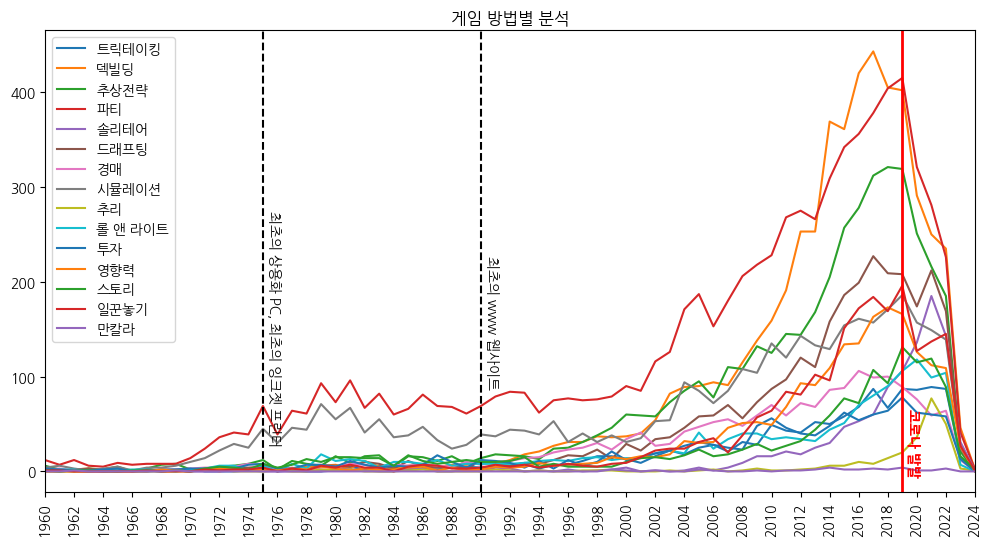

In [364]:
plt.figure(figsize=(12, 6))
plt.title('게임 방법별 분석')
plt.plot(mechanics_df, label = mechanics_df.columns)
plt.legend()
plt.xticks([2*i for i in range(560,1020)], rotation=90)
# plt.axvline(1794, color='black', linestyle = '--')
# plt.text(1794.3, 3, '프로이센의 보통법 (의무교육)', color = 'black', rotation = -90)
plt.axvline(1975, color='black', linestyle = '--')
plt.text(1975.3, 30, '최초의 상용화 PC, 최초의 잉크젯 프린터', color = 'black', rotation = -90)
plt.axvline(1990, color='black', linestyle = '--')
plt.text(1990.3, 90, '최초의 www 웹사이트', color = 'black', rotation = -90)
plt.axvline(2019, color='r', linewidth=2)
plt.text(2019.3, -3, '코로나 발발', color = 'red', weight = 'bold', rotation = -90)
plt.xlim([1960, 2024])
plt.show();

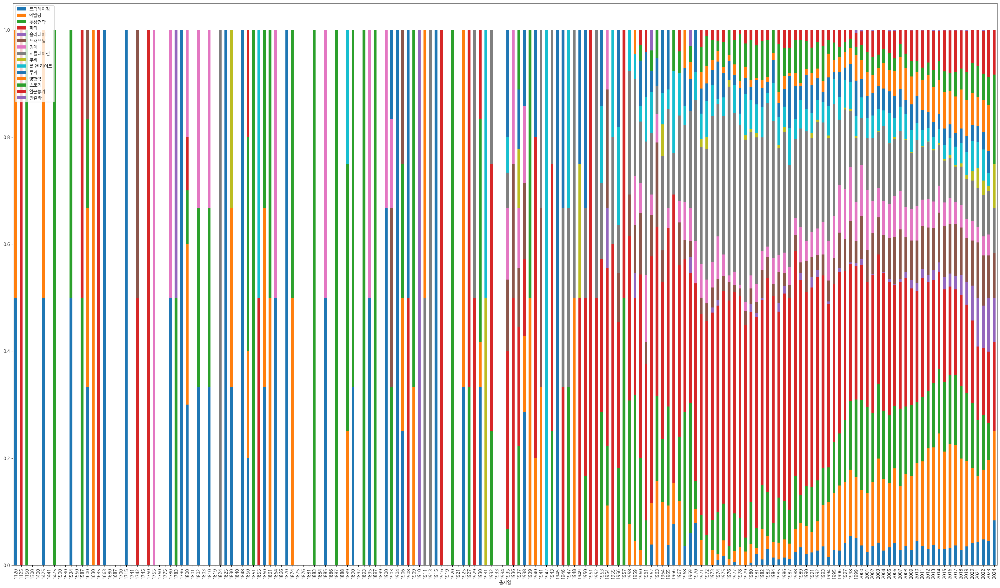

In [365]:
mechanics_frac_df.plot(kind='bar', stacked = True, figsize=(40, 23))
plt.legend()
# plt.xlim([1110, 2024])
plt.show();

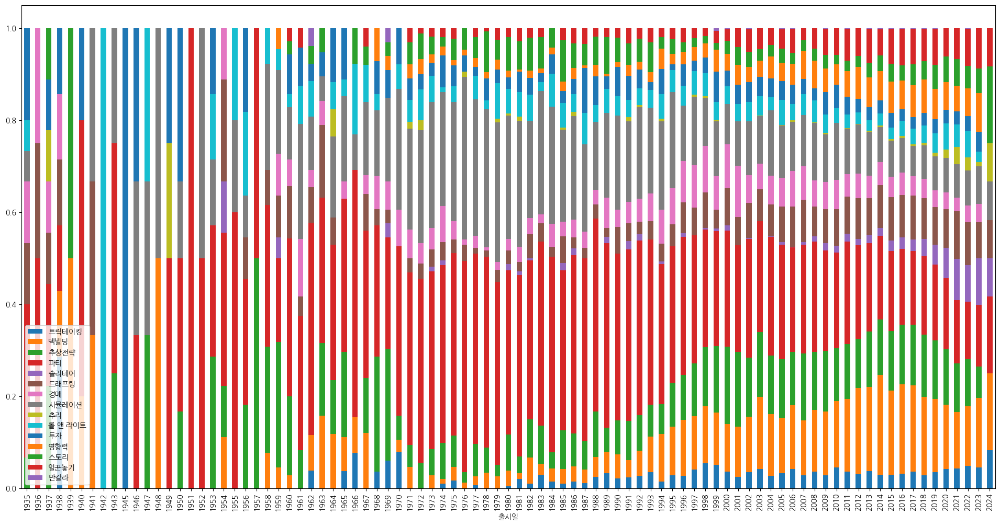

In [366]:
mechanics_frac_df[mechanics_frac_df.index>=1935].plot(kind='bar', stacked = True, figsize=(24, 12))
plt.legend()
plt.show();

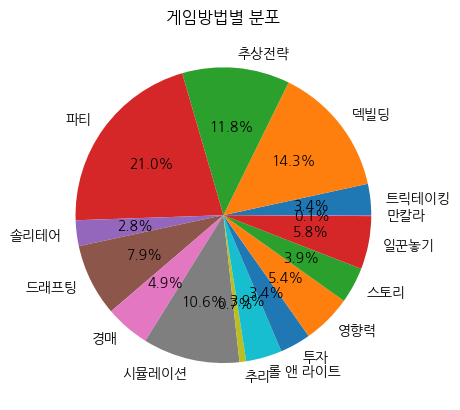

In [367]:
# 파이차트
plt.title("게임방법별 분포")
plt.pie(mechanics_df.sum(), labels=mechanics_df.columns, autopct='%.1f%%')
plt.show()

In [368]:
mechanics_df[mechanics_df == mechanics_df.max(axis=0)].drop_duplicates()[1:]

,트릭테이킹,덱빌딩,추상전략,파티,솔리테어,드래프팅,경매,시뮬레이션,추리,롤 앤 라이트,투자,영향력,스토리,일꾼놓기,만칼라
출시일,,,,,,,,,,,,,,,
2014,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0
2016,NaN,NaN,NaN,NaN,NaN,NaN,106.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017,NaN,443.0,NaN,NaN,NaN,227.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018,NaN,NaN,321.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,173.0,NaN,NaN,NaN
2019,NaN,NaN,NaN,415.0,NaN,NaN,NaN,186.0,NaN,NaN,78.0,NaN,131.0,196.0,4.0
2020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,118.0,NaN,NaN,NaN,NaN,NaN
2021,89.0,NaN,NaN,NaN,185.0,NaN,NaN,NaN,77.0,NaN,NaN,NaN,NaN,NaN,NaN


In [369]:
most_years = [2021, 2017, 2018, 2019, 2021, 2017, 2016, 2019, 2021, 2020, 2019, 2018, 2019, 2019, 2019]
most_list = []

for i in range(len(most_years)) :
    most_df = df_list[i][df_list[i]['출시일'] == most_years[i]].head(1)
    most_df['대표 종류'] = column_list[i]
    most_list.append(most_df)
    
pd.concat(most_list)

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수,대표 종류
3,Ark Nova,2021,8.291,8.57,62.99,4,1,4,90,150,3.710414,"End Game Bonuses, Hand Management, Hexagon Gri...","Animals, Economic, Environmental",12,NaN,1,전체
0,Gloomhaven,2017,8.441,8.67,105.98,1,1,4,60,120,3.888553,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",14,NaN,1,카드
801,Cerebria: The Inside World,2018,6.694,7.77,62.61,803,1,4,60,120,4.347639,"Action Points, Area Majority / Influence, Coop...",Fantasy,16,NaN,1,주사위
851,Babylonia,2019,6.661,7.68,49.99,853,2,4,60,60,2.378788,"Area Majority / Influence, Chaining, Hand Mana...","Abstract Strategy, Ancient",10,NaN,1,책
320,Destinies,2021,7.116,7.83,39.23,321,1,3,90,150,1.901639,"Dice Rolling, Map Addition, Role Playing, Solo...","Adventure, Exploration, Fantasy, Medieval, Min...",10,NaN,1,만화
10,Gaia Project,2017,8.155,8.43,82.01,11,1,4,60,150,4.386473,"End Game Bonuses, Hexagon Grid, Income, Modula...","Civilization, Economic, Miniatures, Science Fi...",14,NaN,1,추상전략
105,Inis,2016,7.524,7.82,69.99,106,2,4,60,90,2.884701,"Action Drafting, Area Majority / Influence, Ar...","Card Game, Exploration, Medieval, Miniatures, ...",12,NaN,1,아동
197,Dune,2019,7.305,7.99,48.56,198,2,6,120,180,3.985965,"Alliances, Area Majority / Influence, Area Mov...","Bluffing, Fighting, Negotiation, Novel-based, ...",14,NaN,1,동물
340,Oath: Chronicles of Empire and Exile,2021,7.103,7.87,84.32,341,1,6,45,150,4.071895,"Action Points, Area Majority / Influence, Area...","Fantasy, Negotiation, Political, Territory Bui...",14,NaN,1,블러핑
101,The Search for Planet X,2020,7.527,8.04,33.67,102,1,4,60,75,2.347826,"Action Points, Deduction, End Game Bonuses, So...","Deduction, Puzzle",12,NaN,1,종교


In [370]:
mechanics_df['이벤트'] = time_df['이벤트']

for i in range(1580, 1760) :
    add_event(mechanics_df, i, '근세')
for i in range(1760, 1900) :
    add_event(mechanics_df, i, '근대')
for i in range(1900, 2025) :
    add_event(mechanics_df, i, '현대')
    

mechanics_df.tail()

,트릭테이킹,덱빌딩,추상전략,파티,솔리테어,드래프팅,경매,시뮬레이션,추리,롤 앤 라이트,투자,영향력,스토리,일꾼놓기,만칼라,이벤트
출시일,,,,,,,,,,,,,,,,
2020,86,291,251,321,136,174,76,157,36,118,62,126,115,127,1,현대
2021,89,250,216,281,185,212,59,149,77,99,60,112,119,137,1,현대
2022,87,235,185,226,143,169,64,139,50,104,58,109,89,145,3,현대
2023,14,46,21,41,31,24,12,25,3,7,13,26,16,27,0,현대
2024,1,2,0,2,1,1,0,1,1,0,0,0,2,1,0,현대


In [371]:
mechanics_column_list = ['트릭테이킹', '덱빌딩', '추상전략', '파티', '솔리테어', '드래프팅', '경매', '시뮬레이션', '추리'
               , '롤 앤 라이트', '투자', '영향력', '스토리', '일꾼놓기', '만칼라']
bcr.bar_chart_race(df = mechanics_df[mechanics_column_list].fillna(0),
                   sort='desc',
                   # img_label_folder="bar_image_labels",
                   period_label={'x': .99, 'y': .25, 'ha': 'right', 'va': 'center'},
                   period_fmt = '{x:.0f}',
                   period_summary_func=lambda v, r: {'x': .99, 'y': .18,
                                      's': f'{mechanics_df.loc[int(r.name)]["이벤트"]}',
                                      'ha': 'right', 'size': 8},
                   fixed_max = True,
                   bar_kwargs={'alpha': .7},
                   steps_per_period = 4,
                   title = '매커니즘 분석')

## 정렬하기

In [372]:
boardgame_df = boardgame_df[boardgame_df['출시일']!=-1]
boardgame_df.sort_values('출시일', ascending=True)

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
15048,Tien Gow (Sky Nine),1120,5.523,7.19,NaN,15082,4,4,0,0,1.500000,"Betting and Bluffing, Hand Management, Trick-t...",Card Game,8,8.0,1
23505,Craps,1125,5.423,5.01,NaN,23549,1,16,20,60,1.804878,"Betting and Bluffing, Dice Rolling",Dice,10,NaN,1
23830,Checkers,1150,4.969,4.90,NaN,23875,2,2,30,30,1.738916,"Grid Movement, Pattern Movement, Square Grid, ...","Abstract Strategy, Comic Book / Strip",6,NaN,1
12675,Chu Shogi,1300,5.537,8.11,NaN,12703,2,2,120,120,4.250000,Grid Movement,Abstract Strategy,10,NaN,1
17952,Turkish Checkers,1400,5.509,6.14,NaN,17993,2,2,30,30,2.500000,NaN,NaN,0,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6351,Horseless Carriage,2023,5.645,8.05,NaN,6363,3,5,180,240,4.111111,"Modular Board, Turn Order: Stat-Based","Economic, Industry / Manufacturing",0,NaN,1
18392,Once Upon a Line,2024,5.507,5.82,NaN,18433,1,5,120,180,2.750000,"Cooperative Game, Deduction, Legacy Game, Narr...","Adventure, Card Game, Deduction, Exploration, ...",10,18.0,1
23586,Elden Ring: The Board Game,2024,5.404,3.63,NaN,23630,1,4,90,120,1.500000,"Cooperative Game, Deck Construction, Scenario ...","Adventure, Fantasy, Fighting, Miniatures, Vide...",2,4.0,1
14277,Warcrow Adventures,2024,5.527,9.09,NaN,14310,2,4,60,90,2.500000,"Action/Event, Cooperative Game, Dice Rolling, ...","Dice, Fantasy, Miniatures",12,NaN,1


## 묶어보기

In [373]:
boardgame_by_year = pd.DataFrame(boardgame_df.groupby('출시일').count()['종류'])
boardgame_by_year

,종류
출시일,
1120,1
1125,1
1150,1
1300,1
1400,1
...,...
2020,1029
2021,992
2022,812


# 보드게임 전체 통계

In [374]:
boardgame_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
0,Gloomhaven,2017,8.441,8.67,105.98,1,1,4,60,120,3.888553,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",14,NaN,1
1,Brass: Birmingham,2018,8.434,8.65,247.97,2,2,4,60,120,3.897451,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
2,Pandemic Legacy: Season 1,2015,8.411,8.57,68.21,3,2,4,60,60,2.832465,"Action Points, Cooperative Game, Hand Manageme...","Environmental, Medical",12,NaN,1
3,Ark Nova,2021,8.291,8.57,62.99,4,1,4,90,150,3.710414,"End Game Bonuses, Hand Management, Hexagon Gri...","Animals, Economic, Environmental",12,NaN,1
4,Twilight Imperium: Fourth Edition,2017,8.251,8.64,121.43,5,3,6,240,480,4.293668,"Action Drafting, Area Majority / Influence, Ar...","Civilization, Economic, Exploration, Negotiati...",14,NaN,1


## 연령분석

In [375]:
boardgame_df['개수'] = 1

In [376]:
zero_df = boardgame_df[boardgame_df['최소나이']<=0]
zero_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1998,Dice Throne: Season Two – Cursed Pirate v. Art...,2018,6.168,7.90,29.99,2003,2,2,20,40,2.666667,"Dice Rolling, Take That, Variable Player Powers","Card Game, Dice, Fantasy, Fighting",0,NaN,1
2128,Dice Throne: Season Two – Seraph v. Vampire Lord,2018,6.134,7.88,23.99,2133,2,2,20,40,2.125000,"Dice Rolling, Take That, Variable Player Powers","Card Game, Dice, Fantasy, Fighting",0,NaN,1
2370,That Time You Killed Me,2021,6.072,7.63,48.82,2375,2,2,15,30,2.571429,"Grid Movement, King of the Hill, Multiple Maps...","Abstract Strategy, Murder/Mystery",0,NaN,1
2412,Let's Make a Bus Route,2018,6.063,7.29,NaN,2417,2,5,20,30,1.956522,"Bingo, Line Drawing, Network and Route Buildin...",Transportation,0,NaN,1
2446,Tournament at Avalon,2020,6.055,7.42,24.99,2451,3,6,45,45,2.416667,"Take That, Trick-taking, Variable Player Powers","Card Game, Medieval",0,NaN,1


In [377]:
# 영유아
baby_df = boardgame_df[(boardgame_df['최소나이']<=5) & (boardgame_df['최소나이']>0)]
baby_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
438,PitchCar,1995,6.986,7.26,NaN,439,2,8,30,30,1.127854,"Flicking, Modular Board, Race","Action / Dexterity, Childrens Game, Party Game...",5,NaN,1
483,Zombie Kidz Evolution,2018,6.939,7.69,24.99,485,2,4,5,15,1.371681,"Area Movement, Cooperative Game, Dice Rolling,...","Childrens Game, Horror, Zombies",5,NaN,1
741,Rhino Hero: Super Battle,2017,6.733,7.26,34.99,743,2,4,10,20,1.114286,"Dice Rolling, Single Loser Game, Stacking and ...","Action / Dexterity, Animals, Childrens Game",5,NaN,1
838,Rhino Hero,2011,6.670,6.92,14.99,840,2,5,5,15,1.024390,"Hand Management, Lose a Turn, Score-and-Reset ...","Action / Dexterity, Animals, Childrens Game, P...",4,NaN,1
998,ICECOOL,2016,6.578,6.80,23.98,1000,2,4,30,30,1.038710,"Area Movement, Flicking, Take That","Action / Dexterity, Animals, Childrens Game",5,NaN,1


In [378]:
# 아동
child_df = boardgame_df[(boardgame_df['최소나이']<=12) & (boardgame_df['최소나이']>5)]
child_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
2,Pandemic Legacy: Season 1,2015,8.411,8.57,68.21,3,2,4,60,60,2.832465,"Action Points, Cooperative Game, Hand Manageme...","Environmental, Medical",12,NaN,1
3,Ark Nova,2021,8.291,8.57,62.99,4,1,4,90,150,3.710414,"End Game Bonuses, Hand Management, Hexagon Gri...","Animals, Economic, Environmental",12,NaN,1
5,Terraforming Mars,2016,8.246,8.39,56.98,6,1,5,120,120,3.255590,"Closed Drafting, Contracts, Enclosure, End Gam...","Economic, Environmental, Industry / Manufactur...",12,NaN,1
6,Gloomhaven: Jaws of the Lion,2020,8.235,8.55,34.99,7,1,4,30,120,3.622762,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",12,NaN,1
7,Star Wars: Rebellion,2016,8.166,8.42,95.52,8,2,4,180,240,3.735323,"Area Majority / Influence, Area Movement, Area...","Civil War, Miniatures, Movies / TV / Radio the...",12,NaN,1


In [379]:
# 청소년
teen_df = boardgame_df[(boardgame_df['최소나이']<=18) & (boardgame_df['최소나이']>12)]
teen_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
0,Gloomhaven,2017,8.441,8.67,105.98,1,1,4,60,120,3.888553,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",14,NaN,1
1,Brass: Birmingham,2018,8.434,8.65,247.97,2,2,4,60,120,3.897451,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
4,Twilight Imperium: Fourth Edition,2017,8.251,8.64,121.43,5,3,6,240,480,4.293668,"Action Drafting, Area Majority / Influence, Ar...","Civilization, Economic, Exploration, Negotiati...",14,NaN,1
8,War of the Ring: Second Edition,2011,8.164,8.53,72.00,9,2,4,150,180,4.195762,"Area Majority / Influence, Area Movement, Camp...","Adventure, Fantasy, Fighting, Novel-based, Ter...",14,NaN,1
9,Spirit Island,2017,8.160,8.37,71.99,10,1,4,90,120,4.055290,"Action Retrieval, Area Majority / Influence, A...","Fantasy, Fighting, Mythology, Territory Building",14,NaN,1


In [380]:
# 성인
adult_df = boardgame_df[boardgame_df['최소나이']>18]
adult_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
9044,The Book of Rituals,2021,5.576,7.41,NaN,9061,1,4,240,540,4.200000,"Cooperative Game, Deduction, Solo / Solitaire ...","Book, Puzzle",21,NaN,1
10357,War of the Suns: The War of Resistance 1937-1945,2013,5.557,7.07,NaN,10378,2,4,180,6000,4.500000,"Dice Rolling, Hexagon Grid","Wargame, World War II",21,NaN,1
10490,Stage II,1985,5.556,6.39,NaN,10511,2,2,90,90,1.909091,NaN,NaN,21,NaN,1
10720,Ladrillazo,2017,5.553,6.59,NaN,10741,1,6,60,90,2.000000,"Hand Management, Open Drafting, Player Elimina...","Card Game, Economic, Negotiation, Political",21,NaN,1
10788,Stampede,2020,5.552,7.02,NaN,10809,2,6,20,20,1.750000,"Hand Management, Memory, Set Collection","Animals, Card Game",21,NaN,1


In [381]:
boardgame_df['개수'] = 1
df_list = [zero_df, baby_df, child_df, teen_df, adult_df]

print(len(df_list))
column_list = ['나이제한 없음', '영유아', '아동', '청소년', '성인']
print(len(column_list))

age_df = pd.concat([df.groupby('출시일')['개수'].count() for df in df_list], axis = 1)
age_df = age_df.fillna(0)
age_df.columns = column_list
age_df = age_df.astype(int).sort_index()
age_df.to_csv("../data/age_df.csv")
age_df

5
5


,나이제한 없음,영유아,아동,청소년,성인
출시일,,,,,
1120,0,0,1,0,0
1125,0,0,1,0,0
1150,0,0,1,0,0
1300,0,0,1,0,0
1400,1,1,2,0,0
...,...,...,...,...,...
2020,263,58,644,119,1
2021,287,35,606,106,1
2022,288,11,456,94,2


In [382]:
age_df['전체'] = age_df.sum(axis=1)
age_frac_df = age_df / age_df['전체'].values.reshape(-1,1)
age_frac_df = age_frac_df.drop('전체', axis=1)
age_df = age_df.drop('전체', axis=1)
age_frac_df

,나이제한 없음,영유아,아동,청소년,성인
출시일,,,,,
1120,0.000000,0.000000,1.000000,0.000000,0.000000
1125,0.000000,0.000000,1.000000,0.000000,0.000000
1150,0.000000,0.000000,1.000000,0.000000,0.000000
1300,0.000000,0.000000,1.000000,0.000000,0.000000
1400,0.250000,0.250000,0.500000,0.000000,0.000000
...,...,...,...,...,...
2020,0.242396,0.053456,0.593548,0.109677,0.000922
2021,0.277295,0.033816,0.585507,0.102415,0.000966
2022,0.338425,0.012926,0.535840,0.110458,0.002350


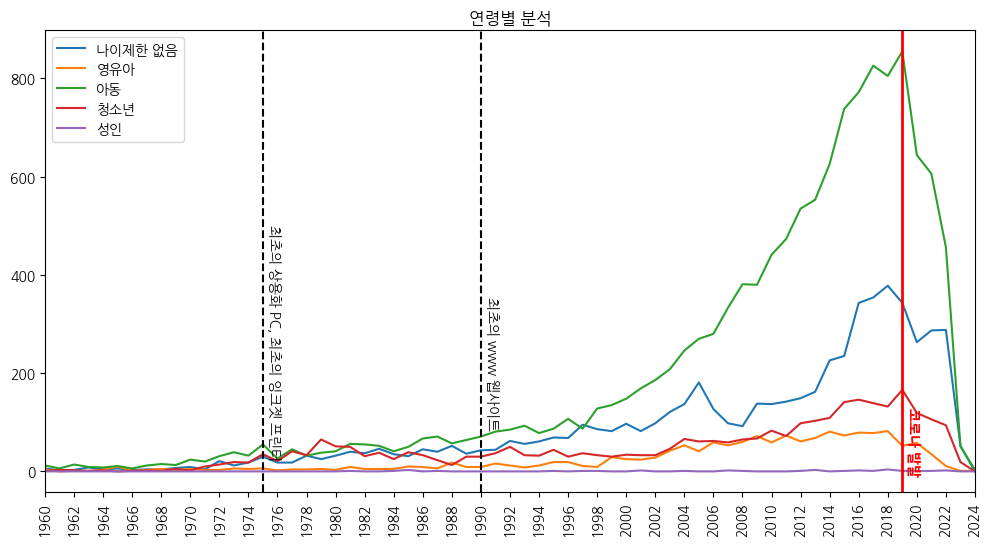

In [383]:
plt.figure(figsize=(12, 6))
plt.title('연령별 분석')
plt.plot(age_df, label = age_df.columns)
plt.legend()
plt.xticks([2*i for i in range(560,1020)], rotation=90)
# plt.axvline(1794, color='black', linestyle = '--')
# plt.text(1794.3, 3, '프로이센의 보통법 (의무교육)', color = 'black', rotation = -90)
plt.axvline(1975, color='black', linestyle = '--')
plt.text(1975.3, 30, '최초의 상용화 PC, 최초의 잉크젯 프린터', color = 'black', rotation = -90)
plt.axvline(1990, color='black', linestyle = '--')
plt.text(1990.3, 90, '최초의 www 웹사이트', color = 'black', rotation = -90)
plt.axvline(2019, color='r', linewidth=2)
plt.text(2019.3, -3, '코로나 발발', color = 'red', weight = 'bold', rotation = -90)
plt.xlim([1960, 2024])
plt.show();

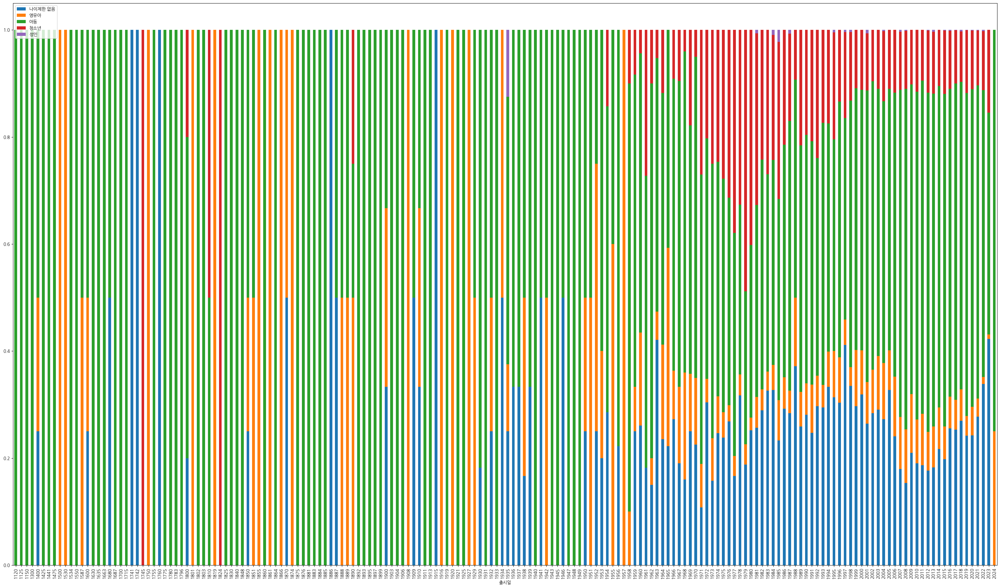

In [384]:
age_frac_df.plot(kind='bar', stacked = True, figsize=(40, 23))
plt.legend()
# plt.xlim([1110, 2024])
plt.show();

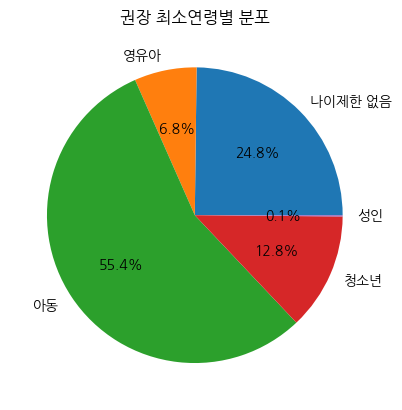

In [385]:
# 파이차트
plt.title("권장 최소연령별 분포")
plt.pie(age_df.sum(), labels=age_df.columns, autopct='%.1f%%')
plt.show()

In [386]:
age_df[age_df == age_df.max(axis=0)].drop_duplicates()[1:]

,나이제한 없음,영유아,아동,청소년,성인
출시일,,,,,
2018,378.0,82.0,NaN,NaN,4.0
2019,NaN,NaN,855.0,166.0,NaN


## 난이도 분석

In [387]:
zero2one_df = boardgame_df[(boardgame_df['난이도']<1) & (boardgame_df['난이도']>=0)]
zero2one_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
5769,Marvel Dice Throne: Black Widow v. Doctor Strange,2022,5.673,8.20,26.40,5781,2,2,0,0,0.0,Dice Rolling,"Card Game, Comic Book / Strip, Dice, Fighting",6,NaN,1
6340,Marvel Dice Throne: Captain Marvel v. Black Pa...,2022,5.646,8.07,NaN,6352,2,2,0,0,0.0,Dice Rolling,"Card Game, Comic Book / Strip, Dice, Fighting",0,NaN,1
7312,Funkoverse Strategy Game: Jaws 100,2020,5.613,7.59,21.48,7324,2,2,20,60,0.0,"Action Points, Dice Rolling, Grid Movement, Va...","Collectible Components, Fighting, Miniatures",0,NaN,1
7449,Animal Upon Animal: Christmas Edition,2020,5.609,7.28,NaN,7461,2,4,20,20,0.0,"Dice Rolling, Stacking and Balancing","Action / Dexterity, Animals, Childrens Game",0,NaN,1
7506,Unlock!: Timeless Adventures – Verloren im Zei...,2019,5.607,8.01,NaN,7519,1,6,45,60,0.0,"Cooperative Game, Storytelling","Card Game, Exploration, Puzzle, Real-time",0,NaN,1


In [388]:
one2two_df = boardgame_df[(boardgame_df['난이도']<2) & (boardgame_df['난이도']>=1)]
one2two_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
49,Cascadia,2021,7.745,8.00,39.49,50,1,4,30,45,1.837705,"End Game Bonuses, Hexagon Grid, Open Drafting,...","Animals, Puzzle",8,NaN,1
53,The Crew: The Quest for Planet Nine,2019,7.720,7.88,10.89,54,2,5,20,20,1.975291,"Communication Limits, Cooperative Game, Hand M...","Card Game, Science Fiction, Space Exploration",10,NaN,1
55,Crokinole,1876,7.715,7.99,165.00,56,2,4,30,30,1.239502,"Flicking, Team-Based Game",Action / Dexterity,6,NaN,1
61,The Quacks of Quedlinburg,2018,7.695,7.84,49.99,62,2,4,45,45,1.947589,"Catch the Leader, Deck Bag and Pool Building, ...",Medieval,8,NaN,1
68,Azul,2017,7.656,7.77,31.99,69,2,4,30,45,1.761232,"End Game Bonuses, Open Drafting, Pattern Build...","Abstract Strategy, Puzzle, Renaissance",8,NaN,1


In [389]:
two2three_df = boardgame_df[(boardgame_df['난이도']<3) & (boardgame_df['난이도']>=2)]
two2three_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
2,Pandemic Legacy: Season 1,2015,8.411,8.57,68.21,3,2,4,60,60,2.832465,"Action Points, Cooperative Game, Hand Manageme...","Environmental, Medical",12,NaN,1
16,The Castles of Burgundy,2011,8.005,8.13,39.45,17,2,4,30,90,2.993038,"Dice Rolling, End Game Bonuses, Grid Coverage,...","Dice, Medieval, Territory Building",12,NaN,1
18,7 Wonders Duel,2015,7.975,8.10,34.97,19,2,2,30,30,2.223710,"Layering, Open Drafting, Set Collection, Sudde...","Ancient, Card Game, City Building, Civilizatio...",10,NaN,1
24,Wingspan,2019,7.934,8.08,38.81,25,1,5,40,70,2.448806,"Contracts, Dice Rolling, End Game Bonuses, Han...","Animals, Card Game, Educational",10,NaN,1
25,Clank!: Legacy – Acquisitions Incorporated,2019,7.933,8.60,NaN,26,2,4,90,120,2.739130,"Deck Bag and Pool Building, Delayed Purchase, ...","Adventure, Fantasy, Miniatures",10,NaN,1


In [390]:
three2four_df = boardgame_df[(boardgame_df['난이도']<4) & (boardgame_df['난이도']>=3)]
three2four_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
0,Gloomhaven,2017,8.441,8.67,105.98,1,1,4,60,120,3.888553,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",14,NaN,1
1,Brass: Birmingham,2018,8.434,8.65,247.97,2,2,4,60,120,3.897451,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
3,Ark Nova,2021,8.291,8.57,62.99,4,1,4,90,150,3.710414,"End Game Bonuses, Hand Management, Hexagon Gri...","Animals, Economic, Environmental",12,NaN,1
5,Terraforming Mars,2016,8.246,8.39,56.98,6,1,5,120,120,3.255590,"Closed Drafting, Contracts, Enclosure, End Gam...","Economic, Environmental, Industry / Manufactur...",12,NaN,1
6,Gloomhaven: Jaws of the Lion,2020,8.235,8.55,34.99,7,1,4,30,120,3.622762,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",12,NaN,1


In [391]:
four2five_df = boardgame_df[(boardgame_df['난이도']<=5) & (boardgame_df['난이도']>=4)]
four2five_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
4,Twilight Imperium: Fourth Edition,2017,8.251,8.64,121.43,5,3,6,240,480,4.293668,"Action Drafting, Area Majority / Influence, Ar...","Civilization, Economic, Exploration, Negotiati...",14,NaN,1
8,War of the Ring: Second Edition,2011,8.164,8.53,72.00,9,2,4,150,180,4.195762,"Area Majority / Influence, Area Movement, Camp...","Adventure, Fantasy, Fighting, Novel-based, Ter...",14,NaN,1
9,Spirit Island,2017,8.160,8.37,71.99,10,1,4,90,120,4.055290,"Action Retrieval, Area Majority / Influence, A...","Fantasy, Fighting, Mythology, Territory Building",14,NaN,1
10,Gaia Project,2017,8.155,8.43,82.01,11,1,4,60,150,4.386473,"End Game Bonuses, Hexagon Grid, Income, Modula...","Civilization, Economic, Miniatures, Science Fi...",14,NaN,1
12,Through the Ages: A New Story of Civilization,2015,8.104,8.33,57.88,13,2,4,120,120,4.425939,"Action Points, Auction/Bidding, Auction: Dutch...","Card Game, Civilization, Economic",14,NaN,1


In [392]:
boardgame_df['개수'] = 1
df_list = [zero2one_df, one2two_df, two2three_df, three2four_df, four2five_df]

print(len(df_list))
column_list = ['0~1', '1~2', '2~3', '3~4', '4~5']
print(len(column_list))

weight_df = pd.concat([df.groupby('출시일')['개수'].count() for df in df_list], axis = 1)
weight_df = weight_df.fillna(0)
weight_df.columns = column_list
weight_df = weight_df.astype(int).sort_index()
weight_df.to_csv("../data/weight_df.csv")
weight_df

5
5


,0~1,1~2,2~3,3~4,4~5
출시일,,,,,
1120,0,1,0,0,0
1125,0,1,0,0,0
1150,0,1,0,0,0
1300,0,0,0,0,1
1400,0,3,1,0,0
...,...,...,...,...,...
2020,32,483,437,106,27
2021,30,455,398,136,16
2022,36,270,382,138,25


In [393]:
weight_df['전체'] = weight_df.sum(axis=1)
weight_frac_df = weight_df / weight_df['전체'].values.reshape(-1,1)
weight_frac_df = weight_frac_df.drop('전체', axis=1)
weight_df = weight_df.drop('전체', axis=1)
weight_frac_df

,0~1,1~2,2~3,3~4,4~5
출시일,,,,,
1120,0.000000,1.000000,0.000000,0.000000,0.000000
1125,0.000000,1.000000,0.000000,0.000000,0.000000
1150,0.000000,1.000000,0.000000,0.000000,0.000000
1300,0.000000,0.000000,0.000000,0.000000,1.000000
1400,0.000000,0.750000,0.250000,0.000000,0.000000
...,...,...,...,...,...
2020,0.029493,0.445161,0.402765,0.097696,0.024885
2021,0.028986,0.439614,0.384541,0.131401,0.015459
2022,0.042303,0.317274,0.448884,0.162162,0.029377


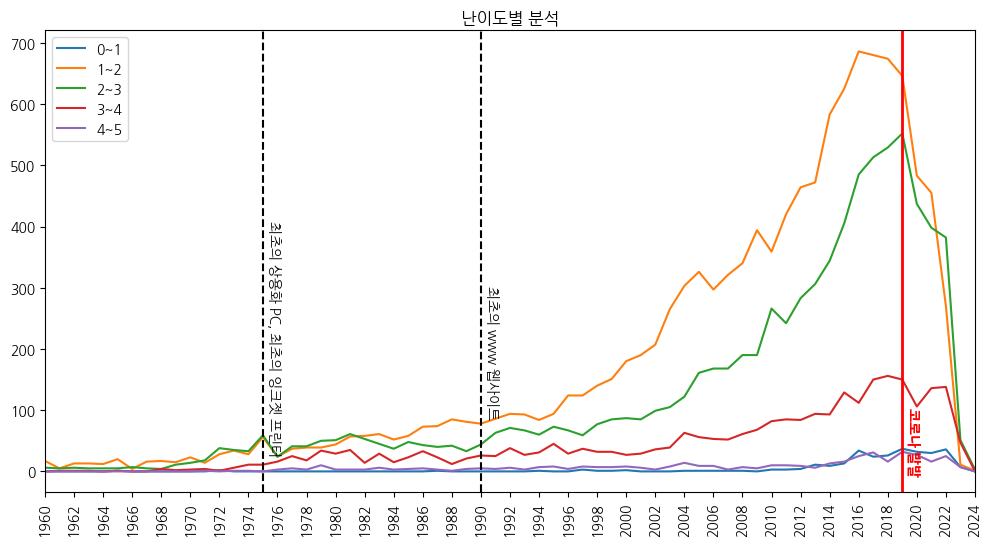

In [394]:
plt.figure(figsize=(12, 6))
plt.title('난이도별 분석')
plt.plot(weight_df, label = weight_df.columns)
plt.legend()
plt.xticks([2*i for i in range(560,1020)], rotation=90)
# plt.axvline(1794, color='black', linestyle = '--')
# plt.text(1794.3, 3, '프로이센의 보통법 (의무교육)', color = 'black', rotation = -90)
plt.axvline(1975, color='black', linestyle = '--')
plt.text(1975.3, 30, '최초의 상용화 PC, 최초의 잉크젯 프린터', color = 'black', rotation = -90)
plt.axvline(1990, color='black', linestyle = '--')
plt.text(1990.3, 90, '최초의 www 웹사이트', color = 'black', rotation = -90)
plt.axvline(2019, color='r', linewidth=2)
plt.text(2019.3, -3, '코로나 발발', color = 'red', weight = 'bold', rotation = -90)
plt.xlim([1960, 2024])
plt.show();

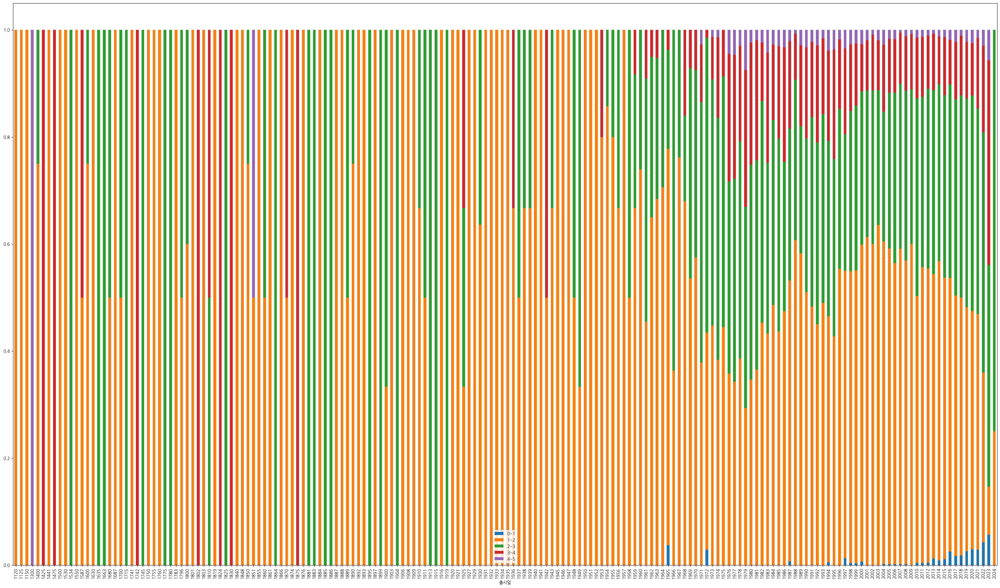

In [395]:
weight_frac_df.plot(kind='bar', stacked = True, figsize=(40, 23))
plt.legend()
# plt.xlim([1110, 2024])
plt.show();

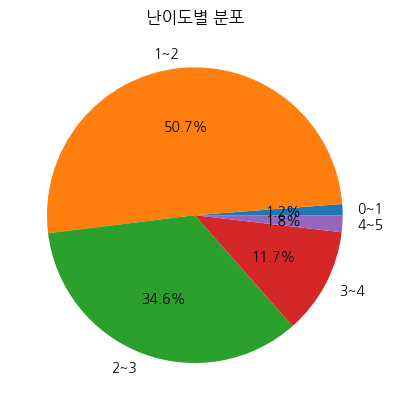

In [396]:
# 파이차트
plt.title("난이도별 분포")
plt.pie(weight_df.sum(), labels=weight_df.columns, autopct='%.1f%%')
plt.show()

In [397]:
weight_df[weight_df == weight_df.max(axis=0)].drop_duplicates()[1:]

,0~1,1~2,2~3,3~4,4~5
출시일,,,,,
2016,NaN,686.0,NaN,NaN,NaN
2018,NaN,NaN,NaN,156.0,NaN
2019,37.0,NaN,552.0,NaN,32.0


## 인원분석

In [398]:
p_one_df = boardgame_df[(boardgame_df['최소인원']==1)]
p_one_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
0,Gloomhaven,2017,8.441,8.67,105.98,1,1,4,60,120,3.888553,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",14,NaN,1
3,Ark Nova,2021,8.291,8.57,62.99,4,1,4,90,150,3.710414,"End Game Bonuses, Hand Management, Hexagon Gri...","Animals, Economic, Environmental",12,NaN,1
5,Terraforming Mars,2016,8.246,8.39,56.98,6,1,5,120,120,3.255590,"Closed Drafting, Contracts, Enclosure, End Gam...","Economic, Environmental, Industry / Manufactur...",12,NaN,1
6,Gloomhaven: Jaws of the Lion,2020,8.235,8.55,34.99,7,1,4,30,120,3.622762,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",12,NaN,1
9,Spirit Island,2017,8.160,8.37,71.99,10,1,4,90,120,4.055290,"Action Retrieval, Area Majority / Influence, A...","Fantasy, Fighting, Mythology, Territory Building",14,NaN,1


In [399]:
p_two_df = boardgame_df[(boardgame_df['최소인원']>1) & (boardgame_df['최소인원']<=2)]
p_two_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1,Brass: Birmingham,2018,8.434,8.65,247.97,2,2,4,60,120,3.897451,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
2,Pandemic Legacy: Season 1,2015,8.411,8.57,68.21,3,2,4,60,60,2.832465,"Action Points, Cooperative Game, Hand Manageme...","Environmental, Medical",12,NaN,1
7,Star Wars: Rebellion,2016,8.166,8.42,95.52,8,2,4,180,240,3.735323,"Area Majority / Influence, Area Movement, Area...","Civil War, Miniatures, Movies / TV / Radio the...",12,NaN,1
8,War of the Ring: Second Edition,2011,8.164,8.53,72.00,9,2,4,150,180,4.195762,"Area Majority / Influence, Area Movement, Camp...","Adventure, Fantasy, Fighting, Novel-based, Ter...",14,NaN,1
12,Through the Ages: A New Story of Civilization,2015,8.104,8.33,57.88,13,2,4,120,120,4.425939,"Action Points, Auction/Bidding, Auction: Dutch...","Card Game, Civilization, Economic",14,NaN,1


In [400]:
p_four_df = boardgame_df[(boardgame_df['최소인원']>2) & (boardgame_df['최소인원']<=4)]
p_four_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
4,Twilight Imperium: Fourth Edition,2017,8.251,8.64,121.43,5,3,6,240,480,4.293668,"Action Drafting, Area Majority / Influence, Ar...","Civilization, Economic, Exploration, Negotiati...",14,NaN,1
38,Puerto Rico,2002,7.807,7.94,126.43,39,3,5,90,150,3.273645,"Action Drafting, End Game Bonuses, Follow, Hid...","City Building, Economic, Farming",12,NaN,1
92,Battlestar Galactica: The Board Game,2008,7.550,7.73,NaN,93,3,6,120,180,3.248844,"Area Movement, Dice Rolling, Hand Management, ...","Bluffing, Deduction, Movies / TV / Radio theme...",14,NaN,1
98,Decrypto,2018,7.532,7.79,24.99,99,3,8,15,45,1.793443,"Communication Limits, Targeted Clues, Team-Bas...","Bluffing, Deduction, Party Game, Spies/Secret ...",10,NaN,1
103,Twilight Imperium: Third Edition,2005,7.525,7.81,178.95,104,3,6,180,240,4.255309,"Action Points, Area-Impulse, Dice Rolling, Fol...","Civilization, Negotiation, Political, Science ...",14,NaN,1


In [401]:
p_six_df = boardgame_df[(boardgame_df['최소인원']>4) & (boardgame_df['최소인원']<=6)]
p_six_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
169,The Resistance: Avalon,2012,7.356,7.54,19.99,170,5,10,30,30,1.756294,"Finale Ending, Hidden Roles, Roles with Asymme...","Bluffing, Card Game, Deduction, Fantasy, Medie...",12,NaN,1
217,Secret Hitler,2016,7.277,7.52,40.00,218,5,10,45,45,1.678815,"Hidden Roles, Player Elimination, Team-Based G...","Bluffing, Card Game, Deduction, Humor, Party G...",14,NaN,1
338,The Resistance,2009,7.104,7.24,20.67,339,5,10,30,30,1.598430,"Hidden Roles, Memory, Roles with Asymmetric In...","Bluffing, Card Game, Deduction, Negotiation, P...",12,NaN,1
563,Blood on the Clocktower,2022,6.873,8.31,NaN,565,5,20,30,120,3.027027,"Betting and Bluffing, Deduction, Hidden Roles,...","Horror, Murder/Mystery, Party Game",12,NaN,1
648,A Fake Artist Goes to New York,2011,6.789,7.16,32.89,650,5,10,20,20,1.137931,"Hidden Roles, Line Drawing, Targeted Clues","Bluffing, Deduction, Party Game",8,NaN,1


In [402]:
p_party_df = boardgame_df[(boardgame_df['최소인원']>6) | (boardgame_df['최소인원']<=0)]
p_party_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
1222,The Werewolves of Miller's Hollow,2001,6.459,6.71,NaN,1224,8,18,30,30,1.311350,"Hidden Roles, Player Elimination, Role Playing...","Bluffing, Deduction, Horror, Murder/Mystery, P...",10,NaN,1
2050,Werewolf,1986,6.155,6.49,NaN,2055,8,24,60,60,1.391775,"Hidden Roles, Negotiation, Player Elimination,...","Bluffing, Deduction, Horror, Murder/Mystery, N...",8,NaN,1
3205,The Werewolves of Miller's Hollow: The Village,2009,5.912,6.89,NaN,3212,8,18,30,30,1.714286,"Player Elimination, Role Playing, Team-Based G...","Bluffing, Deduction, Horror, Murder/Mystery, P...",10,NaN,1
3222,Decktet,2008,5.909,7.41,NaN,3229,0,0,30,30,2.000000,NaN,NaN,6,NaN,1
4160,Lupus in Tabula,2001,5.791,6.49,NaN,4169,8,24,20,40,1.196078,"Player Elimination, Role Playing, Team-Based G...","Bluffing, Deduction, Horror, Murder/Mystery, N...",8,NaN,1


In [403]:
boardgame_df['개수'] = 1
df_list = [p_one_df, p_two_df, p_four_df, p_six_df, p_party_df]

print(len(df_list))
column_list = ['1인', '2인', '3~4인', '5~6인', '7인 이상']
print(len(column_list))

player_df = pd.concat([df.groupby('출시일')['개수'].count() for df in df_list], axis = 1)
player_df = player_df.fillna(0)
player_df.columns = column_list
player_df = player_df.astype(int).sort_index()
player_df.to_csv("../data/player_df.csv")
player_df

5
5


,1인,2인,3~4인,5~6인,7인 이상
출시일,,,,,
1120,0,0,1,0,0
1125,1,0,0,0,0
1150,0,1,0,0,0
1300,0,1,0,0,0
1400,0,4,0,0,0
...,...,...,...,...,...
2020,402,572,108,2,1
2021,470,486,77,2,0
2022,400,400,49,2,0


In [404]:
player_df['전체'] = player_df.sum(axis=1)
player_frac_df = player_df / player_df['전체'].values.reshape(-1,1)
player_frac_df = player_frac_df.drop('전체', axis=1)
player_df = player_df.drop('전체', axis=1)
player_frac_df

,1인,2인,3~4인,5~6인,7인 이상
출시일,,,,,
1120,0.000000,0.000000,1.000000,0.000000,0.000000
1125,1.000000,0.000000,0.000000,0.000000,0.000000
1150,0.000000,1.000000,0.000000,0.000000,0.000000
1300,0.000000,1.000000,0.000000,0.000000,0.000000
1400,0.000000,1.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...
2020,0.370507,0.527189,0.099539,0.001843,0.000922
2021,0.454106,0.469565,0.074396,0.001932,0.000000
2022,0.470035,0.470035,0.057579,0.002350,0.000000


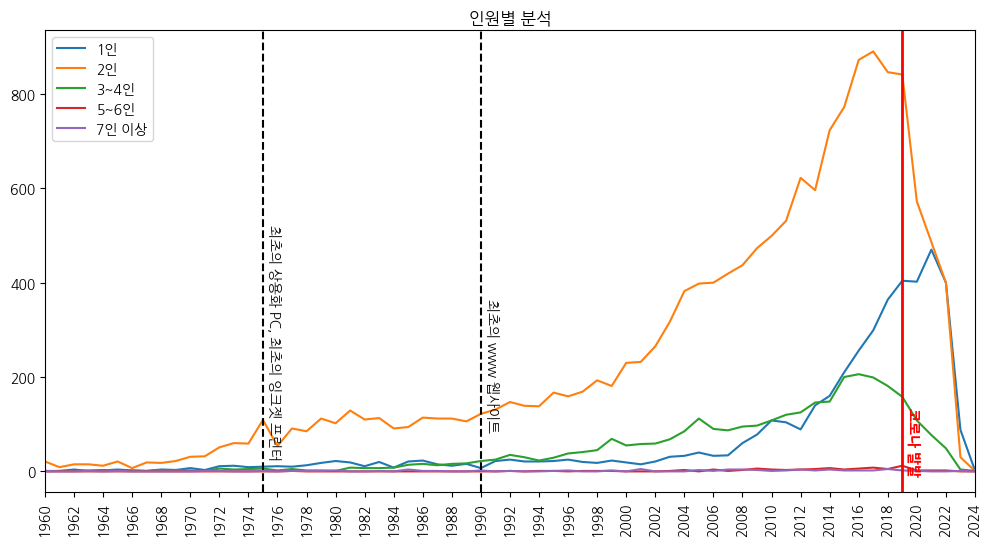

In [405]:
plt.figure(figsize=(12, 6))
plt.title('인원별 분석')
plt.plot(player_df, label = player_df.columns)
plt.legend()
plt.xticks([2*i for i in range(560,1020)], rotation=90)
plt.axvline(1990, color='black', linestyle = '--')
plt.text(1990.3, 90, '최초의 www 웹사이트', color = 'black', rotation = -90)
plt.axvline(1975, color='black', linestyle = '--')
plt.text(1975.3, 30, '최초의 상용화 PC, 최초의 잉크젯 프린터', color = 'black', rotation = -90)
plt.axvline(2019, color='r', linewidth=2)
plt.text(2019.3, -3, '코로나 발발', color = 'red', weight = 'bold', rotation = -90)
plt.xlim([1960, 2024])
plt.show();

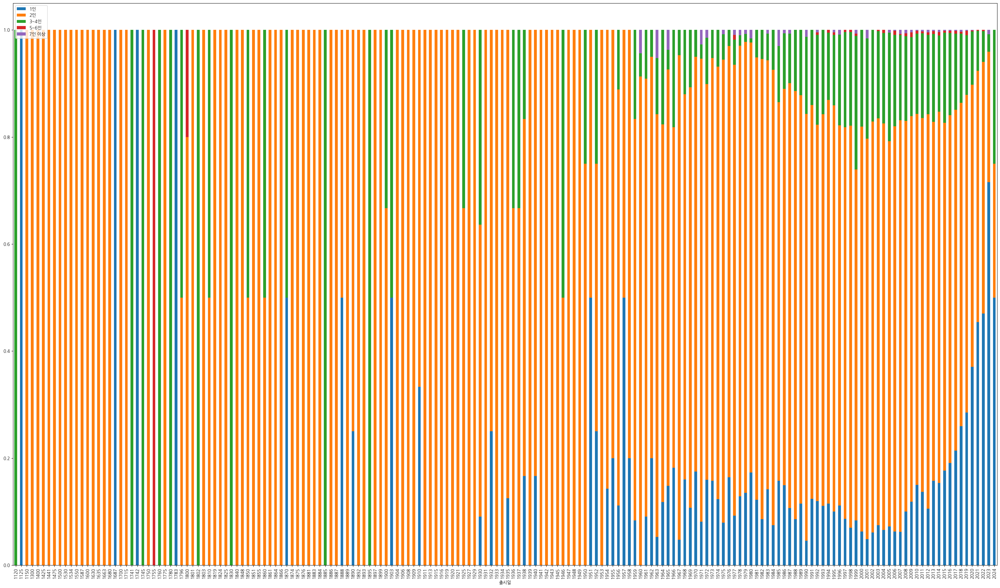

In [406]:
player_frac_df.plot(kind='bar', stacked = True, figsize=(40, 23))
plt.legend()
# plt.xlim([1110, 2024])
plt.show();

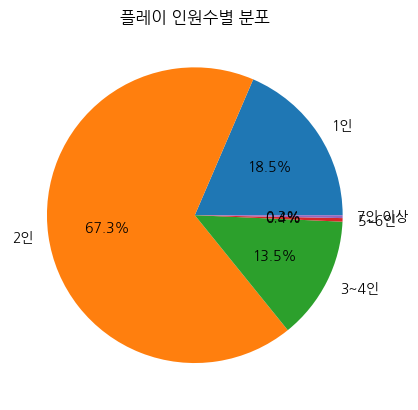

In [407]:
# 파이차트
plt.title("플레이 인원수별 분포")
plt.pie(player_df.sum(), labels=player_df.columns, autopct='%.1f%%')
plt.show()

In [408]:
player_df[player_df == player_df.max(axis=0)].drop_duplicates()[1:]

,1인,2인,3~4인,5~6인,7인 이상
출시일,,,,,
2001,NaN,NaN,NaN,NaN,5.0
2016,NaN,NaN,206.0,NaN,NaN
2017,NaN,890.0,NaN,NaN,NaN
2019,NaN,NaN,NaN,12.0,NaN
2021,470.0,NaN,NaN,NaN,NaN


## 플레이 시간 분석

In [409]:
tenmin_df = boardgame_df[(boardgame_df['최대게임시간']<=10)& (boardgame_df['최대게임시간']>0)]
tenmin_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
251,KLASK,2014,7.223,7.64,59.99,252,2,2,10,10,1.070513,"Real-Time, Score-and-Reset Game","Action / Dexterity, Real-time",6,NaN,1
516,One Night Ultimate Werewolf,2014,6.913,7.08,11.09,518,3,10,10,10,1.380880,"Hidden Roles, Role Playing, Roles with Asymmet...","Bluffing, Card Game, Deduction, Horror, Party ...",10,NaN,1
608,One Night Ultimate Werewolf: Daybreak,2015,6.827,7.33,23.52,610,3,7,10,10,1.396396,"Hidden Roles, Role Playing, Roles with Asymmet...","Bluffing, Card Game, Deduction, Horror, Party ...",8,NaN,1
641,Escape: The Curse of the Temple,2012,6.797,6.97,NaN,643,1,5,10,10,1.479592,"Cooperative Game, Dice Rolling, Elapsed Real T...","Action / Dexterity, Adventure, Dice, Electroni...",8,NaN,1
763,FUSE,2015,6.719,7.02,24.09,765,1,5,10,10,1.652174,"Cooperative Game, Dice Rolling, Elapsed Real T...","Action / Dexterity, Dice, Real-time, Science F...",8,NaN,1


In [410]:
half_df = boardgame_df[(boardgame_df['최대게임시간']>10) & (boardgame_df['최대게임시간']<=30)]
half_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
18,7 Wonders Duel,2015,7.975,8.10,34.97,19,2,2,30,30,2.223710,"Layering, Open Drafting, Set Collection, Sudde...","Ancient, Card Game, City Building, Civilizatio...",10,NaN,1
35,The Crew: Mission Deep Sea,2021,7.816,8.28,14.95,36,2,5,20,20,2.045977,"Communication Limits, Cooperative Game, Hand M...","Card Game, Nautical, Science Fiction",10,NaN,1
53,The Crew: The Quest for Planet Nine,2019,7.720,7.88,10.89,54,2,5,20,20,1.975291,"Communication Limits, Cooperative Game, Hand M...","Card Game, Science Fiction, Space Exploration",10,NaN,1
55,Crokinole,1876,7.715,7.99,165.00,56,2,4,30,30,1.239502,"Flicking, Team-Based Game",Action / Dexterity,6,NaN,1
83,7 Wonders,2010,7.602,7.71,59.98,84,2,7,30,30,2.321464,"Closed Drafting, Hand Management, Neighbor Sco...","Ancient, Card Game, City Building, Civilizatio...",10,NaN,1


In [411]:
one_df = boardgame_df[(boardgame_df['최대게임시간']>30) & (boardgame_df['최대게임시간']<=60)]
one_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
2,Pandemic Legacy: Season 1,2015,8.411,8.57,68.21,3,2,4,60,60,2.832465,"Action Points, Cooperative Game, Hand Manageme...","Environmental, Medical",12,NaN,1
46,Pandemic Legacy: Season 2,2017,7.748,8.06,53.82,47,2,4,60,60,3.256228,"Cooperative Game, Hand Management, Legacy Game...","Environmental, Exploration, Medical, Science F...",12,NaN,1
49,Cascadia,2021,7.745,8.00,39.49,50,1,4,30,45,1.837705,"End Game Bonuses, Hexagon Grid, Open Drafting,...","Animals, Puzzle",8,NaN,1
54,Pandemic Legacy: Season 0,2020,7.719,8.49,66.73,55,2,4,45,60,3.127119,"Action Points, Cooperative Game, Hand Manageme...",Spies/Secret Agents,12,NaN,1
61,The Quacks of Quedlinburg,2018,7.695,7.84,49.99,62,2,4,45,45,1.947589,"Catch the Leader, Deck Bag and Pool Building, ...",Medieval,8,NaN,1


In [412]:
two_df = boardgame_df[(boardgame_df['최대게임시간']>60) & (boardgame_df['최대게임시간']<=120)]
two_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
0,Gloomhaven,2017,8.441,8.67,105.98,1,1,4,60,120,3.888553,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",14,NaN,1
1,Brass: Birmingham,2018,8.434,8.65,247.97,2,2,4,60,120,3.897451,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
5,Terraforming Mars,2016,8.246,8.39,56.98,6,1,5,120,120,3.255590,"Closed Drafting, Contracts, Enclosure, End Gam...","Economic, Environmental, Industry / Manufactur...",12,NaN,1
6,Gloomhaven: Jaws of the Lion,2020,8.235,8.55,34.99,7,1,4,30,120,3.622762,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",12,NaN,1
9,Spirit Island,2017,8.160,8.37,71.99,10,1,4,90,120,4.055290,"Action Retrieval, Area Majority / Influence, A...","Fantasy, Fighting, Mythology, Territory Building",14,NaN,1


In [413]:
over_df = boardgame_df[(boardgame_df['최대게임시간']>120)]
over_df.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
3,Ark Nova,2021,8.291,8.57,62.99,4,1,4,90,150,3.710414,"End Game Bonuses, Hand Management, Hexagon Gri...","Animals, Economic, Environmental",12,NaN,1
4,Twilight Imperium: Fourth Edition,2017,8.251,8.64,121.43,5,3,6,240,480,4.293668,"Action Drafting, Area Majority / Influence, Ar...","Civilization, Economic, Exploration, Negotiati...",14,NaN,1
7,Star Wars: Rebellion,2016,8.166,8.42,95.52,8,2,4,180,240,3.735323,"Area Majority / Influence, Area Movement, Area...","Civil War, Miniatures, Movies / TV / Radio the...",12,NaN,1
8,War of the Ring: Second Edition,2011,8.164,8.53,72.00,9,2,4,150,180,4.195762,"Area Majority / Influence, Area Movement, Camp...","Adventure, Fantasy, Fighting, Novel-based, Ter...",14,NaN,1
10,Gaia Project,2017,8.155,8.43,82.01,11,1,4,60,150,4.386473,"End Game Bonuses, Hexagon Grid, Income, Modula...","Civilization, Economic, Miniatures, Science Fi...",14,NaN,1


In [414]:
boardgame_df['개수'] = 1
df_list = [tenmin_df, half_df, one_df, two_df, over_df]

print(len(df_list))
column_list = ['0~10분', '11~30분', '31분~1시간', '1시간~2시간', '그 이상']
print(len(column_list))

p_time_df = pd.concat([df.groupby('출시일')['개수'].count() for df in df_list], axis = 1)
p_time_df = p_time_df.fillna(0)
p_time_df.columns = column_list
p_time_df = p_time_df.astype(int).sort_index()
p_time_df.to_csv("../data/p_time_df.csv")
p_time_df

5
5


,0~10분,11~30분,31분~1시간,1시간~2시간,그 이상
출시일,,,,,
1125,0,0,1,0,0
1150,0,1,0,0,0
1300,0,0,0,1,0
1400,0,4,0,0,0
1425,0,1,0,0,0
...,...,...,...,...,...
2020,34,373,338,203,102
2021,25,341,308,211,118
2022,14,250,278,201,85


In [415]:
p_time_df['전체'] = p_time_df.sum(axis=1)
p_time_frac_df = p_time_df / p_time_df['전체'].values.reshape(-1,1)
p_time_frac_df = p_time_frac_df.drop('전체', axis=1)
p_time_df = p_time_df.drop('전체', axis=1)
p_time_frac_df

,0~10분,11~30분,31분~1시간,1시간~2시간,그 이상
출시일,,,,,
1125,0.000000,0.000000,1.000000,0.000000,0.000000
1150,0.000000,1.000000,0.000000,0.000000,0.000000
1300,0.000000,0.000000,0.000000,1.000000,0.000000
1400,0.000000,1.000000,0.000000,0.000000,0.000000
1425,0.000000,1.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...
2020,0.032381,0.355238,0.321905,0.193333,0.097143
2021,0.024925,0.339980,0.307079,0.210369,0.117647
2022,0.016908,0.301932,0.335749,0.242754,0.102657


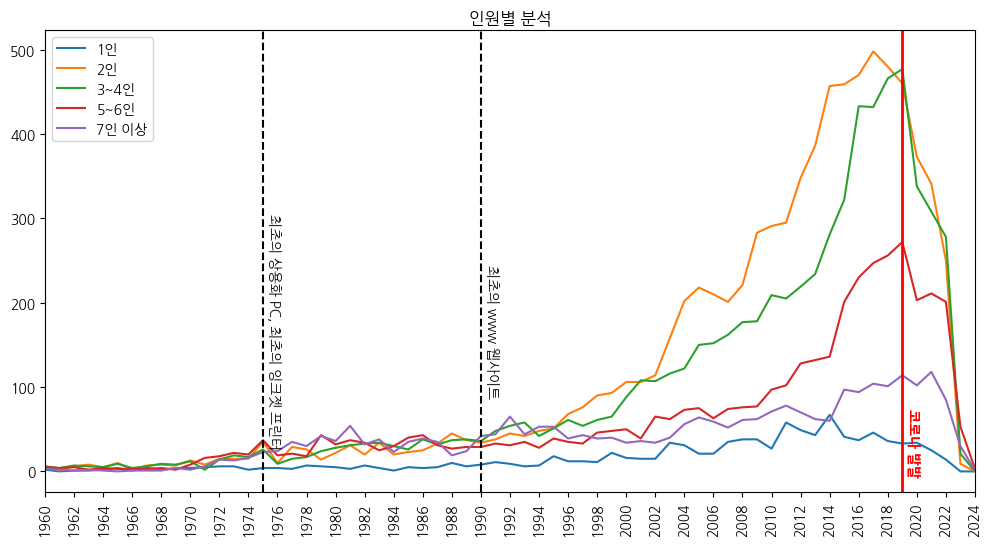

In [416]:
plt.figure(figsize=(12, 6))
plt.title('인원별 분석')
plt.plot(p_time_df, label = player_df.columns)
plt.legend()
plt.xticks([2*i for i in range(560,1020)], rotation=90)
plt.axvline(1990, color='black', linestyle = '--')
plt.text(1990.3, 90, '최초의 www 웹사이트', color = 'black', rotation = -90)
plt.axvline(1975, color='black', linestyle = '--')
plt.text(1975.3, 30, '최초의 상용화 PC, 최초의 잉크젯 프린터', color = 'black', rotation = -90)
plt.axvline(2019, color='r', linewidth=2)
plt.text(2019.3, -3, '코로나 발발', color = 'red', weight = 'bold', rotation = -90)
plt.xlim([1960, 2024])
plt.show();

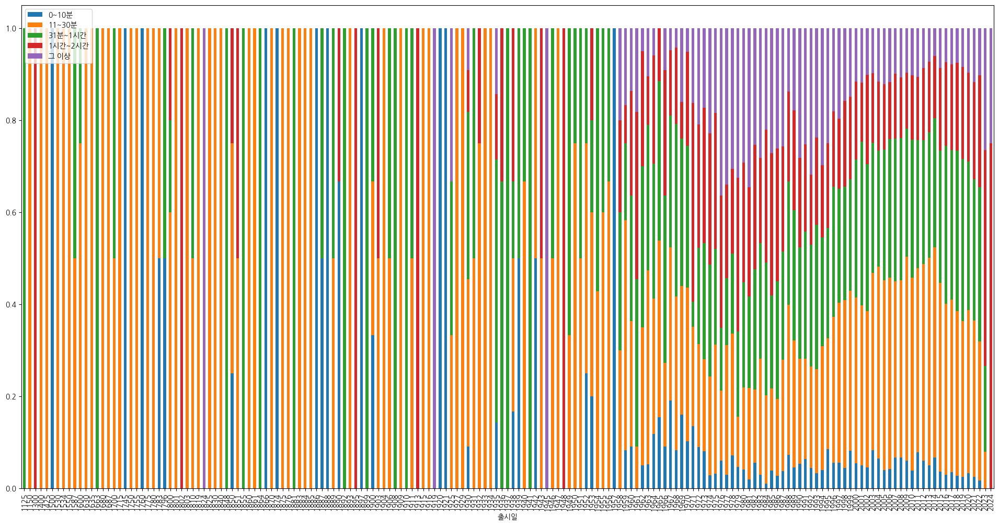

In [417]:
p_time_frac_df.plot(kind='bar', stacked = True, figsize=(24, 12))
plt.legend()
# plt.xlim([1110, 2024])
plt.show();

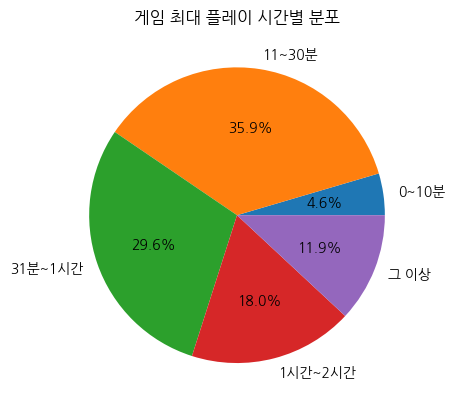

In [418]:
# 파이차트
plt.title("게임 최대 플레이 시간별 분포")
plt.pie(p_time_df.sum(), labels=p_time_df.columns, autopct='%.1f%%')
plt.show()

In [419]:
p_time_df[p_time_df == p_time_df.max(axis=0)].drop_duplicates()[1:]

,0~10분,11~30분,31분~1시간,1시간~2시간,그 이상
출시일,,,,,
2014,67.0,NaN,NaN,NaN,NaN
2017,NaN,498.0,NaN,NaN,NaN
2019,NaN,NaN,477.0,272.0,NaN
2021,NaN,NaN,NaN,NaN,118.0


## 평균 분석

### 플레이 시간 분석

In [420]:
boardgame_df.mean()['최대게임시간']

93.9893788083954

In [421]:
boardgame_df.max()['최대게임시간']

84000

In [422]:
boardgame_df[boardgame_df['최대게임시간'] == boardgame_df.max()['최대게임시간']]

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
23436,The Eagle and the Sun,1991,5.434,3.67,NaN,23480,2,2,120,84000,4.8,"Chit-Pull System, Dice Rolling, Grid Movement,...","Aviation / Flight, Nautical, Wargame, World Wa...",16,NaN,1


### 플레이 인원 분석

In [423]:
boardgame_df.mean()['최소인원']

1.9906482735274205

In [424]:
boardgame_df.max()['최소인원']

10

In [425]:
boardgame_df[boardgame_df['최소인원'] == boardgame_df.max()['최소인원']]

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
13799,Haggle,1963,5.530,6.68,NaN,13829,10,100,120,300,2.100000,"Hand Management, Induction, Set Collection, Tr...","Math, Negotiation, Puzzle",0,NaN,1
18860,Speakeasy,2015,5.505,6.44,NaN,18901,10,30,75,75,2.333333,"Acting, Betting and Bluffing, Deduction, Memor...","Mafia, Murder/Mystery, Party Game, Print & Pla...",0,NaN,1


## 가격분석

In [426]:
boardgame_df.mean()['가격']

55.02163356504469

In [427]:
boardgame_df.max()['가격']

3999.0

In [428]:
boardgame_df[boardgame_df['가격'] == boardgame_df.max()['가격']]

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
9420,The Hunt for Red October,1988,5.57,6.0,3999.0,9440,2,2,60,60,2.490196,"Area Movement, Area-Impulse, Dice Rolling, Sec...","Modern Warfare, Nautical, Novel-based, Wargame",12,NaN,1


### 종류별 분석

In [429]:
miniatures_df.mean()['가격']

94.52693877551022

In [430]:
collectible_df.mean()['가격']

47.95522388059702

In [431]:
educational_df.mean()['가격']

46.71972972972973

In [432]:
childrens_game_df.mean()['가격']

32.73462025316456

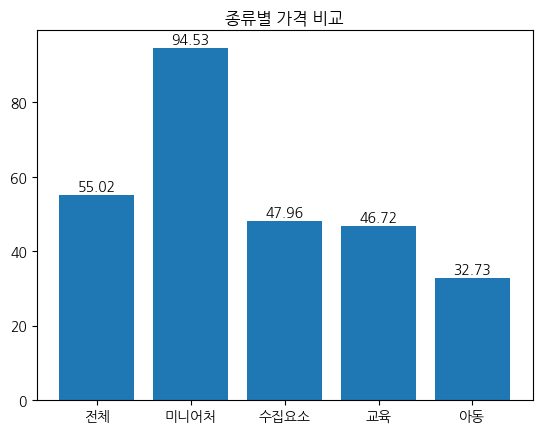

In [433]:
categories = ['전체', '미니어처', '수집요소', '교육', '아동']
x = np.arange(len(categories))
values = [ boardgame_df.mean()['가격'], miniatures_df.mean()['가격'], collectible_df.mean()['가격'], educational_df.mean()['가격'], childrens_game_df.mean()['가격'] ]

plt.title('종류별 가격 비교')
bar = plt.bar(x, values)
plt.xticks(x, categories)

for rect in bar:
    height = rect.get_height()
    plt.text(rect.get_x()+rect.get_width()/2.0, height+0.5,  round(height, 2), ha = 'center',va='bottom',size=10)


plt.show()

### 연령별 분석

In [434]:
zero_df.mean()['가격']

38.161769230769224

In [435]:
baby_df.mean()['가격']

34.1406936416185

In [436]:
child_df.mean()['가격']

53.96284098469728

In [437]:
teen_df.mean()['가격']

84.29349344978168

In [438]:
adult_df.mean()['가격']

18.99

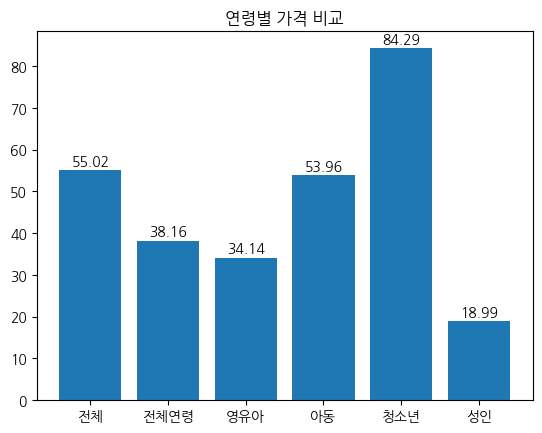

In [439]:
ages = ['전체', '전체연령', '영유아', '아동', '청소년', '성인']
x = np.arange(len(ages))
values = [ boardgame_df.mean()['가격'], zero_df.mean()['가격'], baby_df.mean()['가격'], child_df.mean()['가격'], teen_df.mean()['가격'], adult_df.mean()['가격'] ]

plt.title('연령별 가격 비교')
bar = plt.bar(x, values)
plt.xticks(x, ages)

for rect in bar:
    height = rect.get_height()
    plt.text(rect.get_x()+rect.get_width()/2.0, height+0.5,  round(height, 2), ha = 'center',va='bottom',size=10)


plt.show()

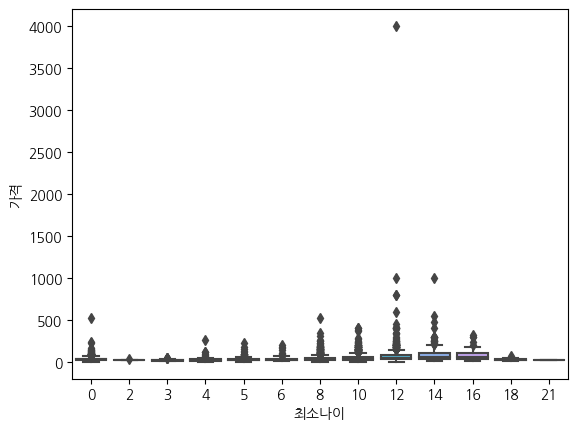

In [440]:
ax = sns.boxplot(data=boardgame_df, x='최소나이', y='가격')
plt.show();

### 난이도별 분석

In [441]:
zero2one_df.mean()['가격']

31.784

In [442]:
one2two_df.mean()['가격']

35.17324355971897

In [443]:
two2three_df.mean()['가격']

60.993517739025854

In [444]:
three2four_df.mean()['가격']

87.37878402903813

In [445]:
four2five_df.mean()['가격']

126.33571428571427

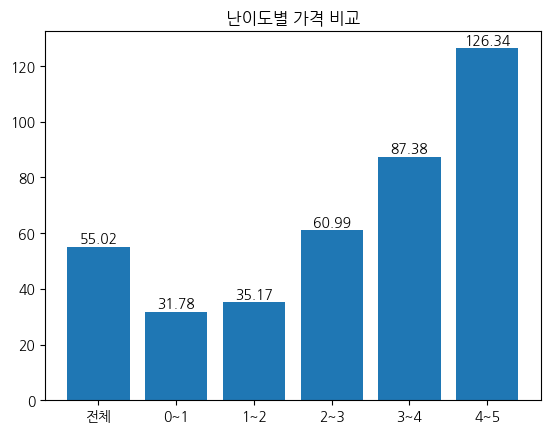

In [446]:
weights = ['전체', '0~1', '1~2', '2~3', '3~4', '4~5']
x = np.arange(len(weights))
values = [ boardgame_df.mean()['가격'], zero2one_df.mean()['가격'], one2two_df.mean()['가격'], two2three_df.mean()['가격'], three2four_df.mean()['가격'], four2five_df.mean()['가격'] ]

plt.title('난이도별 가격 비교')
bar = plt.bar(x, values)
plt.xticks(x, weights)

for rect in bar:
    height = rect.get_height()
    plt.text(rect.get_x()+rect.get_width()/2.0, height+0.5,  round(height, 2), ha = 'center',va='bottom',size=10)


plt.show()

### 인원별 분석

In [447]:
p_one_df.mean()['가격']

61.344605543710024

In [448]:
p_two_df.mean()['가격']

54.15465737051793

In [449]:
p_four_df.mean()['가격']

47.32777183600714

In [450]:
p_six_df.mean()['가격']

88.735625

In [451]:
p_party_df.mean()['가격']

62.35333333333333

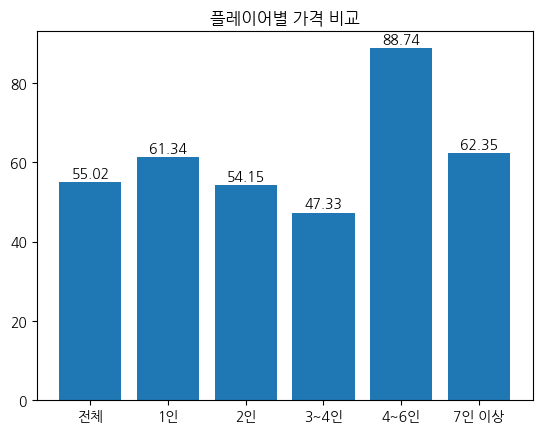

In [452]:
players = ['전체', '1인', '2인', '3~4인', '4~6인', '7인 이상']
x = np.arange(len(players))
values = [ boardgame_df.mean()['가격'], p_one_df.mean()['가격'], p_two_df.mean()['가격'], p_four_df.mean()['가격'], p_six_df.mean()['가격'], p_party_df.mean()['가격'] ]

plt.title('플레이어별 가격 비교')
bar = plt.bar(x, values)
plt.xticks(x, players)

for rect in bar:
    height = rect.get_height()
    plt.text(rect.get_x()+rect.get_width()/2.0, height+0.5,  round(height, 2), ha = 'center',va='bottom',size=10)


plt.show()

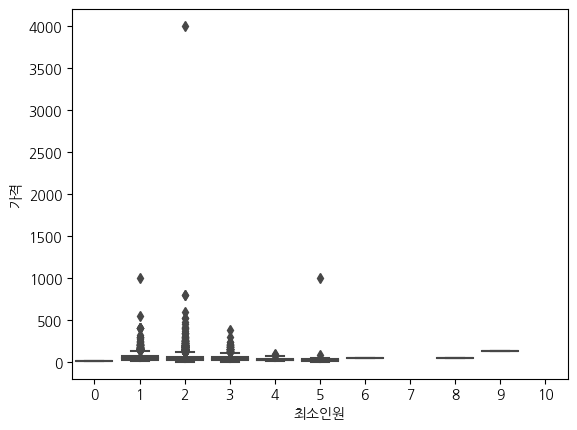

In [453]:
ax = sns.boxplot(data=boardgame_df, x='최소인원', y='가격')
plt.show();

### 플레이시간 분석

In [454]:
tenmin_df.mean()['가격']

23.110444444444447

In [455]:
half_df.mean()['가격']

32.88976569821931

In [456]:
one_df.mean()['가격']

51.51019566736548

In [457]:
two_df.mean()['가격']

69.97855

In [458]:
over_df.mean()['가격']

101.31932795698926

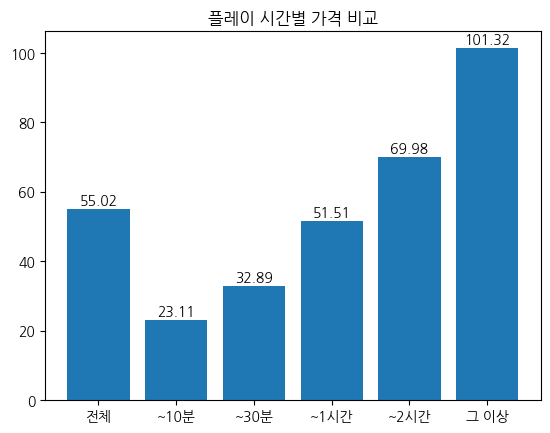

In [459]:
players = ['전체', '~10분', '~30분', '~1시간', '~2시간', '그 이상']
x = np.arange(len(players))
values = [ boardgame_df.mean()['가격'], tenmin_df.mean()['가격'], half_df.mean()['가격'], one_df.mean()['가격'], two_df.mean()['가격'], over_df.mean()['가격'] ]

plt.title('플레이 시간별 가격 비교')
bar = plt.bar(x, values)
plt.xticks(x, players)

for rect in bar:
    height = rect.get_height()
    plt.text(rect.get_x()+rect.get_width()/2.0, height+0.5,  round(height, 2), ha = 'center',va='bottom',size=10)


plt.show()

## 보드게임 연표
https://news.mt.co.kr/mtview.php?no=2013122416355033725

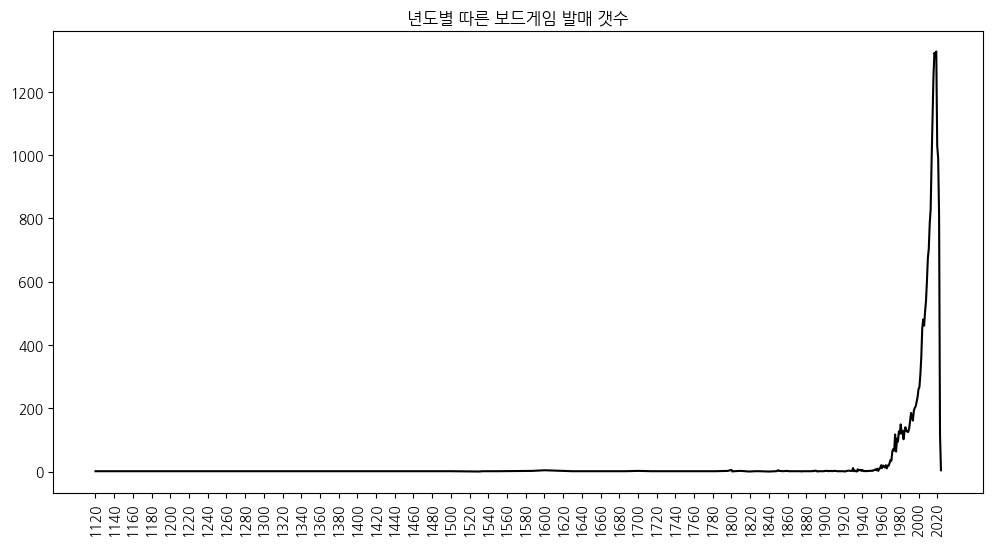

In [460]:
plt.figure(figsize=(12, 6))
plt.title('년도별 따른 보드게임 발매 갯수')
plt.plot(boardgame_by_year, color='black')
plt.xticks([20*i for i in range(56,102)], rotation=90)
plt.show();

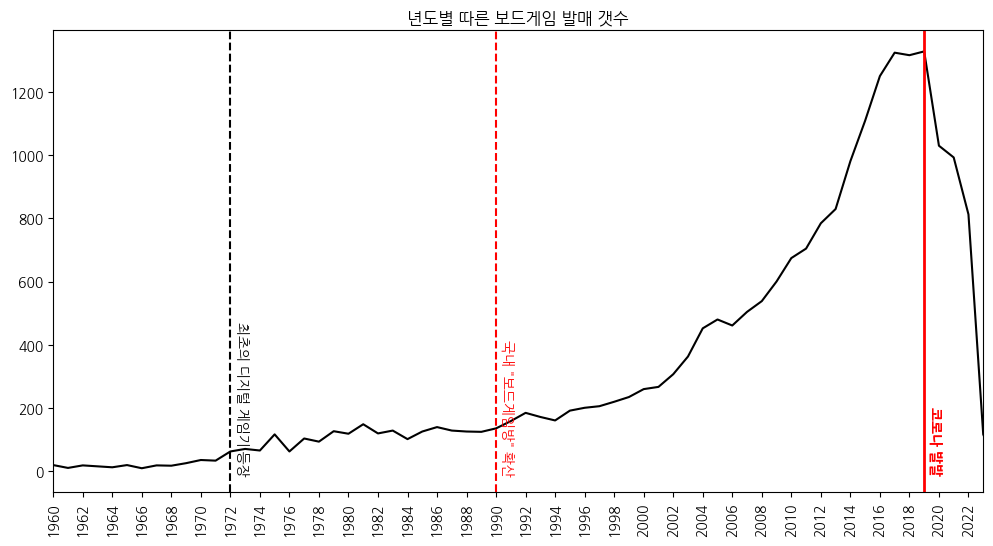

In [461]:
plt.figure(figsize=(12, 6))
plt.title('년도별 따른 보드게임 발매 갯수')
plt.plot(boardgame_by_year, color='black')
plt.xticks([2*i for i in range(560,1020)], rotation=90)
plt.axvline(1972, color='black', linestyle = '--')
plt.text(1972.3, -3, '최초의 디지털 게임기 등장', color = 'black', rotation = -90)
plt.axvline(1990, color='r', linestyle = '--')
plt.text(1990.3, -3, '국내 "보드게임방" 확산', color = 'red', rotation = -90)
plt.axvline(2019, color='r', linewidth=2)
plt.text(2019.3, -3, '코로나 발발', color = 'red', weight = 'bold', rotation = -90)
plt.xlim([1960, 2023])
plt.show();

## 해당하는지 확인

In [462]:
def isChildren(categories) :
    try :
        if 'Childrens Game' in categories.split(', ') :
            return True
        else :
            return False
    except :
        return False
    
children_boardgames = boardgame_df[boardgame_df['종류'].apply(isChildren)]
children_boardgames.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
438,PitchCar,1995,6.986,7.26,NaN,439,2,8,30,30,1.127854,"Flicking, Modular Board, Race","Action / Dexterity, Childrens Game, Party Game...",5,NaN,1
483,Zombie Kidz Evolution,2018,6.939,7.69,24.99,485,2,4,5,15,1.371681,"Area Movement, Cooperative Game, Dice Rolling,...","Childrens Game, Horror, Zombies",5,NaN,1
683,My Little Scythe,2017,6.768,7.28,48.88,685,1,6,45,60,2.000000,"Area Majority / Influence, Dice Rolling, Force...","Childrens Game, Exploration, Fantasy",6,NaN,1
741,Rhino Hero: Super Battle,2017,6.733,7.26,34.99,743,2,4,10,20,1.114286,"Dice Rolling, Single Loser Game, Stacking and ...","Action / Dexterity, Animals, Childrens Game",5,NaN,1
768,Perudo,1800,6.716,6.91,26.60,770,2,6,15,30,1.260638,"Betting and Bluffing, Dice Rolling, Player Eli...","Childrens Game, Movies / TV / Radio theme, Par...",8,NaN,1


In [463]:
pd.DataFrame(children_boardgames.mean(axis=0))

,0
출시일,2003.399261
geek평점,5.542917
평균평점,5.762822
가격,32.734620
랭크,16237.810228
최소인원,1.963648
최대인원,5.532348
최소게임시간,20.009858
최대게임시간,22.711645
난이도,1.176470


In [464]:
not_children_boardgames = boardgame_df[~boardgame_df['종류'].apply(isChildren)]
not_children_boardgames.head()

,이름,출시일,geek평점,평균평점,가격,랭크,최소인원,최대인원,최소게임시간,최대게임시간,난이도,진행방식,종류,최소나이,최대나이,개수
0,Gloomhaven,2017,8.441,8.67,105.98,1,1,4,60,120,3.888553,"Action Queue, Action Retrieval, Campaign / Bat...","Adventure, Exploration, Fantasy, Fighting, Min...",14,NaN,1
1,Brass: Birmingham,2018,8.434,8.65,247.97,2,2,4,60,120,3.897451,"Hand Management, Income, Loans, Market, Networ...","Economic, Industry / Manufacturing, Post-Napol...",14,NaN,1
2,Pandemic Legacy: Season 1,2015,8.411,8.57,68.21,3,2,4,60,60,2.832465,"Action Points, Cooperative Game, Hand Manageme...","Environmental, Medical",12,NaN,1
3,Ark Nova,2021,8.291,8.57,62.99,4,1,4,90,150,3.710414,"End Game Bonuses, Hand Management, Hexagon Gri...","Animals, Economic, Environmental",12,NaN,1
4,Twilight Imperium: Fourth Edition,2017,8.251,8.64,121.43,5,3,6,240,480,4.293668,"Action Drafting, Area Majority / Influence, Ar...","Civilization, Economic, Exploration, Negotiati...",14,NaN,1


In [465]:
pd.DataFrame(not_children_boardgames.mean(axis=0))

,0
출시일,2007.157708
geek평점,5.689217
평균평점,6.486952
가격,55.931543
랭크,11589.128675
최소인원,1.992639
최대인원,5.786224
최소게임시간,65.025172
최대게임시간,99.245581
난이도,2.027808
